In [53]:
import gurobipy as gp
from gurobipy import GRB
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd

In [2]:
def make_envy_graph(valu):
    envyG = np.zeros(valu.shape)
    for i in range (valu.shape[0]):
        own_val = valu[i][i]
        for j in range (valu.shape[0]):
            if own_val<valu[i][j] :
                envyG[i][j]=1
                
    return envyG

In [3]:
def is_cyclic_util(graph, visited, rec_stack, v, path, cycles):
    visited[v] = True
    rec_stack[v] = True
    path.append(v)
    
    for neighbor in range(len(graph)):
        if graph[v][neighbor] == 1:
            if not visited[neighbor]:
                if is_cyclic_util(graph, visited, rec_stack, neighbor, path, cycles):
                    return True
            elif rec_stack[neighbor]:
                index = path.index(neighbor)
                cycle = path[index:]
                cycle.append(neighbor)
                cycles.append(cycle)
    
    rec_stack[v] = False
    path.pop()
    return False

In [4]:
def envy_cycle(graph):
    num_vertices = len(graph)
    visited = [False] * num_vertices
    rec_stack = [False] * num_vertices
    cycles = []
    
    for node in range(num_vertices):
        if not visited[node]:
            is_cyclic_util(graph, visited, rec_stack, node, [], cycles)
            
    return cycles

In [5]:
def envy_cycle_elimination(assign, cycle):

    new_X = assign.copy()
    for i in range(len(cycle[:-1])):
        new_X[cycle[i]] = assign[cycle[i+1]]

    return new_X

In [6]:
def min_cost_envy_cycle (C,V,num_agents, num_goods):
    m = gp.Model()
    m.Params.LogToConsole = 0
    x = {}
    
    for i in range(num_agents):
        for j in range(num_goods):
            x[i, j] = m.addVar(vtype=GRB.BINARY, name=f'x_{i}_{j}')

    m.setObjective(gp.quicksum(C[i][j] * x[i, j] for i in range(num_agents) for j in range(num_goods)), GRB.MINIMIZE)

    for j in range(num_goods):
        m.addConstr(gp.quicksum(x[i, j] for i in range(num_agents)) == 1)

    m.optimize()
    
    t_cost = np.zeros(num_agents)
    t_val = np.zeros((num_agents,num_agents))
    for i in range(num_agents):
        for j in range(num_goods):
            t_cost[i] += C[i][j] * x[i, j].x
    X = np.zeros((num_agents,num_goods))
    for i in range(num_agents):
        for j in range(num_goods):
            X[i][j] = x[i,j].x

    originalX = X.copy()
    t_val = (np.dot(X, V.T)).T
    mint_val = t_val
    envyGraph = make_envy_graph(t_val)
    cycles = envy_cycle(envyGraph)
    X1 = X.copy()
    while len(cycles)>0:
        t_val = (np.dot(X, V.T)).T
        envyGraph = make_envy_graph(t_val)
        cycles = envy_cycle(envyGraph)
        if (len(cycles)==0):
            break
        X1 = envy_cycle_elimination(X, cycles[0])
        X = X1.copy()

    ft_cost = np.zeros(t_cost.shape)
    for i in range(num_agents):
        for j in range(num_goods):
            ft_cost[i] += C[i][j] * X[i][j]
            
    ft_val = (np.dot(X, V.T)).T
    
    
    return originalX, X, t_cost, mint_val, ft_cost, ft_val

In [7]:
def bfb_min_cost_envy_cycle (C,V,num_agents, num_goods):
    m = gp.Model()
    m.Params.LogToConsole = 0
    x = {}
    
    VC = C.copy()
    CV = C.copy()
    
    for i in range(num_agents):
        for j in range(num_goods):
            if C[i][j] == 0:
                VC[i][j] = V[i][j]/0.00001
            else:
                VC[i][j] = V[i][j]/C[i][j]
                
    for i in range(num_agents):
        for j in range(num_goods):
            if V[i][j] == 0:
                CV[i][j] = C[i][j]/0.00001
            else:
                CV[i][j] = C[i][j]/V[i][j]
    
    for i in range(num_agents):
        for j in range(num_goods):
            x[i, j] = m.addVar(vtype=GRB.BINARY, name=f'x_{i}_{j}')

    m.setObjective(gp.quicksum(CV[i][j] * x[i, j] for i in range(num_agents) for j in range(num_goods)), GRB.MINIMIZE)

    for j in range(num_goods):
        m.addConstr(gp.quicksum(x[i, j] for i in range(num_agents)) == 1)

    m.optimize()
    
    
    
    t_cost = np.zeros(num_agents)
    t_val = np.zeros((num_agents,num_agents))
    for i in range(num_agents):
        for j in range(num_goods):
            t_cost[i] += C[i][j] * x[i, j].x
    X = np.zeros((num_agents,num_goods))
    for i in range(num_agents):
        for j in range(num_goods):
            X[i][j] = x[i,j].x

    originalX = X.copy()
    t_val = (np.dot(X, VC.T)).T
    
    mint_val = t_val
    envyGraph = make_envy_graph(t_val)
    cycles = envy_cycle(envyGraph)
    X1 = X.copy()
    while len(cycles)>0:
        t_val = (np.dot(X, VC.T)).T
        envyGraph = make_envy_graph(t_val)
        cycles = envy_cycle(envyGraph)
        if (len(cycles)==0):
            break
        X1 = envy_cycle_elimination(X, cycles[0])
        X = X1.copy()

    ft_cost = np.zeros(t_cost.shape)
    for i in range(num_agents):
        for j in range(num_goods):
            ft_cost[i] += C[i][j] * X[i][j]
            
    ft_val = (np.dot(X, V.T)).T
    
    
    return originalX, X, t_cost, mint_val, ft_cost, ft_val

In [8]:
def round_robin (C,V,num_agents, num_goods):
    N = [i for i in range(num_agents)]
    M = [i for i in range(num_goods)]
    RemainingPool = M
    RAllocation = []

    for i in range(num_agents):
        RAllocation.append([])
    while RemainingPool :
        for i in range(num_agents):
            if RemainingPool:
                CurrentMaxValue = 0
                CurrentMaxLocation = -1

                for j in RemainingPool:
                    if V[i][j] >= CurrentMaxValue:
                        CurrentMaxValue = V[i][j]
                        CurrentMaxLocation = j

                RAllocation[i].append(CurrentMaxLocation)
#                 print(RAllocation)
                PopIndex = RemainingPool.index(CurrentMaxLocation)
#                 print(PopIndex)
                RemainingPool.pop(PopIndex)

    ValueOfAllocation = np.zeros((num_agents,num_agents))
    for i in range(num_agents):
        for j in range(num_agents):
            for k in range(len(RAllocation[i])):
                ValueOfAllocation[i][j] += V[j][RAllocation[i][k]]
                
    X_RoundRobin = np.zeros((num_agents, num_goods), dtype=int)

    for i in range(num_agents):
        for j in RAllocation[i]:
            X_RoundRobin[i, j] = 1
            
    rr_cost = np.zeros(num_agents)
    for i in range(num_agents):
        for j in range(num_goods):
            rr_cost[i] += C[i][j] * X_RoundRobin[i][j]
            
    rt_val = (np.dot(X_RoundRobin, V.T)).T
#     renvyGraph = make_envy_graph(rt_val)
    
    return X_RoundRobin, rr_cost, rt_val

In [9]:
def bank_per_buck (C,V,num_agents, num_goods):
    
    N = [i for i in range(num_agents)]
    M = [i for i in range(num_goods)]
    RemainingPool = M
    RAllocation = []
    for i in range(num_agents):
        RAllocation.append([])
    while RemainingPool :
        for i in range(num_agents):
            if RemainingPool:
                CurrentMaxValue = 0
                CurrentMaxLocation = -1
                
                for j in RemainingPool:
                    if C[i][j]==0 :
                        C[i][j] = 0.00001
                    if V[i][j]/C[i][j] >= CurrentMaxValue:
                        CurrentMaxValue = V[i][j]/C[i][j]
                        CurrentMaxLocation = j
                        
                RAllocation[i].append(CurrentMaxLocation)
                PopIndex = RemainingPool.index(CurrentMaxLocation)
                RemainingPool.pop(PopIndex)
                
    ValueOfAllocation = np.zeros((num_agents,num_agents))
    for i in range(num_agents):
        for j in range(num_agents):
            for k in range(len(RAllocation[i])):
                ValueOfAllocation[i][j] += V[j][RAllocation[i][k]]
                
    X_bpb = np.zeros((num_agents, num_goods), dtype=int)

    for i in range(num_agents):
        for j in RAllocation[i]:
            X_bpb[i, j] = 1
            
    bpb_cost = np.zeros(num_agents)
    for i in range(num_agents):
        for j in range(num_goods):
            bpb_cost[i] += C[i][j] * X_bpb[i][j]
            
    bpb_val = (np.dot(X_bpb, V.T)).T
    
    return X_bpb, bpb_cost, bpb_val

In [10]:
def random_assign(C, V, num_agents, num_goods):

    alloc = np.zeros(num_agents)
    X_random = np.zeros((num_agents, num_goods), dtype=int)
    
    avg = np.round(num_goods/num_agents,0)
    
    
    goods_indices = list(range(num_goods))
    
    for good_idx in range(num_goods):
        agents_indices = list(range(num_agents))
        np.random.shuffle(agents_indices)

        assigned_agent = agents_indices[good_idx % num_agents]
        X_random[assigned_agent, good_idx] = 1
            
    rand_cost = np.zeros(num_agents)
    for i in range(num_agents):
        for j in range(num_goods):
            rand_cost[i] += C[i][j] * X_random[i][j]
            
    rand_val = np.dot(X_random, V.T).T
    
    return X_random, rand_cost, rand_val

In [11]:
def moving_average(data, n):
    cumsum = np.cumsum(data)
    return (cumsum[n:] - cumsum[:-n]) / n

In [12]:
div = 25
trials = div*5*4
instance = 0
chunk = trials/5
l = 20
b = 10

In [13]:
env_cost_diff_list = []
rrt_cost_diff_list = []
rand_cost_diff_list = []
bpb_cost_diff_list = []
bfb_env_cost_diff_list = []
mincost_val_diff_list = []
env_val_diff_list = []
rand_val_diff_list = []
bpb_val_diff_list = []
bfb_env_val_diff_list = []
trial_numbers = list(range(1, trials + 1))

In [14]:
plot_dir = 'D:/UIUC/Courses/Spring 2024/IE598 Game Theory/Project/plots'
os.makedirs(plot_dir, exist_ok=True)

In [15]:
AgentCount = [5,10,15,20,25,30,35,40,45,50,55,60]
GoodsCount = [50,60,70,80,90,100,110,120,130,140]

env_cost_diff_Mean = np.zeros((len(AgentCount),len(GoodsCount)))
rand_cost_diff_Mean = np.zeros((len(AgentCount),len(GoodsCount)))
rrt_cost_diff_Mean = np.zeros((len(AgentCount),len(GoodsCount)))
bpb_cost_diff_Mean = np.zeros((len(AgentCount),len(GoodsCount)))
bfb_env_cost_diff_Mean = np.zeros((len(AgentCount),len(GoodsCount)))

env_val_diff_Mean = np.zeros((len(AgentCount),len(GoodsCount)))
rand_val_diff_Mean = np.zeros((len(AgentCount),len(GoodsCount)))
mincost_val_diff_Mean = np.zeros((len(AgentCount),len(GoodsCount)))
bpb_val_diff_Mean = np.zeros((len(AgentCount),len(GoodsCount)))
bfb_env_val_diff_Mean = np.zeros((len(AgentCount),len(GoodsCount)))

env_cost_diff_Variance = np.zeros((len(AgentCount),len(GoodsCount)))
rand_cost_diff_Variance = np.zeros((len(AgentCount),len(GoodsCount)))
rrt_cost_diff_Variance = np.zeros((len(AgentCount),len(GoodsCount)))
bpb_cost_diff_Variance = np.zeros((len(AgentCount),len(GoodsCount)))
bfb_env_cost_diff_Variance = np.zeros((len(AgentCount),len(GoodsCount)))

env_val_diff_Variance = np.zeros((len(AgentCount),len(GoodsCount)))
rand_val_diff_Variance = np.zeros((len(AgentCount),len(GoodsCount)))
mincost_val_diff_Variance = np.zeros((len(AgentCount),len(GoodsCount)))
bpb_val_diff_Variance = np.zeros((len(AgentCount),len(GoodsCount)))
bfb_env_val_diff_Variance = np.zeros((len(AgentCount),len(GoodsCount)))

Agents :  5 	 Goods : 50
Set parameter Username
Academic license - for non-commercial use only - expires 2025-03-20
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 181.76  %
Cost difference of Round Robin w.r.t Min cost : 
 191.41  %
Cost difference of Random w.r.t Min cost : 
 216.12  %
Cost difference of Bank per Buck w.r.t Min cost : 
 35.29  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 46.59  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 39.35  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 30.78  %
Self Valuation difference of Random w.r.t Round Robin : 
 39.91  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 22.48  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 17.43  %
-------------------------------------------------------
***************

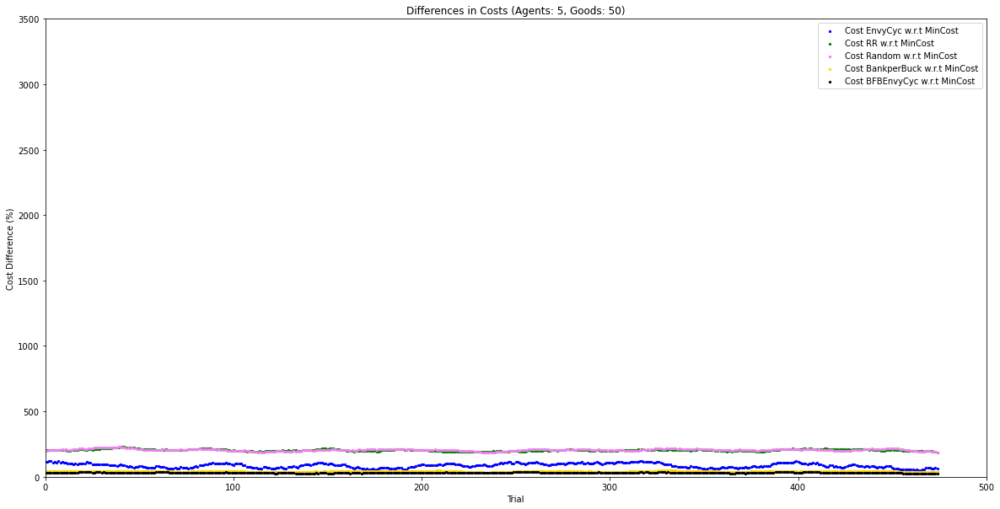

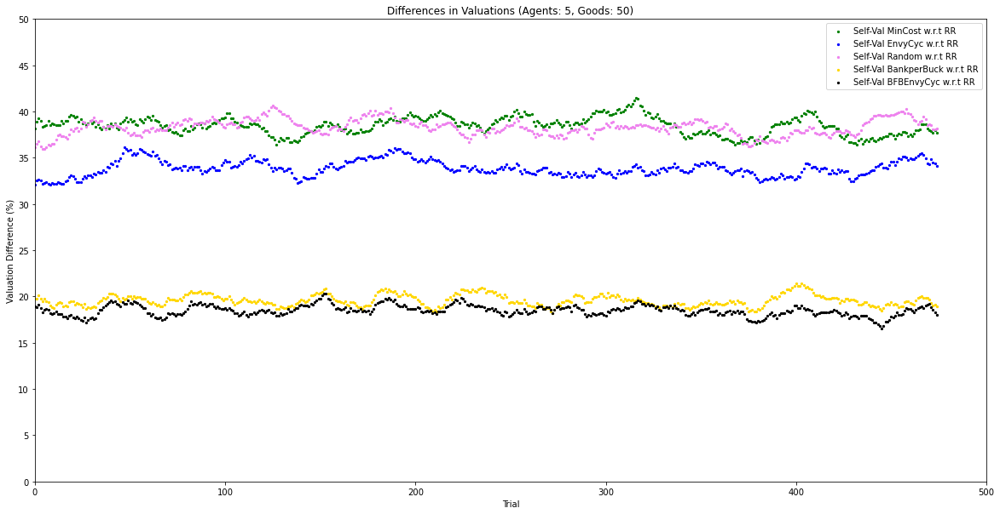

Agents :  5 	 Goods : 60
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 143.37  %
Cost difference of Round Robin w.r.t Min cost : 
 186.23  %
Cost difference of Random w.r.t Min cost : 
 228.47  %
Cost difference of Bank per Buck w.r.t Min cost : 
 49.07  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 40.99  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 40.46  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 34.98  %
Self Valuation difference of Random w.r.t Round Robin : 
 35.95  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 19.75  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 22.99  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------------

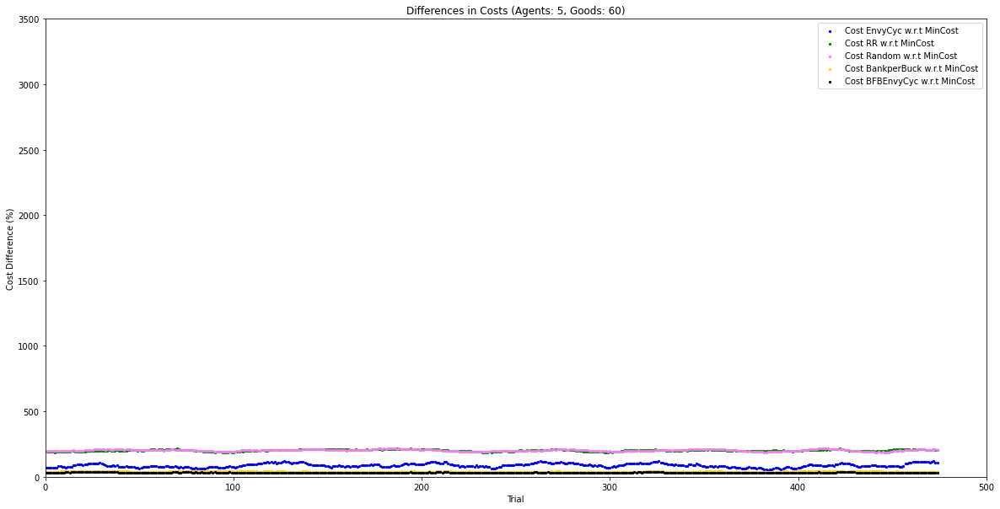

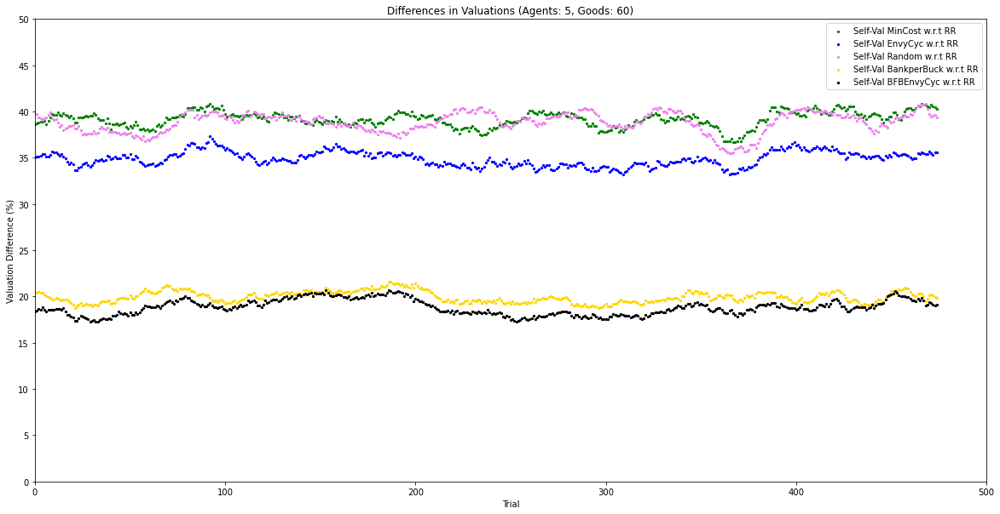

Agents :  5 	 Goods : 70
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 0.0  %
Cost difference of Round Robin w.r.t Min cost : 
 243.94  %
Cost difference of Random w.r.t Min cost : 
 230.03  %
Cost difference of Bank per Buck w.r.t Min cost : 
 33.36  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 22.44  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 34.83  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 34.83  %
Self Valuation difference of Random w.r.t Round Robin : 
 43.25  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 21.64  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 20.52  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------------

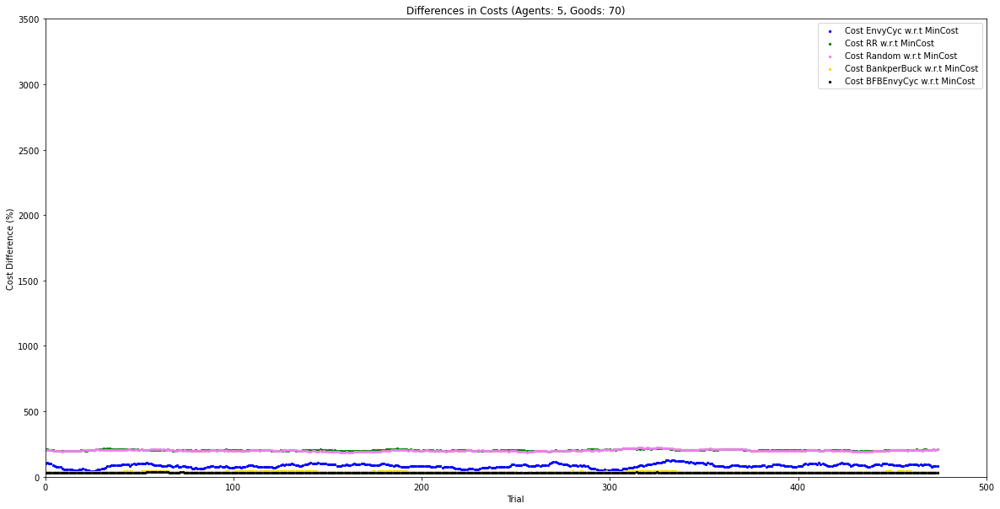

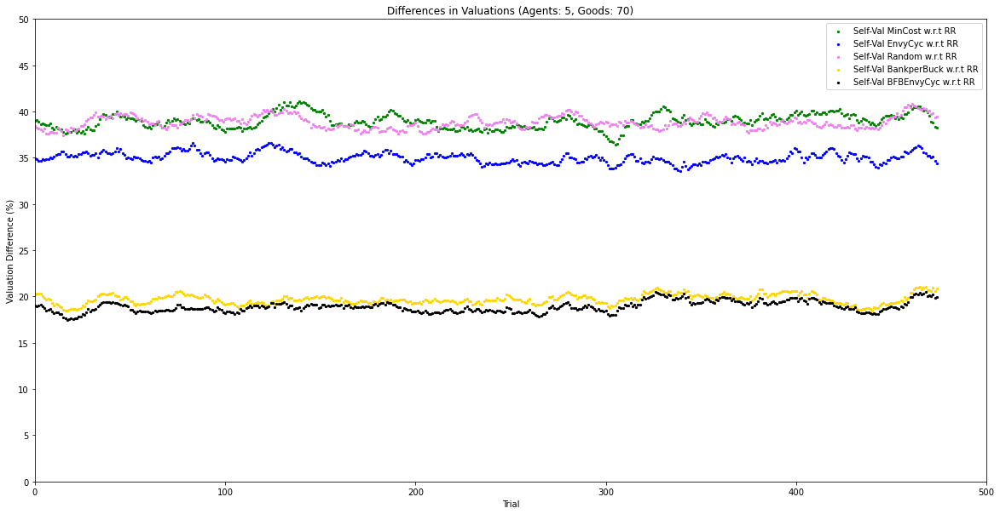

Agents :  5 	 Goods : 80
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 0.0  %
Cost difference of Round Robin w.r.t Min cost : 
 216.23  %
Cost difference of Random w.r.t Min cost : 
 210.02  %
Cost difference of Bank per Buck w.r.t Min cost : 
 32.53  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 27.33  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 37.9  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 37.9  %
Self Valuation difference of Random w.r.t Round Robin : 
 36.93  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 22.47  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 22.81  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-------------------------------------------------------

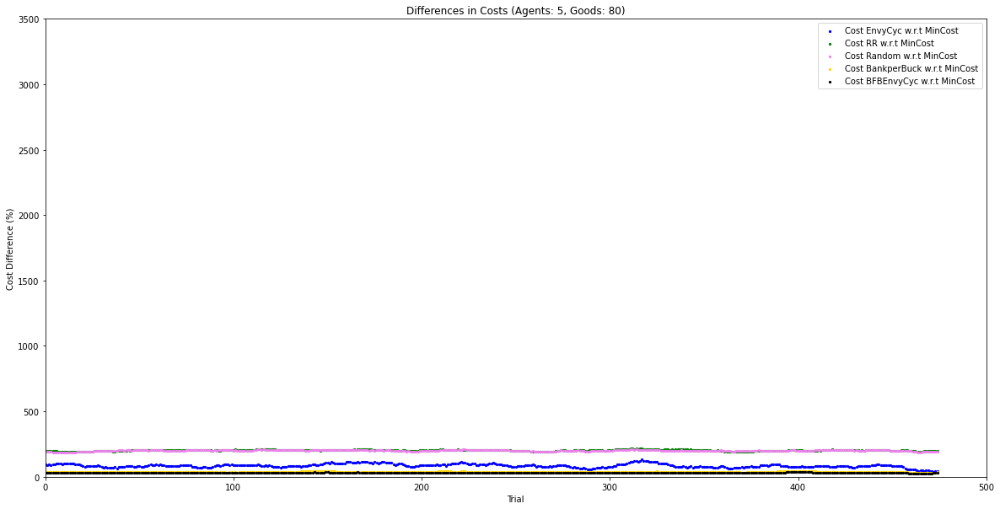

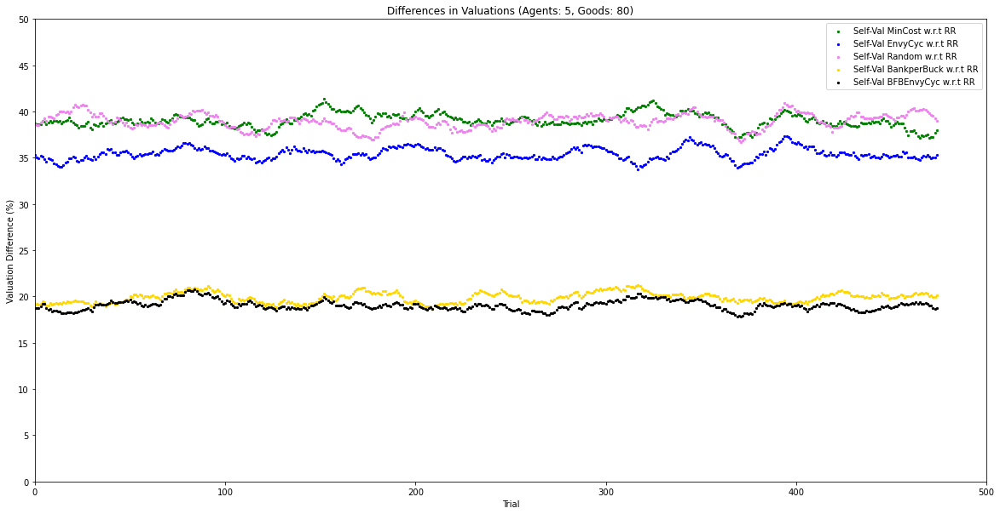

Agents :  5 	 Goods : 90
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 71.88  %
Cost difference of Round Robin w.r.t Min cost : 
 159.31  %
Cost difference of Random w.r.t Min cost : 
 157.5  %
Cost difference of Bank per Buck w.r.t Min cost : 
 32.56  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 29.54  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 40.57  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 38.15  %
Self Valuation difference of Random w.r.t Round Robin : 
 38.53  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 17.19  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 16.64  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------------

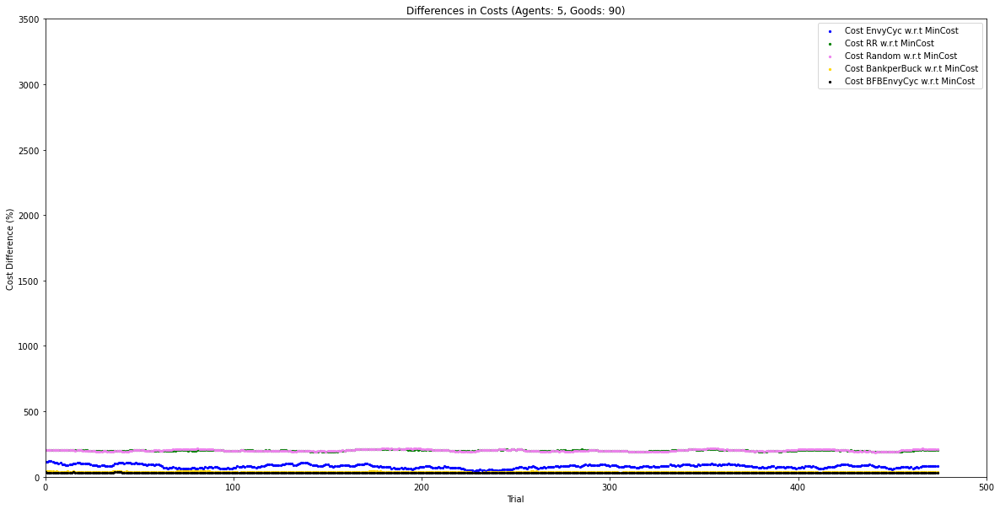

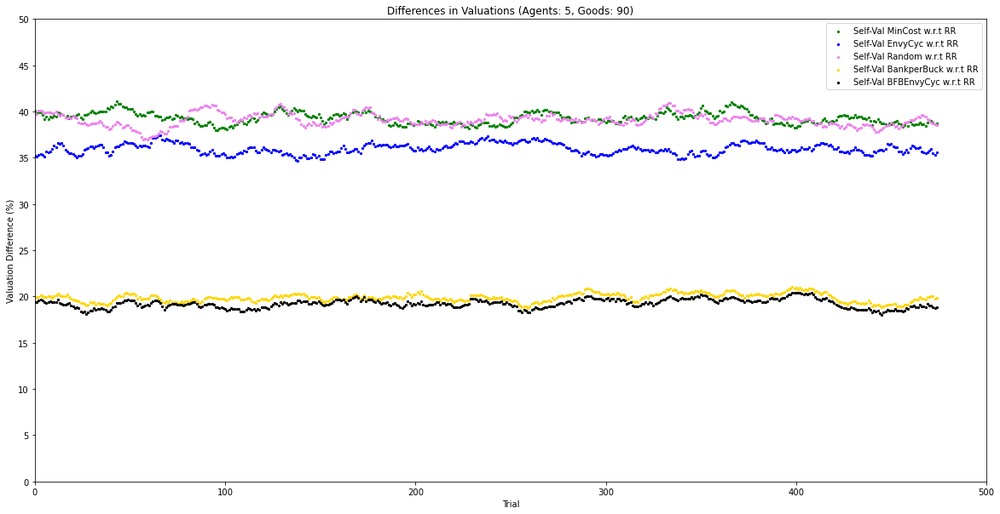

Agents :  5 	 Goods : 100
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 120.24  %
Cost difference of Round Robin w.r.t Min cost : 
 245.93  %
Cost difference of Random w.r.t Min cost : 
 226.28  %
Cost difference of Bank per Buck w.r.t Min cost : 
 43.3  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 32.79  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 42.5  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 36.47  %
Self Valuation difference of Random w.r.t Round Robin : 
 35.91  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 19.93  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 21.13  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------------

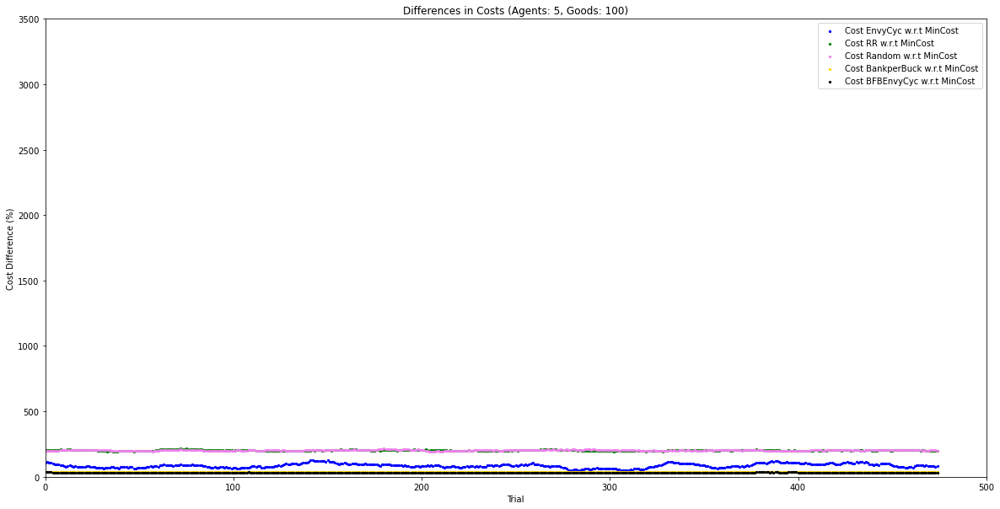

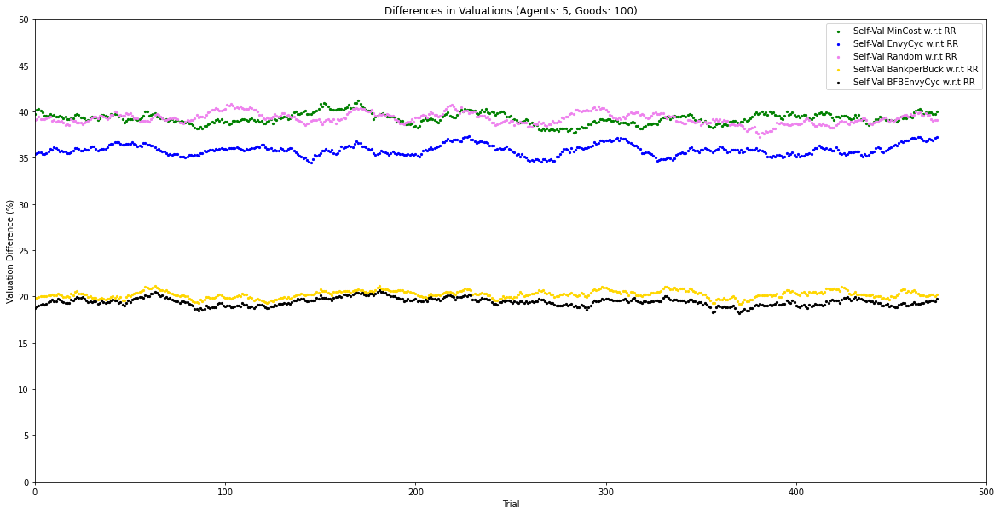

Agents :  5 	 Goods : 110
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 86.35  %
Cost difference of Round Robin w.r.t Min cost : 
 236.83  %
Cost difference of Random w.r.t Min cost : 
 188.33  %
Cost difference of Bank per Buck w.r.t Min cost : 
 40.17  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 28.95  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 37.57  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 35.38  %
Self Valuation difference of Random w.r.t Round Robin : 
 42.45  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 21.7  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 22.34  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------------

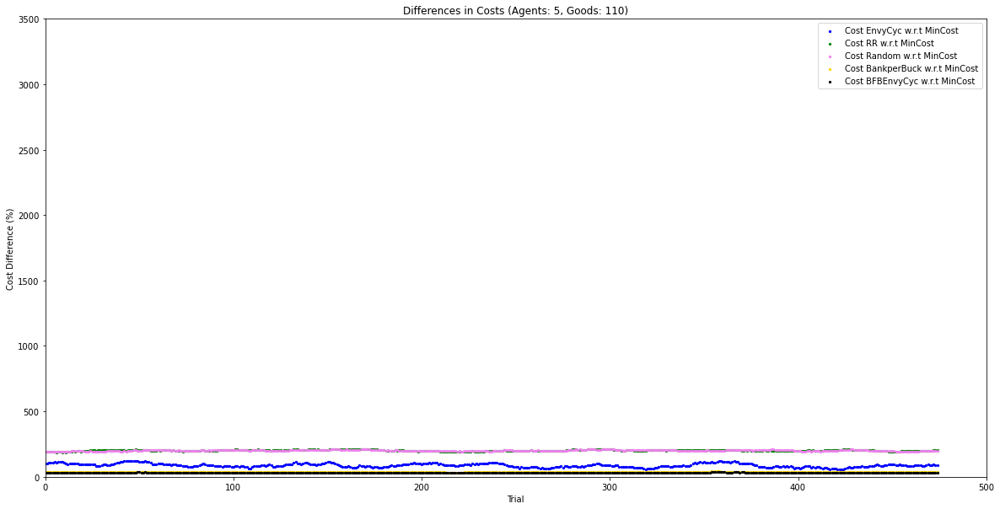

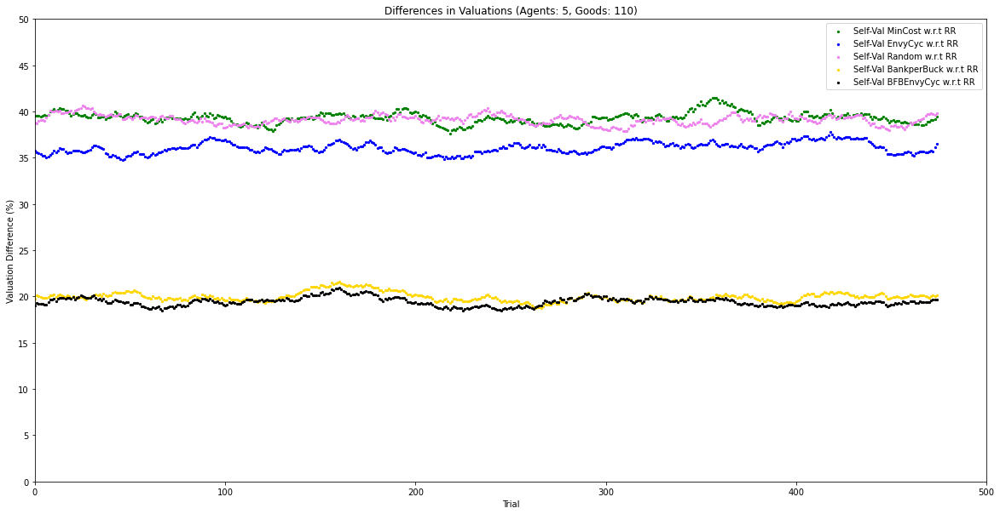

Agents :  5 	 Goods : 120
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 0.0  %
Cost difference of Round Robin w.r.t Min cost : 
 205.08  %
Cost difference of Random w.r.t Min cost : 
 200.92  %
Cost difference of Bank per Buck w.r.t Min cost : 
 43.74  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 43.38  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 35.93  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 35.93  %
Self Valuation difference of Random w.r.t Round Robin : 
 38.01  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 15.41  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 15.18  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------------

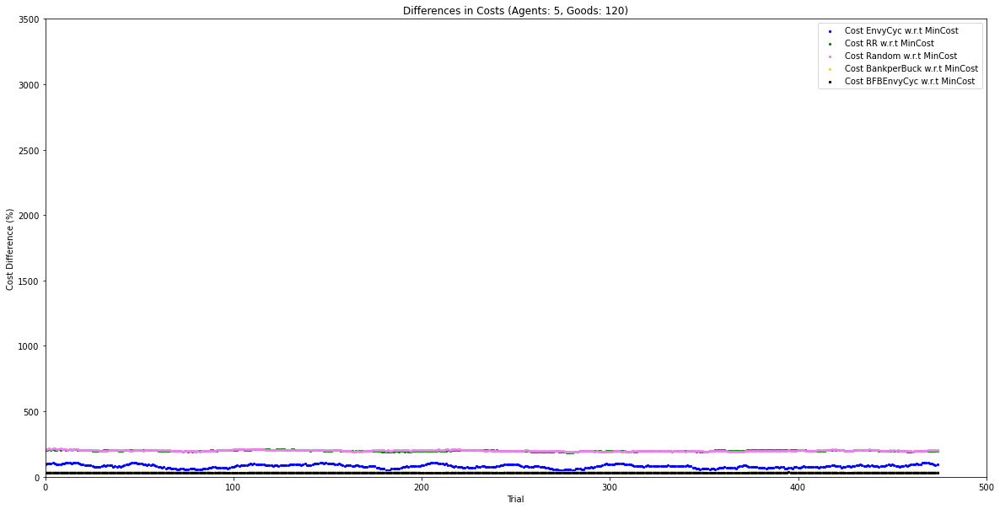

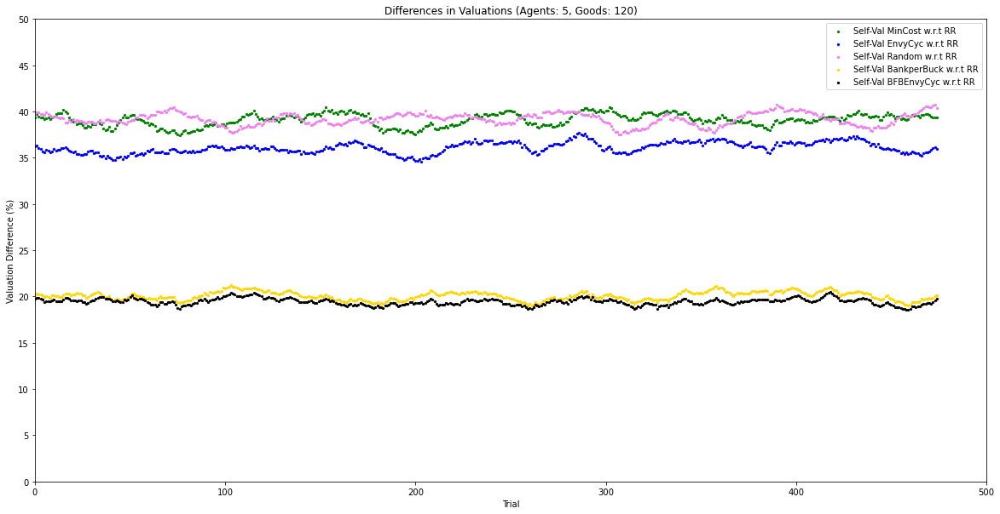

Agents :  5 	 Goods : 130
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 128.69  %
Cost difference of Round Robin w.r.t Min cost : 
 265.2  %
Cost difference of Random w.r.t Min cost : 
 262.31  %
Cost difference of Bank per Buck w.r.t Min cost : 
 55.3  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 48.23  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 43.47  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 40.12  %
Self Valuation difference of Random w.r.t Round Robin : 
 39.06  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 22.28  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 22.39  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------------

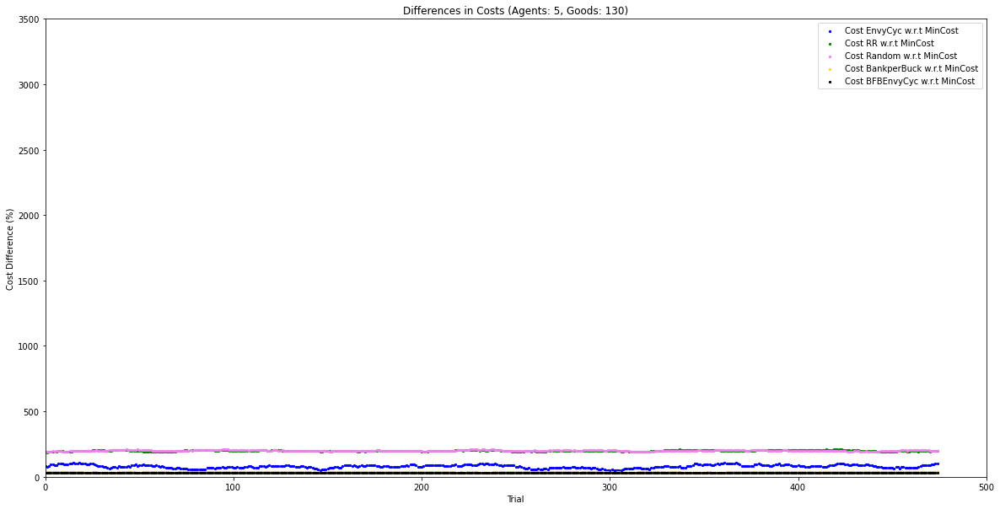

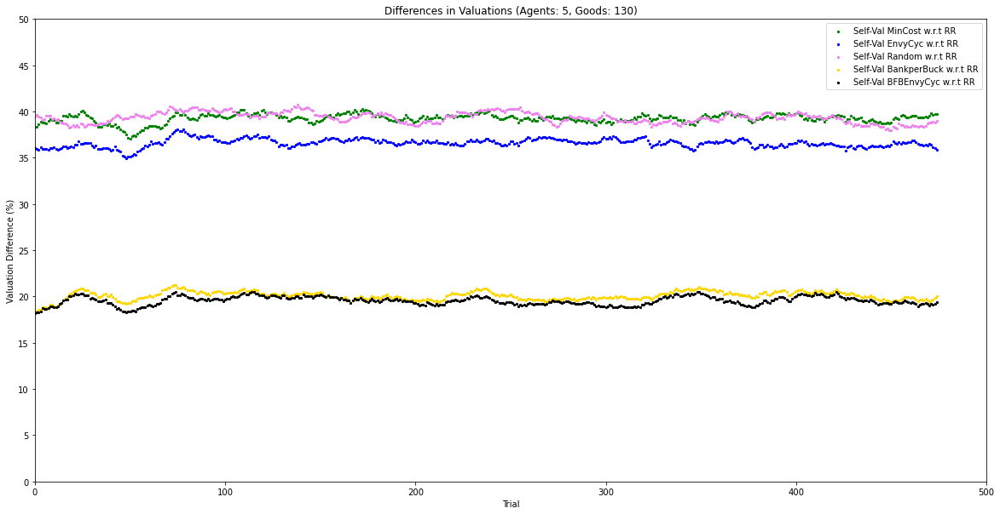

Agents :  5 	 Goods : 140
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 137.66  %
Cost difference of Round Robin w.r.t Min cost : 
 217.14  %
Cost difference of Random w.r.t Min cost : 
 209.1  %
Cost difference of Bank per Buck w.r.t Min cost : 
 40.83  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 36.77  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 41.82  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 34.78  %
Self Valuation difference of Random w.r.t Round Robin : 
 39.12  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 17.79  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 17.67  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------------

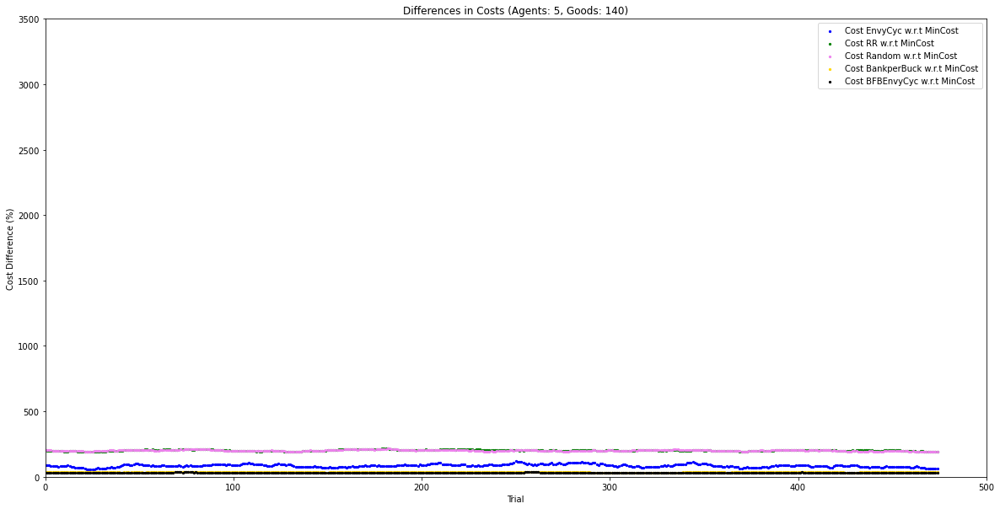

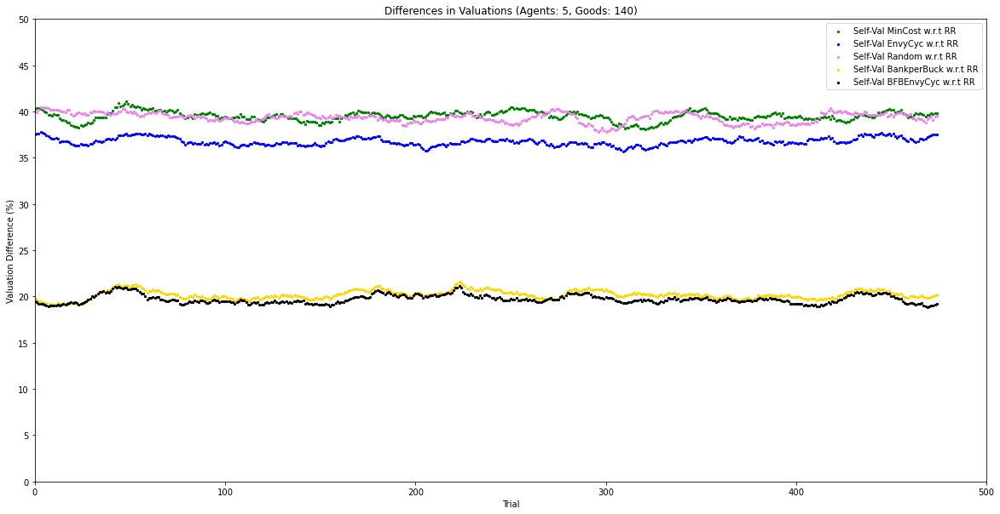

Agents :  10 	 Goods : 50
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 233.78  %
Cost difference of Round Robin w.r.t Min cost : 
 466.0  %
Cost difference of Random w.r.t Min cost : 
 472.48  %
Cost difference of Bank per Buck w.r.t Min cost : 
 94.63  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 29.08  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.9  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 38.89  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.24  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 27.56  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.46  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------------

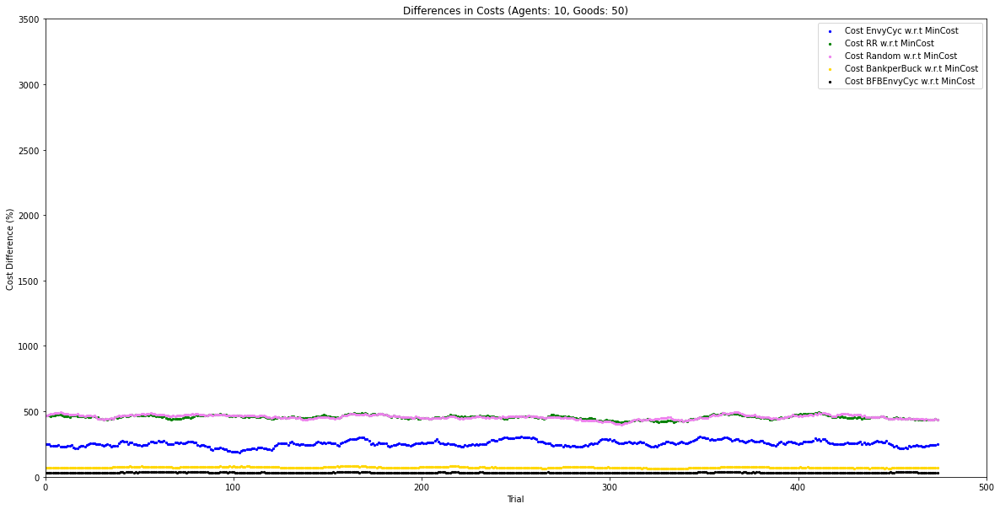

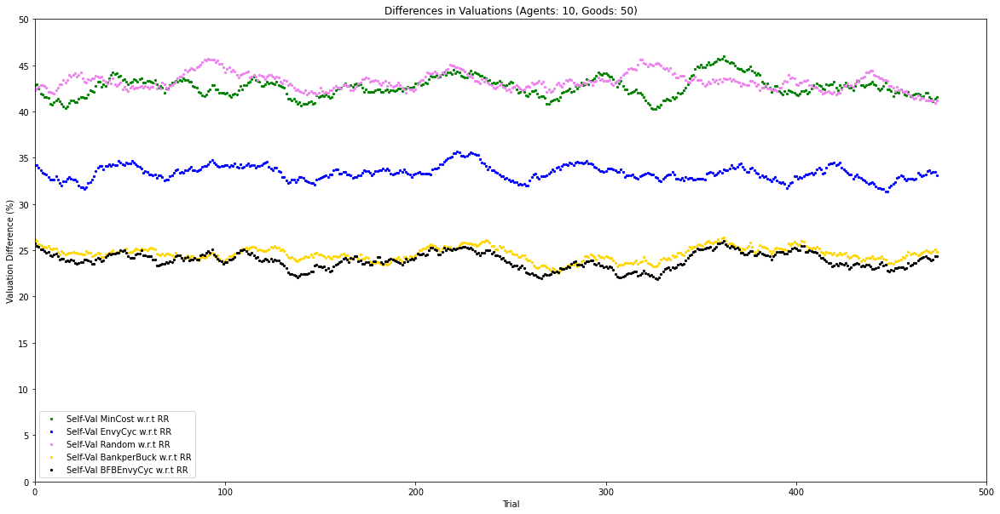

Agents :  10 	 Goods : 60
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 300.16  %
Cost difference of Round Robin w.r.t Min cost : 
 368.31  %
Cost difference of Random w.r.t Min cost : 
 387.36  %
Cost difference of Bank per Buck w.r.t Min cost : 
 58.13  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 26.93  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 39.27  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 34.44  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.33  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 24.49  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 23.64  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-------------------------------------------------

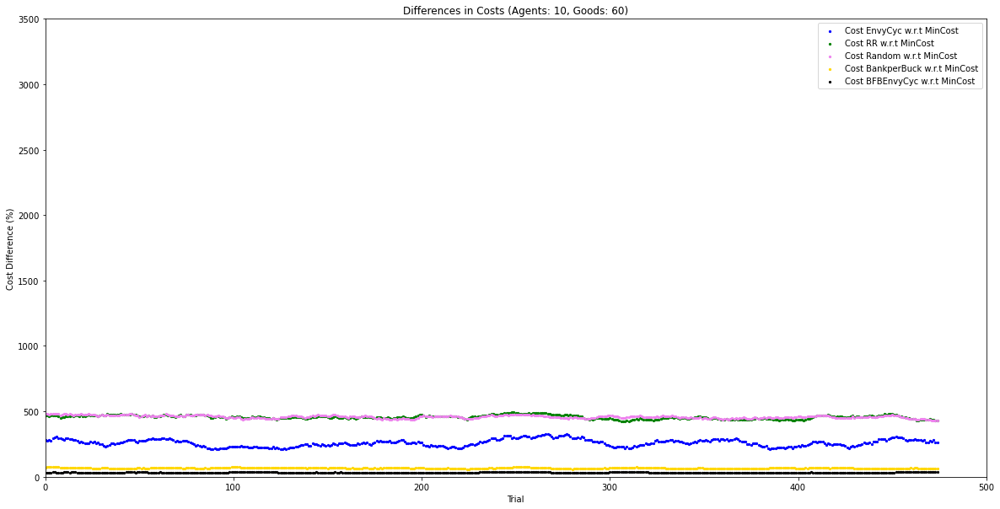

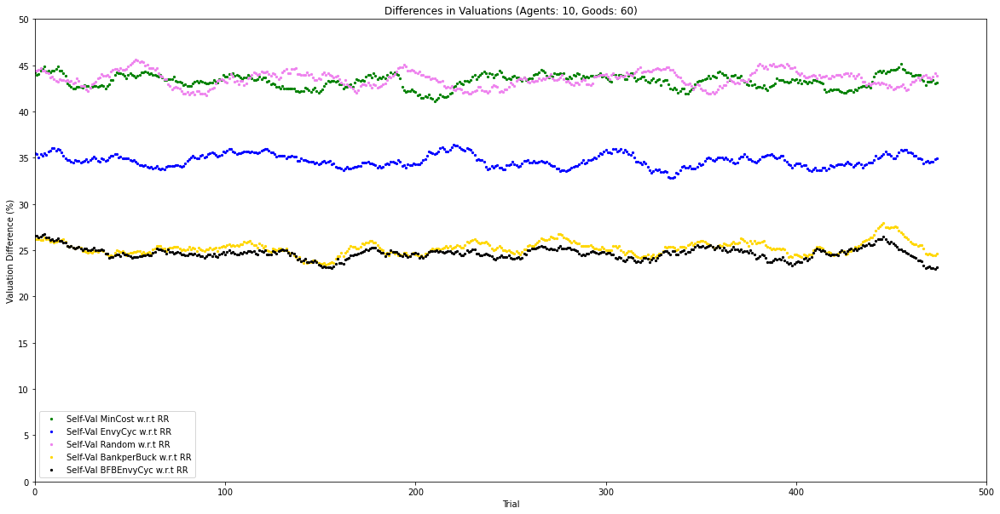

Agents :  10 	 Goods : 70
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 331.03  %
Cost difference of Round Robin w.r.t Min cost : 
 515.69  %
Cost difference of Random w.r.t Min cost : 
 541.9  %
Cost difference of Bank per Buck w.r.t Min cost : 
 75.17  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 47.76  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 41.21  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 28.7  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.46  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 25.48  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 24.51  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------------

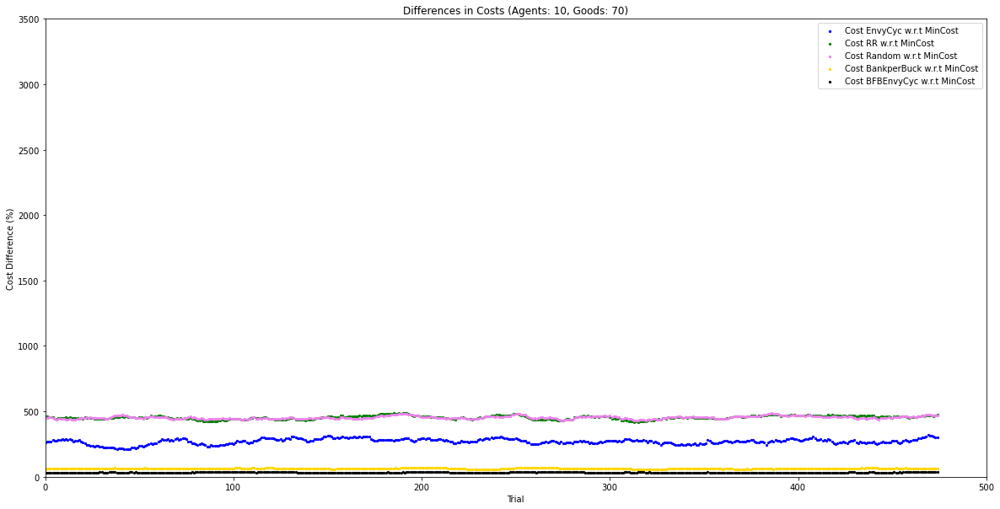

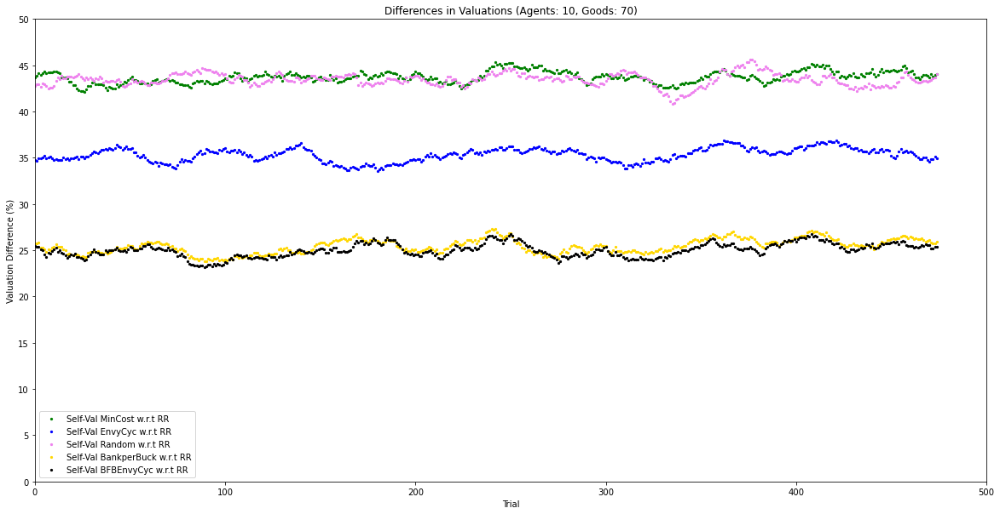

Agents :  10 	 Goods : 80
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 151.0  %
Cost difference of Round Robin w.r.t Min cost : 
 455.42  %
Cost difference of Random w.r.t Min cost : 
 429.18  %
Cost difference of Bank per Buck w.r.t Min cost : 
 52.61  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 32.66  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 45.48  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 39.76  %
Self Valuation difference of Random w.r.t Round Robin : 
 51.56  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 23.77  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 24.46  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------------

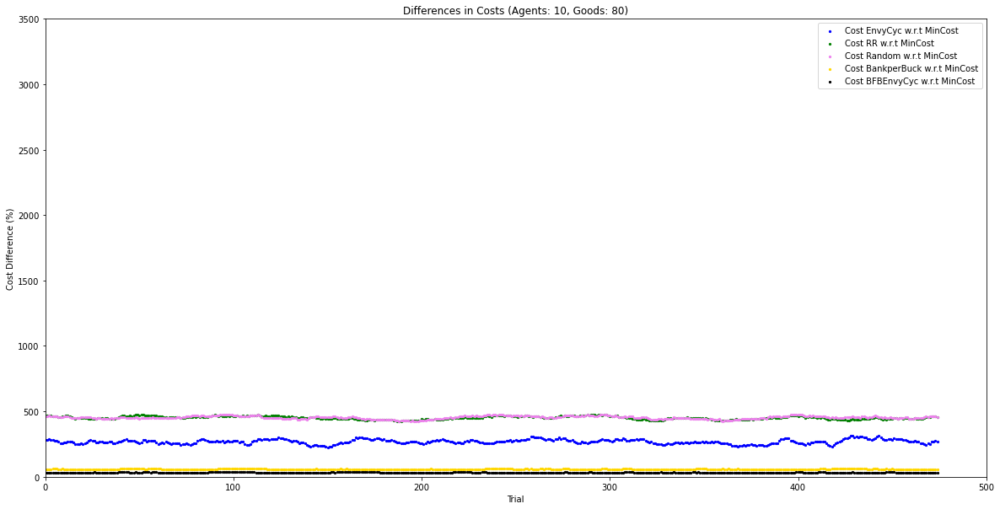

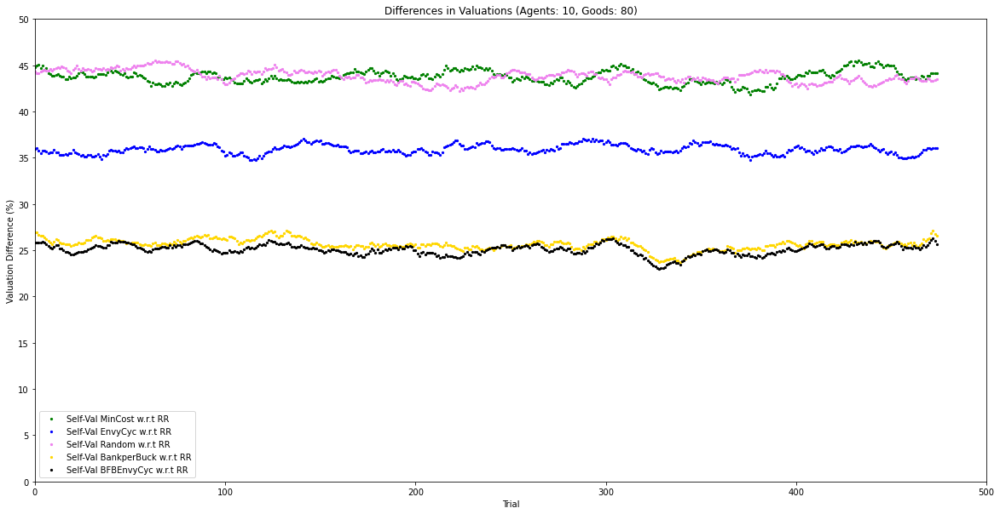

Agents :  10 	 Goods : 90
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 179.44  %
Cost difference of Round Robin w.r.t Min cost : 
 461.97  %
Cost difference of Random w.r.t Min cost : 
 481.69  %
Cost difference of Bank per Buck w.r.t Min cost : 
 45.35  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 25.63  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 39.72  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 39.26  %
Self Valuation difference of Random w.r.t Round Robin : 
 43.58  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 22.81  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 23.61  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-------------------------------------------------

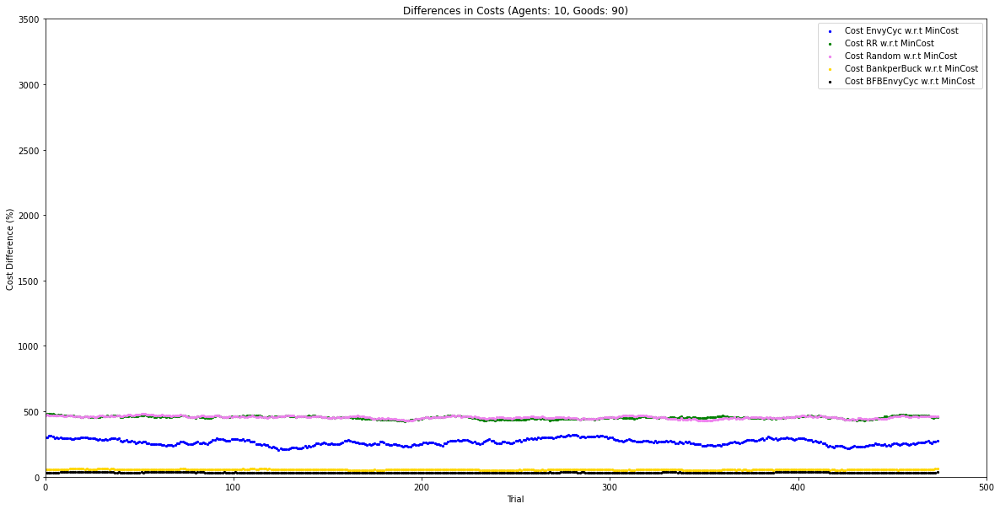

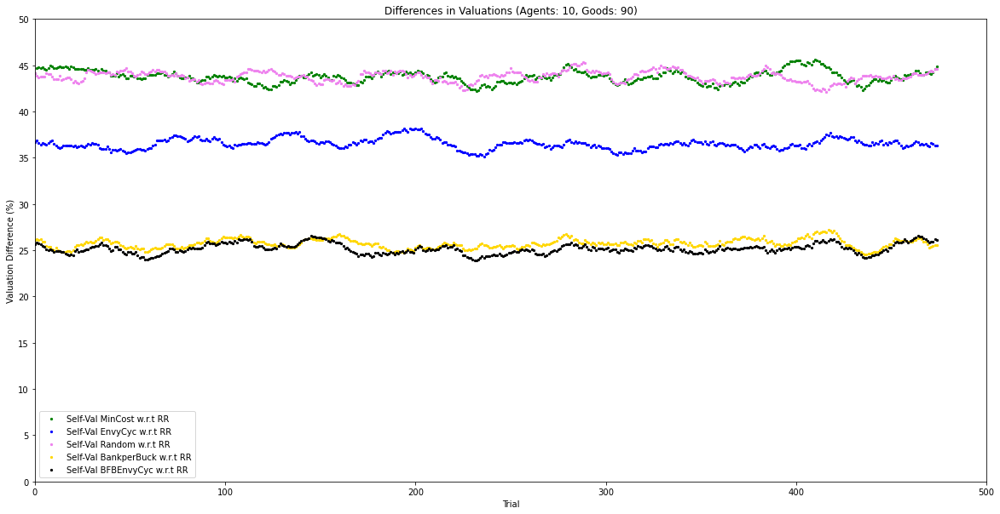

Agents :  10 	 Goods : 100
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 295.18  %
Cost difference of Round Robin w.r.t Min cost : 
 529.16  %
Cost difference of Random w.r.t Min cost : 
 484.39  %
Cost difference of Bank per Buck w.r.t Min cost : 
 65.56  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 34.67  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 48.51  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 40.29  %
Self Valuation difference of Random w.r.t Round Robin : 
 42.42  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.81  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.63  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

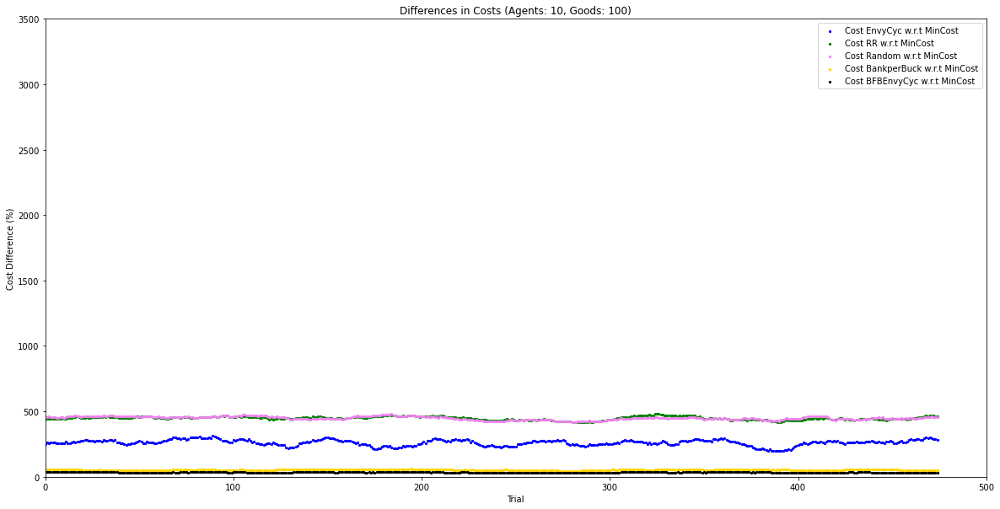

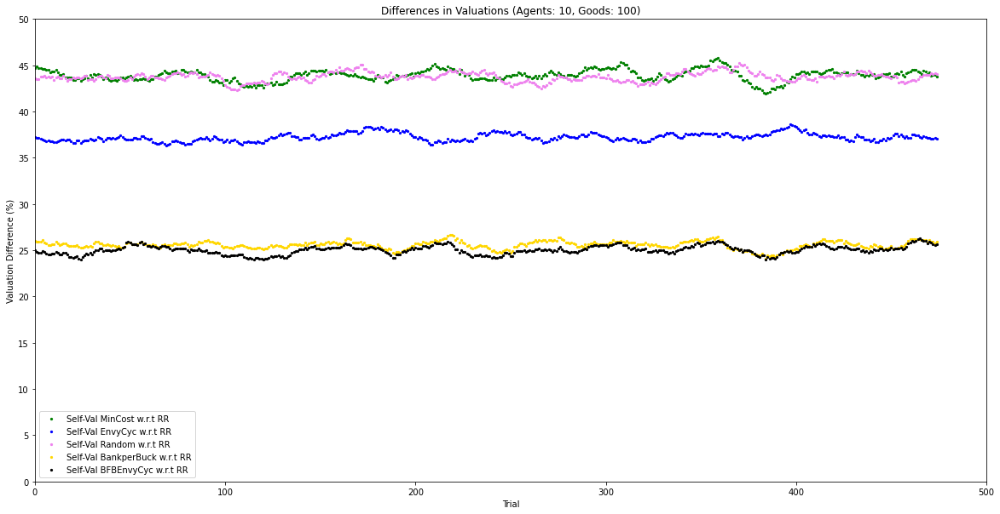

Agents :  10 	 Goods : 110
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 411.8  %
Cost difference of Round Robin w.r.t Min cost : 
 416.15  %
Cost difference of Random w.r.t Min cost : 
 408.61  %
Cost difference of Bank per Buck w.r.t Min cost : 
 56.22  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 49.73  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.93  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 37.81  %
Self Valuation difference of Random w.r.t Round Robin : 
 43.8  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 26.6  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 25.59  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------------

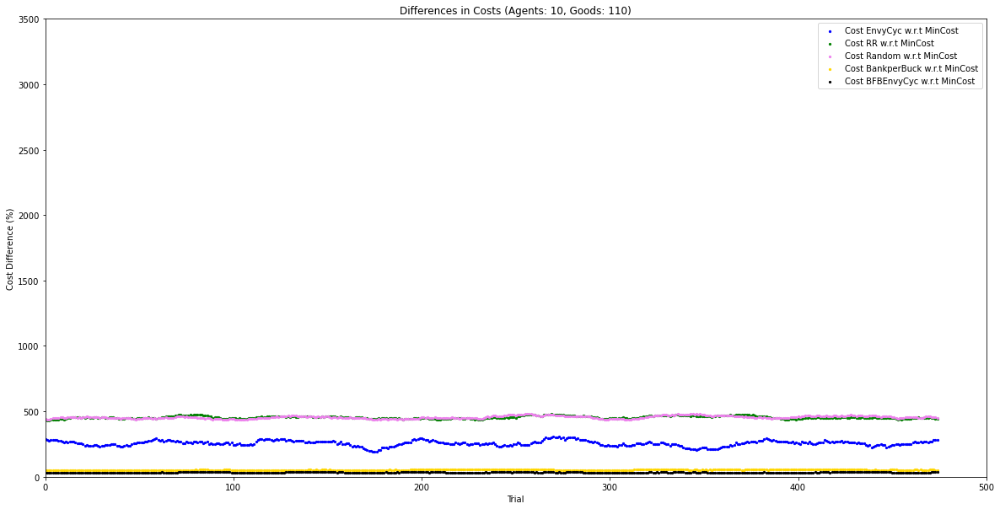

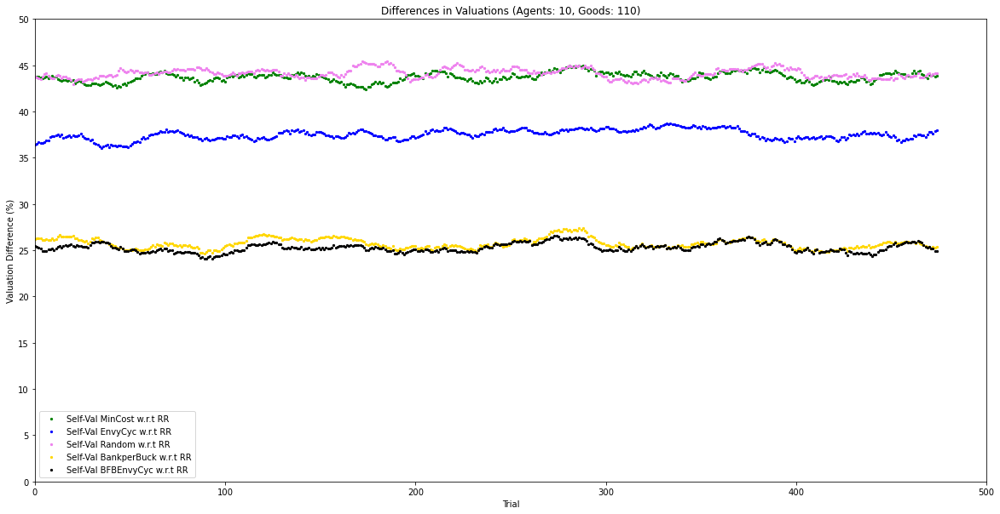

Agents :  10 	 Goods : 120
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 393.92  %
Cost difference of Round Robin w.r.t Min cost : 
 356.37  %
Cost difference of Random w.r.t Min cost : 
 420.71  %
Cost difference of Bank per Buck w.r.t Min cost : 
 56.61  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 41.5  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 49.51  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 41.2  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.45  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 25.46  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 25.97  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------------

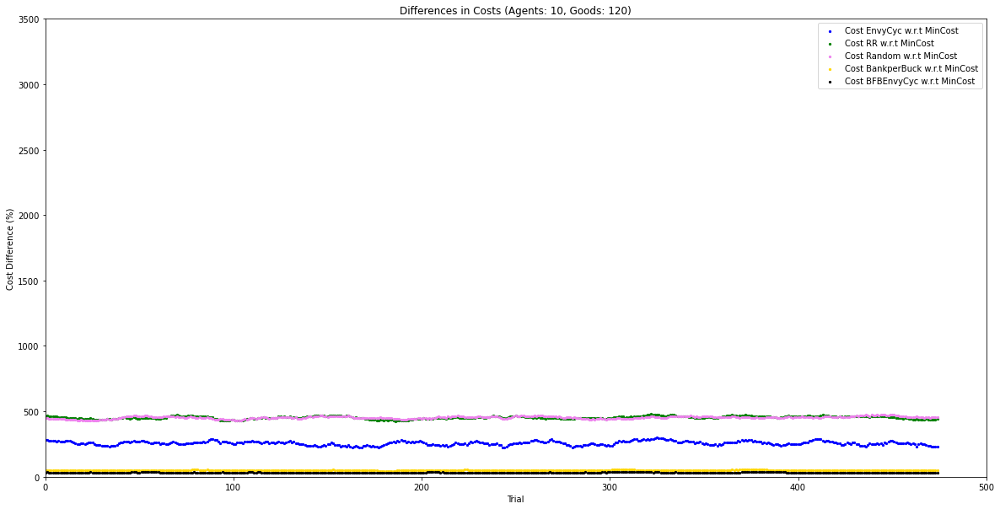

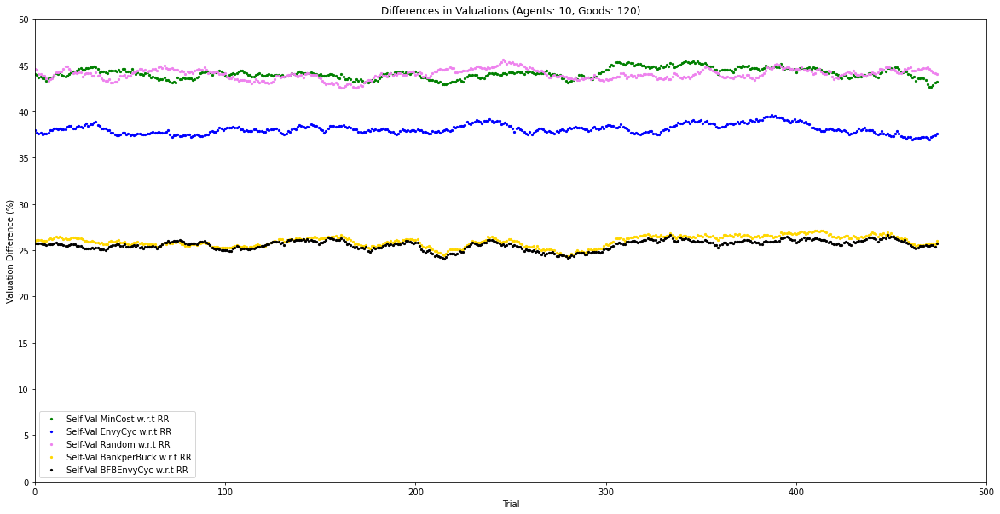

Agents :  10 	 Goods : 130
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 331.33  %
Cost difference of Round Robin w.r.t Min cost : 
 477.97  %
Cost difference of Random w.r.t Min cost : 
 475.39  %
Cost difference of Bank per Buck w.r.t Min cost : 
 38.47  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 25.56  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.59  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 34.66  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.33  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 27.46  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 24.52  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

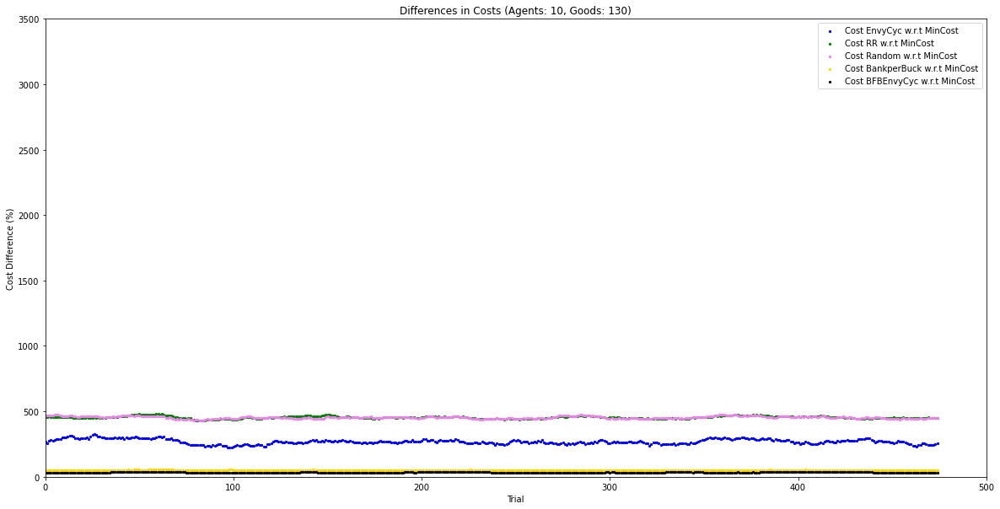

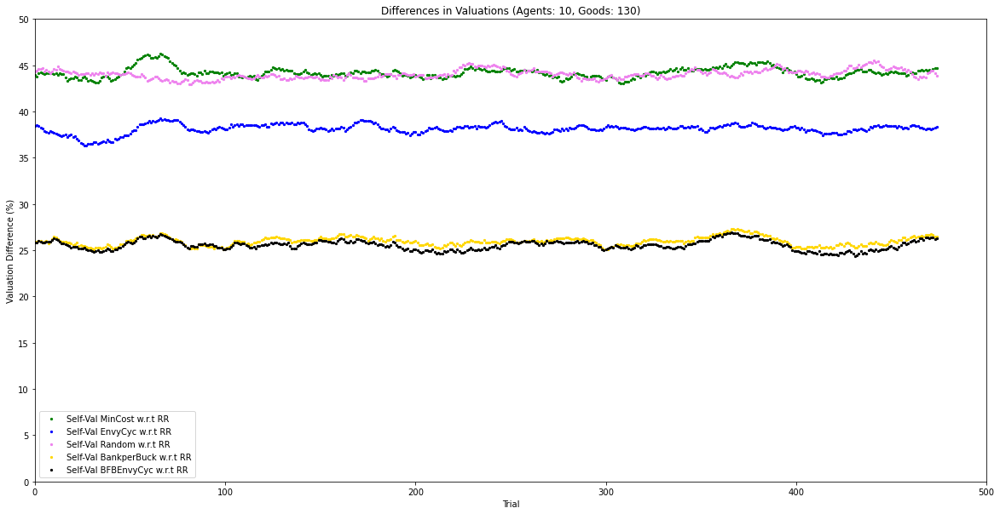

Agents :  10 	 Goods : 140
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 110.14  %
Cost difference of Round Robin w.r.t Min cost : 
 360.81  %
Cost difference of Random w.r.t Min cost : 
 412.54  %
Cost difference of Bank per Buck w.r.t Min cost : 
 55.86  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 29.88  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.53  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 39.16  %
Self Valuation difference of Random w.r.t Round Robin : 
 40.78  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 25.68  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.53  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

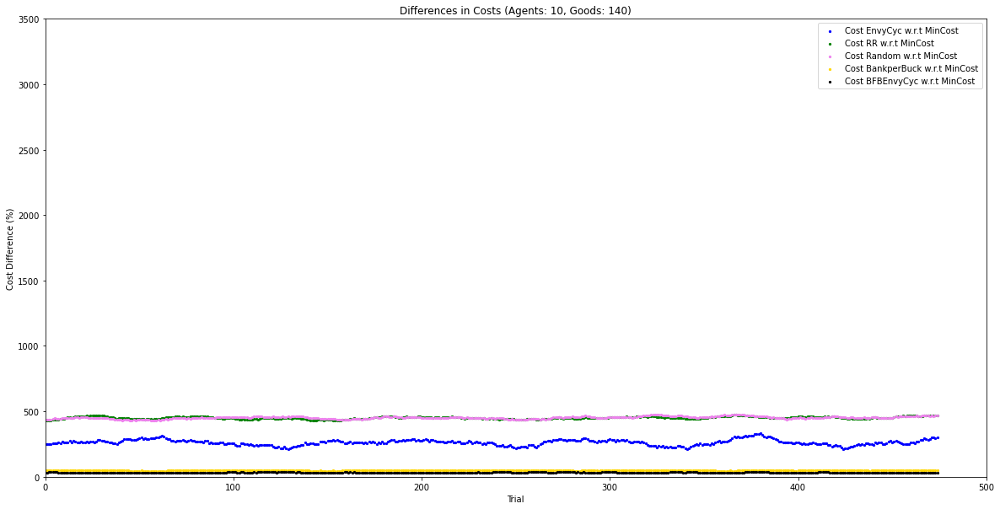

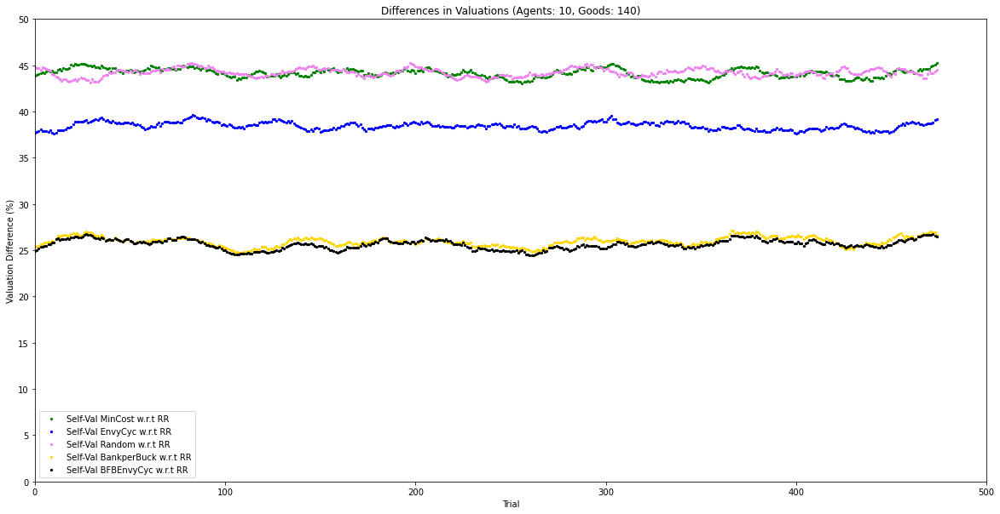

Agents :  15 	 Goods : 50
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 665.26  %
Cost difference of Round Robin w.r.t Min cost : 
 736.36  %
Cost difference of Random w.r.t Min cost : 
 645.45  %
Cost difference of Bank per Buck w.r.t Min cost : 
 76.95  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 36.69  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 45.5  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 25.1  %
Self Valuation difference of Random w.r.t Round Robin : 
 40.42  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 27.88  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 21.96  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------------

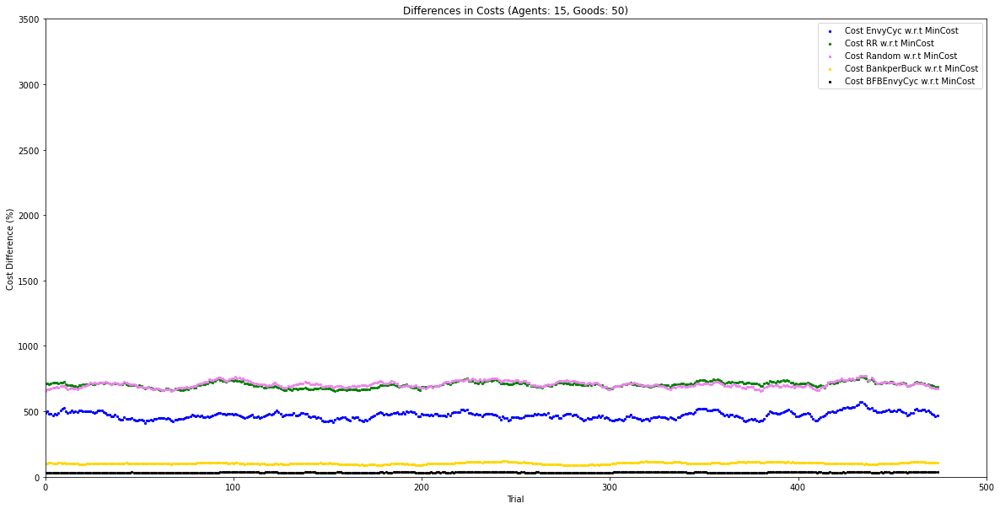

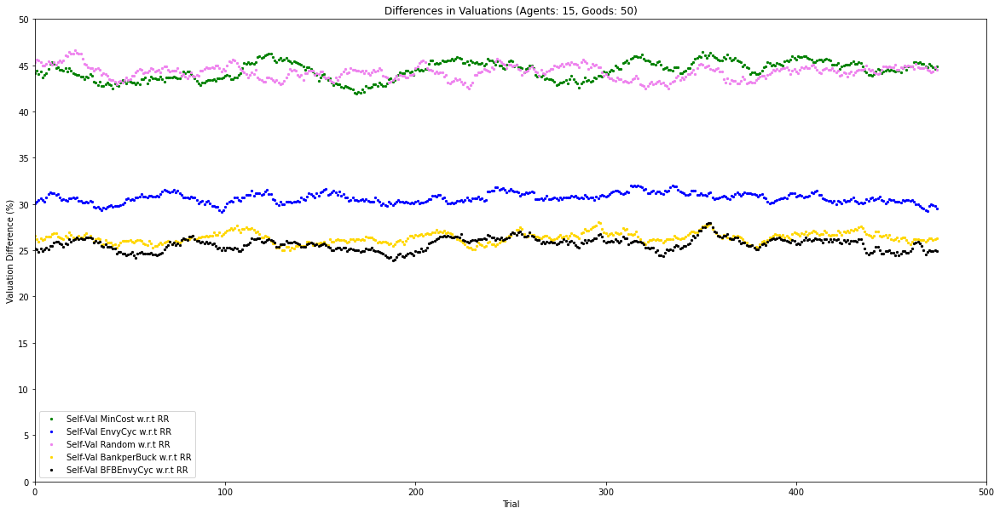

Agents :  15 	 Goods : 60
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 699.21  %
Cost difference of Round Robin w.r.t Min cost : 
 743.57  %
Cost difference of Random w.r.t Min cost : 
 673.49  %
Cost difference of Bank per Buck w.r.t Min cost : 
 73.49  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 36.75  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 52.22  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 32.21  %
Self Valuation difference of Random w.r.t Round Robin : 
 41.96  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 23.99  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 23.66  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-------------------------------------------------

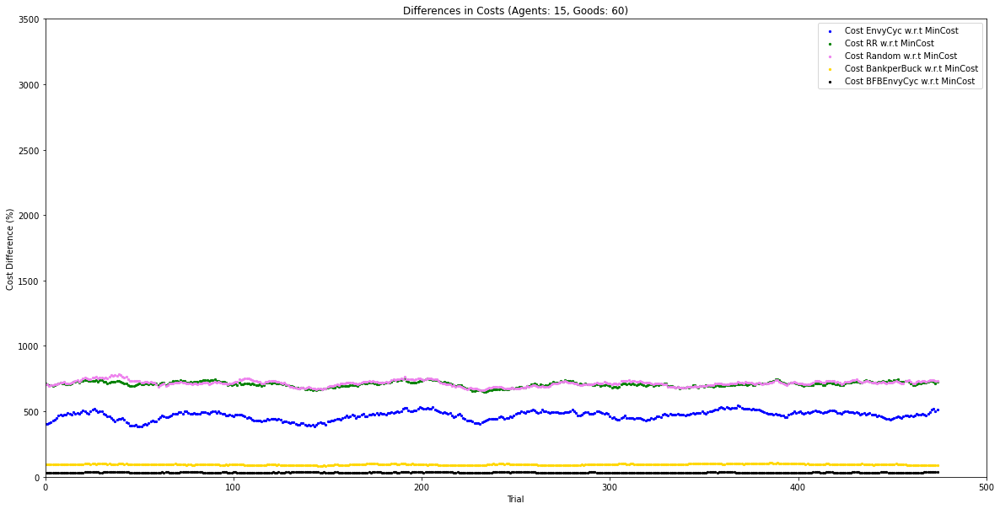

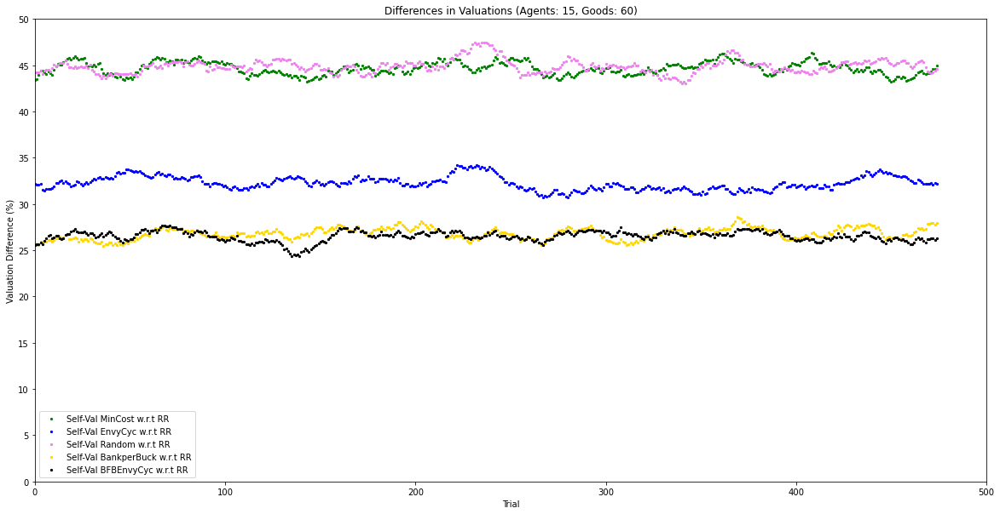

Agents :  15 	 Goods : 70
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 288.09  %
Cost difference of Round Robin w.r.t Min cost : 
 759.1  %
Cost difference of Random w.r.t Min cost : 
 607.19  %
Cost difference of Bank per Buck w.r.t Min cost : 
 44.27  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 31.24  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 42.99  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 33.31  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.02  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 35.29  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.71  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------------

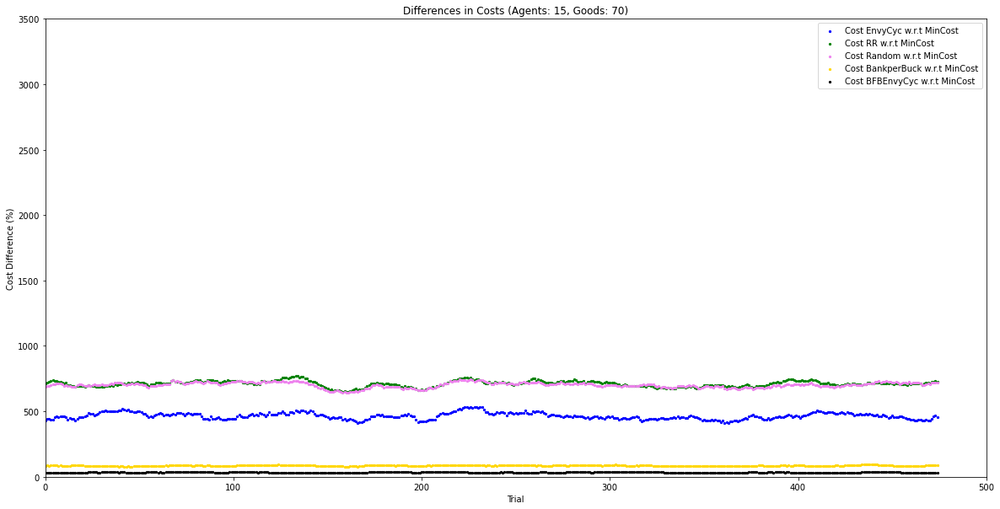

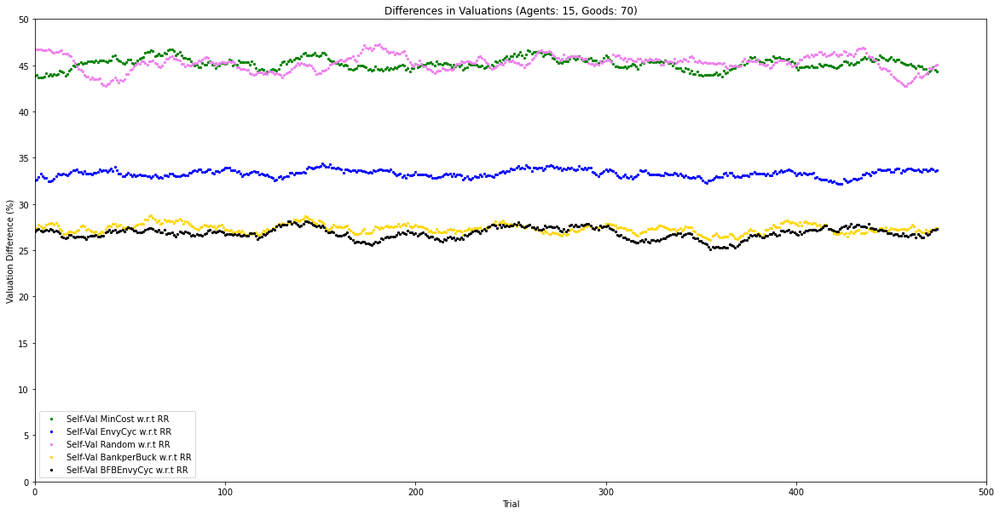

Agents :  15 	 Goods : 80
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 357.43  %
Cost difference of Round Robin w.r.t Min cost : 
 727.29  %
Cost difference of Random w.r.t Min cost : 
 714.46  %
Cost difference of Bank per Buck w.r.t Min cost : 
 67.01  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 27.5  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 43.63  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 35.45  %
Self Valuation difference of Random w.r.t Round Robin : 
 48.75  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 24.76  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.1  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------------

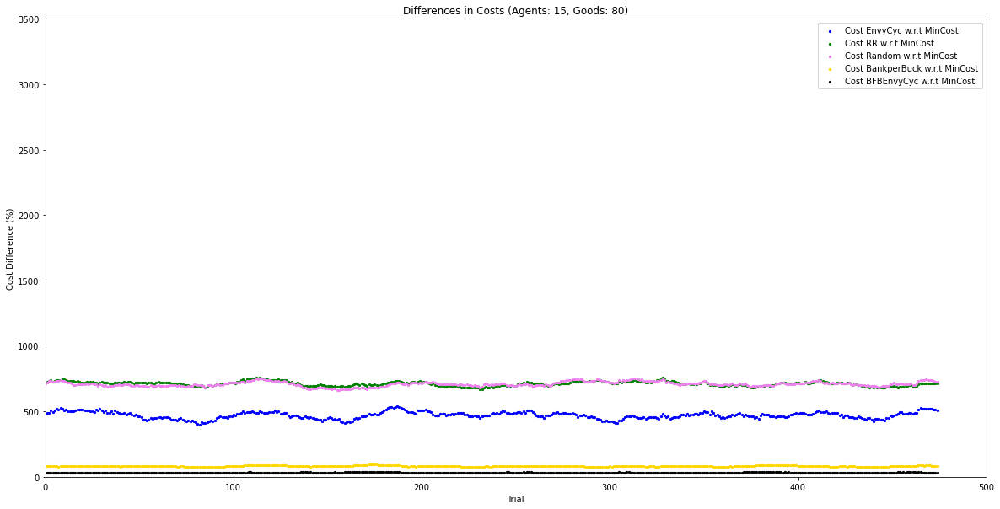

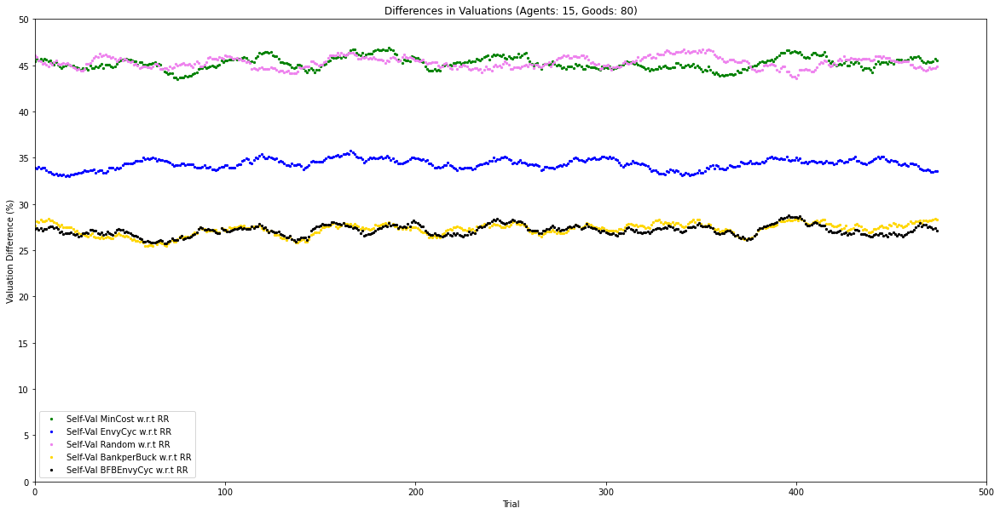

Agents :  15 	 Goods : 90
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 432.86  %
Cost difference of Round Robin w.r.t Min cost : 
 687.74  %
Cost difference of Random w.r.t Min cost : 
 664.3  %
Cost difference of Bank per Buck w.r.t Min cost : 
 79.93  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 21.85  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.44  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 30.94  %
Self Valuation difference of Random w.r.t Round Robin : 
 43.56  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 32.65  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.89  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------------

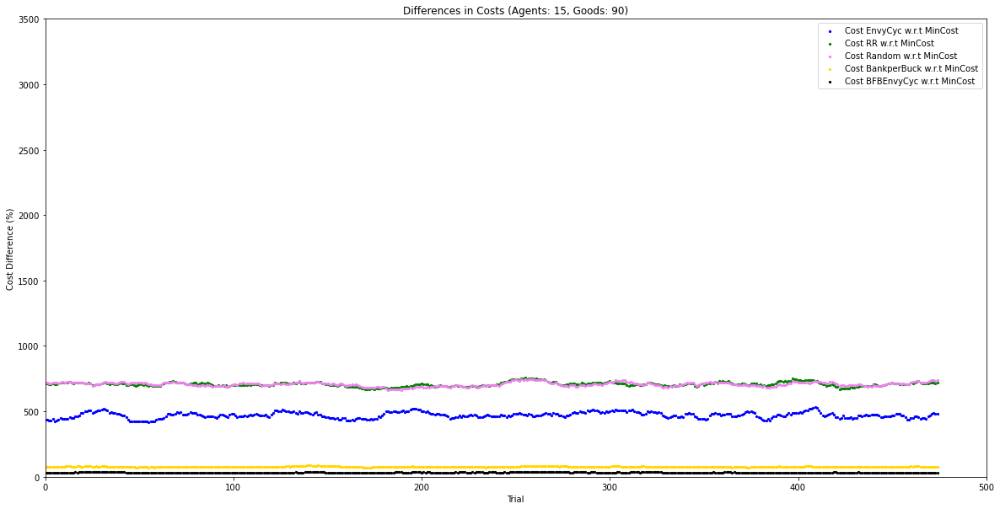

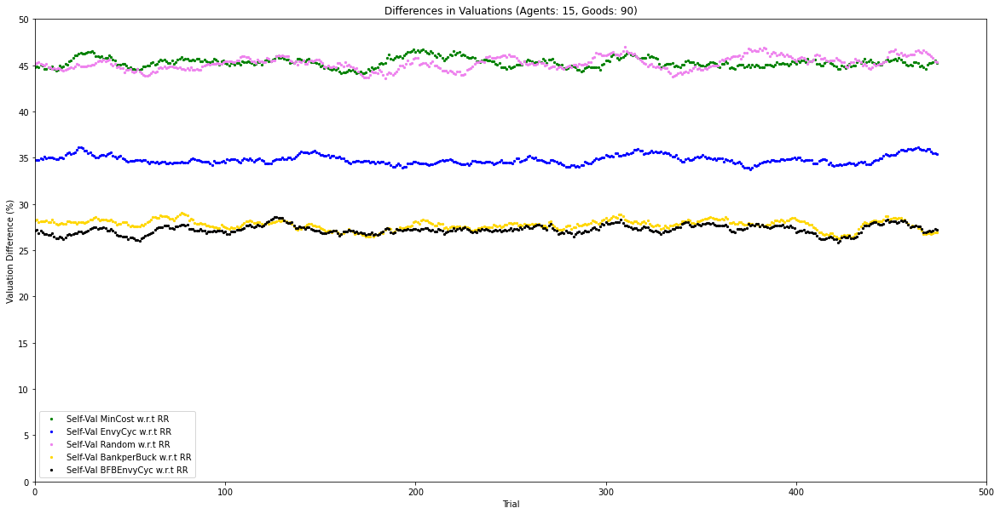

Agents :  15 	 Goods : 100
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 583.0  %
Cost difference of Round Robin w.r.t Min cost : 
 673.75  %
Cost difference of Random w.r.t Min cost : 
 711.08  %
Cost difference of Bank per Buck w.r.t Min cost : 
 75.57  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 22.0  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 49.63  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 34.78  %
Self Valuation difference of Random w.r.t Round Robin : 
 49.55  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 26.18  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 30.42  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------------

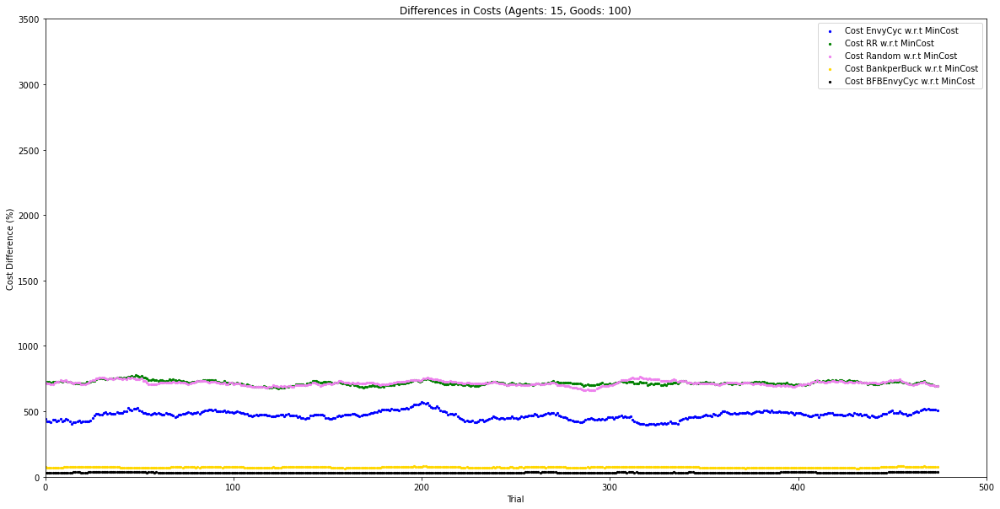

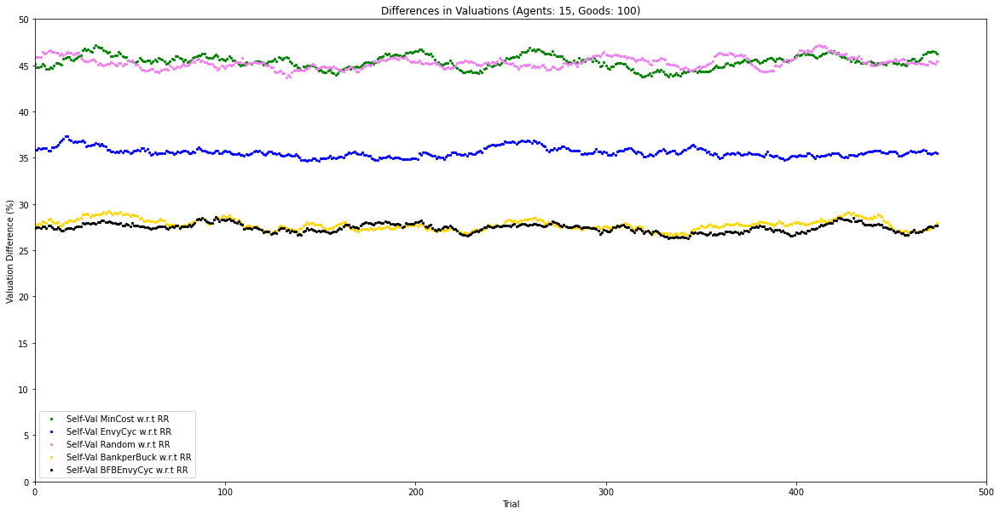

Agents :  15 	 Goods : 110
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 511.41  %
Cost difference of Round Robin w.r.t Min cost : 
 605.21  %
Cost difference of Random w.r.t Min cost : 
 738.17  %
Cost difference of Bank per Buck w.r.t Min cost : 
 69.16  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 26.06  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 43.27  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 36.46  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.45  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 25.97  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 24.67  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

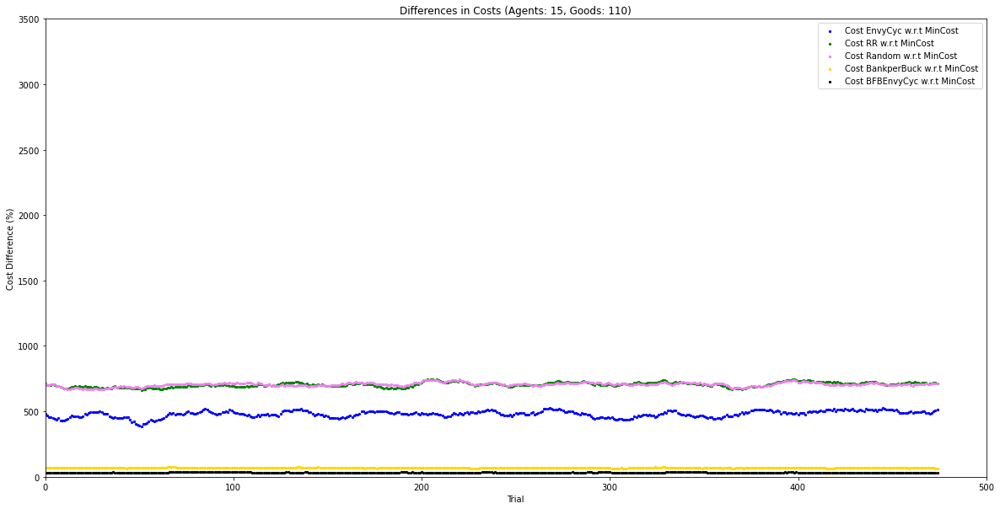

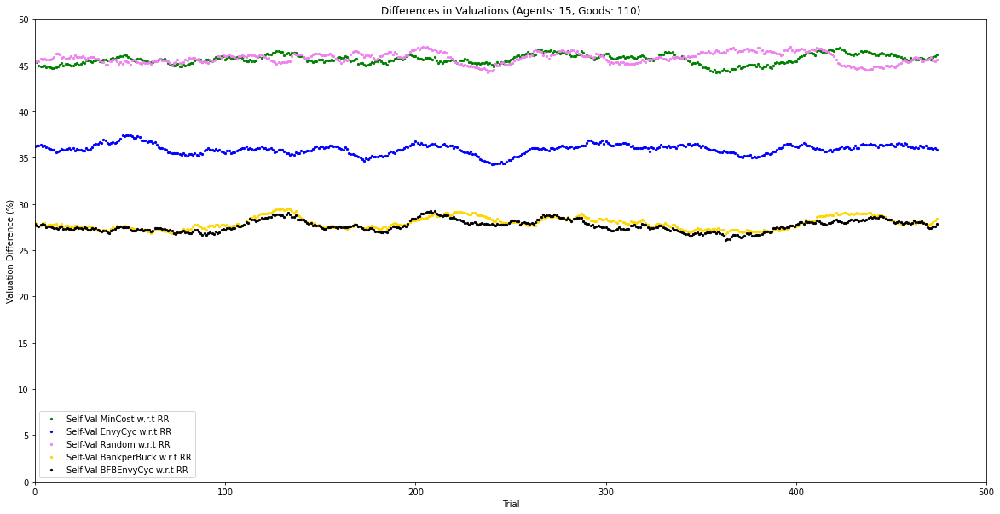

Agents :  15 	 Goods : 120
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 450.85  %
Cost difference of Round Robin w.r.t Min cost : 
 658.0  %
Cost difference of Random w.r.t Min cost : 
 653.71  %
Cost difference of Bank per Buck w.r.t Min cost : 
 52.8  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 22.24  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.25  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 35.58  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.06  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 30.71  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.62  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------------

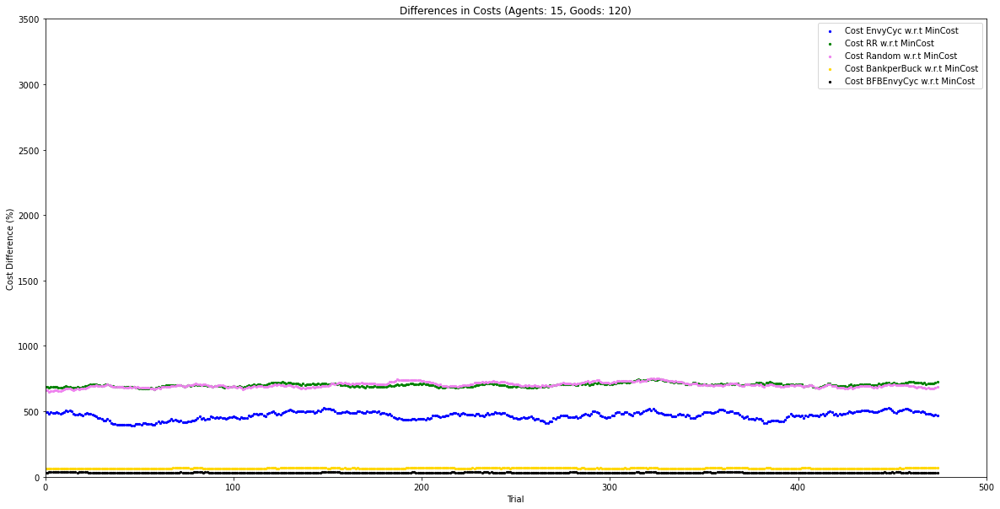

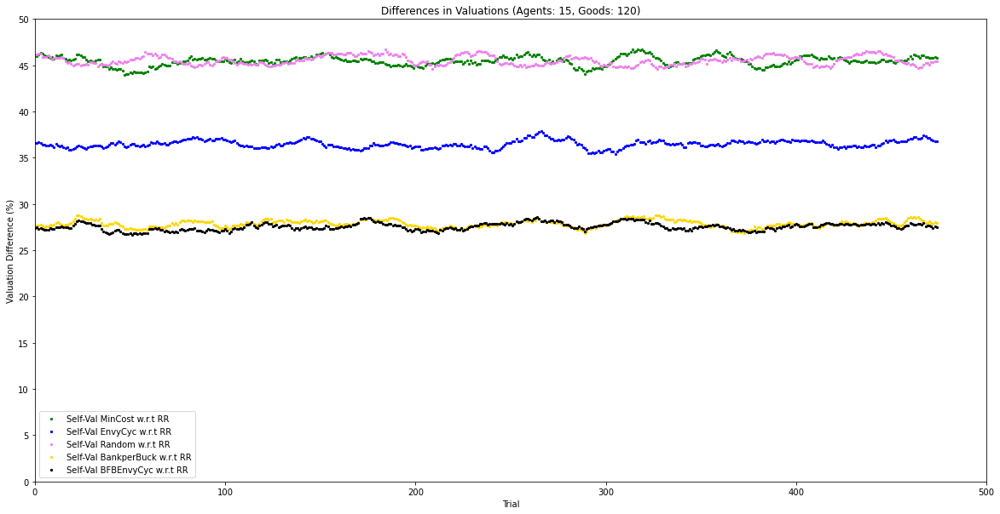

Agents :  15 	 Goods : 130
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 741.25  %
Cost difference of Round Robin w.r.t Min cost : 
 815.65  %
Cost difference of Random w.r.t Min cost : 
 813.4  %
Cost difference of Bank per Buck w.r.t Min cost : 
 69.9  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 34.09  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 49.29  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 36.44  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.8  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 33.17  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 31.99  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------------

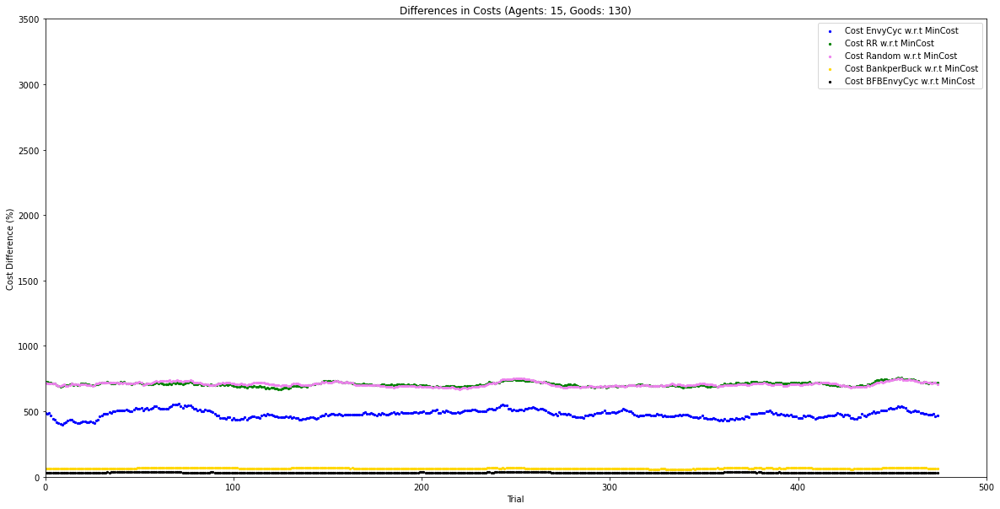

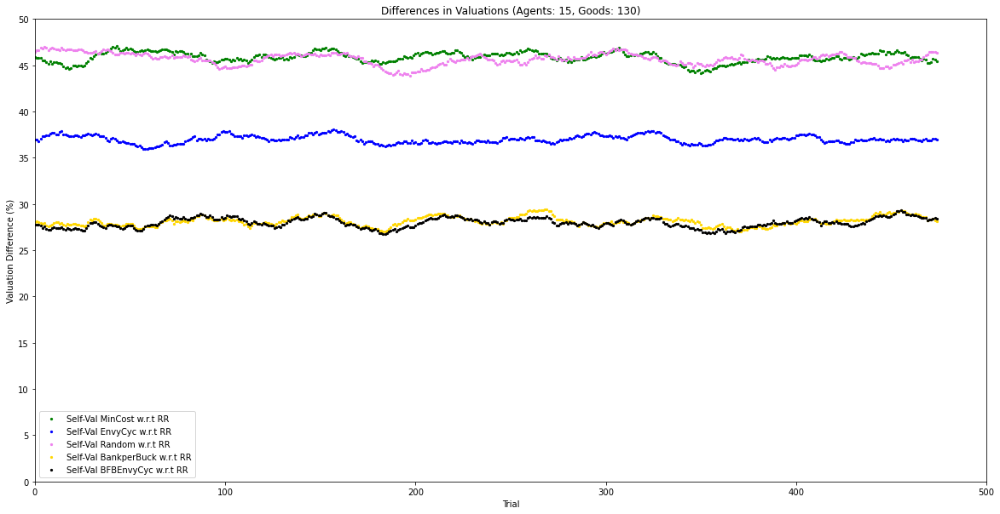

Agents :  15 	 Goods : 140
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 609.51  %
Cost difference of Round Robin w.r.t Min cost : 
 706.99  %
Cost difference of Random w.r.t Min cost : 
 669.76  %
Cost difference of Bank per Buck w.r.t Min cost : 
 81.1  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 31.27  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 48.19  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 37.97  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.7  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 26.61  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.78  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------------

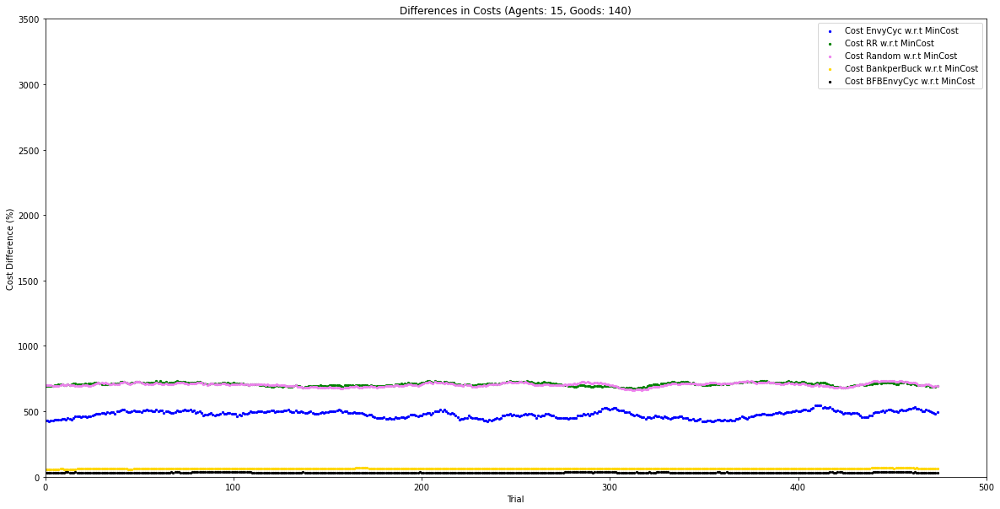

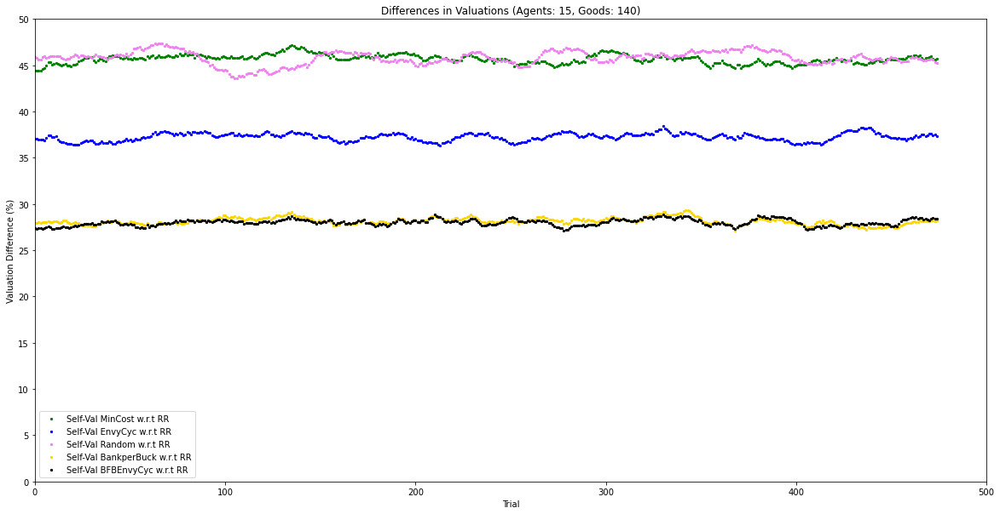

Agents :  20 	 Goods : 50
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 713.76  %
Cost difference of Round Robin w.r.t Min cost : 
 1064.68  %
Cost difference of Random w.r.t Min cost : 
 1198.17  %
Cost difference of Bank per Buck w.r.t Min cost : 
 152.3  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 34.86  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.05  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 31.42  %
Self Valuation difference of Random w.r.t Round Robin : 
 42.48  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 24.73  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 21.95  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

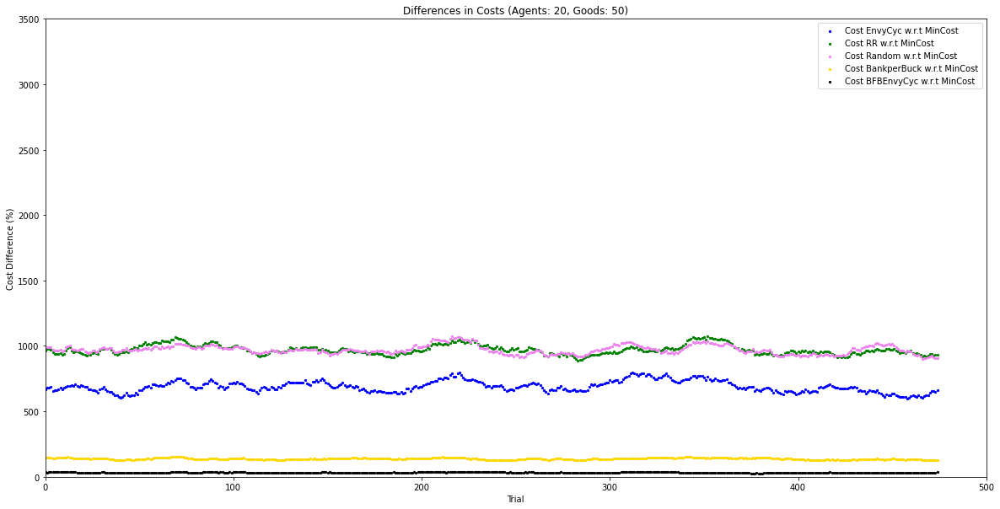

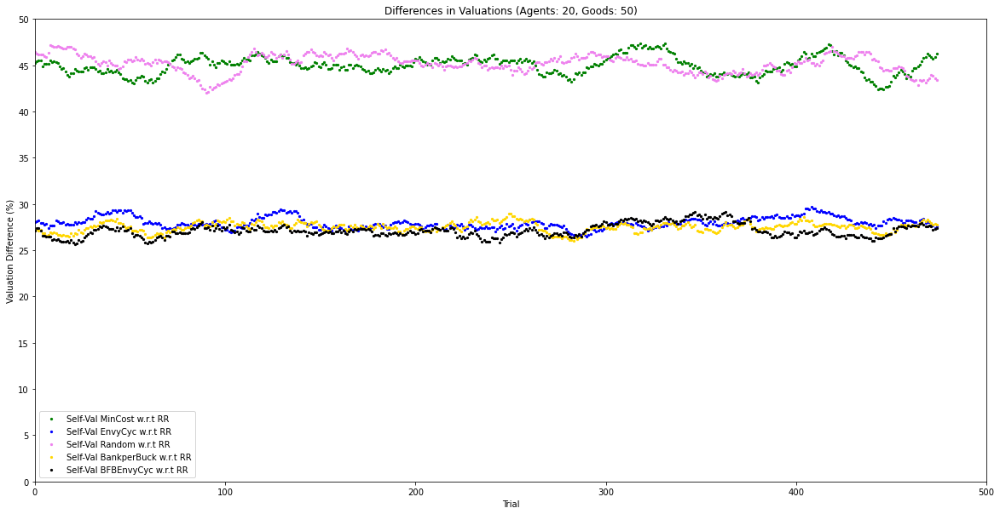

Agents :  20 	 Goods : 60
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 489.17  %
Cost difference of Round Robin w.r.t Min cost : 
 788.85  %
Cost difference of Random w.r.t Min cost : 
 820.06  %
Cost difference of Bank per Buck w.r.t Min cost : 
 88.22  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 33.12  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 41.29  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 27.36  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.53  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 27.07  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 24.76  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-------------------------------------------------

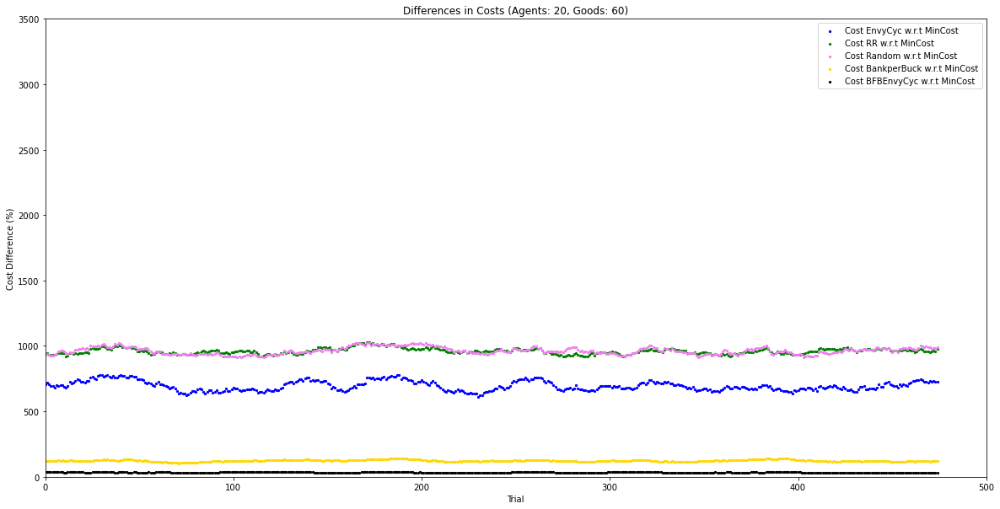

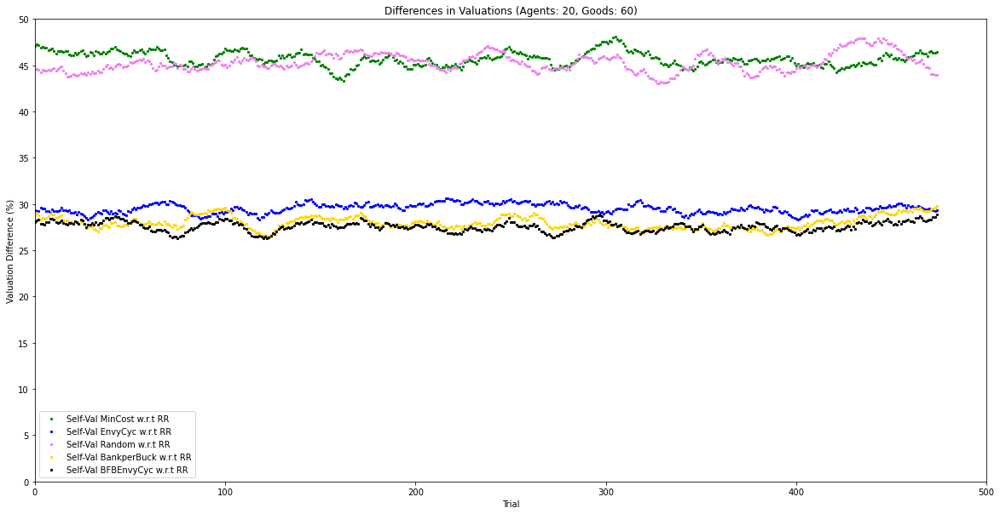

Agents :  20 	 Goods : 70
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 680.19  %
Cost difference of Round Robin w.r.t Min cost : 
 1102.92  %
Cost difference of Random w.r.t Min cost : 
 974.03  %
Cost difference of Bank per Buck w.r.t Min cost : 
 74.35  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 25.98  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 42.11  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 28.5  %
Self Valuation difference of Random w.r.t Round Robin : 
 50.99  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 32.39  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.07  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-------------------------------------------------

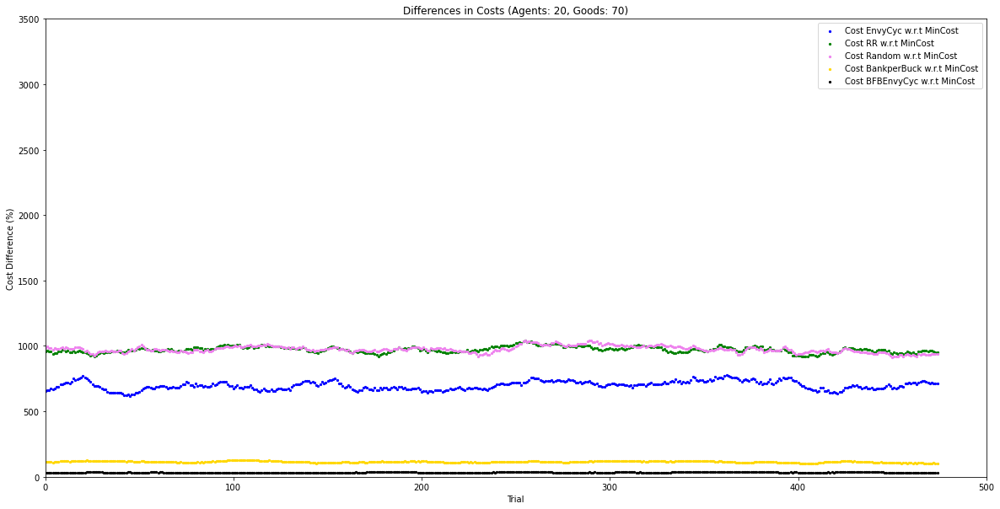

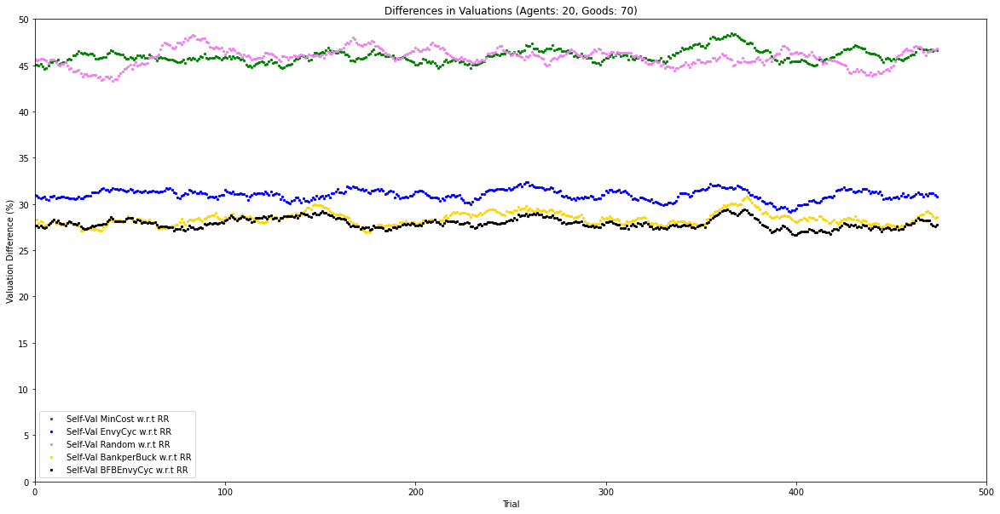

Agents :  20 	 Goods : 80
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 531.16  %
Cost difference of Round Robin w.r.t Min cost : 
 825.6  %
Cost difference of Random w.r.t Min cost : 
 871.26  %
Cost difference of Bank per Buck w.r.t Min cost : 
 117.63  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 24.16  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.53  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 33.7  %
Self Valuation difference of Random w.r.t Round Robin : 
 43.31  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 25.5  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 31.62  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------------

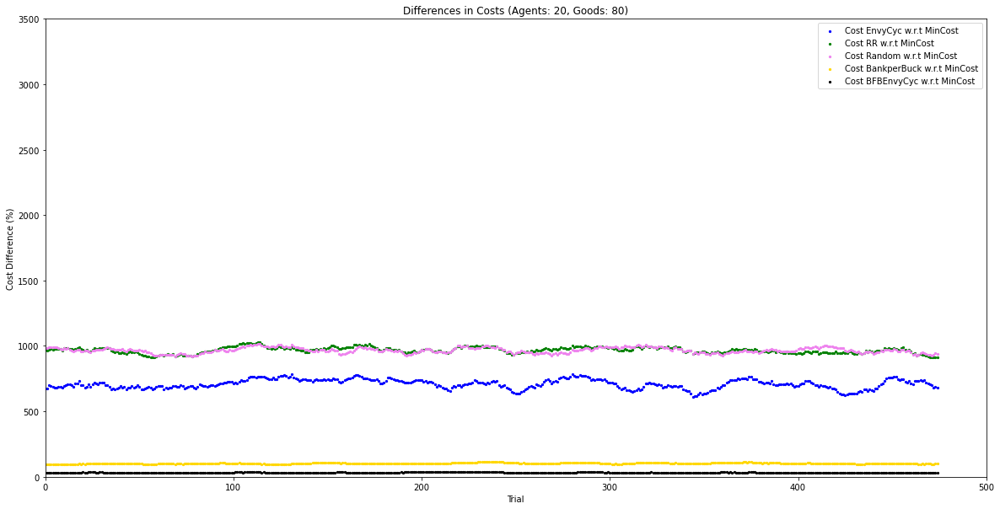

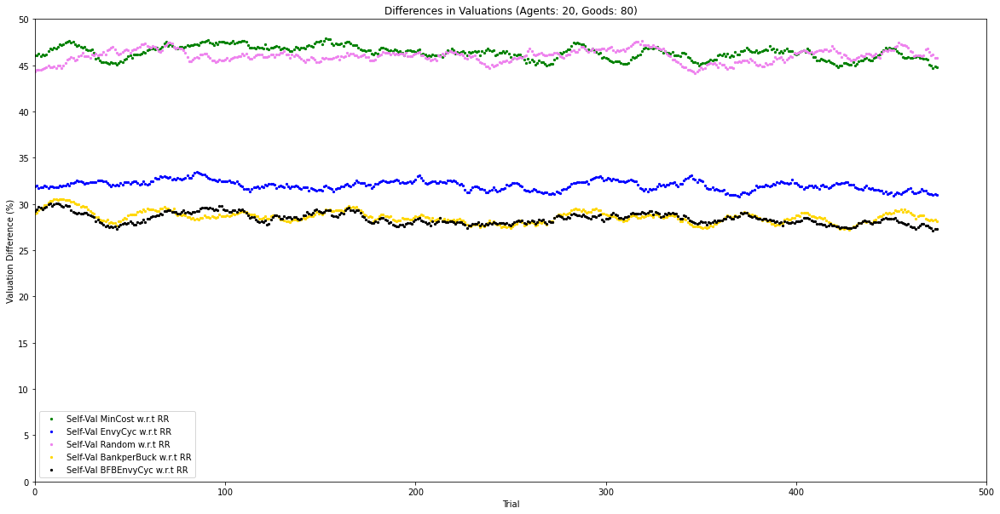

Agents :  20 	 Goods : 90
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 807.0  %
Cost difference of Round Robin w.r.t Min cost : 
 913.29  %
Cost difference of Random w.r.t Min cost : 
 871.98  %
Cost difference of Bank per Buck w.r.t Min cost : 
 89.13  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 38.65  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.2  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 27.95  %
Self Valuation difference of Random w.r.t Round Robin : 
 49.67  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 27.26  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.01  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------------

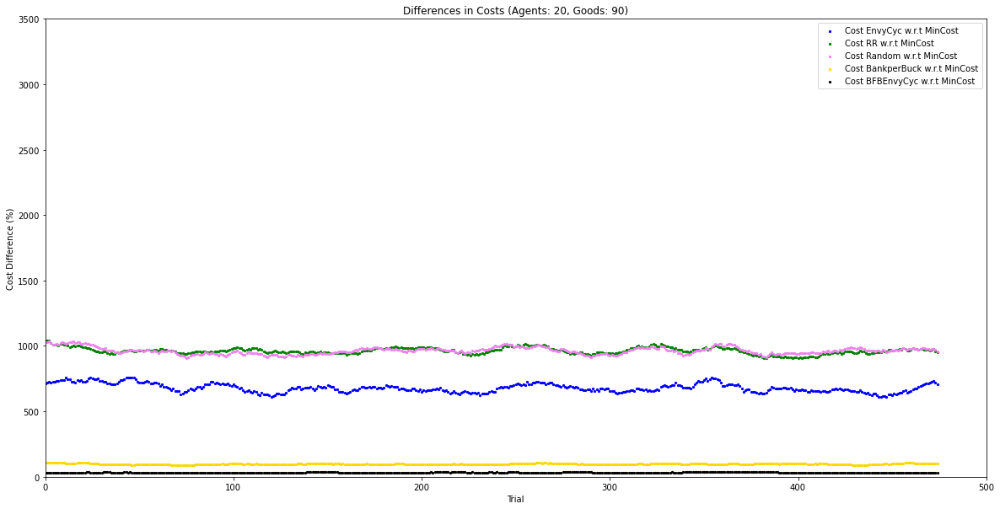

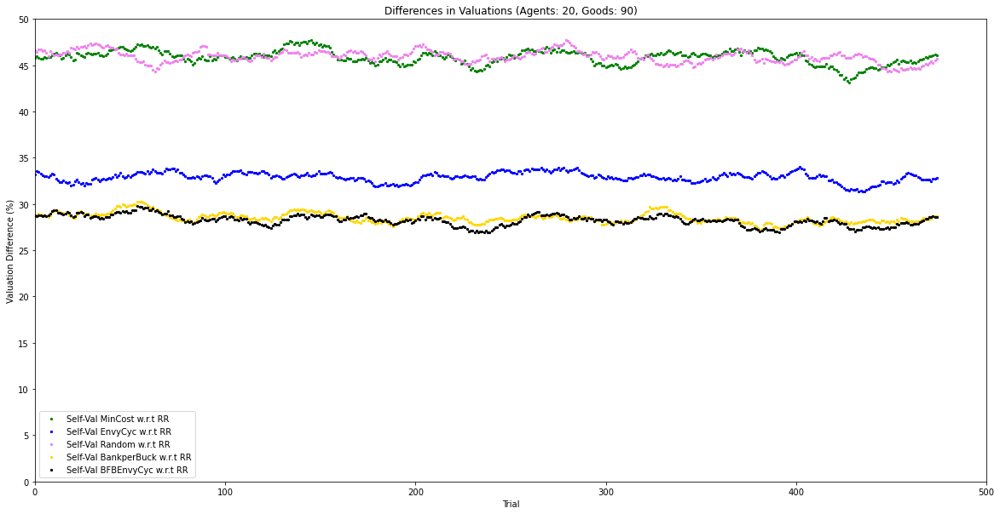

Agents :  20 	 Goods : 100
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 741.3  %
Cost difference of Round Robin w.r.t Min cost : 
 1100.48  %
Cost difference of Random w.r.t Min cost : 
 1050.72  %
Cost difference of Bank per Buck w.r.t Min cost : 
 114.5  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 25.85  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 45.73  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 30.42  %
Self Valuation difference of Random w.r.t Round Robin : 
 42.84  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 26.13  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.49  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

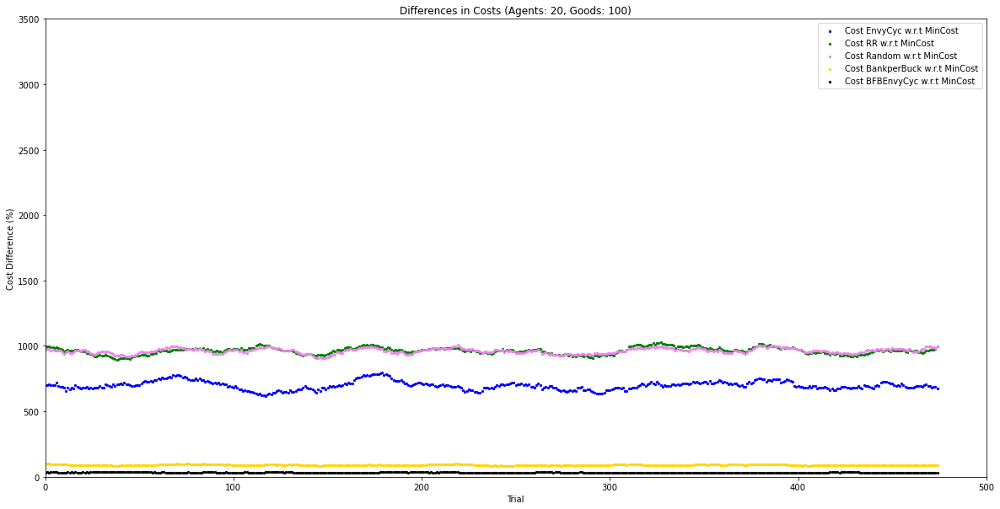

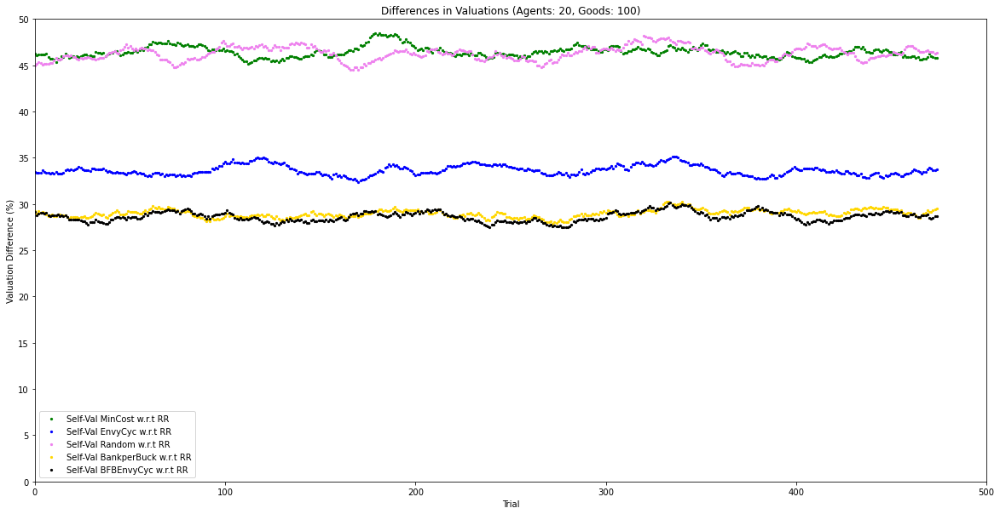

Agents :  20 	 Goods : 110
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 505.23  %
Cost difference of Round Robin w.r.t Min cost : 
 885.19  %
Cost difference of Random w.r.t Min cost : 
 795.99  %
Cost difference of Bank per Buck w.r.t Min cost : 
 120.73  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 18.99  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.82  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 33.6  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.86  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 26.13  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 31.5  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-------------------------------------------------

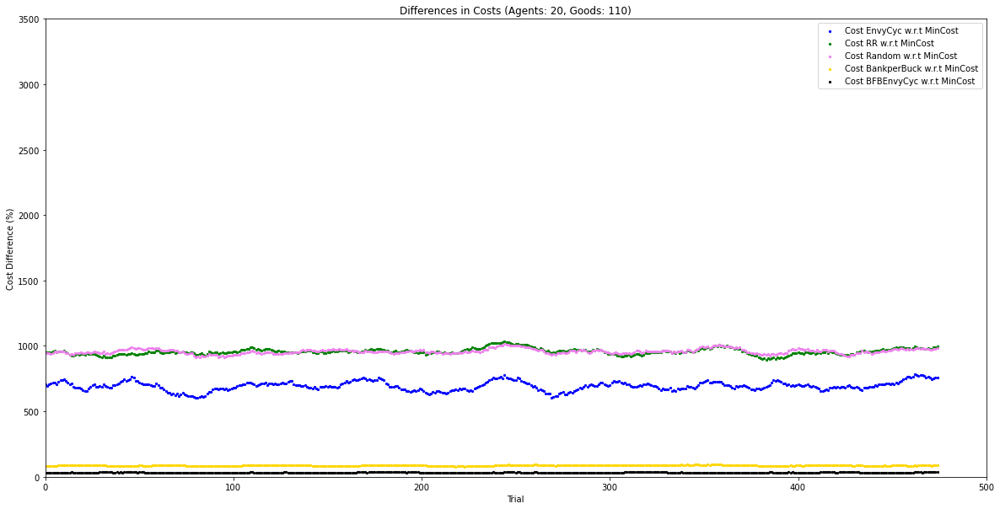

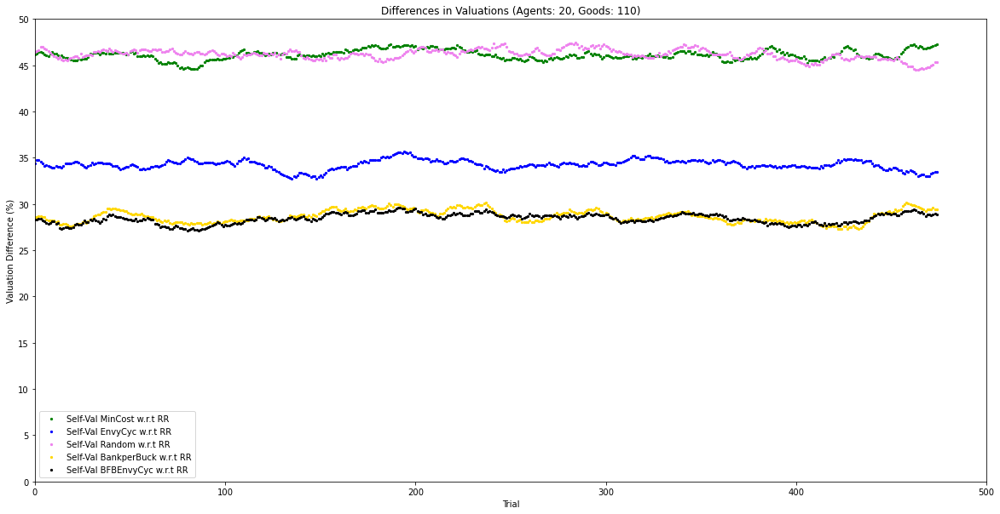

Agents :  20 	 Goods : 120
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 597.26  %
Cost difference of Round Robin w.r.t Min cost : 
 840.1  %
Cost difference of Random w.r.t Min cost : 
 923.35  %
Cost difference of Bank per Buck w.r.t Min cost : 
 73.59  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 25.12  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.01  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 35.31  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.11  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 30.21  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 31.25  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-------------------------------------------------

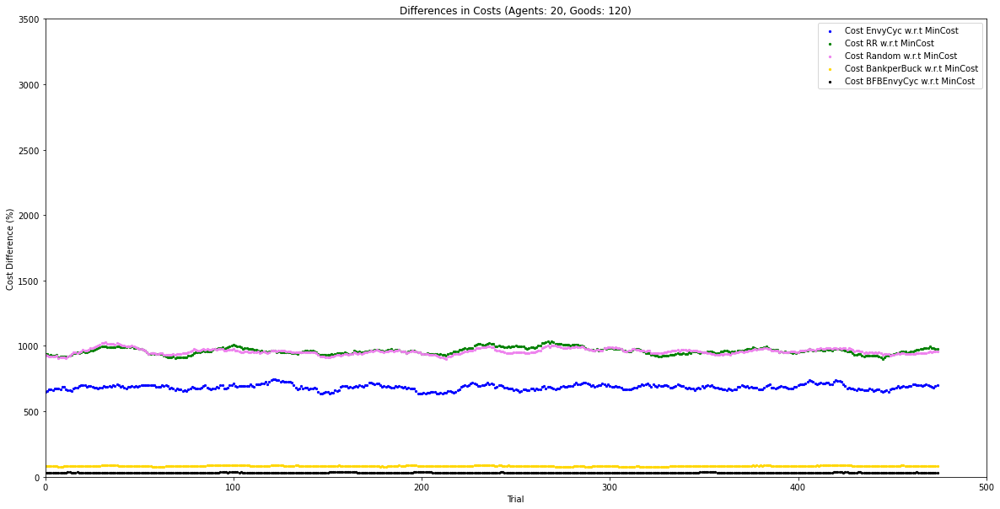

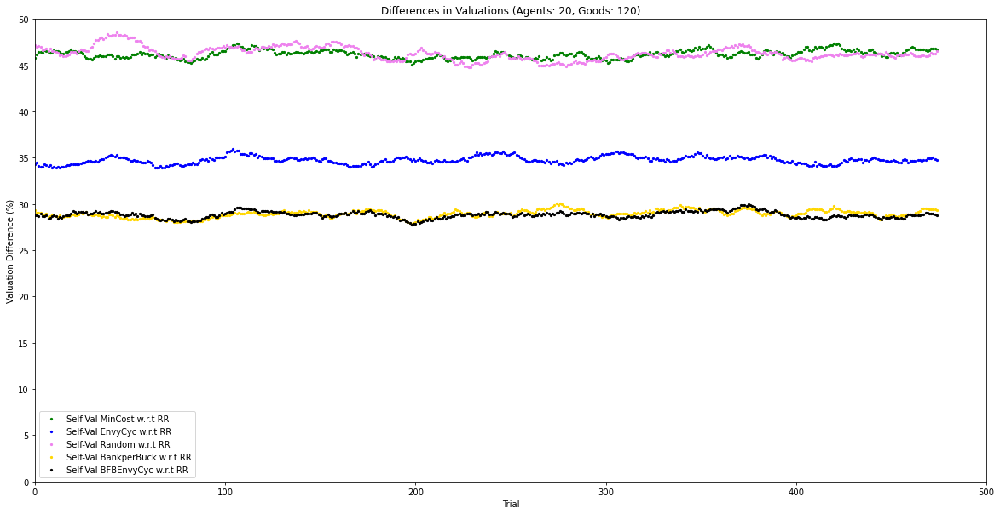

Agents :  20 	 Goods : 130
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 809.25  %
Cost difference of Round Robin w.r.t Min cost : 
 919.14  %
Cost difference of Random w.r.t Min cost : 
 846.57  %
Cost difference of Bank per Buck w.r.t Min cost : 
 72.57  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 40.67  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 45.01  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 30.44  %
Self Valuation difference of Random w.r.t Round Robin : 
 51.38  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 25.29  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 26.25  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

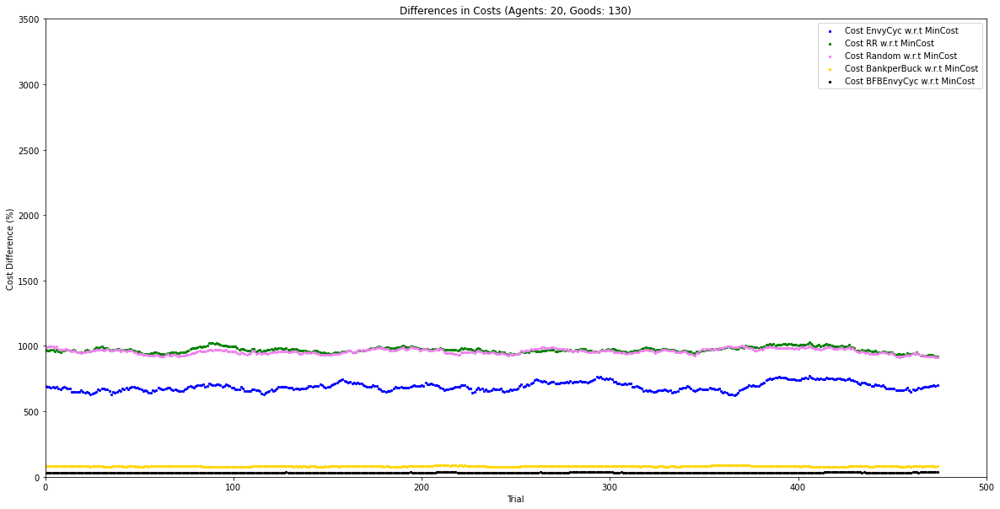

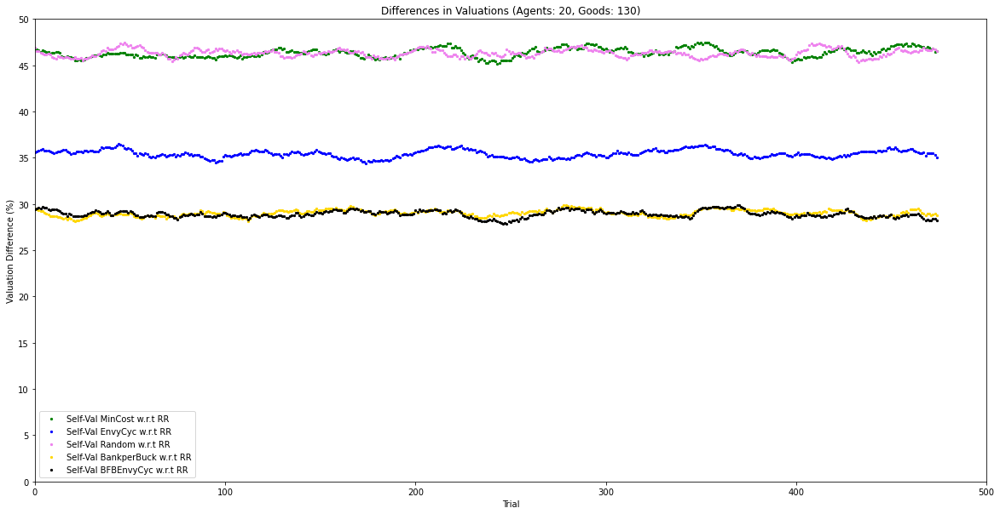

Agents :  20 	 Goods : 140
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 584.46  %
Cost difference of Round Robin w.r.t Min cost : 
 977.07  %
Cost difference of Random w.r.t Min cost : 
 944.04  %
Cost difference of Bank per Buck w.r.t Min cost : 
 70.44  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 33.03  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 45.24  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 34.6  %
Self Valuation difference of Random w.r.t Round Robin : 
 47.99  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.52  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.57  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-------------------------------------------------

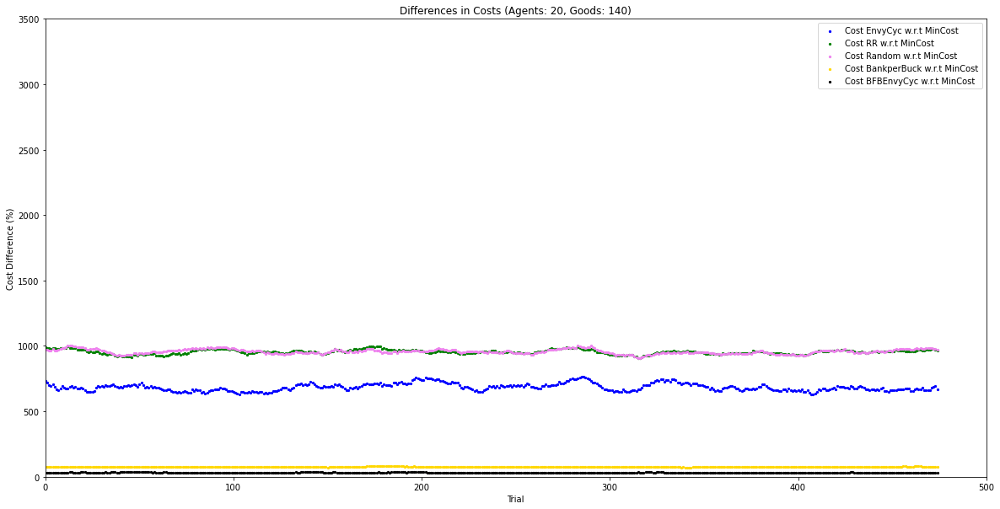

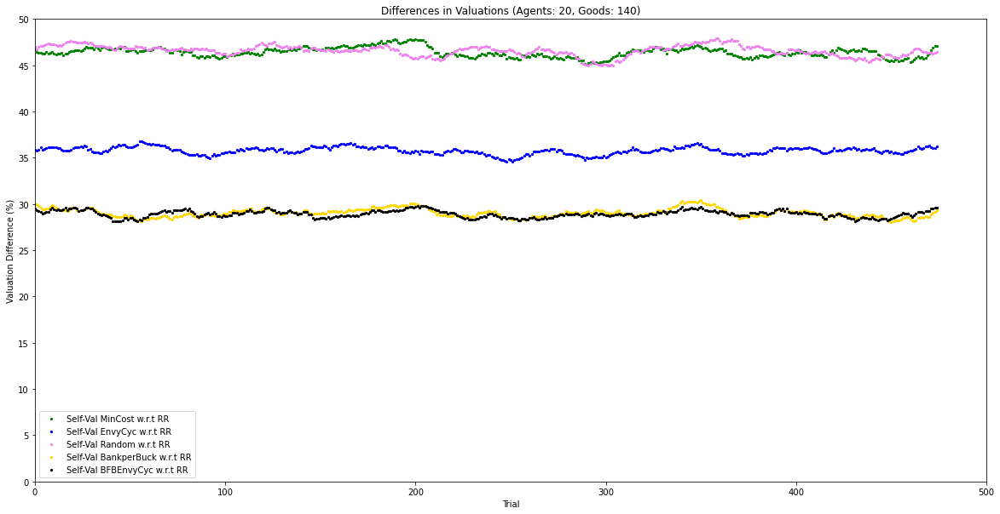

Agents :  25 	 Goods : 50
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 978.84  %
Cost difference of Round Robin w.r.t Min cost : 
 1262.96  %
Cost difference of Random w.r.t Min cost : 
 1367.72  %
Cost difference of Bank per Buck w.r.t Min cost : 
 107.94  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 28.04  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.15  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 24.53  %
Self Valuation difference of Random w.r.t Round Robin : 
 48.02  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.08  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 31.28  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

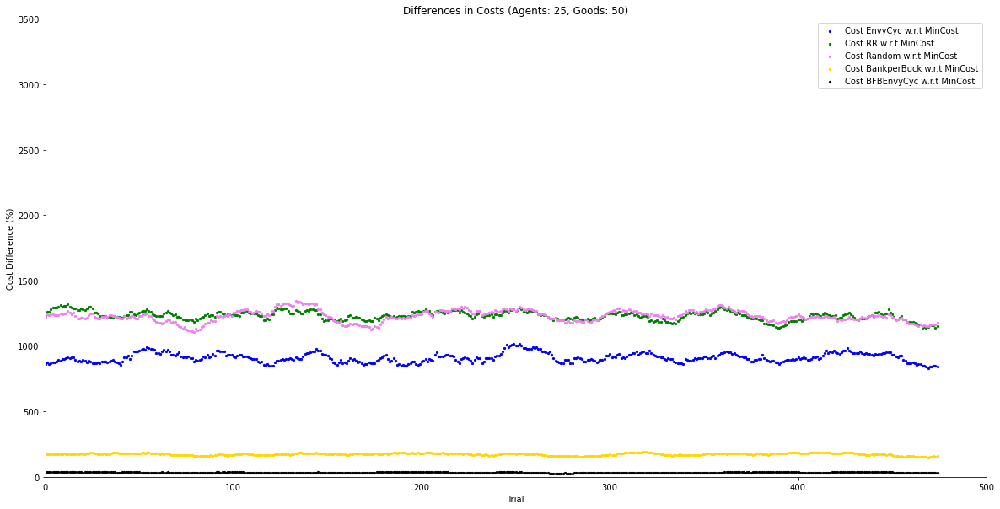

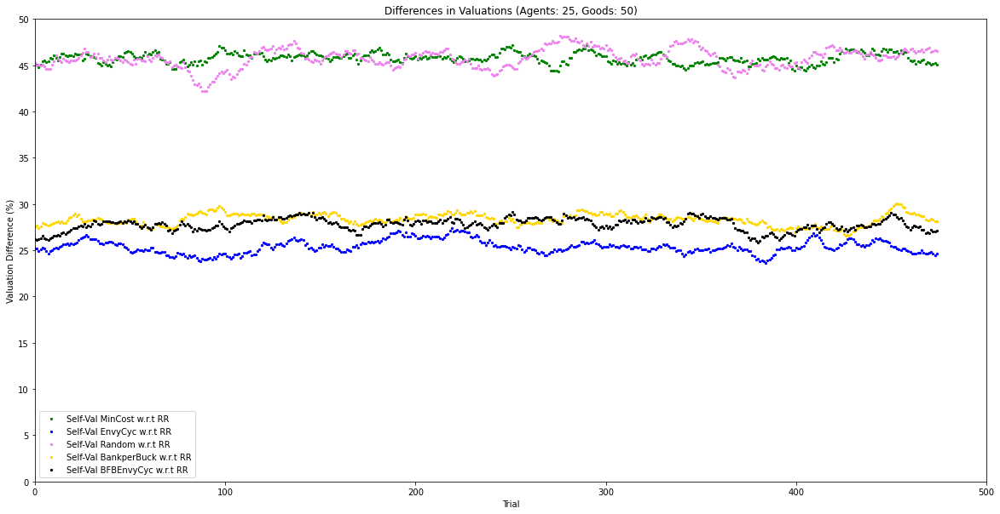

Agents :  25 	 Goods : 60
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 816.33  %
Cost difference of Round Robin w.r.t Min cost : 
 1101.63  %
Cost difference of Random w.r.t Min cost : 
 1175.51  %
Cost difference of Bank per Buck w.r.t Min cost : 
 106.12  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 21.23  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 43.58  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 24.69  %
Self Valuation difference of Random w.r.t Round Robin : 
 49.96  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 26.08  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 23.29  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

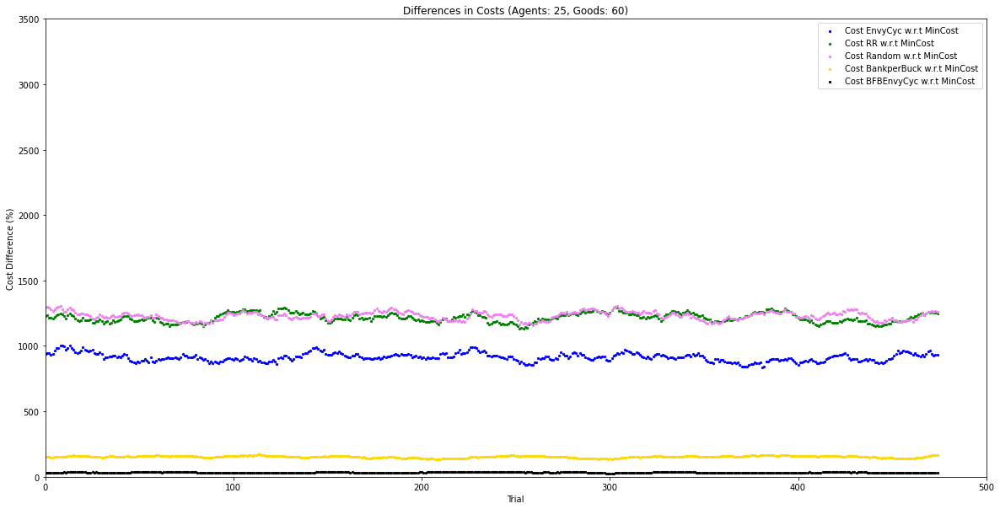

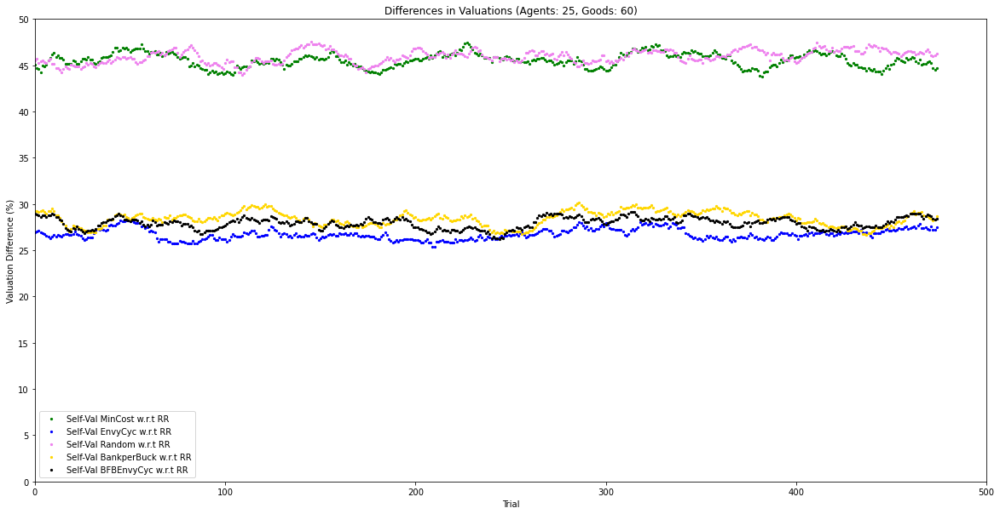

Agents :  25 	 Goods : 70
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 794.54  %
Cost difference of Round Robin w.r.t Min cost : 
 951.19  %
Cost difference of Random w.r.t Min cost : 
 1161.09  %
Cost difference of Bank per Buck w.r.t Min cost : 
 103.76  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 32.42  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.95  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 26.12  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.4  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 27.18  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.05  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

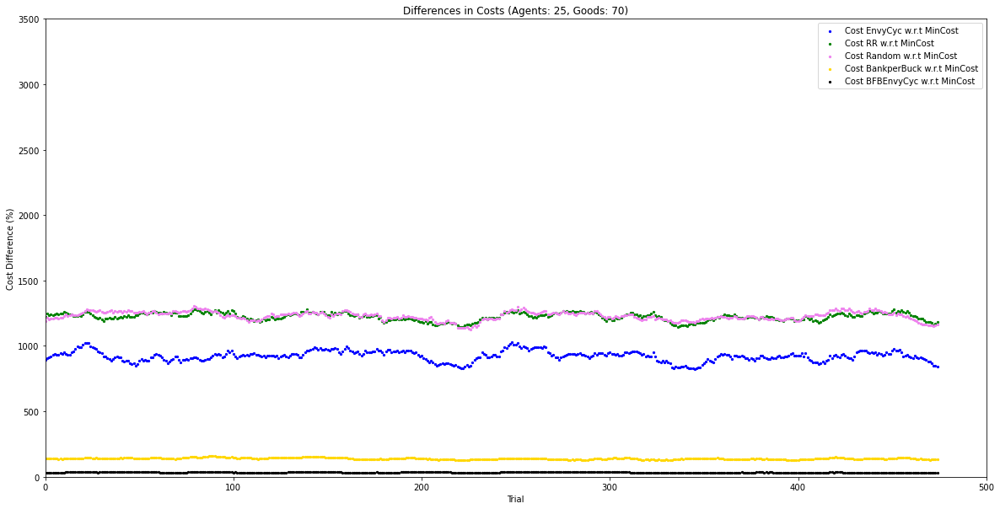

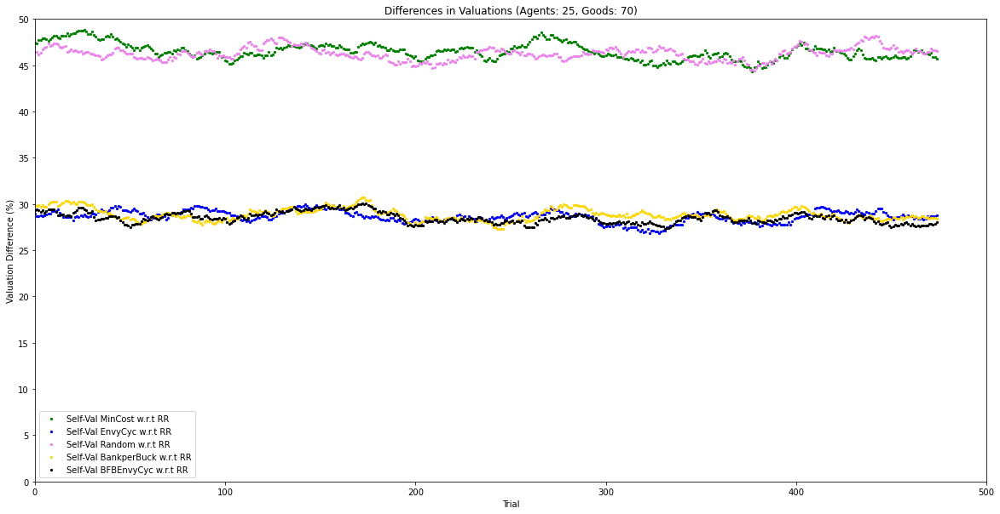

Agents :  25 	 Goods : 80
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 750.85  %
Cost difference of Round Robin w.r.t Min cost : 
 988.35  %
Cost difference of Random w.r.t Min cost : 
 1057.95  %
Cost difference of Bank per Buck w.r.t Min cost : 
 79.83  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 25.85  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.53  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 30.39  %
Self Valuation difference of Random w.r.t Round Robin : 
 40.65  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.33  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 26.76  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

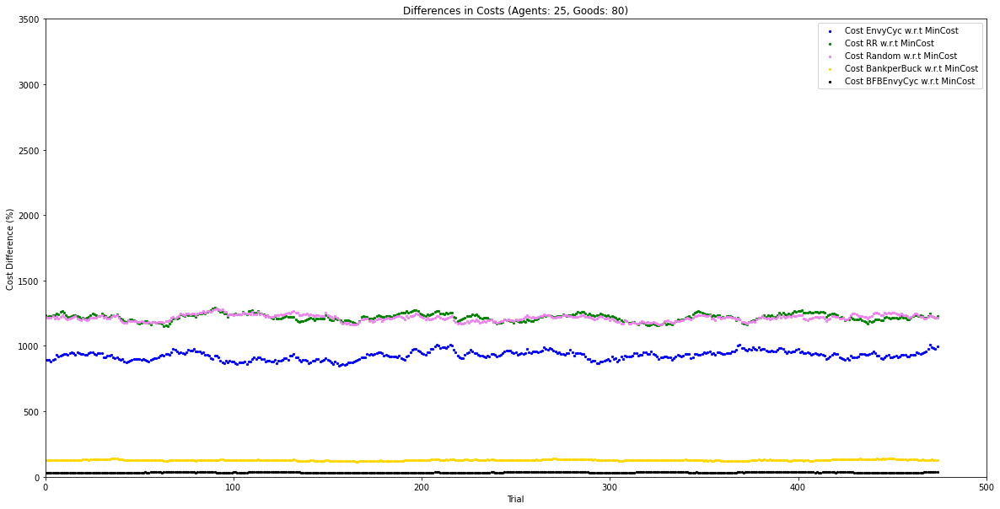

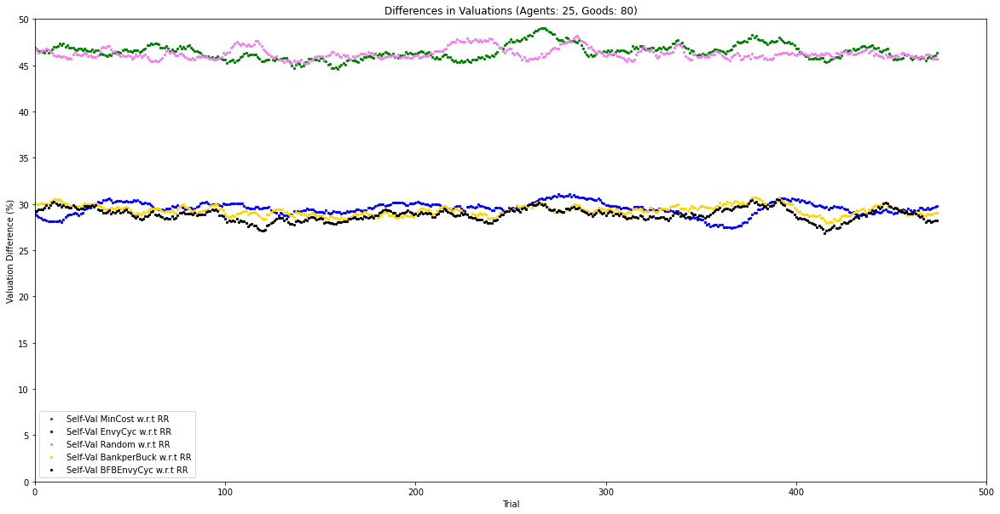

Agents :  25 	 Goods : 90
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 807.5  %
Cost difference of Round Robin w.r.t Min cost : 
 1060.0  %
Cost difference of Random w.r.t Min cost : 
 1002.5  %
Cost difference of Bank per Buck w.r.t Min cost : 
 126.39  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 33.34  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 52.59  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 29.08  %
Self Valuation difference of Random w.r.t Round Robin : 
 50.23  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 33.89  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 34.12  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-------------------------------------------------

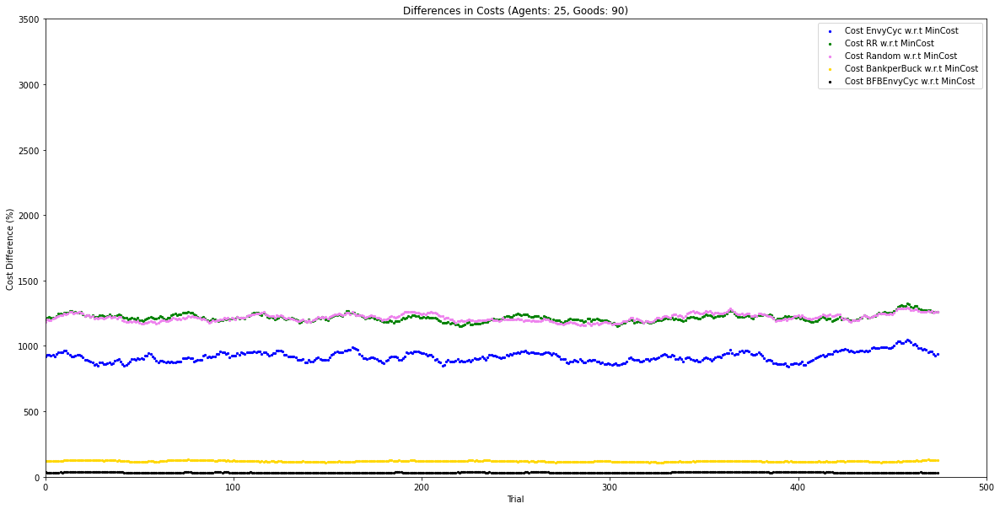

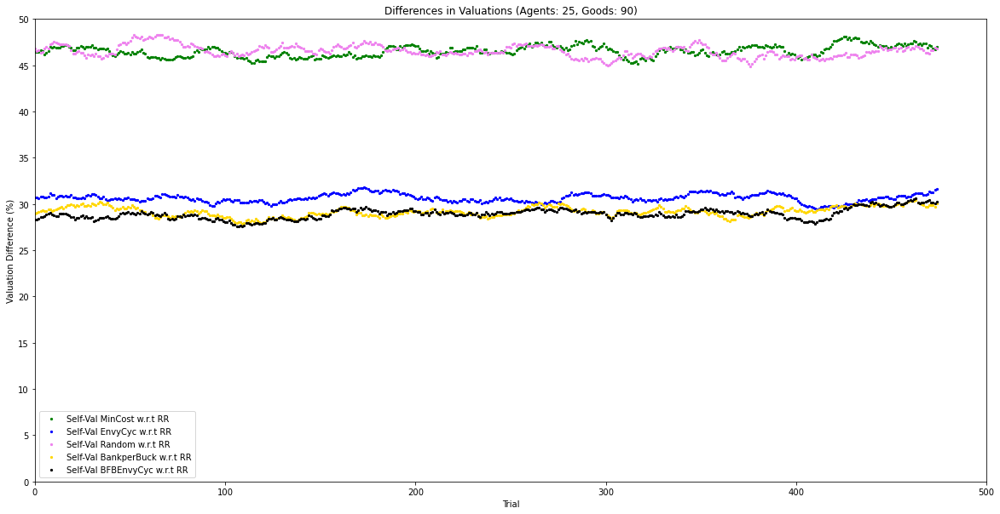

Agents :  25 	 Goods : 100
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 706.98  %
Cost difference of Round Robin w.r.t Min cost : 
 1172.35  %
Cost difference of Random w.r.t Min cost : 
 1262.53  %
Cost difference of Bank per Buck w.r.t Min cost : 
 75.71  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 35.92  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 45.45  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 36.36  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.16  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 27.25  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.13  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

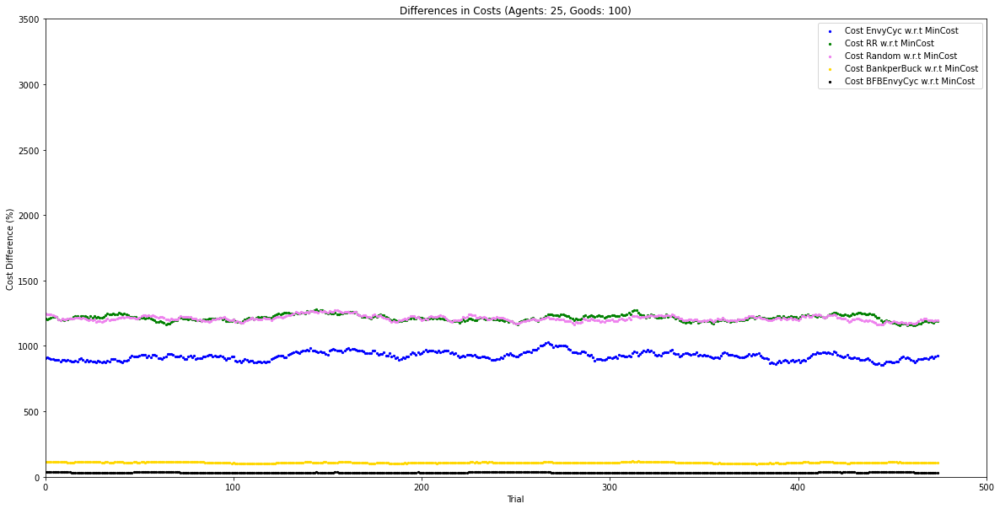

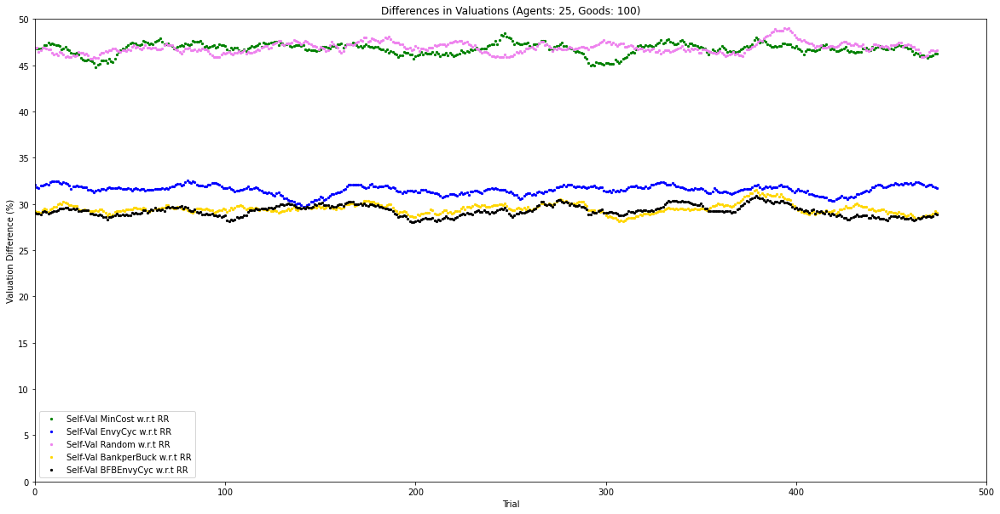

Agents :  25 	 Goods : 110
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 999.76  %
Cost difference of Round Robin w.r.t Min cost : 
 1197.8  %
Cost difference of Random w.r.t Min cost : 
 1286.31  %
Cost difference of Bank per Buck w.r.t Min cost : 
 77.02  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 27.39  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.65  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 31.68  %
Self Valuation difference of Random w.r.t Round Robin : 
 47.79  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.24  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 26.57  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

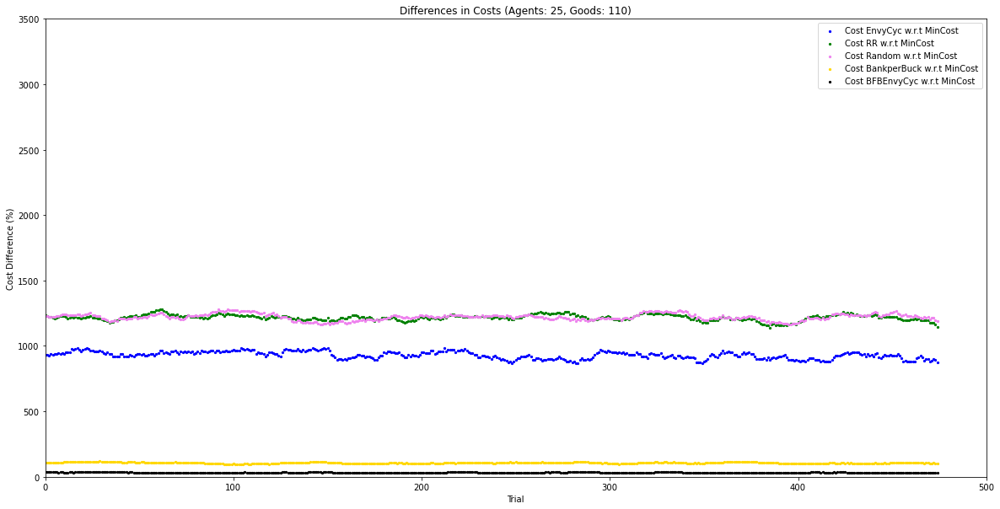

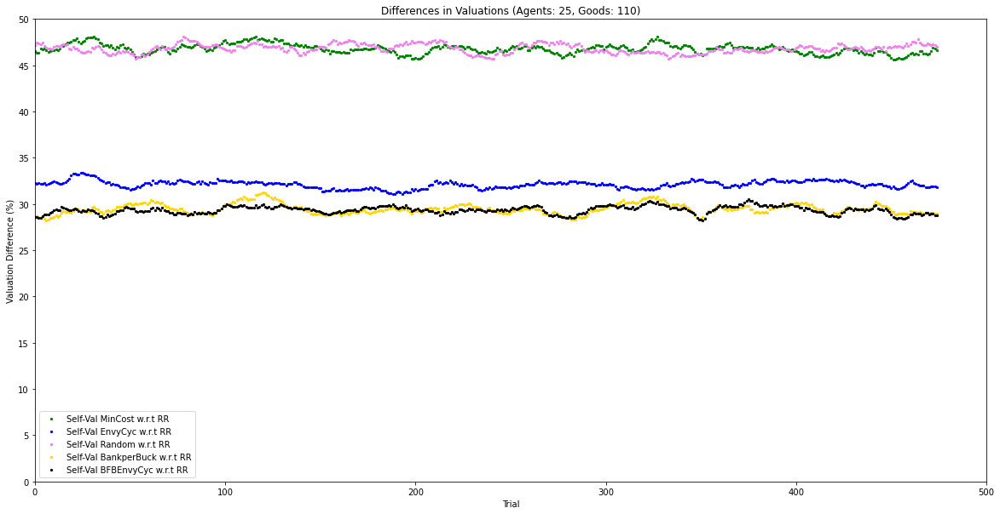

Agents :  25 	 Goods : 120
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 836.27  %
Cost difference of Round Robin w.r.t Min cost : 
 1174.39  %
Cost difference of Random w.r.t Min cost : 
 1183.61  %
Cost difference of Bank per Buck w.r.t Min cost : 
 94.88  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 34.63  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 43.9  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 33.12  %
Self Valuation difference of Random w.r.t Round Robin : 
 53.63  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 25.69  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.7  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

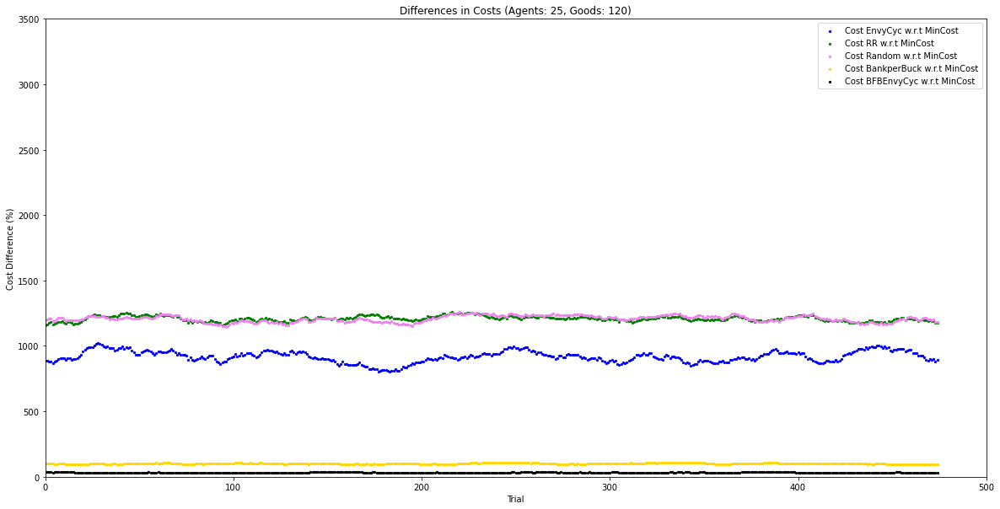

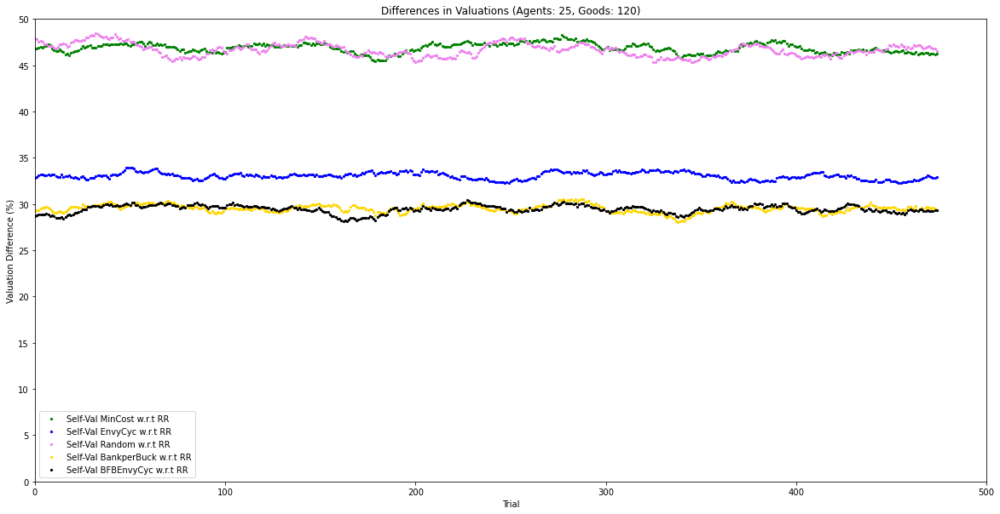

Agents :  25 	 Goods : 130
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 759.47  %
Cost difference of Round Robin w.r.t Min cost : 
 1143.34  %
Cost difference of Random w.r.t Min cost : 
 1223.26  %
Cost difference of Bank per Buck w.r.t Min cost : 
 98.88  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 23.46  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 43.38  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 31.69  %
Self Valuation difference of Random w.r.t Round Robin : 
 47.38  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.47  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.98  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

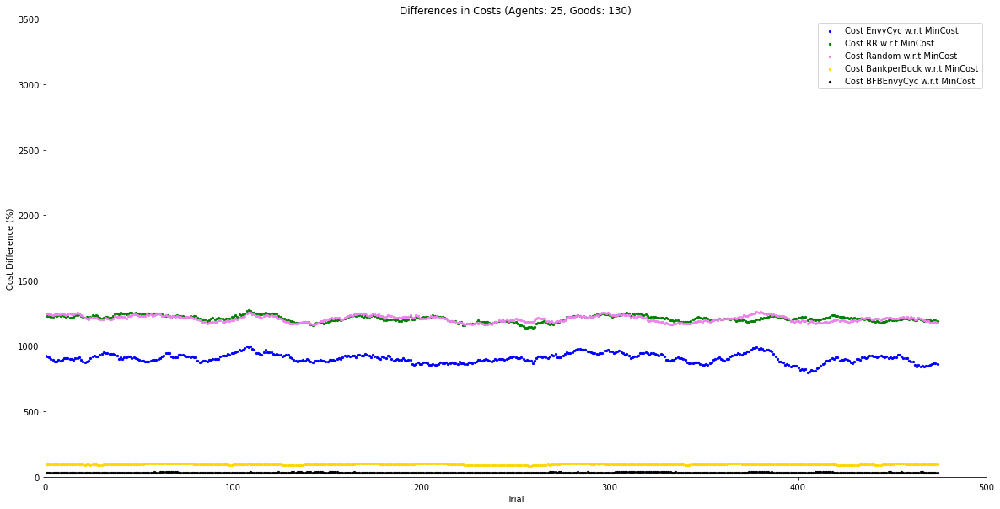

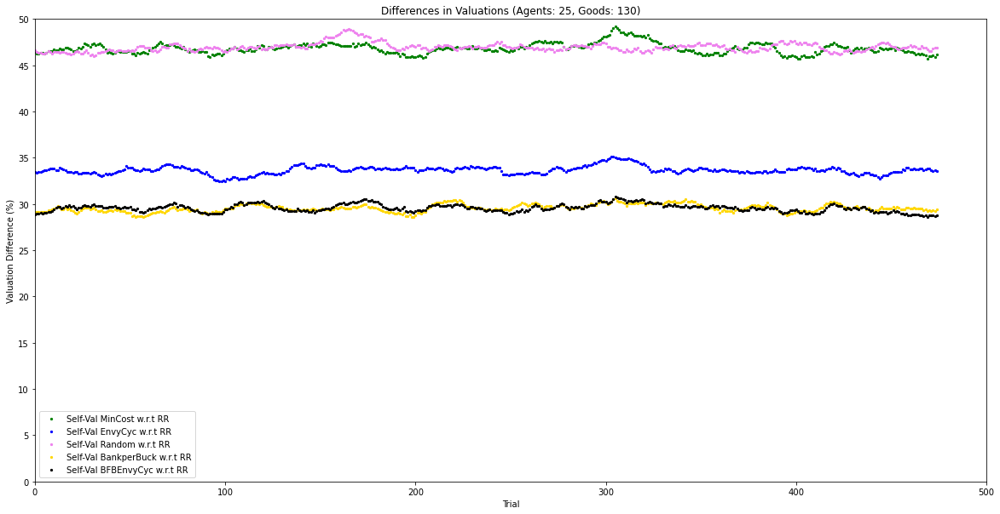

Agents :  25 	 Goods : 140
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 797.6  %
Cost difference of Round Robin w.r.t Min cost : 
 1055.82  %
Cost difference of Random w.r.t Min cost : 
 1218.48  %
Cost difference of Bank per Buck w.r.t Min cost : 
 100.56  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 37.34  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 45.05  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 37.6  %
Self Valuation difference of Random w.r.t Round Robin : 
 51.53  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 27.87  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 26.79  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

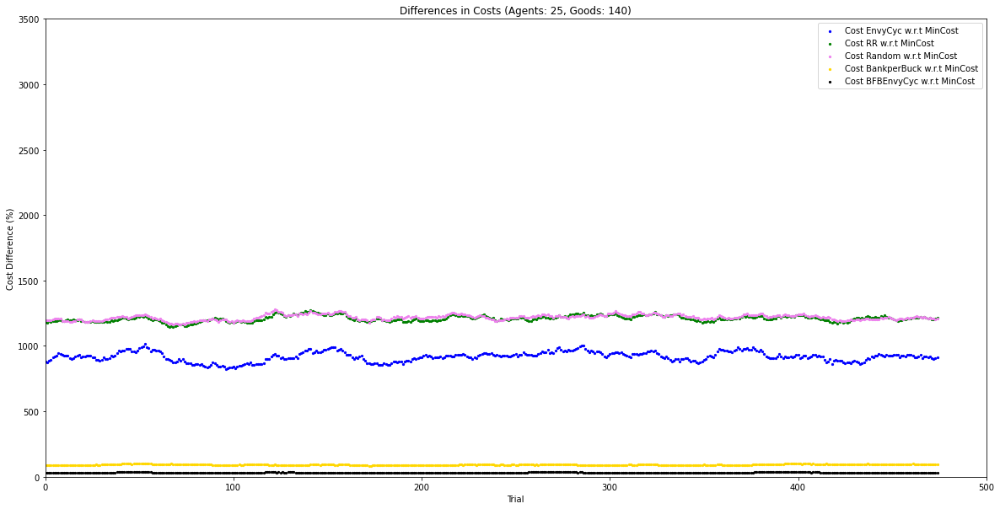

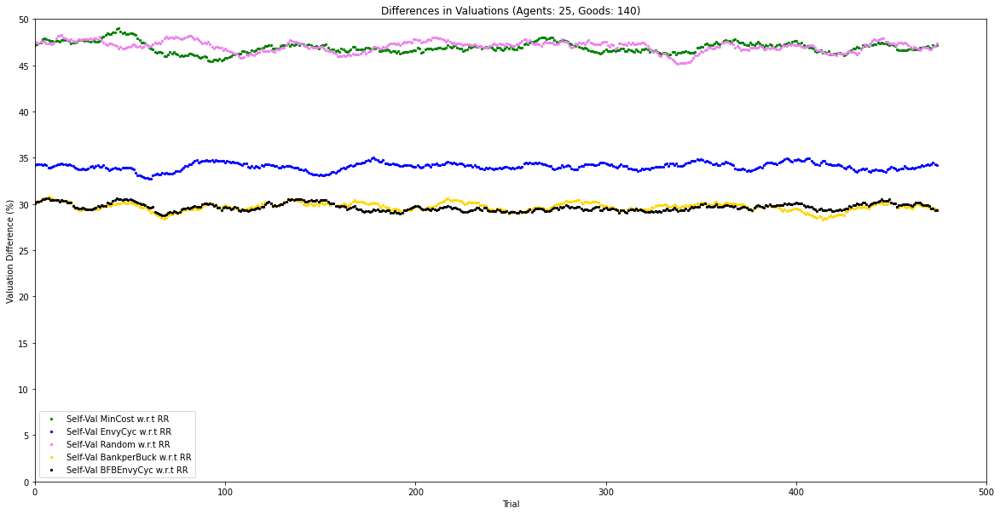

Agents :  30 	 Goods : 50
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 951.78  %
Cost difference of Round Robin w.r.t Min cost : 
 1125.89  %
Cost difference of Random w.r.t Min cost : 
 1196.95  %
Cost difference of Bank per Buck w.r.t Min cost : 
 139.6  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 24.37  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 43.71  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 30.59  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.38  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 22.33  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 26.72  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

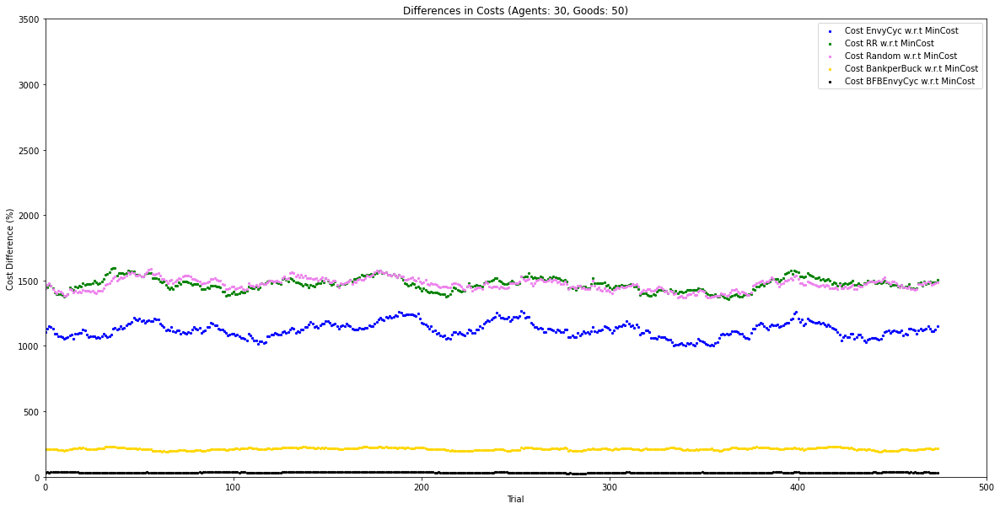

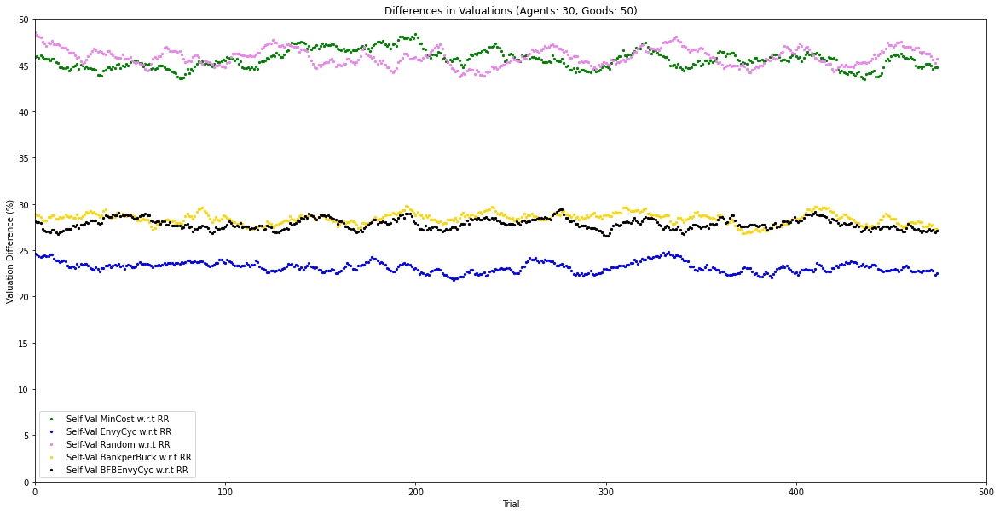

Agents :  30 	 Goods : 60
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 969.16  %
Cost difference of Round Robin w.r.t Min cost : 
 1210.75  %
Cost difference of Random w.r.t Min cost : 
 1105.14  %
Cost difference of Bank per Buck w.r.t Min cost : 
 157.48  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 14.02  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 43.58  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 21.59  %
Self Valuation difference of Random w.r.t Round Robin : 
 37.58  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 25.24  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.85  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

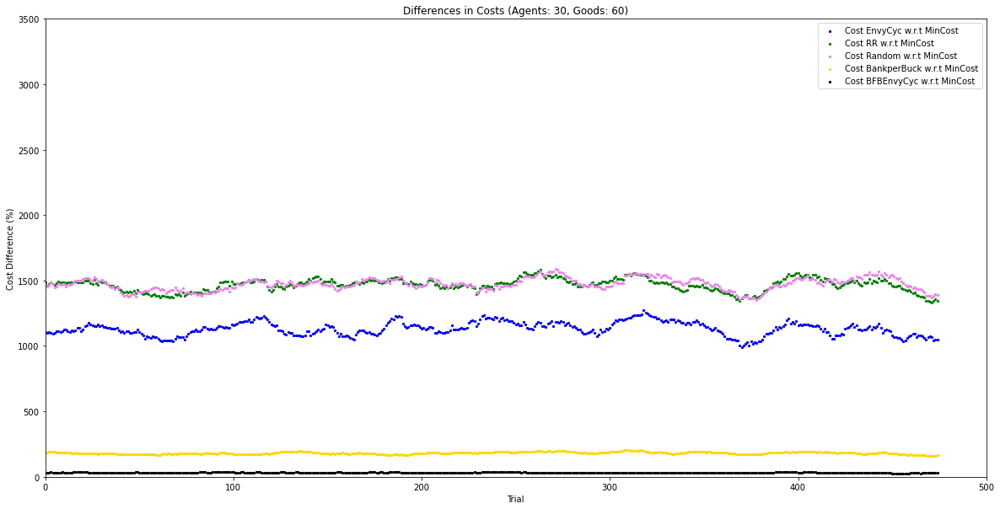

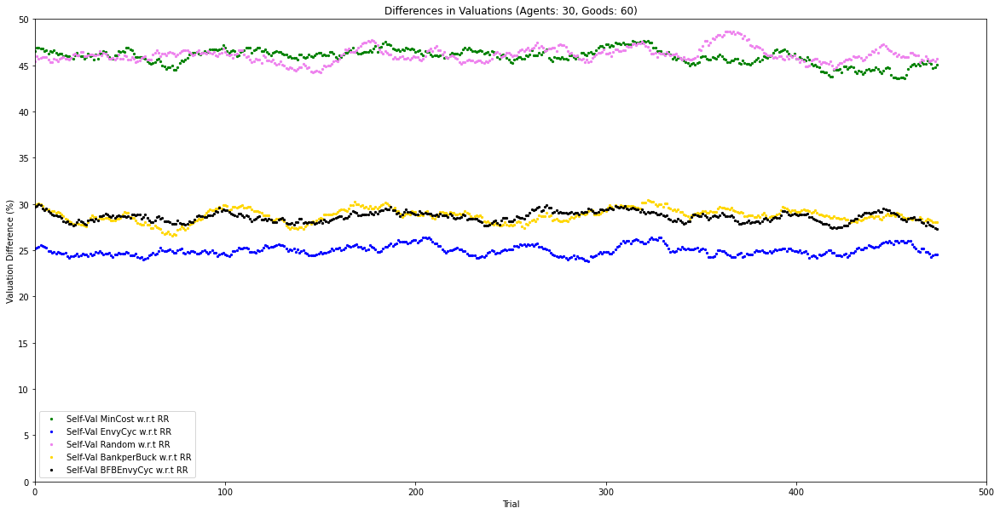

Agents :  30 	 Goods : 70
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1105.61  %
Cost difference of Round Robin w.r.t Min cost : 
 1616.82  %
Cost difference of Random w.r.t Min cost : 
 1490.65  %
Cost difference of Bank per Buck w.r.t Min cost : 
 205.61  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 36.45  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 43.98  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 26.99  %
Self Valuation difference of Random w.r.t Round Robin : 
 43.8  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 30.29  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.61  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

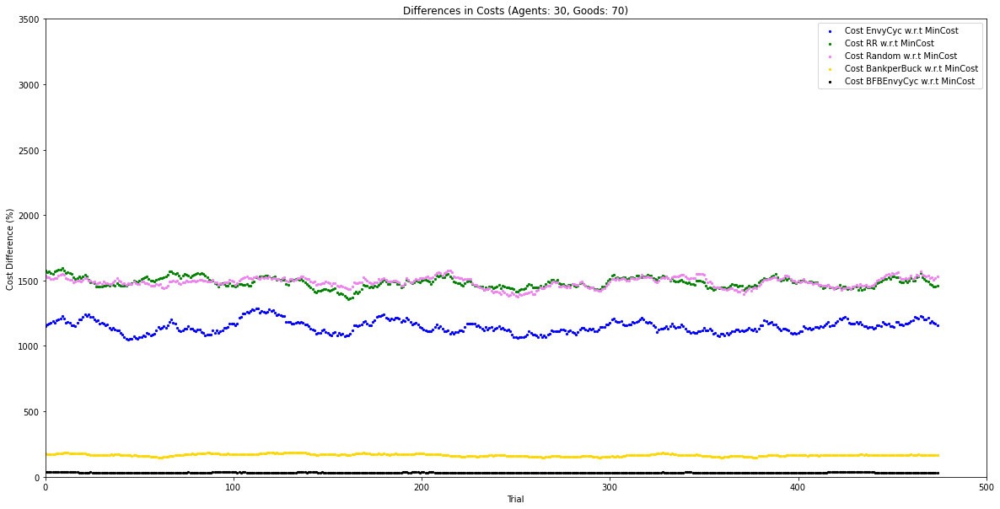

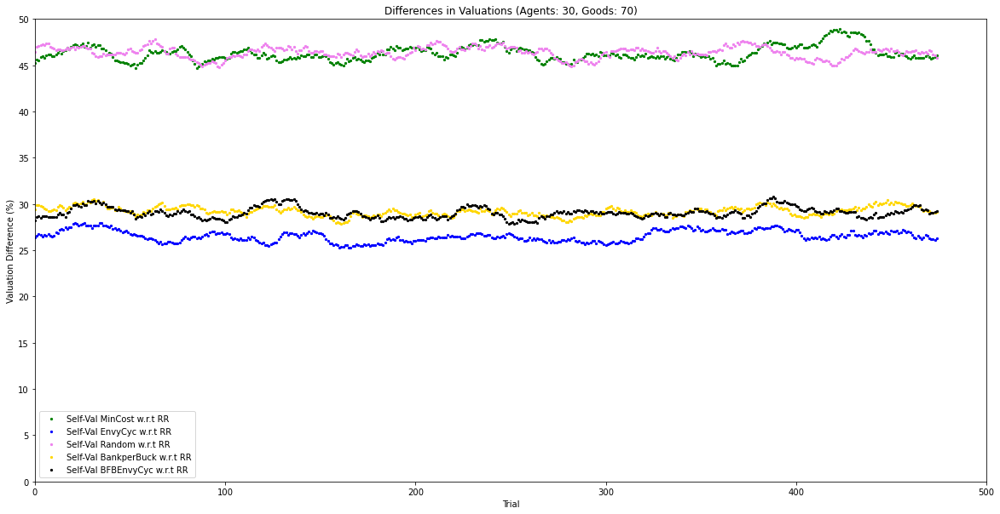

Agents :  30 	 Goods : 80
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1580.37  %
Cost difference of Round Robin w.r.t Min cost : 
 1900.47  %
Cost difference of Random w.r.t Min cost : 
 1719.16  %
Cost difference of Bank per Buck w.r.t Min cost : 
 163.56  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 43.46  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.31  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 23.96  %
Self Valuation difference of Random w.r.t Round Robin : 
 48.41  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 32.37  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 31.95  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

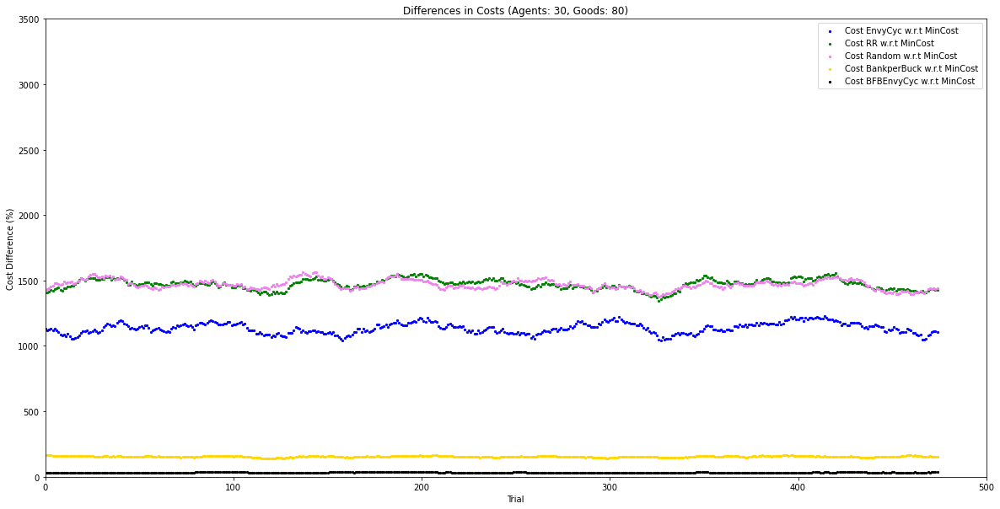

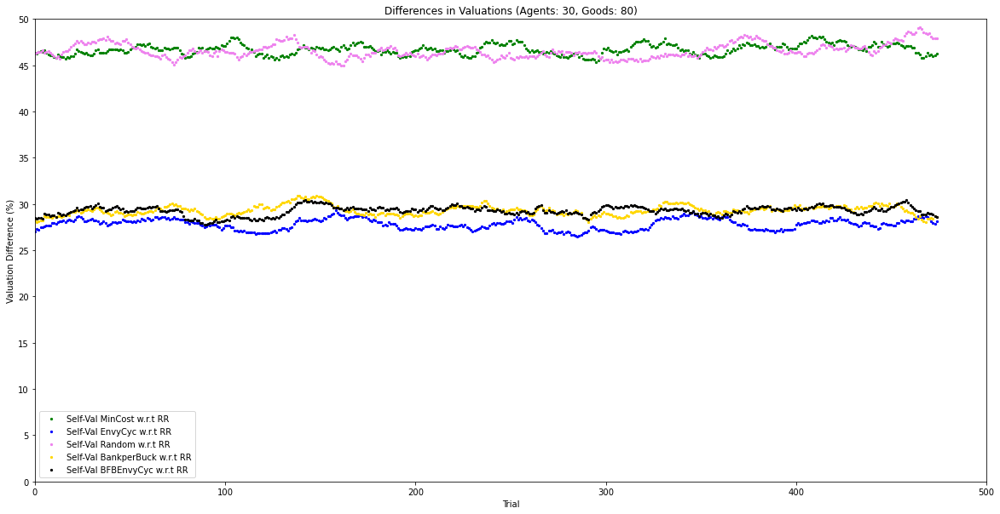

Agents :  30 	 Goods : 90
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1286.41  %
Cost difference of Round Robin w.r.t Min cost : 
 1647.74  %
Cost difference of Random w.r.t Min cost : 
 1490.94  %
Cost difference of Bank per Buck w.r.t Min cost : 
 193.38  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 34.15  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.51  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 30.16  %
Self Valuation difference of Random w.r.t Round Robin : 
 48.99  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.94  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 30.71  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

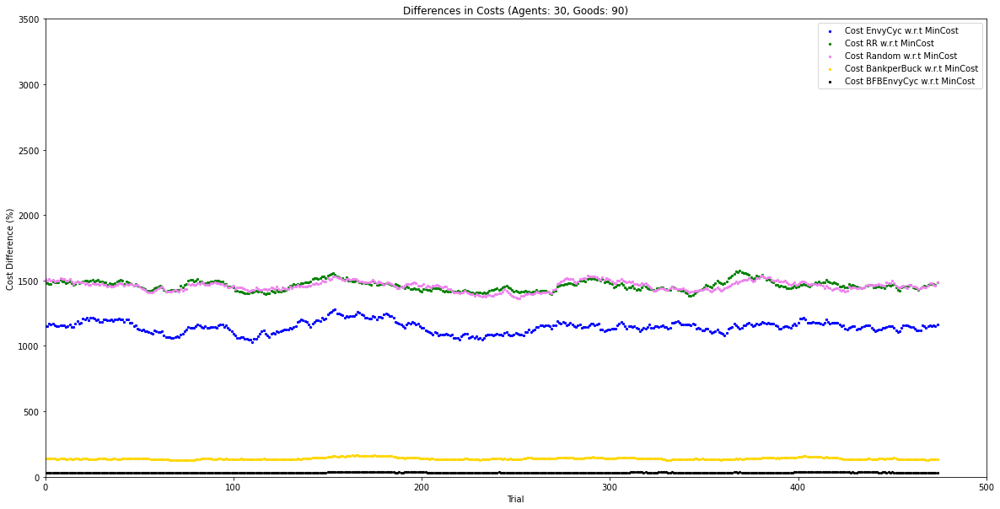

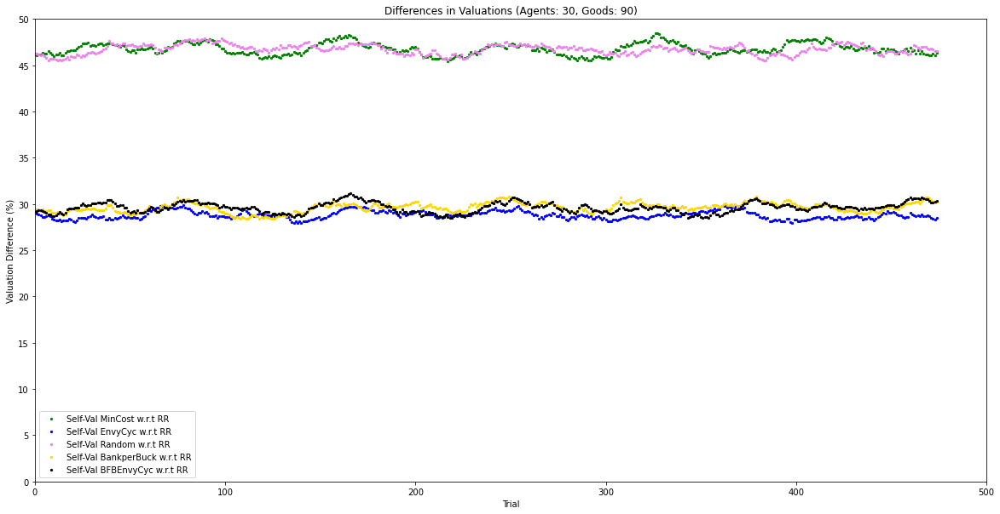

Agents :  30 	 Goods : 100
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1031.75  %
Cost difference of Round Robin w.r.t Min cost : 
 1341.54  %
Cost difference of Random w.r.t Min cost : 
 1529.08  %
Cost difference of Bank per Buck w.r.t Min cost : 
 108.61  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 25.82  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.98  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 30.23  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.54  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.89  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.7  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

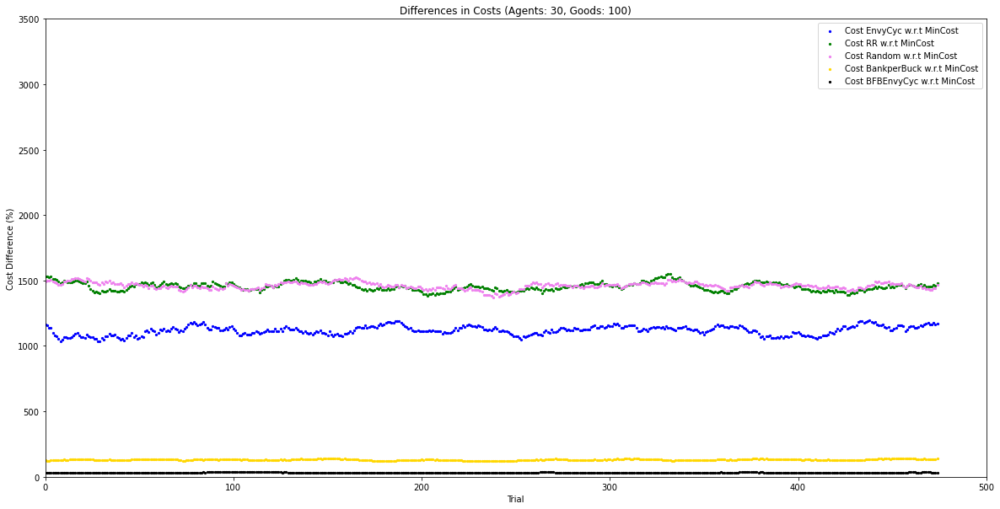

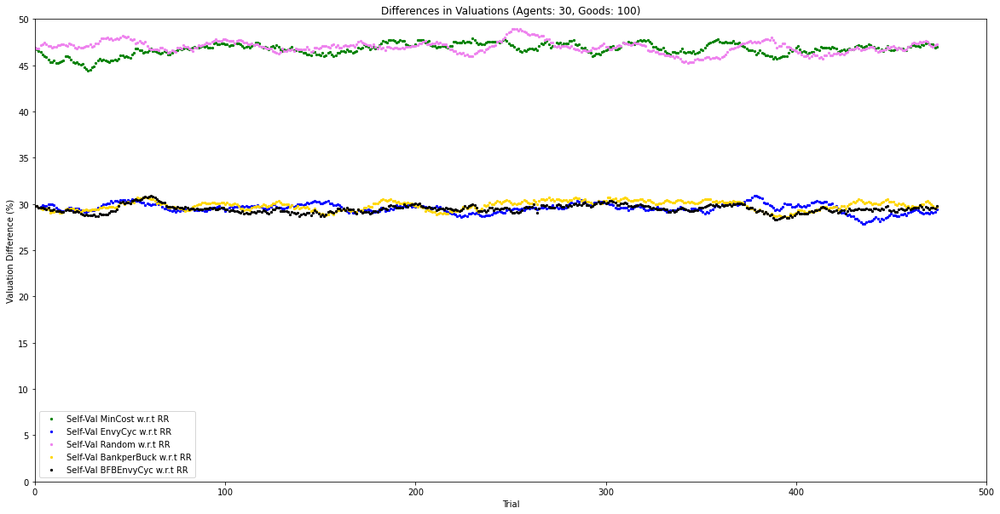

Agents :  30 	 Goods : 110
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1371.78  %
Cost difference of Round Robin w.r.t Min cost : 
 1406.44  %
Cost difference of Random w.r.t Min cost : 
 1566.56  %
Cost difference of Bank per Buck w.r.t Min cost : 
 154.61  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 42.03  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 49.84  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 29.46  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.67  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 30.05  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 30.32  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------

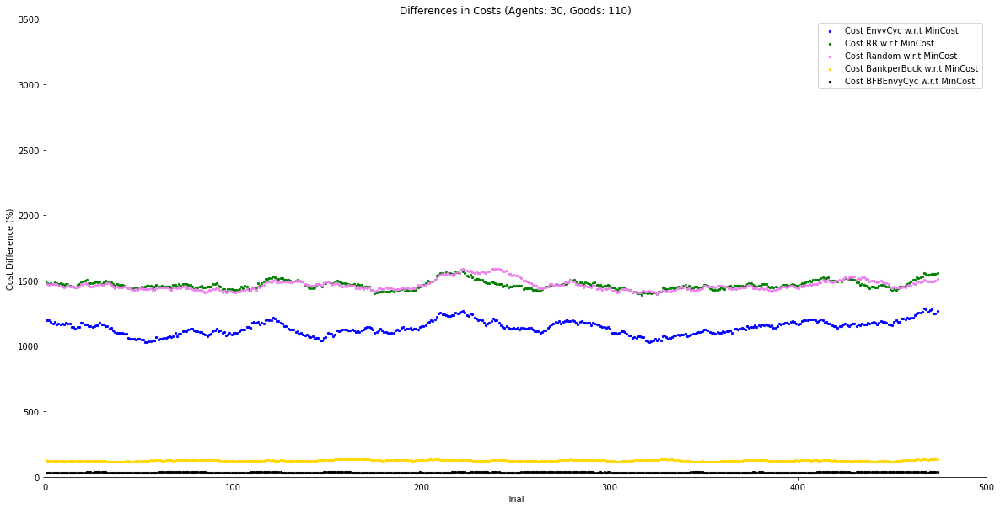

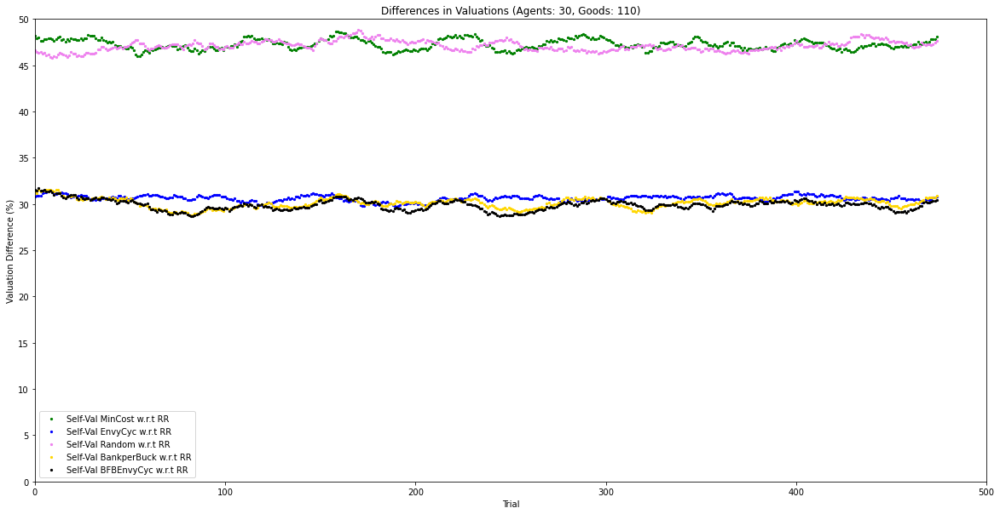

Agents :  30 	 Goods : 120
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1400.54  %
Cost difference of Round Robin w.r.t Min cost : 
 1495.92  %
Cost difference of Random w.r.t Min cost : 
 1745.92  %
Cost difference of Bank per Buck w.r.t Min cost : 
 109.79  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 43.75  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 48.68  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 31.89  %
Self Valuation difference of Random w.r.t Round Robin : 
 49.61  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.54  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.66  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------

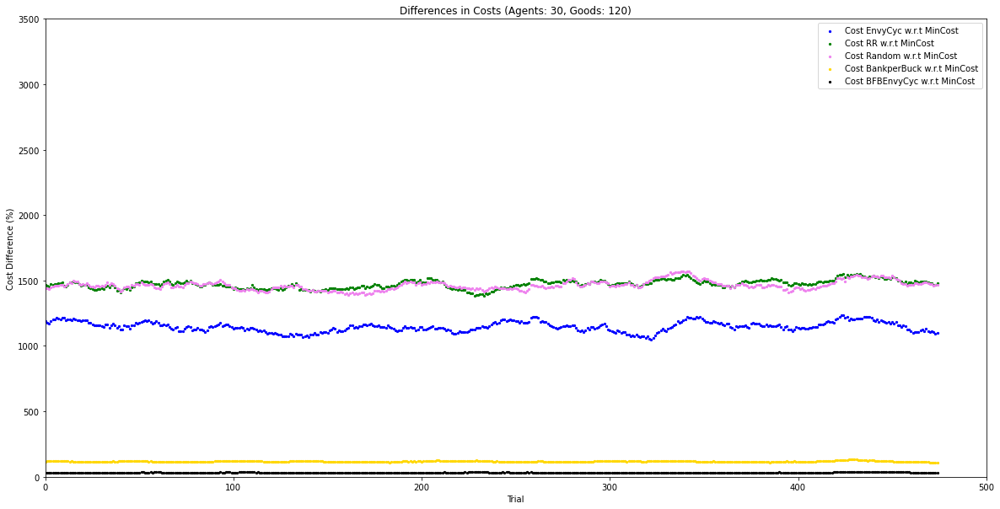

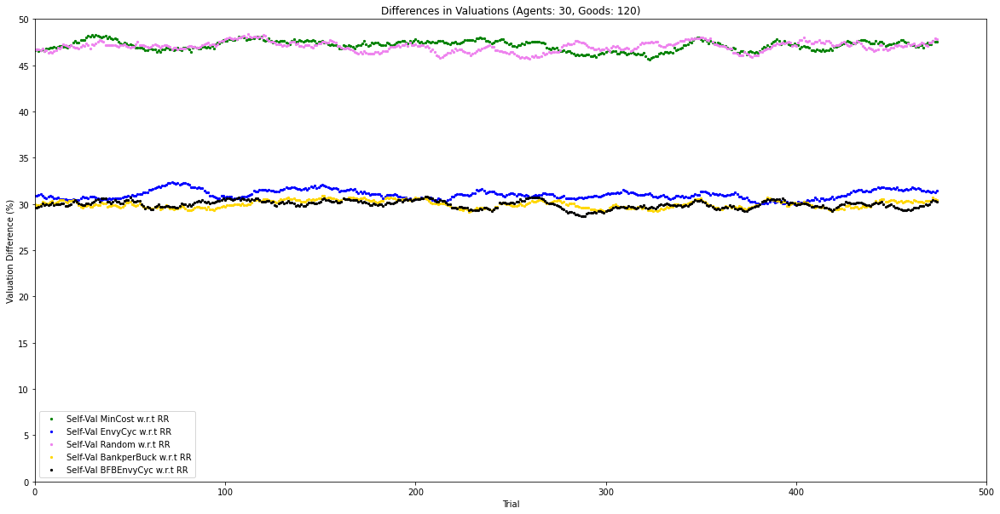

Agents :  30 	 Goods : 130
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1063.46  %
Cost difference of Round Robin w.r.t Min cost : 
 1395.19  %
Cost difference of Random w.r.t Min cost : 
 1253.83  %
Cost difference of Bank per Buck w.r.t Min cost : 
 96.72  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 38.3  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.31  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 27.2  %
Self Valuation difference of Random w.r.t Round Robin : 
 47.21  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 30.14  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 26.23  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

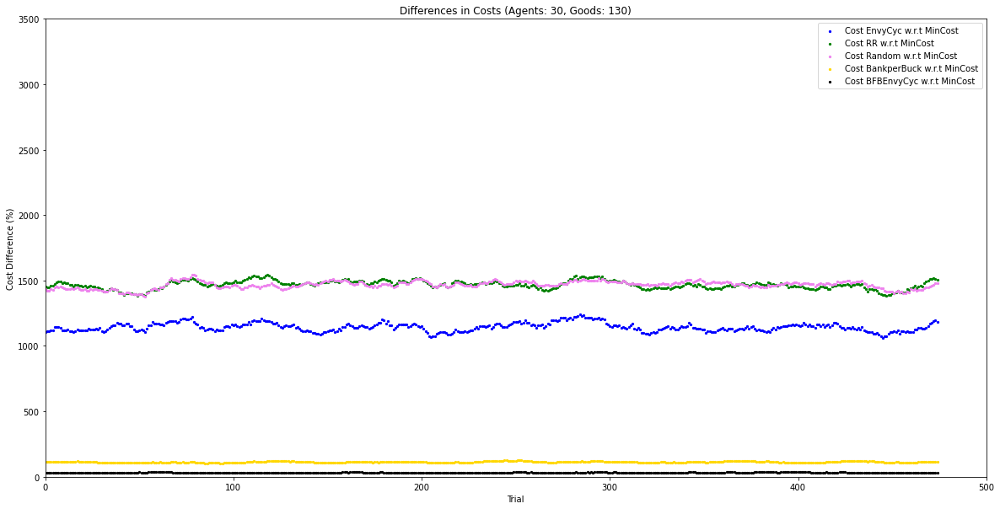

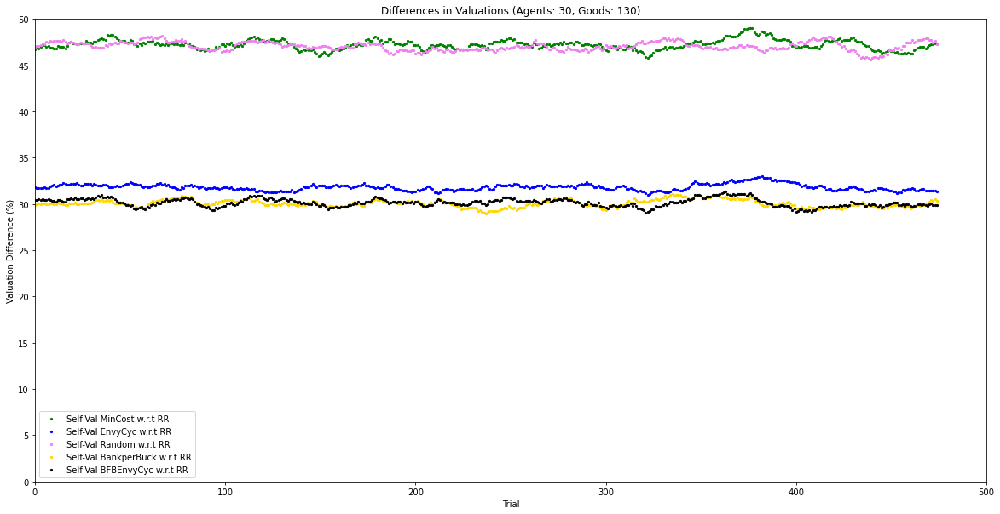

Agents :  30 	 Goods : 140
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1102.04  %
Cost difference of Round Robin w.r.t Min cost : 
 1298.57  %
Cost difference of Random w.r.t Min cost : 
 1415.1  %
Cost difference of Bank per Buck w.r.t Min cost : 
 108.17  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 41.02  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 48.99  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 35.65  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.79  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.46  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.39  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

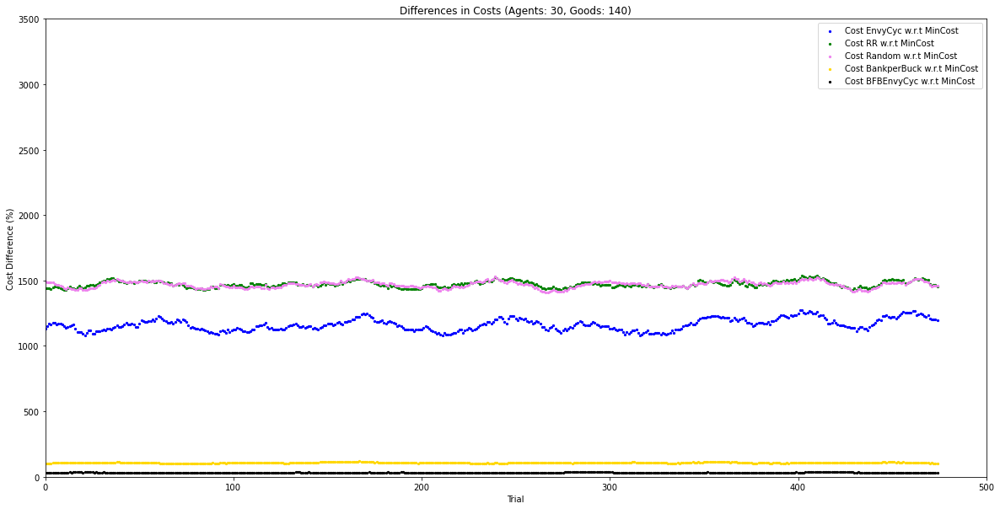

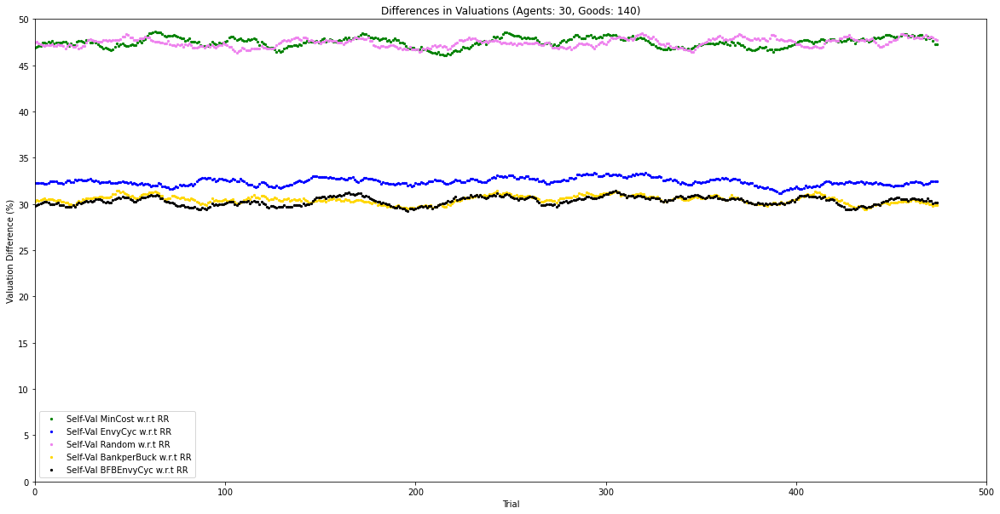

Agents :  35 	 Goods : 50
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1541.78  %
Cost difference of Round Robin w.r.t Min cost : 
 1293.84  %
Cost difference of Random w.r.t Min cost : 
 1954.79  %
Cost difference of Bank per Buck w.r.t Min cost : 
 243.16  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 28.09  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 50.15  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 25.04  %
Self Valuation difference of Random w.r.t Round Robin : 
 47.92  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.63  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.97  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

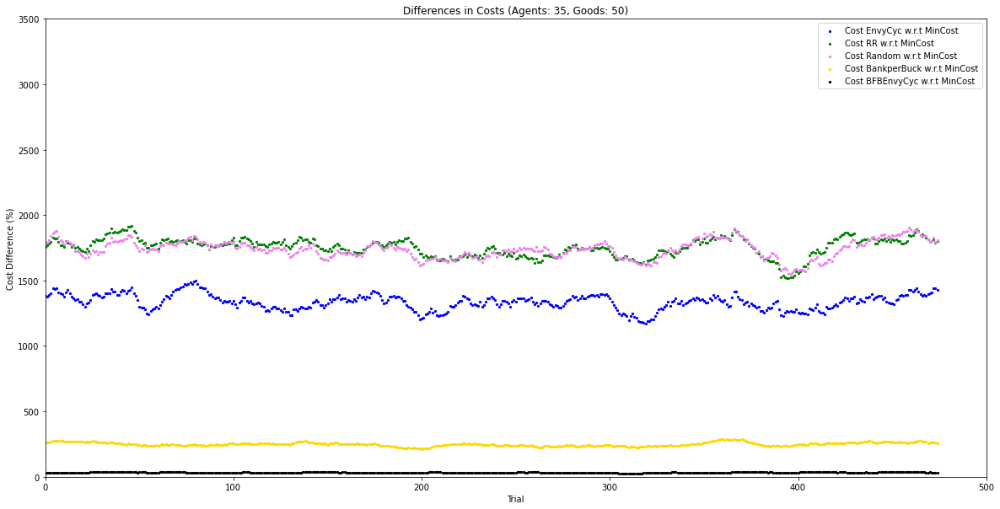

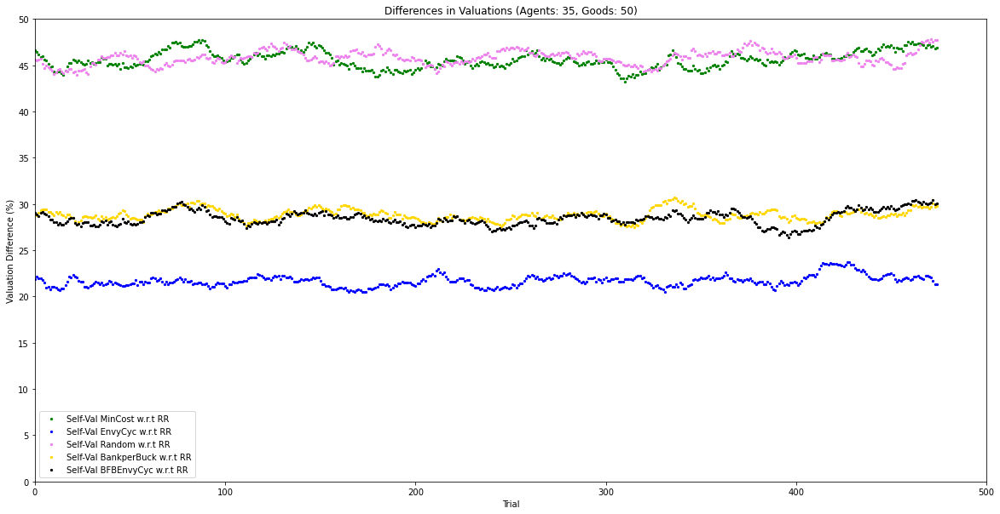

Agents :  35 	 Goods : 60
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1799.28  %
Cost difference of Round Robin w.r.t Min cost : 
 1992.03  %
Cost difference of Random w.r.t Min cost : 
 2094.93  %
Cost difference of Bank per Buck w.r.t Min cost : 
 239.86  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 31.89  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.47  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 21.13  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.76  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.9  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.95  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

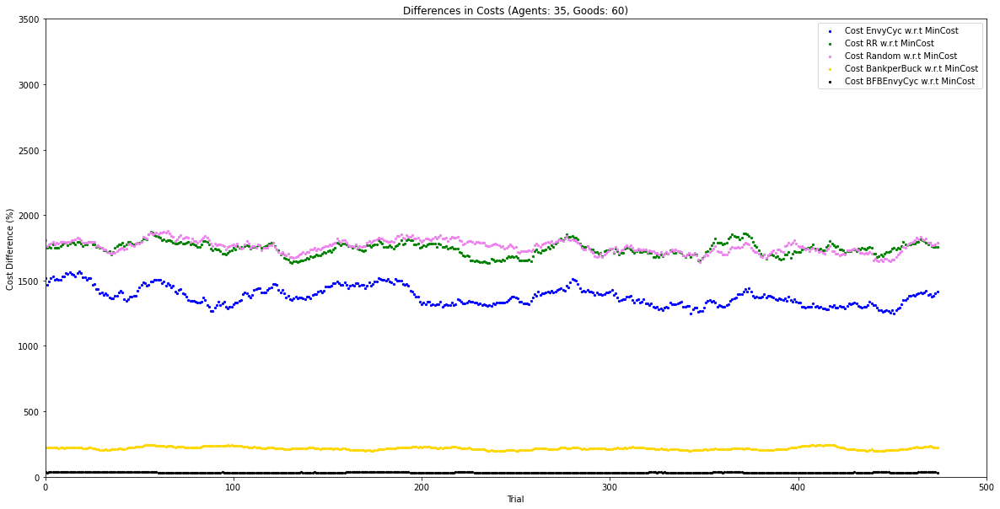

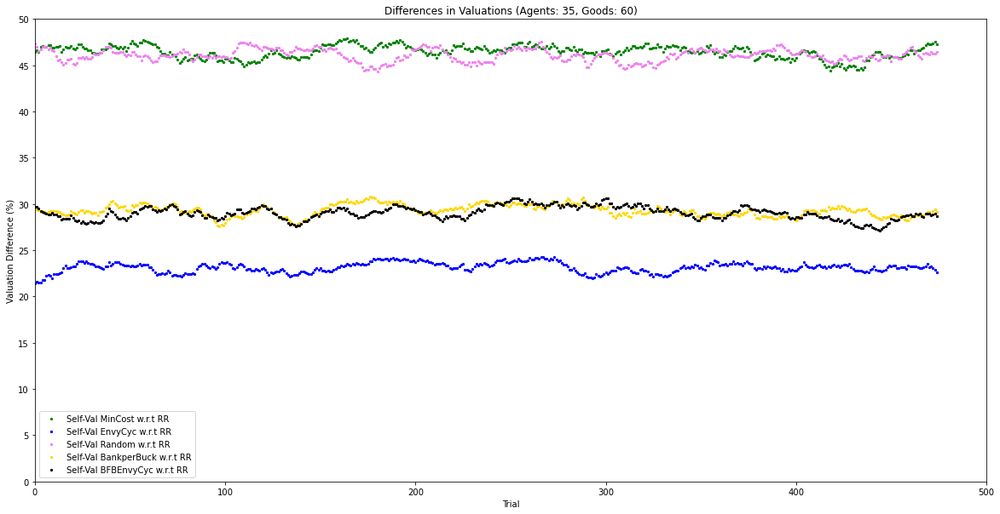

Agents :  35 	 Goods : 70
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1980.13  %
Cost difference of Round Robin w.r.t Min cost : 
 2071.52  %
Cost difference of Random w.r.t Min cost : 
 2182.12  %
Cost difference of Bank per Buck w.r.t Min cost : 
 171.53  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 33.78  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 48.16  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 23.73  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.63  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.12  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 30.77  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

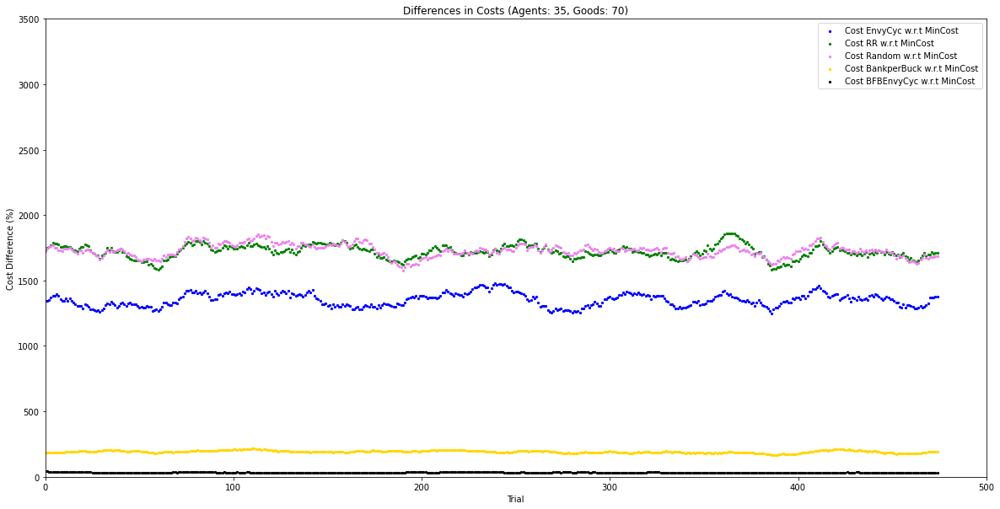

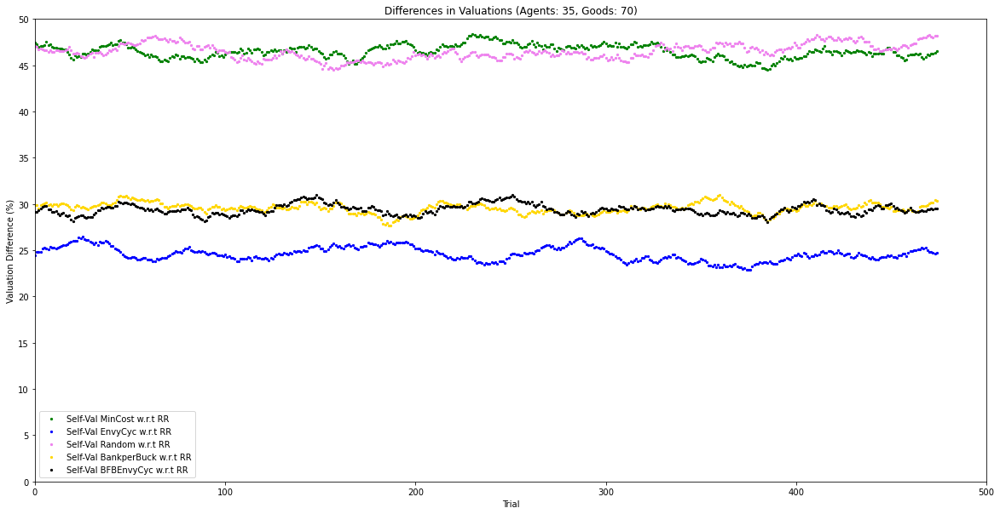

Agents :  35 	 Goods : 80
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1457.21  %
Cost difference of Round Robin w.r.t Min cost : 
 2049.25  %
Cost difference of Random w.r.t Min cost : 
 1855.22  %
Cost difference of Bank per Buck w.r.t Min cost : 
 166.67  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 27.87  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.86  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 25.52  %
Self Valuation difference of Random w.r.t Round Robin : 
 42.97  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 33.22  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 35.27  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

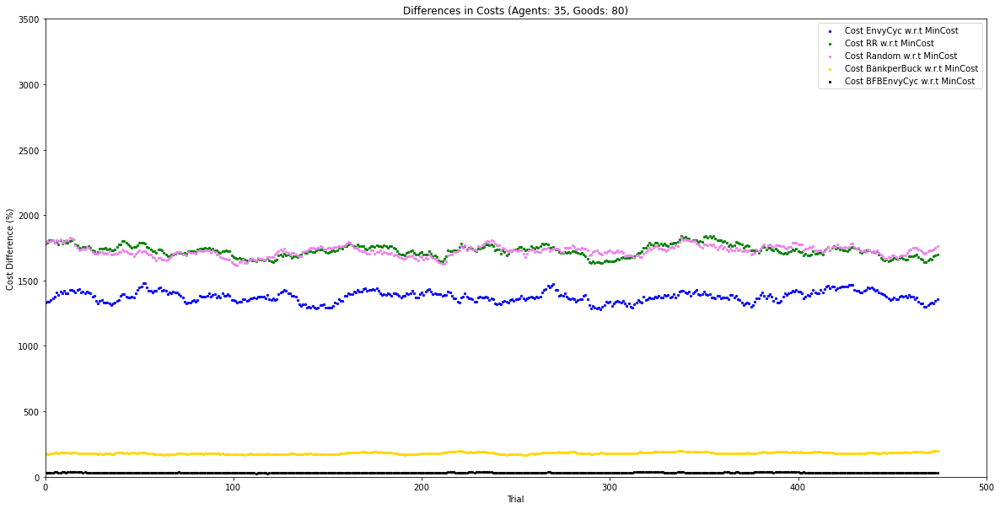

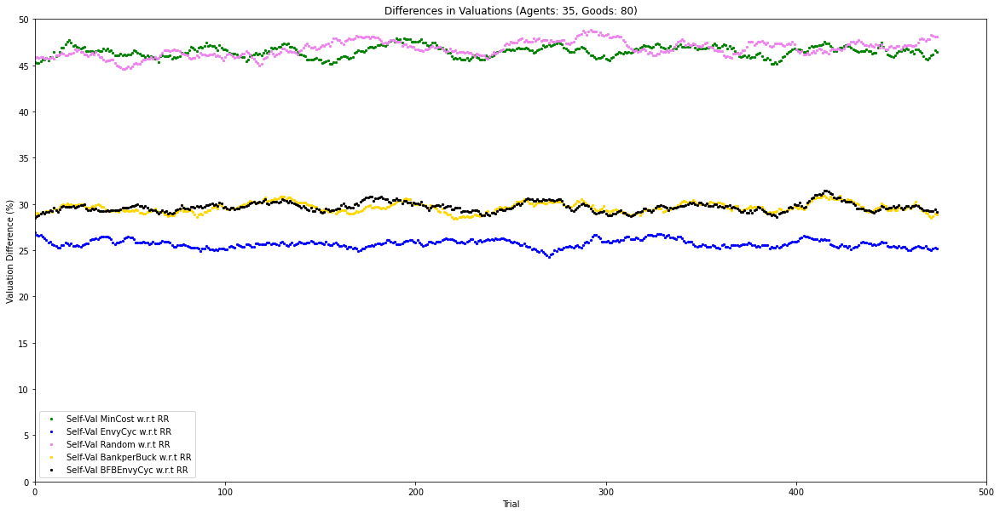

Agents :  35 	 Goods : 90
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1051.23  %
Cost difference of Round Robin w.r.t Min cost : 
 1660.25  %
Cost difference of Random w.r.t Min cost : 
 1701.64  %
Cost difference of Bank per Buck w.r.t Min cost : 
 150.82  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 38.53  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 45.87  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 26.9  %
Self Valuation difference of Random w.r.t Round Robin : 
 50.05  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.6  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 26.79  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

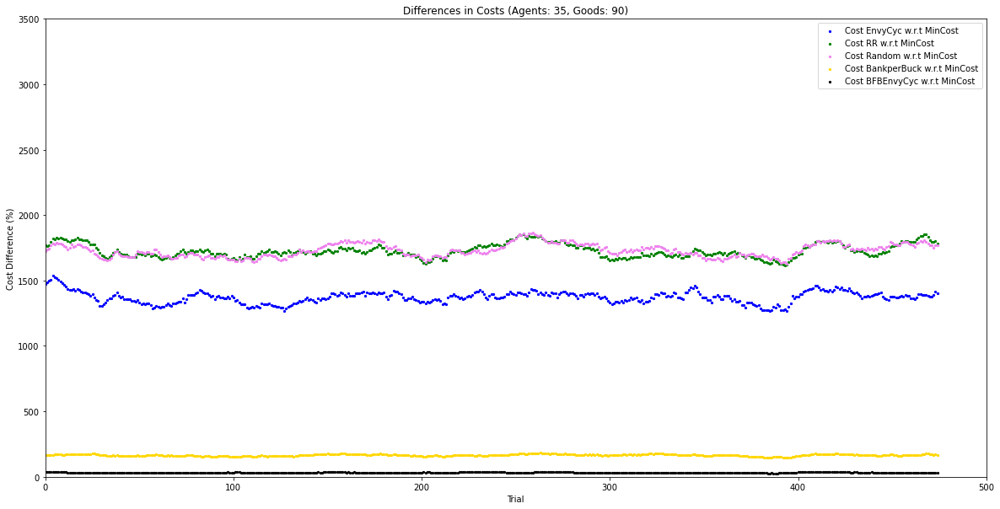

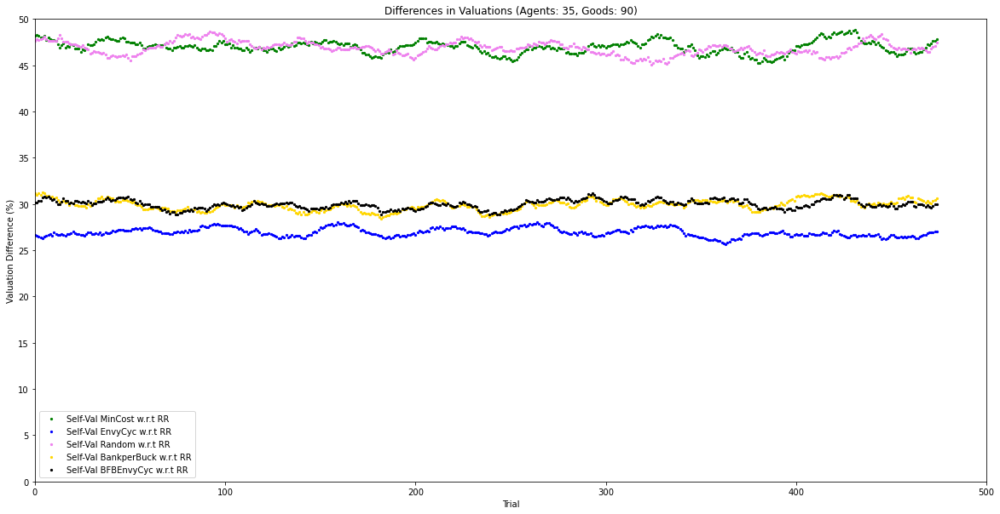

Agents :  35 	 Goods : 100
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1599.63  %
Cost difference of Round Robin w.r.t Min cost : 
 1736.9  %
Cost difference of Random w.r.t Min cost : 
 1659.78  %
Cost difference of Bank per Buck w.r.t Min cost : 
 156.83  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 27.68  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.52  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 26.77  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.46  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.38  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.36  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

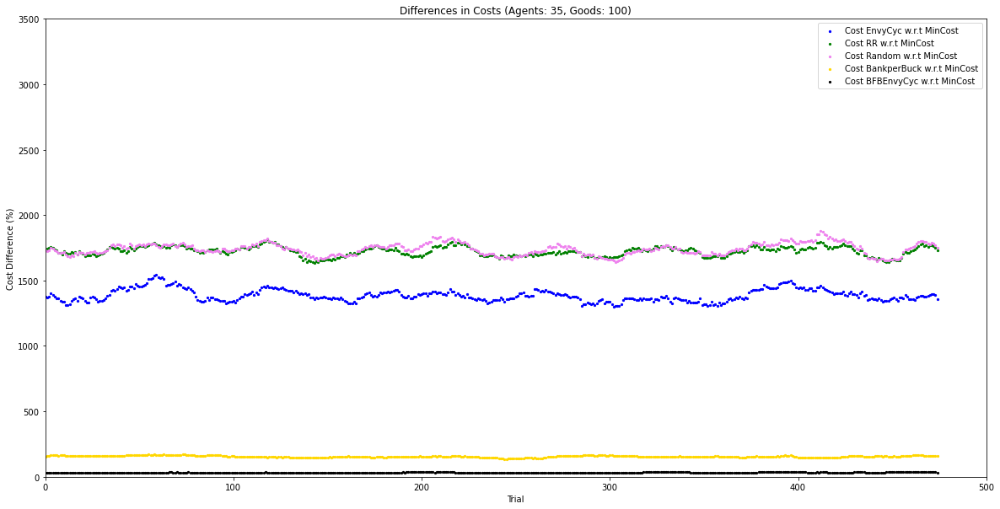

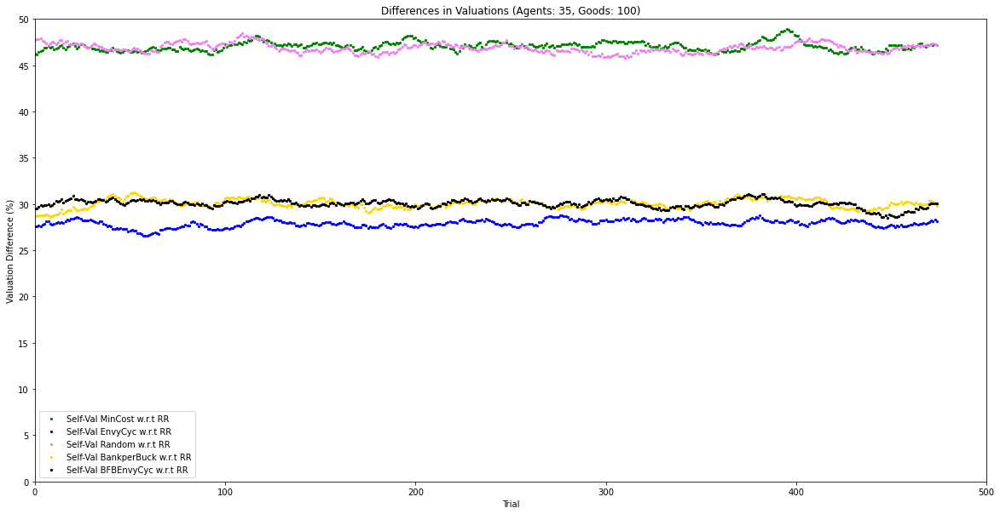

Agents :  35 	 Goods : 110
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1062.62  %
Cost difference of Round Robin w.r.t Min cost : 
 1627.48  %
Cost difference of Random w.r.t Min cost : 
 1581.79  %
Cost difference of Bank per Buck w.r.t Min cost : 
 152.08  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 23.01  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 40.61  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 28.62  %
Self Valuation difference of Random w.r.t Round Robin : 
 47.06  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.26  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 32.31  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------

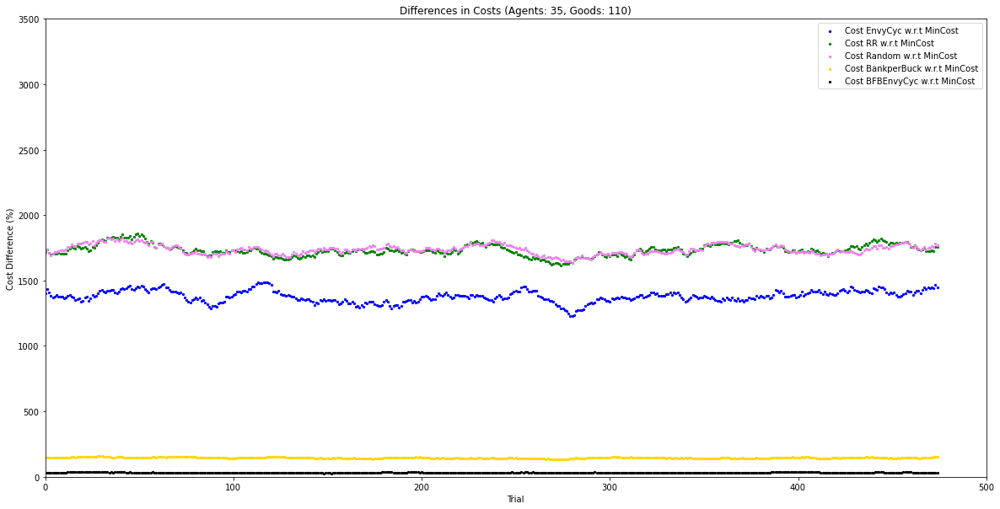

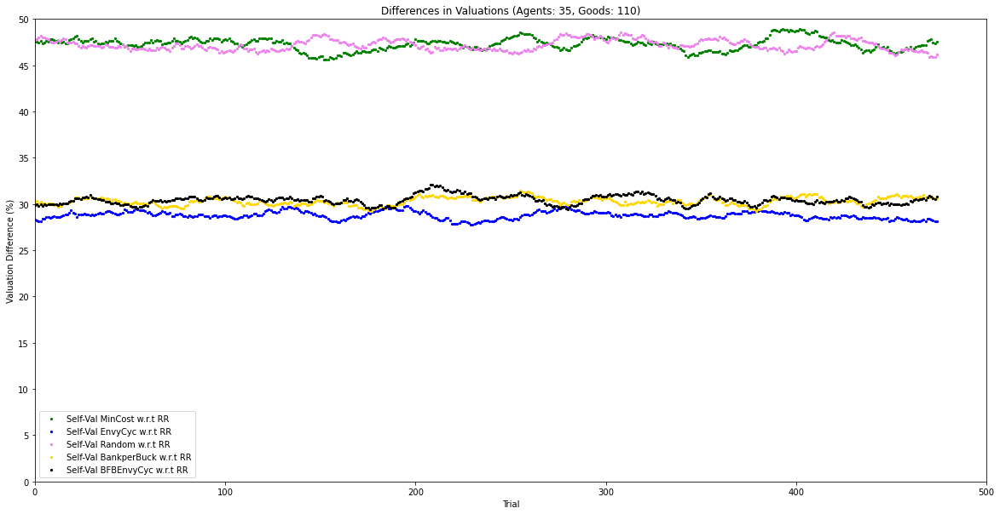

Agents :  35 	 Goods : 120
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1500.55  %
Cost difference of Round Robin w.r.t Min cost : 
 1521.76  %
Cost difference of Random w.r.t Min cost : 
 1385.67  %
Cost difference of Bank per Buck w.r.t Min cost : 
 95.32  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 26.73  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.43  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 26.86  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.02  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.89  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.98  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

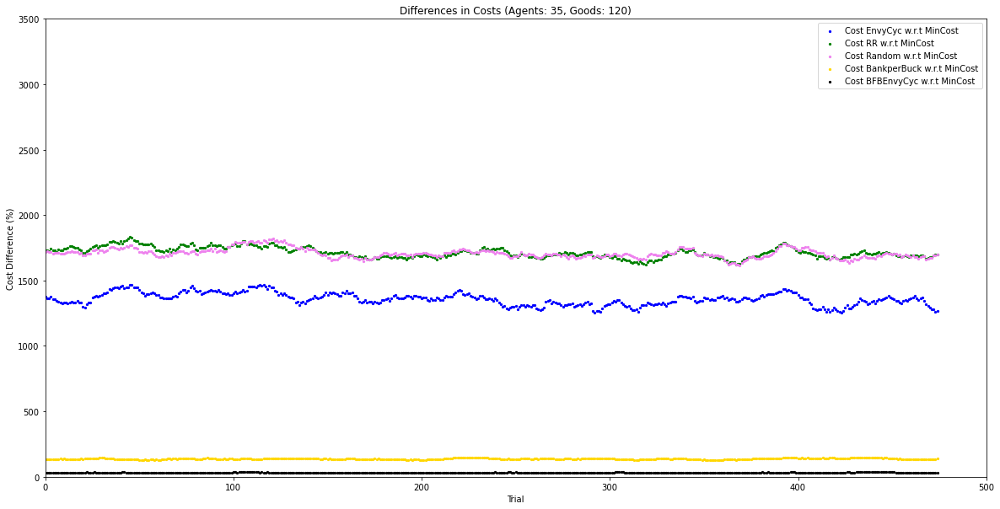

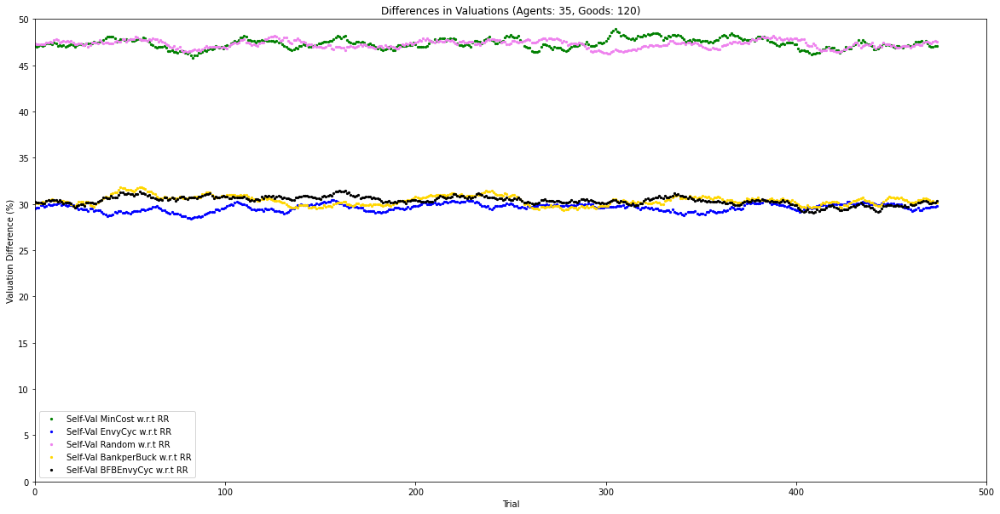

Agents :  35 	 Goods : 130
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1417.97  %
Cost difference of Round Robin w.r.t Min cost : 
 1708.99  %
Cost difference of Random w.r.t Min cost : 
 1792.46  %
Cost difference of Bank per Buck w.r.t Min cost : 
 138.85  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 36.24  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.97  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 32.64  %
Self Valuation difference of Random w.r.t Round Robin : 
 48.17  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 32.75  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.14  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------

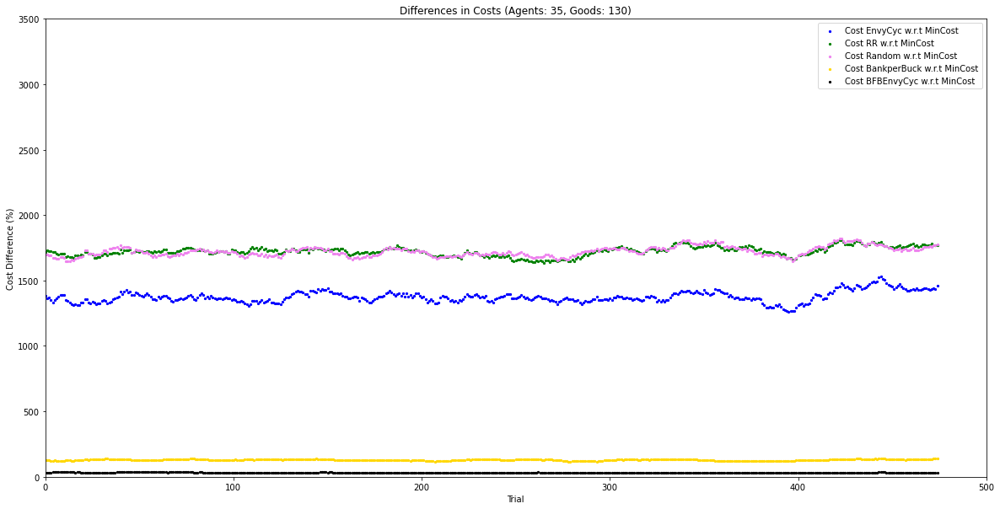

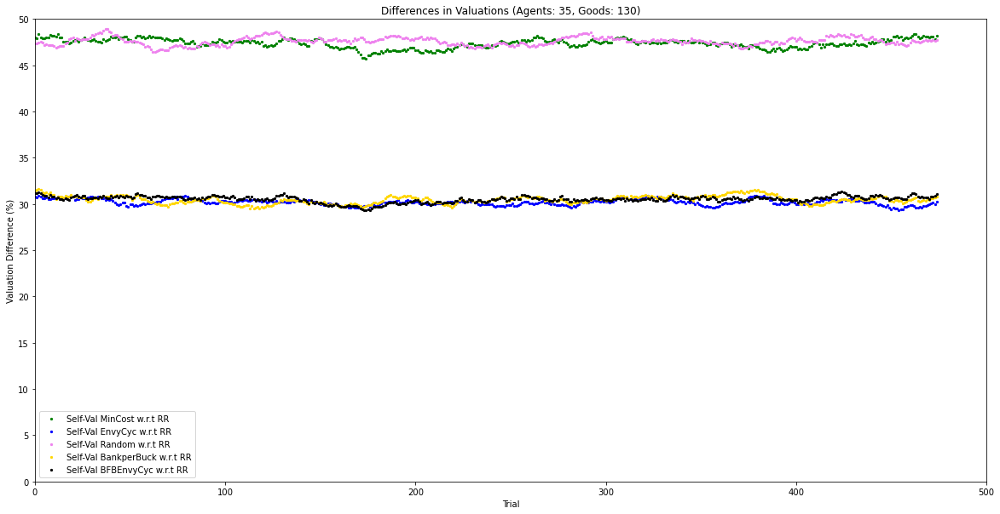

Agents :  35 	 Goods : 140
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1320.81  %
Cost difference of Round Robin w.r.t Min cost : 
 1663.2  %
Cost difference of Random w.r.t Min cost : 
 1868.53  %
Cost difference of Bank per Buck w.r.t Min cost : 
 110.92  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 22.34  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.33  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 28.73  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.17  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 33.63  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 32.96  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

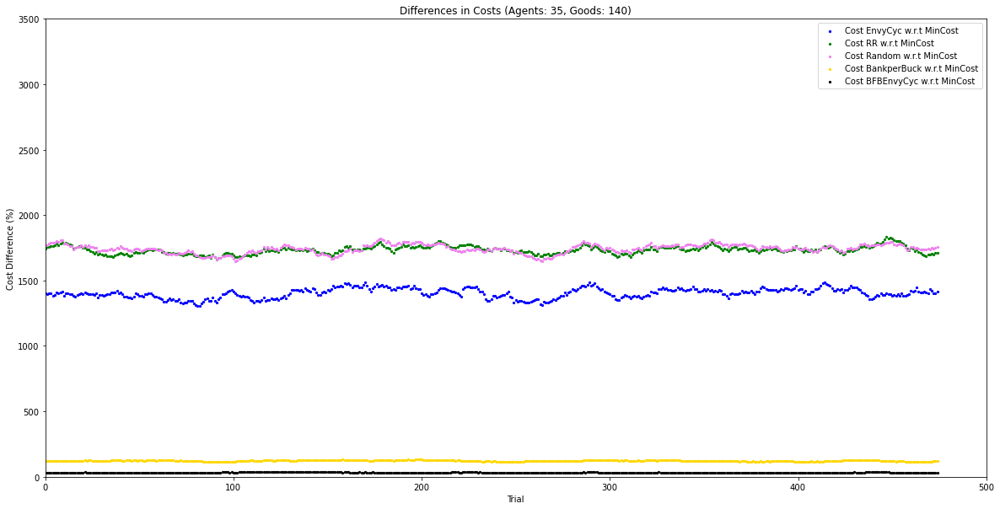

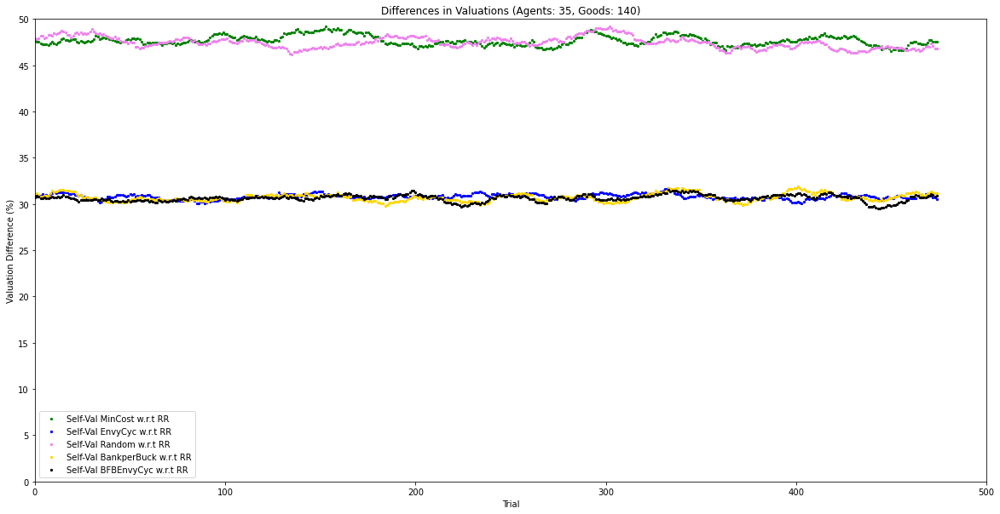

Agents :  40 	 Goods : 50
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1869.47  %
Cost difference of Round Robin w.r.t Min cost : 
 2776.84  %
Cost difference of Random w.r.t Min cost : 
 2418.95  %
Cost difference of Bank per Buck w.r.t Min cost : 
 541.06  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 31.58  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.29  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 26.56  %
Self Valuation difference of Random w.r.t Round Robin : 
 52.73  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 32.79  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 31.56  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

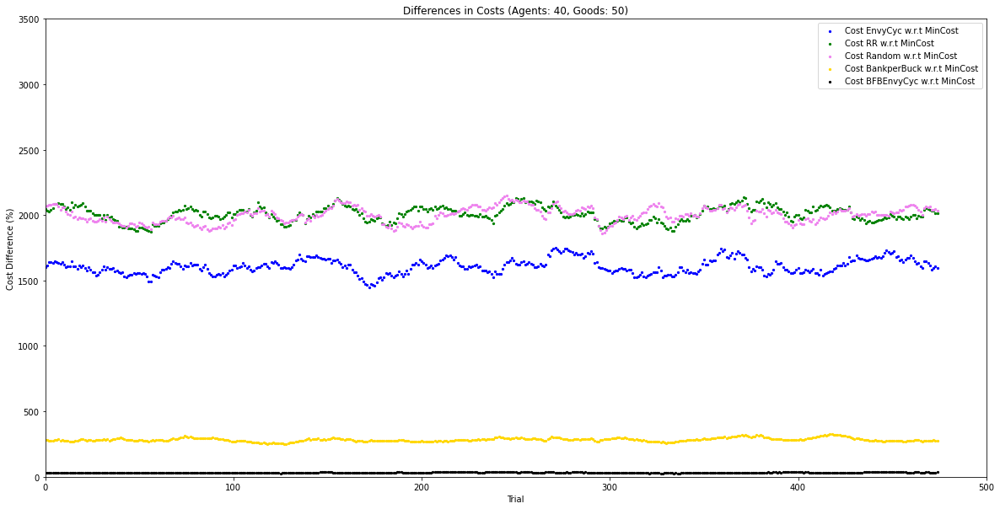

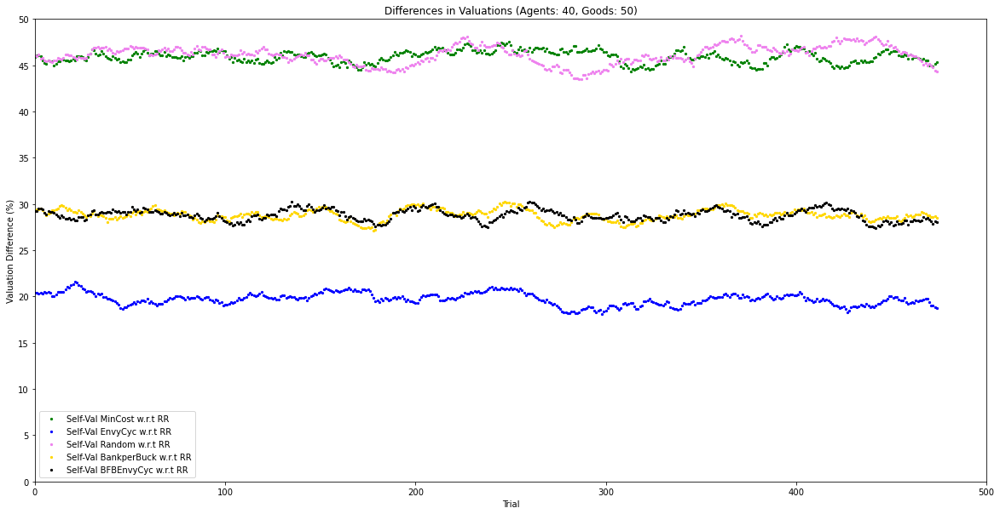

Agents :  40 	 Goods : 60
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1320.25  %
Cost difference of Round Robin w.r.t Min cost : 
 1868.35  %
Cost difference of Random w.r.t Min cost : 
 1781.01  %
Cost difference of Bank per Buck w.r.t Min cost : 
 218.36  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 32.28  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.22  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 24.02  %
Self Valuation difference of Random w.r.t Round Robin : 
 39.87  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 23.12  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 23.59  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

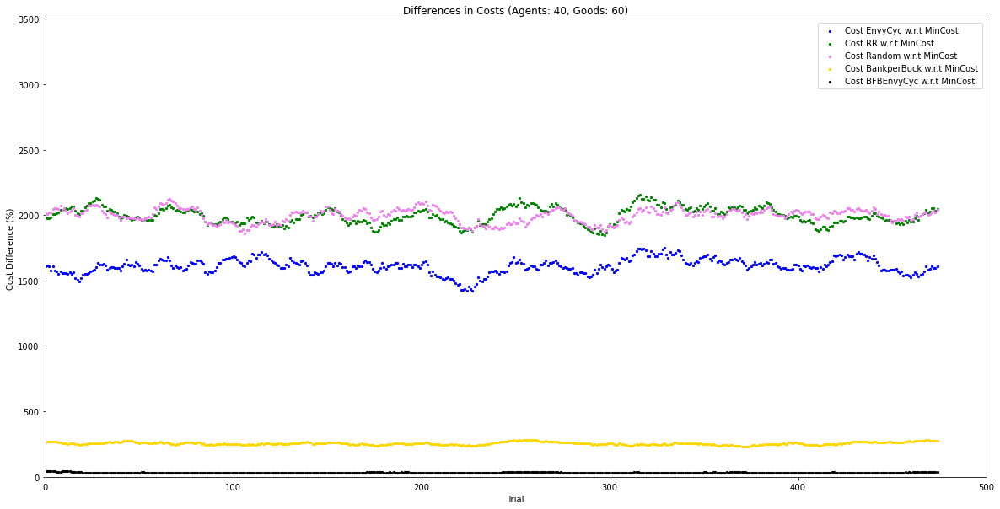

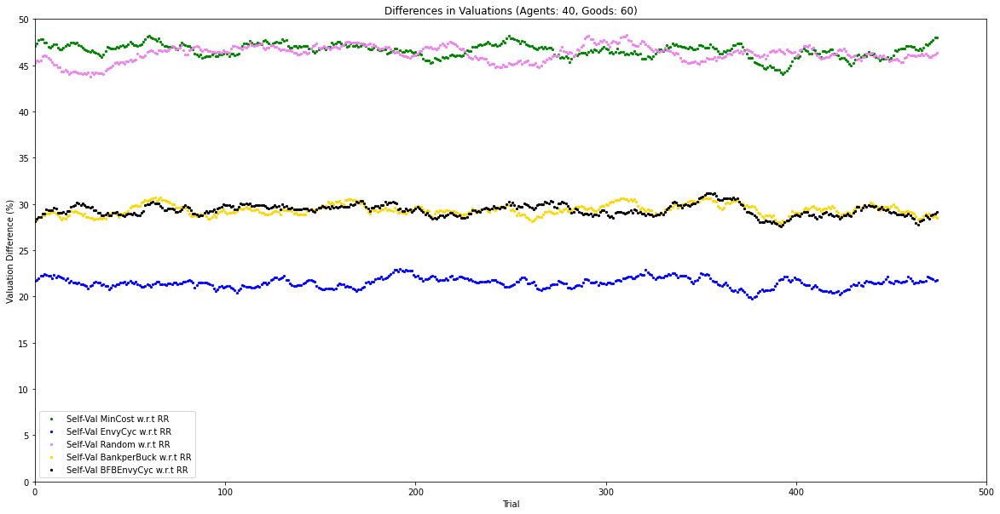

Agents :  40 	 Goods : 70
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2068.63  %
Cost difference of Round Robin w.r.t Min cost : 
 1894.12  %
Cost difference of Random w.r.t Min cost : 
 2074.51  %
Cost difference of Bank per Buck w.r.t Min cost : 
 247.72  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 24.85  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.12  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 20.65  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.32  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.57  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.71  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

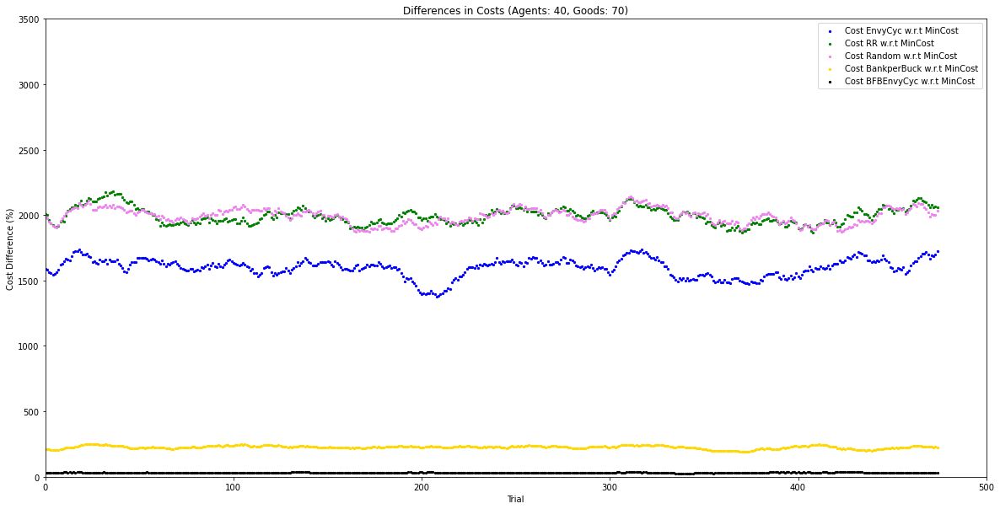

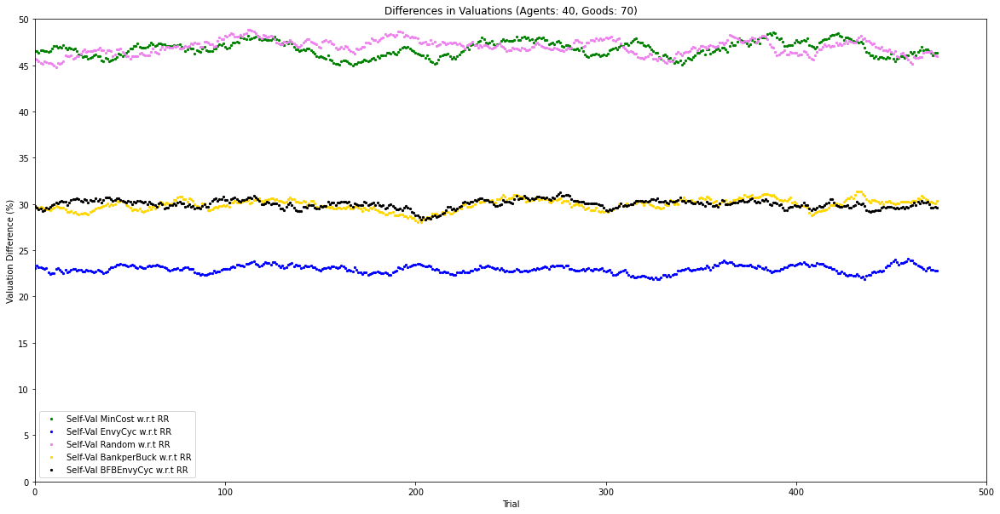

Agents :  40 	 Goods : 80
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1570.83  %
Cost difference of Round Robin w.r.t Min cost : 
 1807.81  %
Cost difference of Random w.r.t Min cost : 
 2165.62  %
Cost difference of Bank per Buck w.r.t Min cost : 
 157.82  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 26.57  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 43.75  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 19.8  %
Self Valuation difference of Random w.r.t Round Robin : 
 43.81  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.12  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.63  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

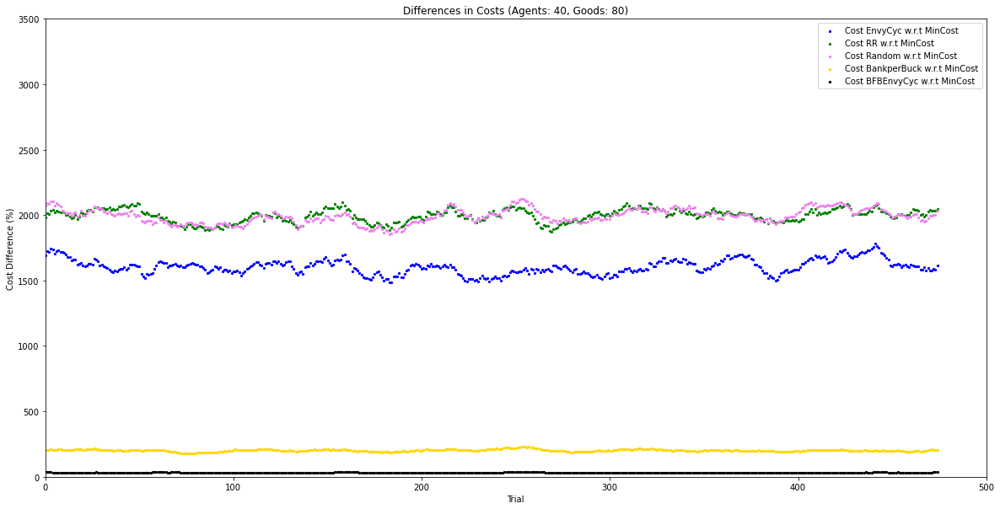

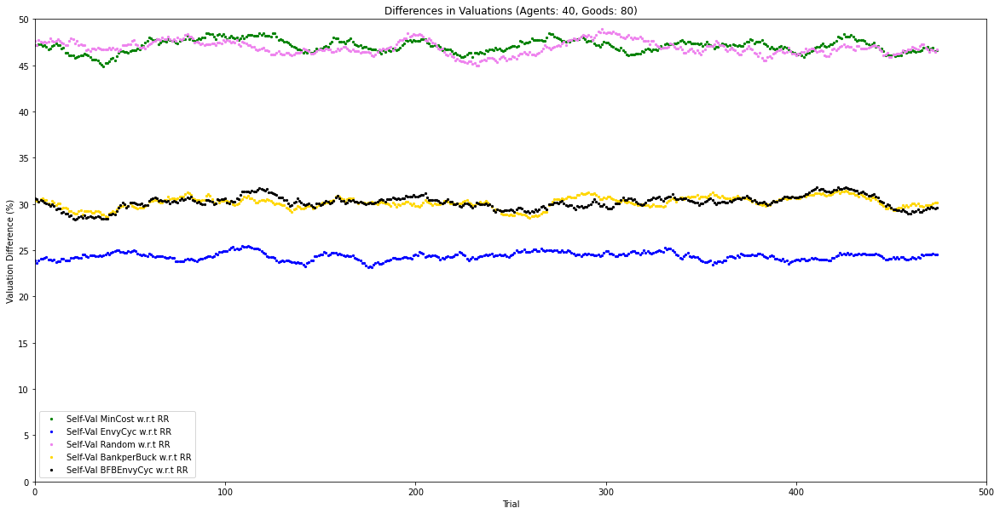

Agents :  40 	 Goods : 90
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2007.73  %
Cost difference of Round Robin w.r.t Min cost : 
 2171.98  %
Cost difference of Random w.r.t Min cost : 
 1985.51  %
Cost difference of Bank per Buck w.r.t Min cost : 
 152.18  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 34.31  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 49.57  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 27.0  %
Self Valuation difference of Random w.r.t Round Robin : 
 50.19  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 32.46  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 33.31  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

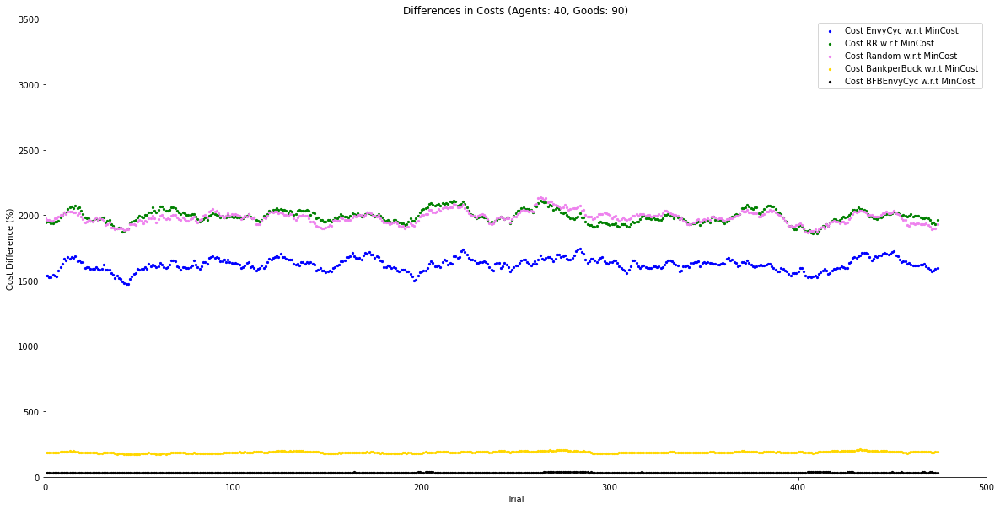

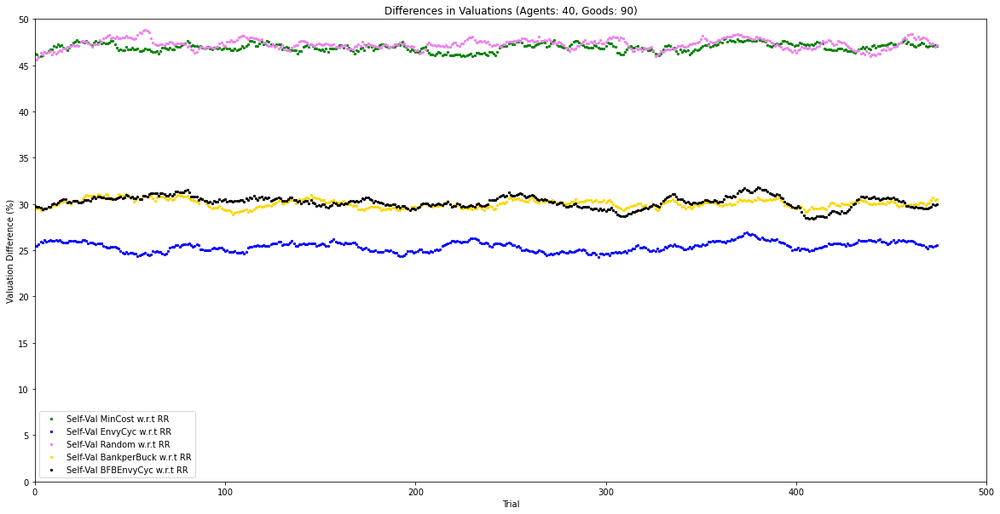

Agents :  40 	 Goods : 100
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1592.28  %
Cost difference of Round Robin w.r.t Min cost : 
 1765.45  %
Cost difference of Random w.r.t Min cost : 
 1952.85  %
Cost difference of Bank per Buck w.r.t Min cost : 
 167.89  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 28.05  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 50.7  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 26.02  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.05  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 37.34  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 34.9  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

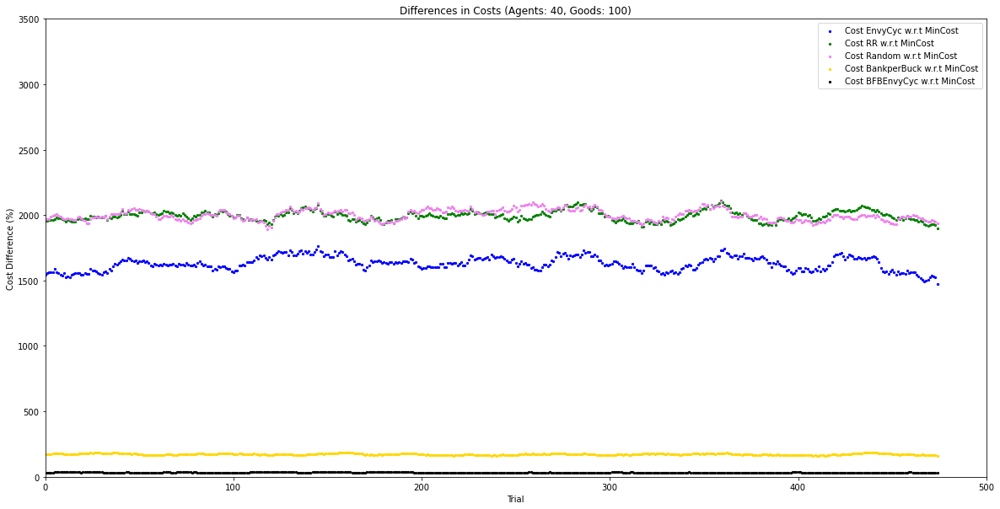

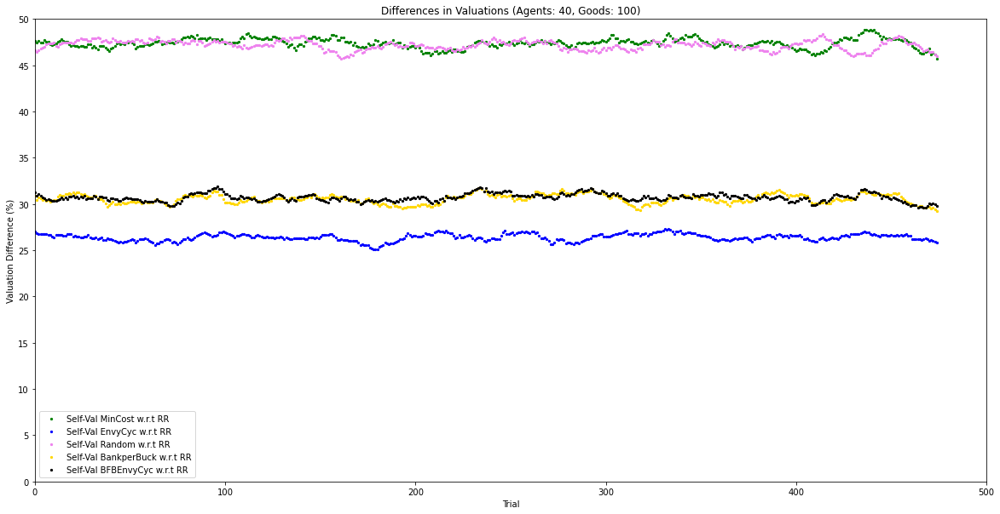

Agents :  40 	 Goods : 110
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1773.66  %
Cost difference of Round Robin w.r.t Min cost : 
 2366.07  %
Cost difference of Random w.r.t Min cost : 
 2372.77  %
Cost difference of Bank per Buck w.r.t Min cost : 
 193.76  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 44.21  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 43.16  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 26.42  %
Self Valuation difference of Random w.r.t Round Robin : 
 39.95  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 27.65  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 26.07  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------

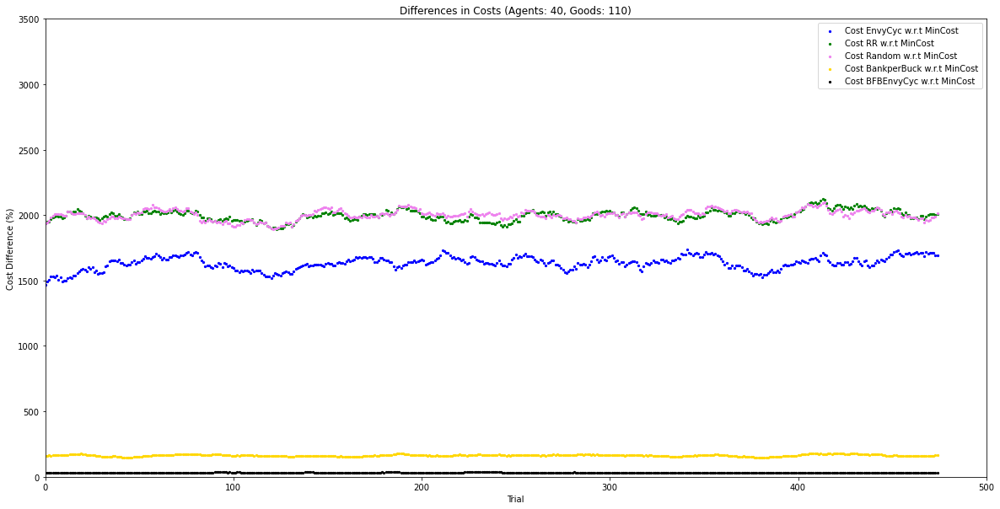

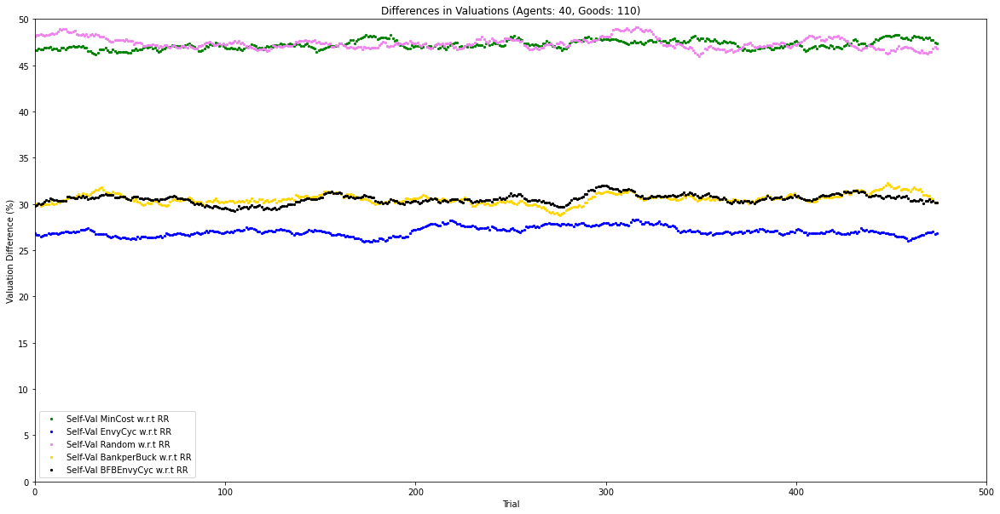

Agents :  40 	 Goods : 120
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1705.36  %
Cost difference of Round Robin w.r.t Min cost : 
 1963.98  %
Cost difference of Random w.r.t Min cost : 
 2184.67  %
Cost difference of Bank per Buck w.r.t Min cost : 
 150.97  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 26.83  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.55  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 29.57  %
Self Valuation difference of Random w.r.t Round Robin : 
 48.16  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.18  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 33.4  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

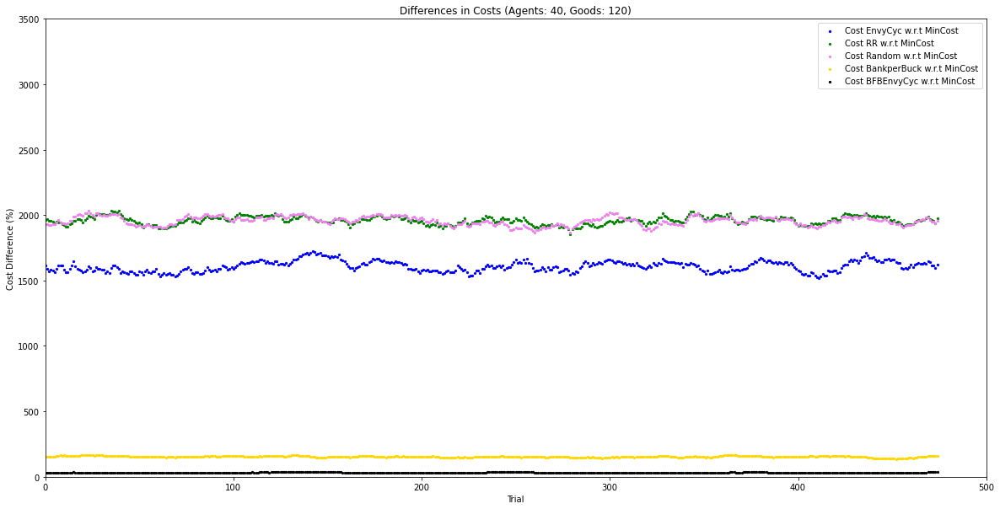

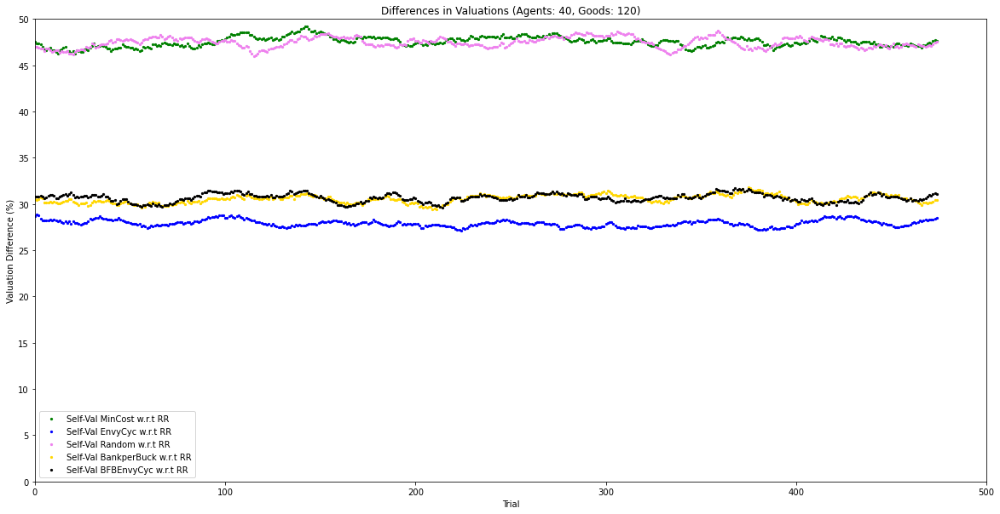

Agents :  40 	 Goods : 130
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1725.44  %
Cost difference of Round Robin w.r.t Min cost : 
 2036.75  %
Cost difference of Random w.r.t Min cost : 
 2083.39  %
Cost difference of Bank per Buck w.r.t Min cost : 
 188.34  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 25.09  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.18  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 27.24  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.7  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 30.28  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 31.57  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

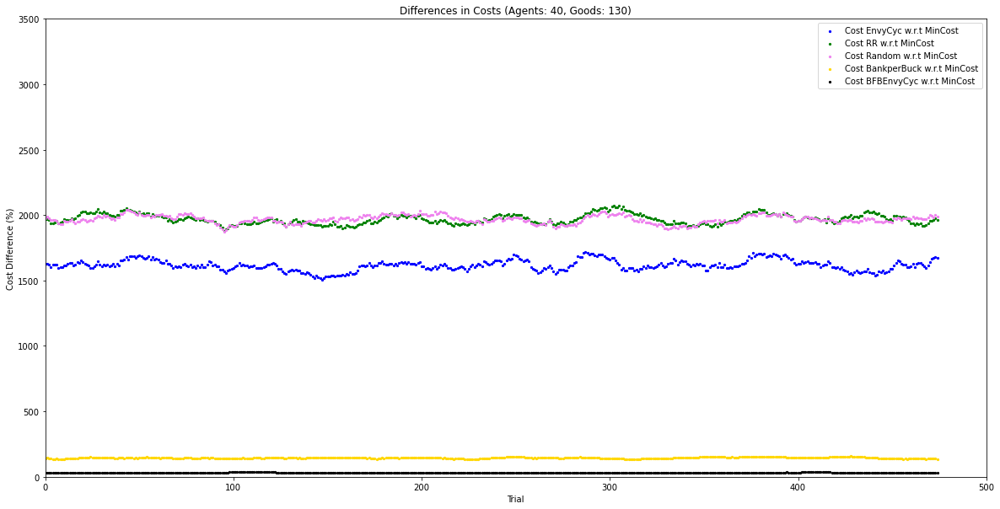

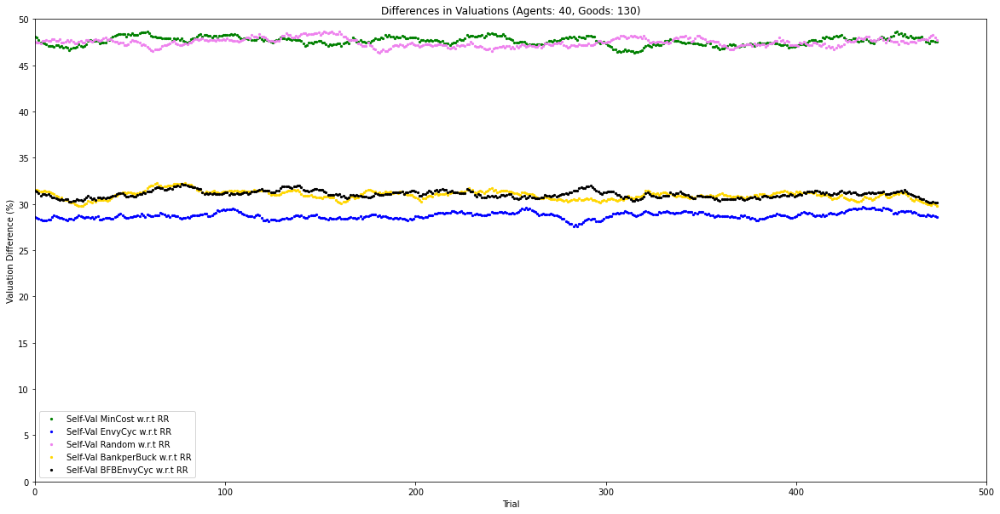

Agents :  40 	 Goods : 140
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1547.8  %
Cost difference of Round Robin w.r.t Min cost : 
 1898.63  %
Cost difference of Random w.r.t Min cost : 
 1925.27  %
Cost difference of Bank per Buck w.r.t Min cost : 
 135.17  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 40.67  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.49  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 28.53  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.25  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.54  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.21  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

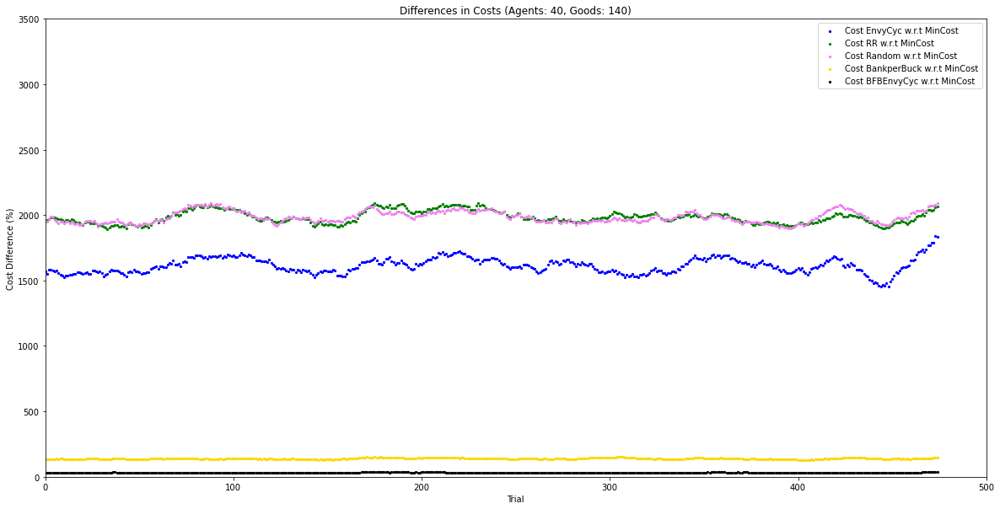

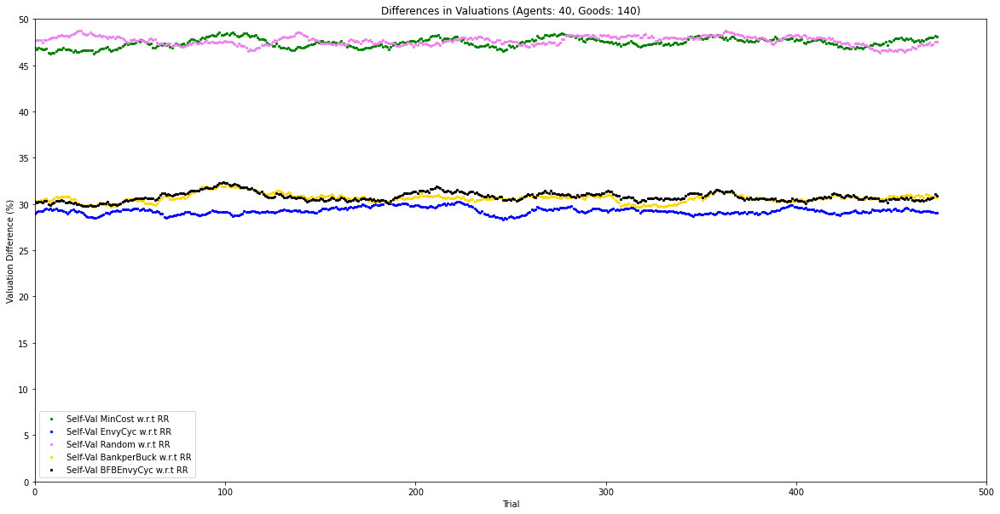

Agents :  45 	 Goods : 50
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1608.96  %
Cost difference of Round Robin w.r.t Min cost : 
 2138.81  %
Cost difference of Random w.r.t Min cost : 
 1633.58  %
Cost difference of Bank per Buck w.r.t Min cost : 
 130.6  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 25.38  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.7  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 13.57  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.16  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 31.47  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.04  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

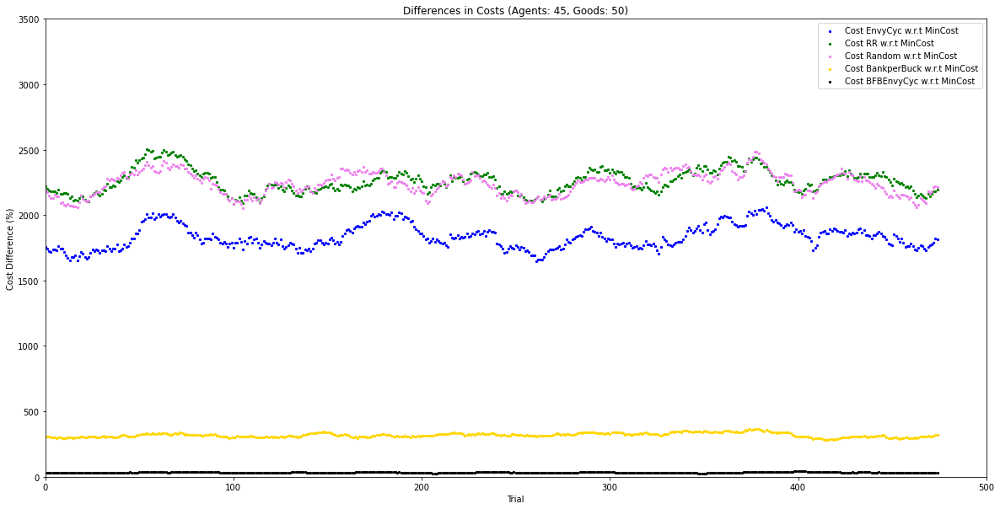

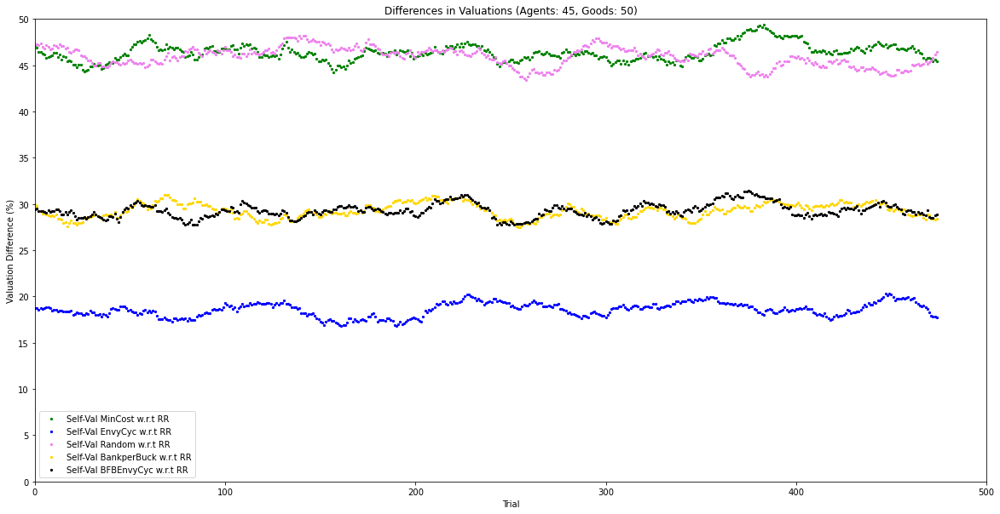

Agents :  45 	 Goods : 60
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2610.68  %
Cost difference of Round Robin w.r.t Min cost : 
 2585.44  %
Cost difference of Random w.r.t Min cost : 
 2901.94  %
Cost difference of Bank per Buck w.r.t Min cost : 
 391.27  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 38.84  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.96  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 17.29  %
Self Valuation difference of Random w.r.t Round Robin : 
 48.56  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.78  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.98  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

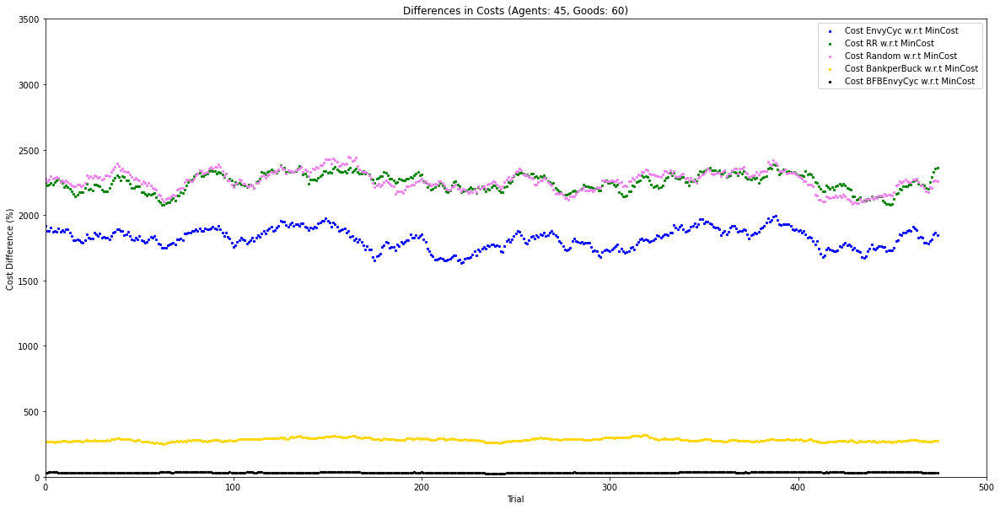

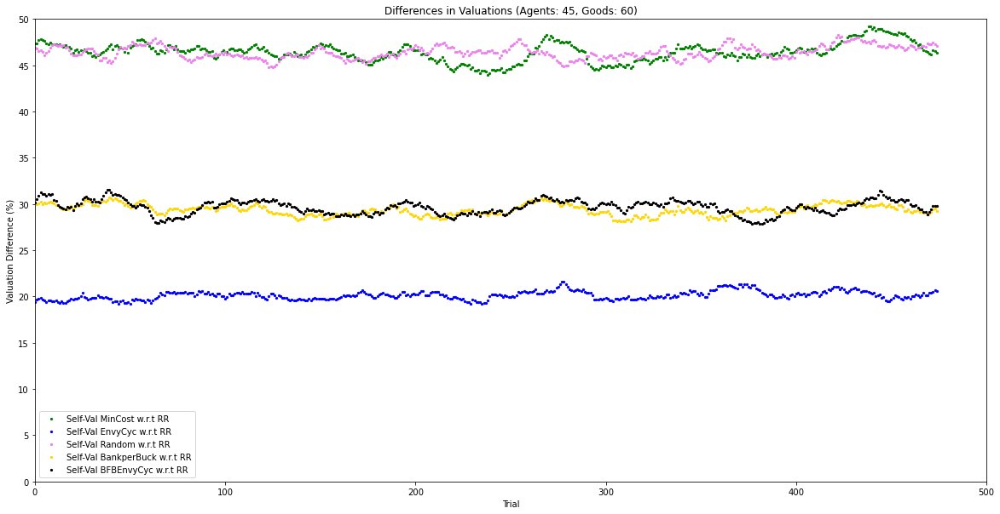

Agents :  45 	 Goods : 70
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2251.05  %
Cost difference of Round Robin w.r.t Min cost : 
 2379.02  %
Cost difference of Random w.r.t Min cost : 
 2295.1  %
Cost difference of Bank per Buck w.r.t Min cost : 
 269.23  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 41.26  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 50.01  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 24.38  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.82  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.31  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 33.31  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

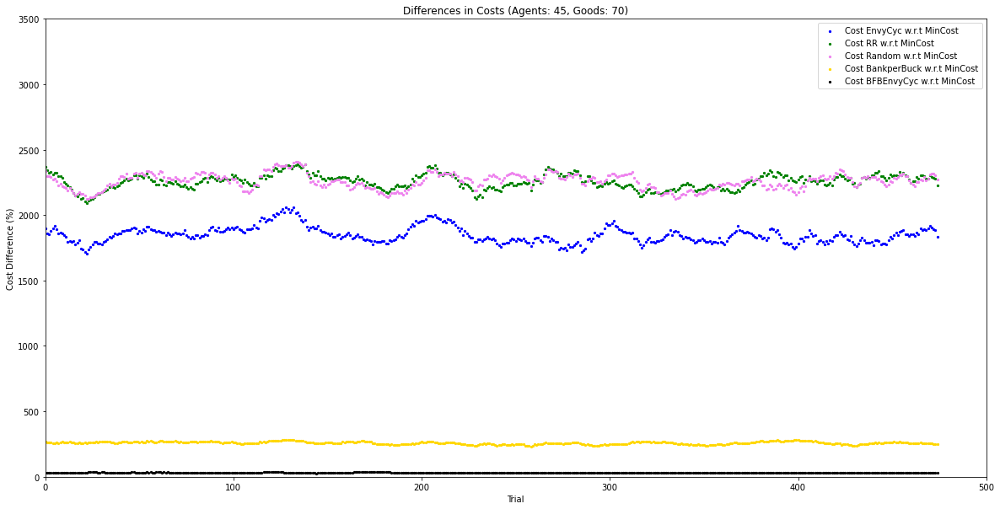

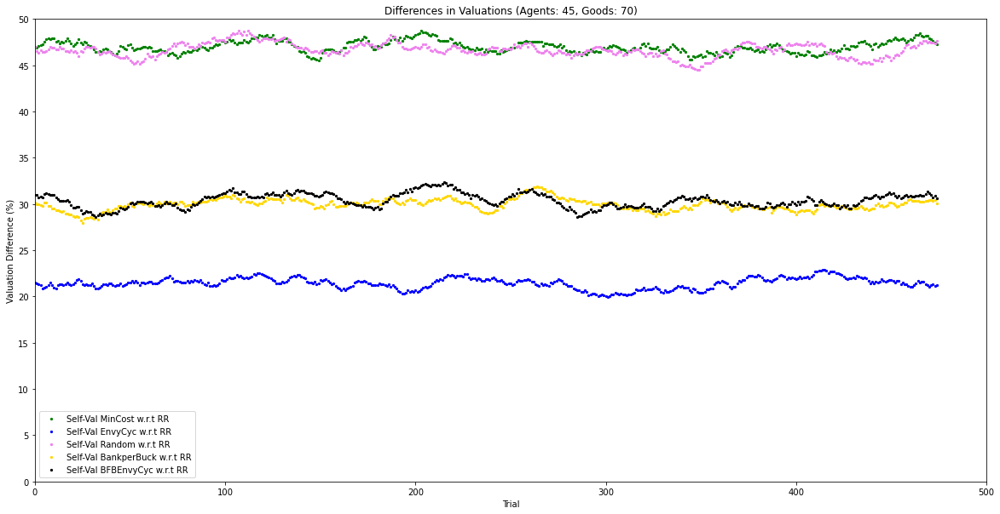

Agents :  45 	 Goods : 80
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1612.28  %
Cost difference of Round Robin w.r.t Min cost : 
 2458.48  %
Cost difference of Random w.r.t Min cost : 
 2264.91  %
Cost difference of Bank per Buck w.r.t Min cost : 
 243.87  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 42.7  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 50.49  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 23.7  %
Self Valuation difference of Random w.r.t Round Robin : 
 48.21  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 31.45  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 34.1  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

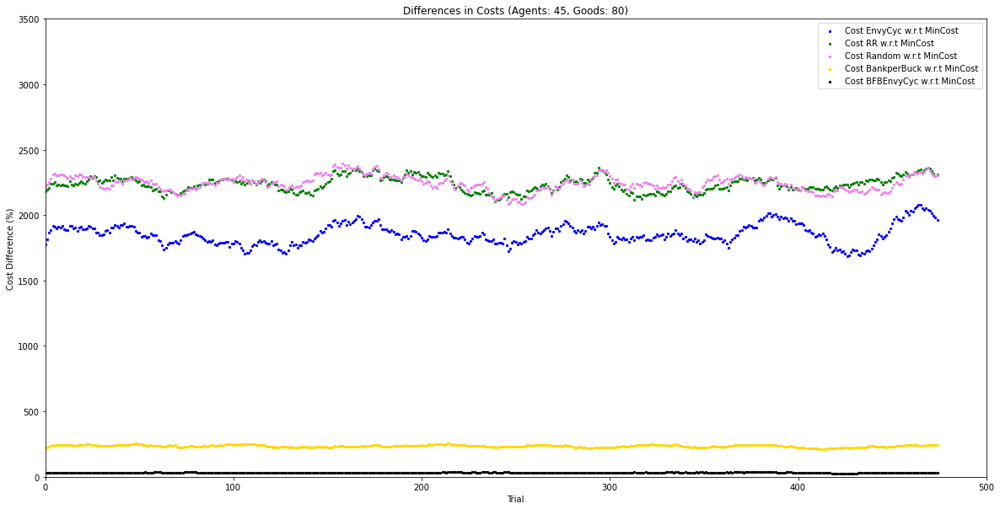

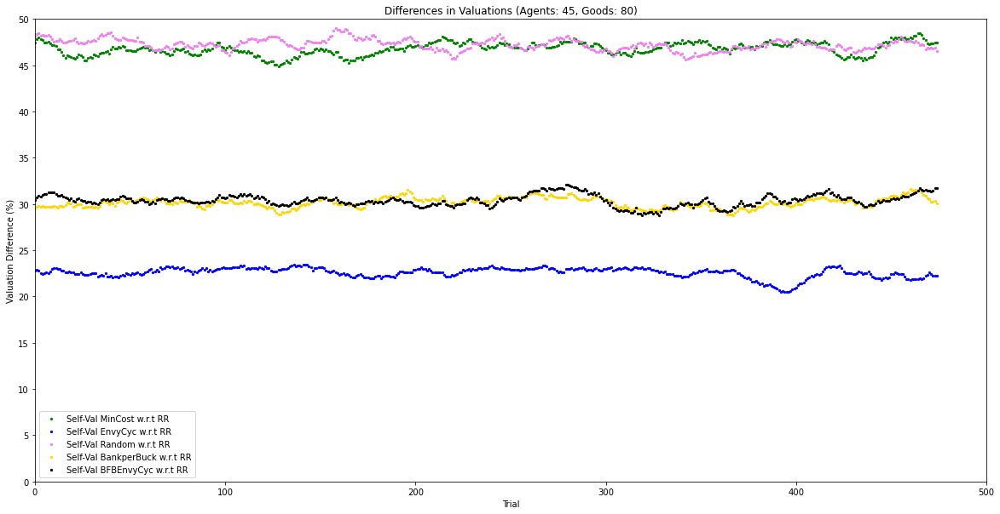

Agents :  45 	 Goods : 90
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1545.64  %
Cost difference of Round Robin w.r.t Min cost : 
 1845.23  %
Cost difference of Random w.r.t Min cost : 
 1786.31  %
Cost difference of Bank per Buck w.r.t Min cost : 
 148.97  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 41.08  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 50.25  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 26.29  %
Self Valuation difference of Random w.r.t Round Robin : 
 48.58  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 32.97  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.76  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

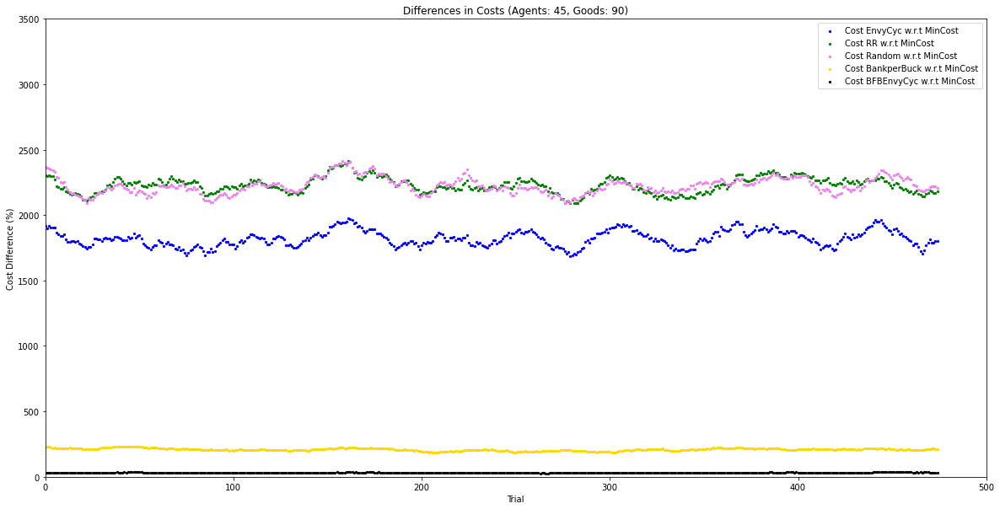

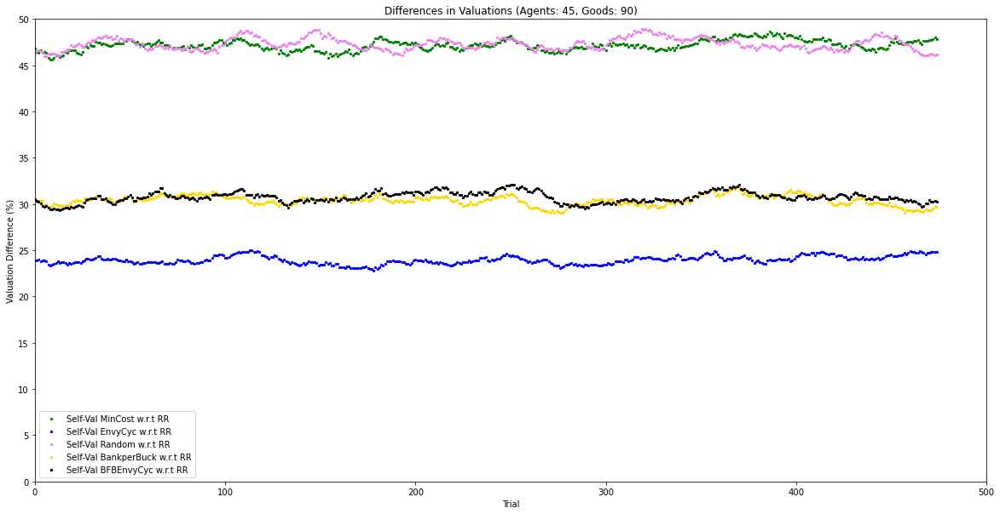

Agents :  45 	 Goods : 100
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1760.89  %
Cost difference of Round Robin w.r.t Min cost : 
 2408.42  %
Cost difference of Random w.r.t Min cost : 
 2406.44  %
Cost difference of Bank per Buck w.r.t Min cost : 
 205.45  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 30.7  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 48.34  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 24.89  %
Self Valuation difference of Random w.r.t Round Robin : 
 51.03  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 30.83  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 30.22  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

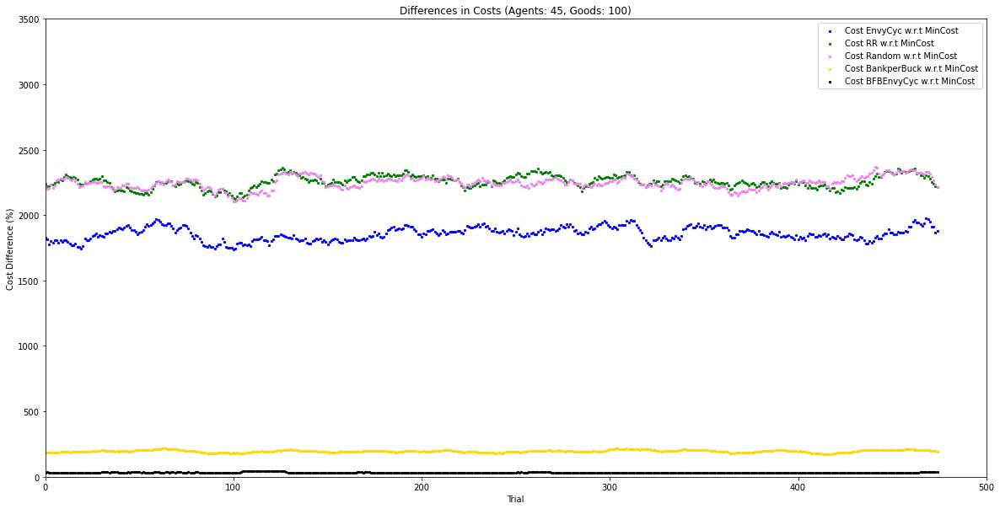

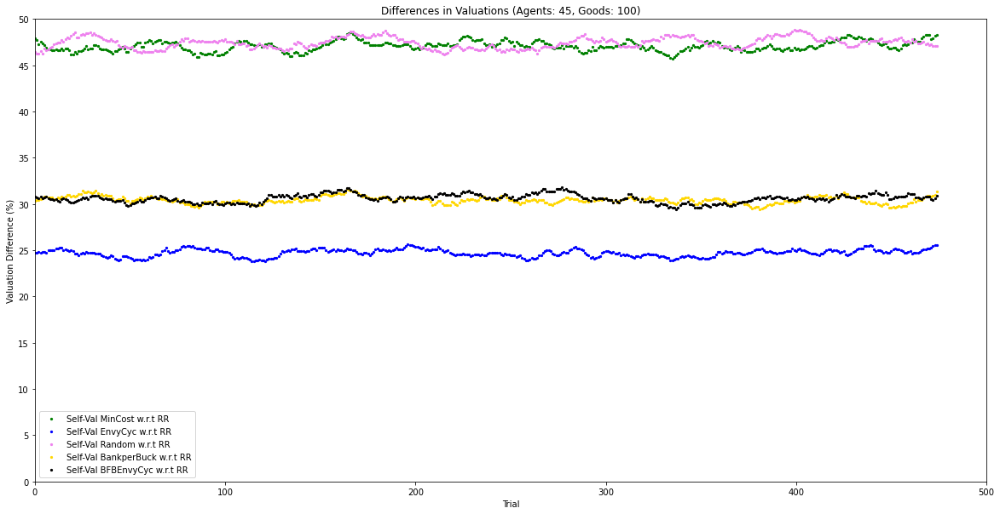

Agents :  45 	 Goods : 110
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2307.46  %
Cost difference of Round Robin w.r.t Min cost : 
 2297.81  %
Cost difference of Random w.r.t Min cost : 
 2261.4  %
Cost difference of Bank per Buck w.r.t Min cost : 
 210.97  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 38.6  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 52.0  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 23.7  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.65  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 32.67  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 31.71  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

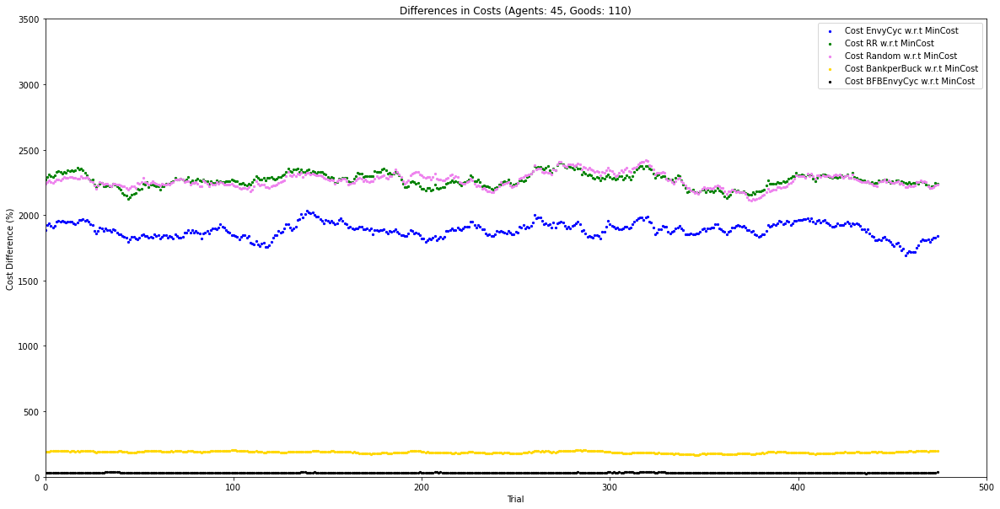

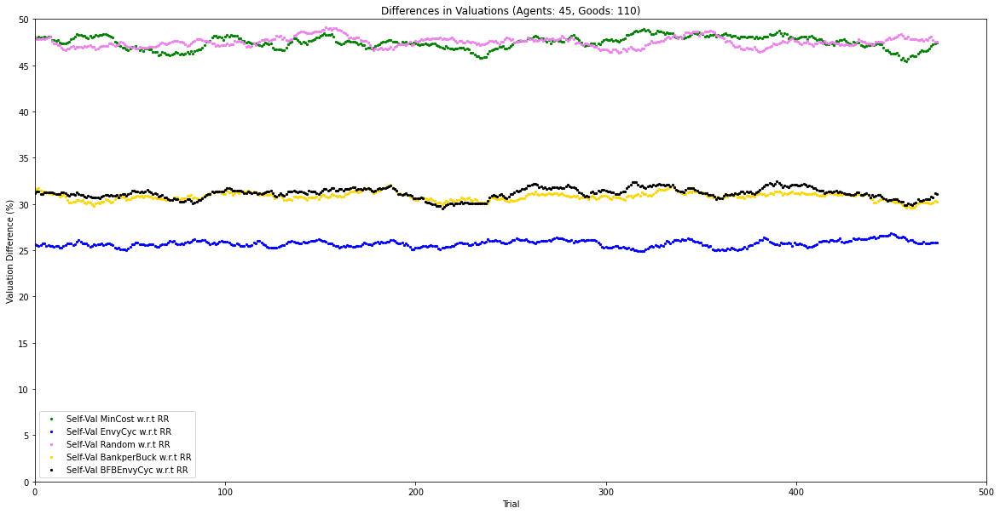

Agents :  45 	 Goods : 120
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2010.78  %
Cost difference of Round Robin w.r.t Min cost : 
 2393.53  %
Cost difference of Random w.r.t Min cost : 
 2756.03  %
Cost difference of Bank per Buck w.r.t Min cost : 
 197.43  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 29.75  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.62  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 27.3  %
Self Valuation difference of Random w.r.t Round Robin : 
 48.38  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 31.7  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 33.3  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

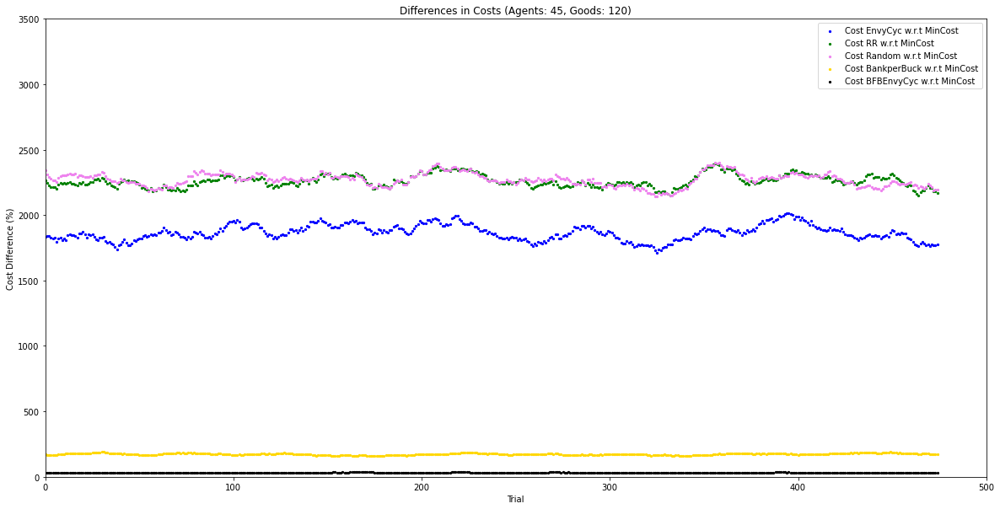

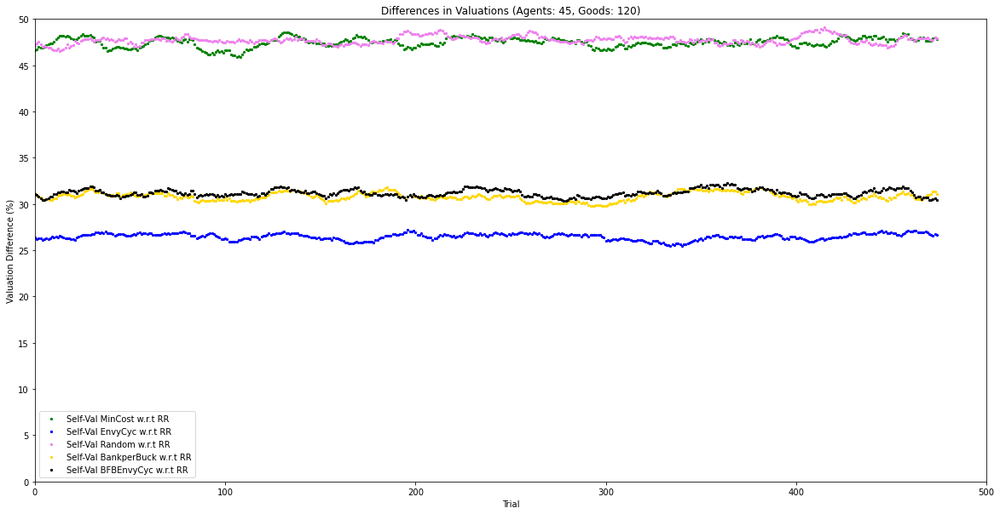

Agents :  45 	 Goods : 130
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1953.5  %
Cost difference of Round Robin w.r.t Min cost : 
 2115.38  %
Cost difference of Random w.r.t Min cost : 
 2002.1  %
Cost difference of Bank per Buck w.r.t Min cost : 
 132.17  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 36.72  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 49.46  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 28.78  %
Self Valuation difference of Random w.r.t Round Robin : 
 47.82  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 30.9  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 30.31  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

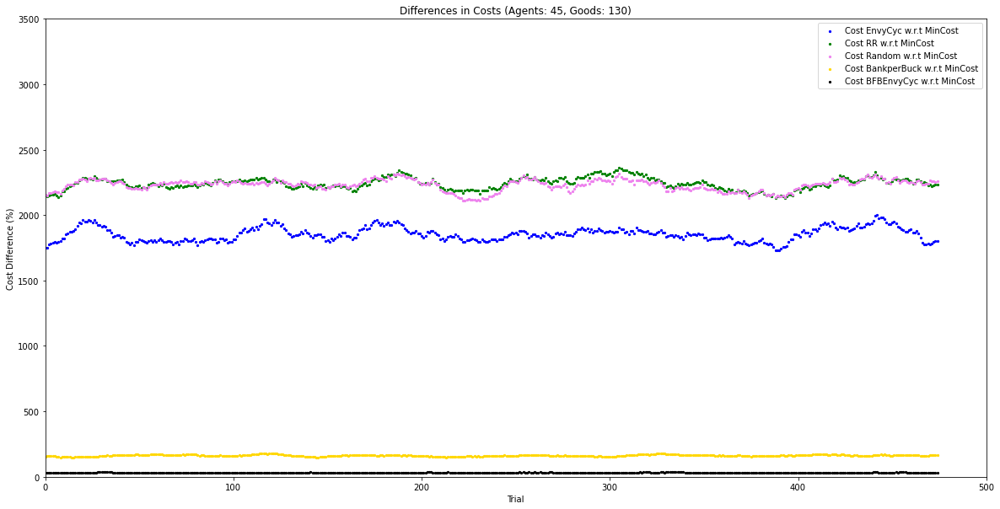

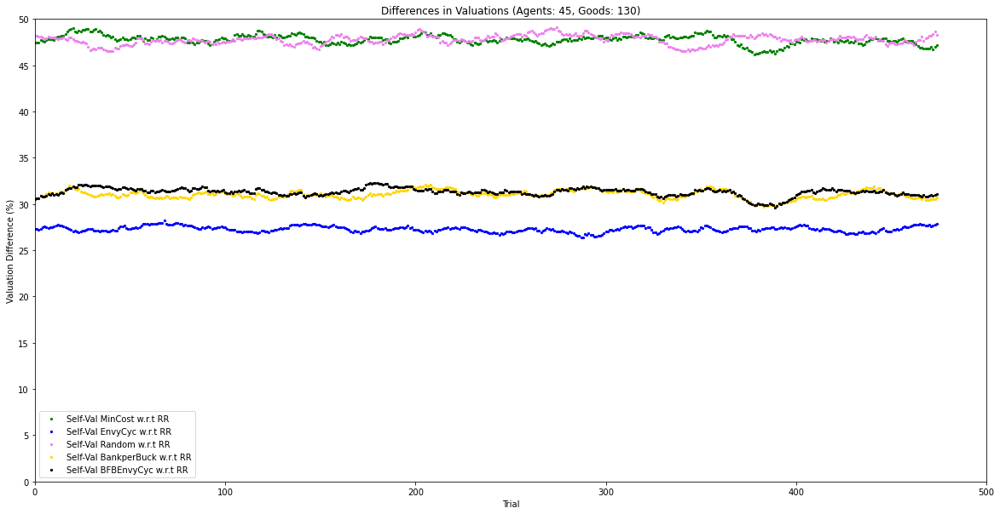

Agents :  45 	 Goods : 140
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2060.15  %
Cost difference of Round Robin w.r.t Min cost : 
 2464.94  %
Cost difference of Random w.r.t Min cost : 
 2317.34  %
Cost difference of Bank per Buck w.r.t Min cost : 
 181.19  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 45.4  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 50.22  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 25.16  %
Self Valuation difference of Random w.r.t Round Robin : 
 49.07  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 32.11  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 30.4  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

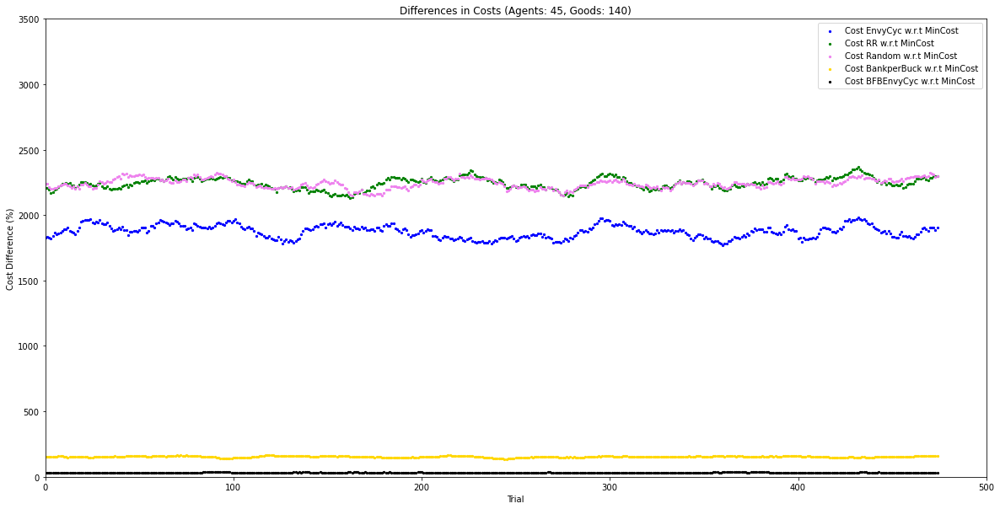

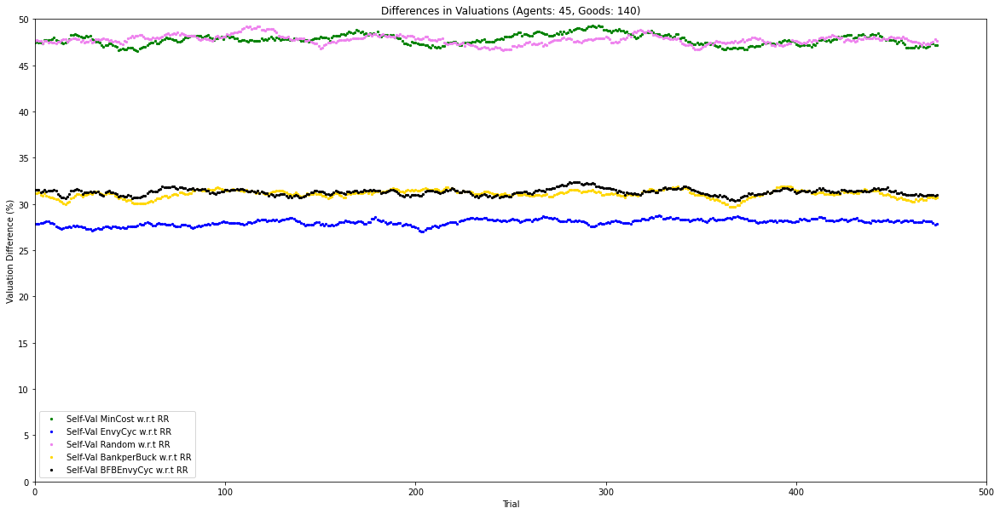

Agents :  50 	 Goods : 50
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1820.0  %
Cost difference of Round Robin w.r.t Min cost : 
 1970.0  %
Cost difference of Random w.r.t Min cost : 
 2311.0  %
Cost difference of Bank per Buck w.r.t Min cost : 
 247.01  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 27.01  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.61  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 22.43  %
Self Valuation difference of Random w.r.t Round Robin : 
 54.82  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 24.24  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.81  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

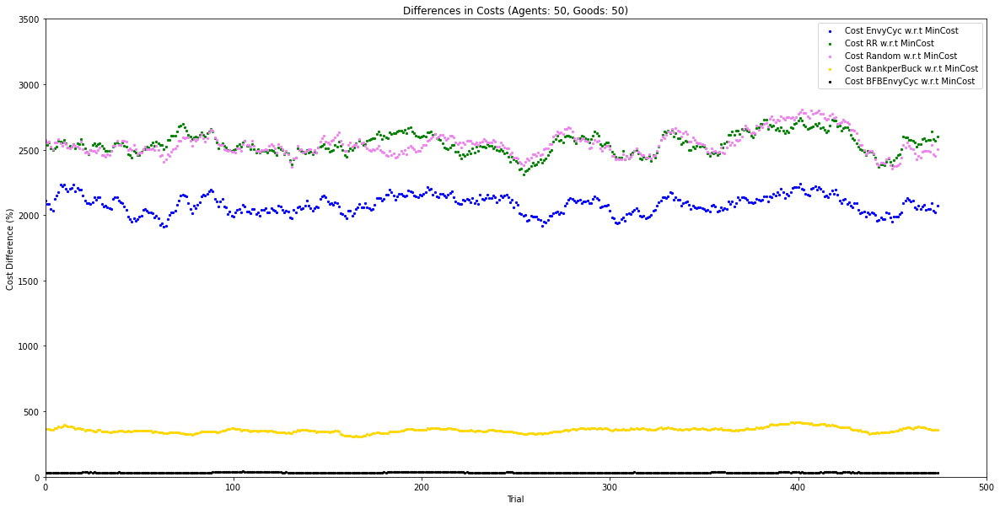

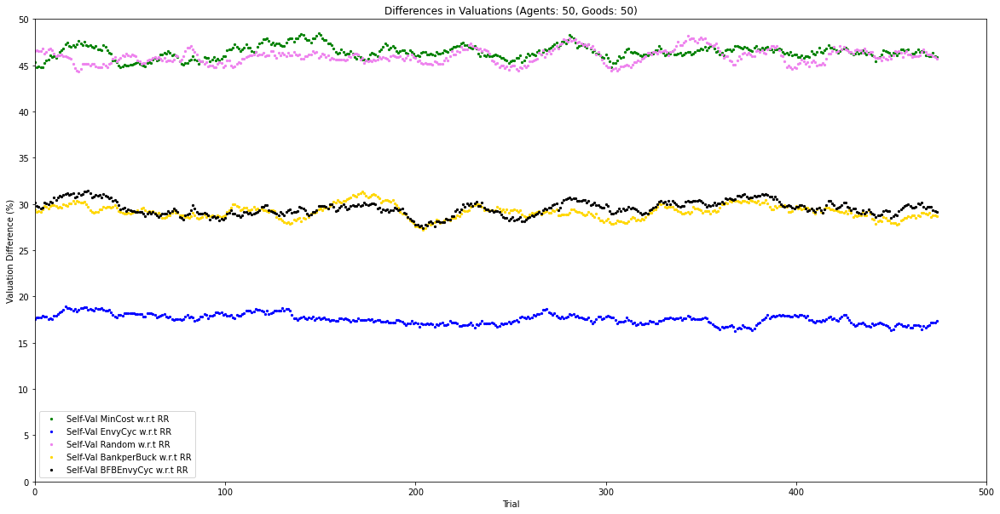

Agents :  50 	 Goods : 60
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2318.28  %
Cost difference of Round Robin w.r.t Min cost : 
 3154.84  %
Cost difference of Random w.r.t Min cost : 
 2647.31  %
Cost difference of Bank per Buck w.r.t Min cost : 
 226.89  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 44.1  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.49  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 15.73  %
Self Valuation difference of Random w.r.t Round Robin : 
 53.09  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.21  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.35  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

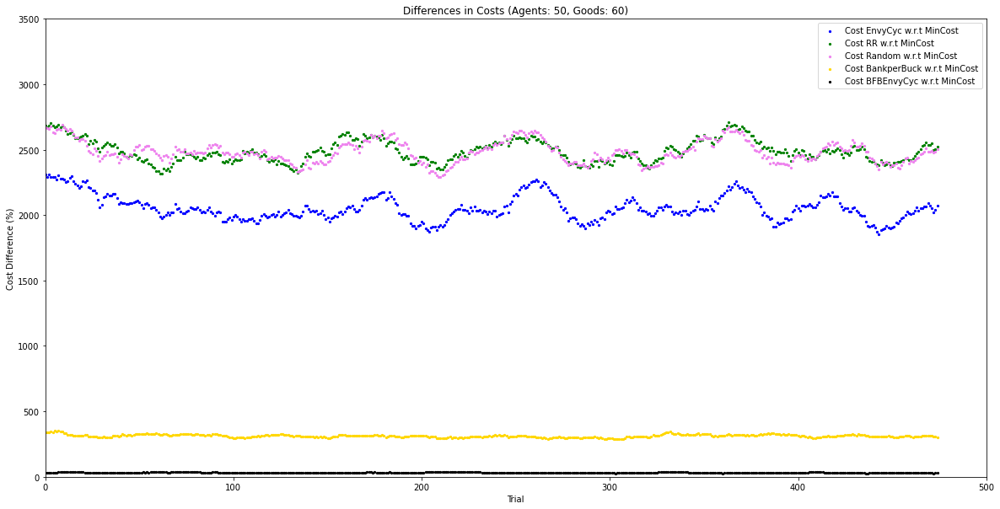

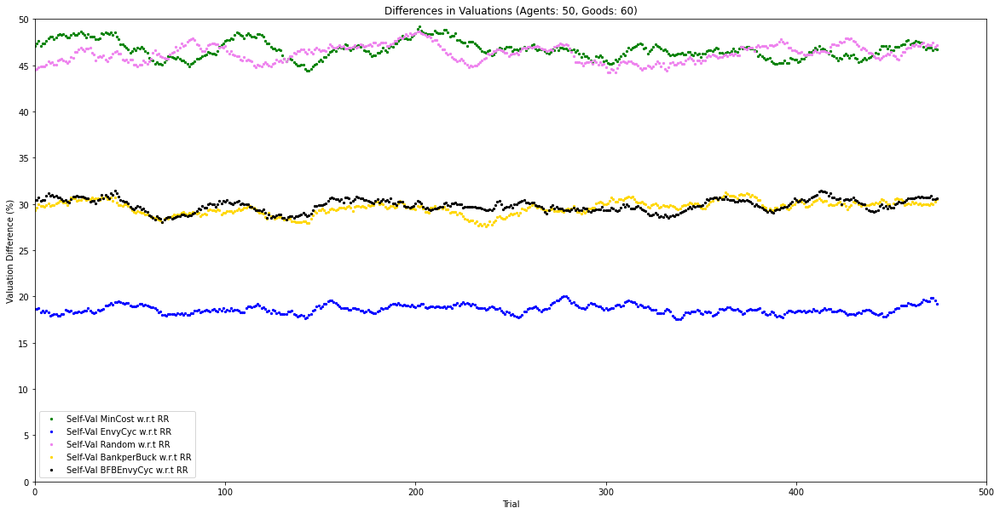

Agents :  50 	 Goods : 70
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1952.05  %
Cost difference of Round Robin w.r.t Min cost : 
 2202.74  %
Cost difference of Random w.r.t Min cost : 
 2354.79  %
Cost difference of Bank per Buck w.r.t Min cost : 
 181.51  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 35.62  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 48.01  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 20.56  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.02  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.04  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.16  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

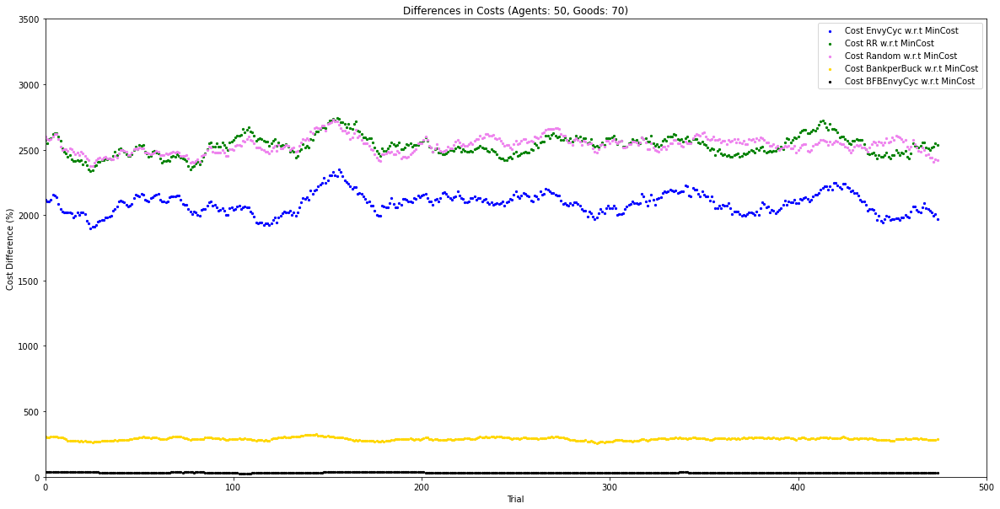

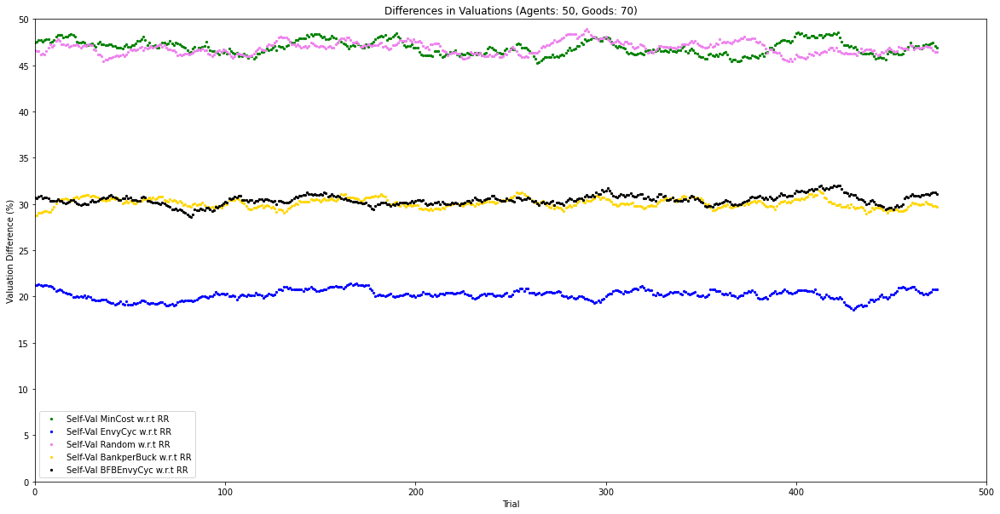

Agents :  50 	 Goods : 80
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1742.93  %
Cost difference of Round Robin w.r.t Min cost : 
 1979.58  %
Cost difference of Random w.r.t Min cost : 
 1859.69  %
Cost difference of Bank per Buck w.r.t Min cost : 
 178.02  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 25.66  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 50.17  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 16.97  %
Self Valuation difference of Random w.r.t Round Robin : 
 43.52  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 26.4  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 31.48  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

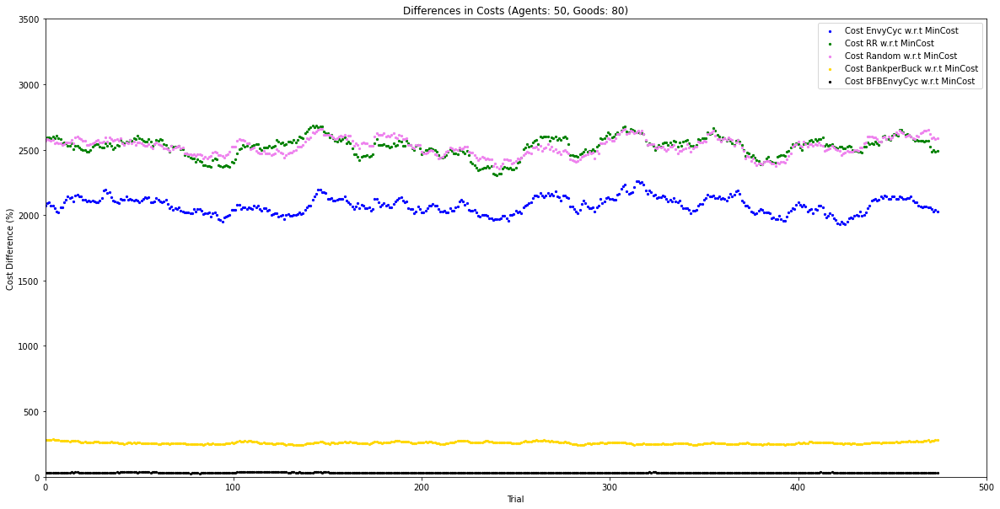

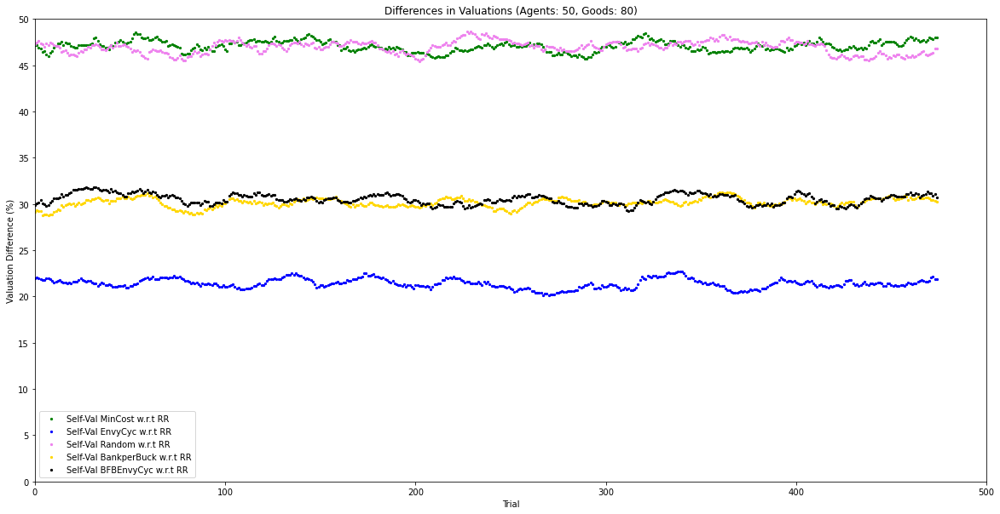

Agents :  50 	 Goods : 90
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1856.52  %
Cost difference of Round Robin w.r.t Min cost : 
 2802.48  %
Cost difference of Random w.r.t Min cost : 
 2587.58  %
Cost difference of Bank per Buck w.r.t Min cost : 
 261.5  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 24.23  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 49.39  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 25.45  %
Self Valuation difference of Random w.r.t Round Robin : 
 41.0  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 32.9  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 33.24  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

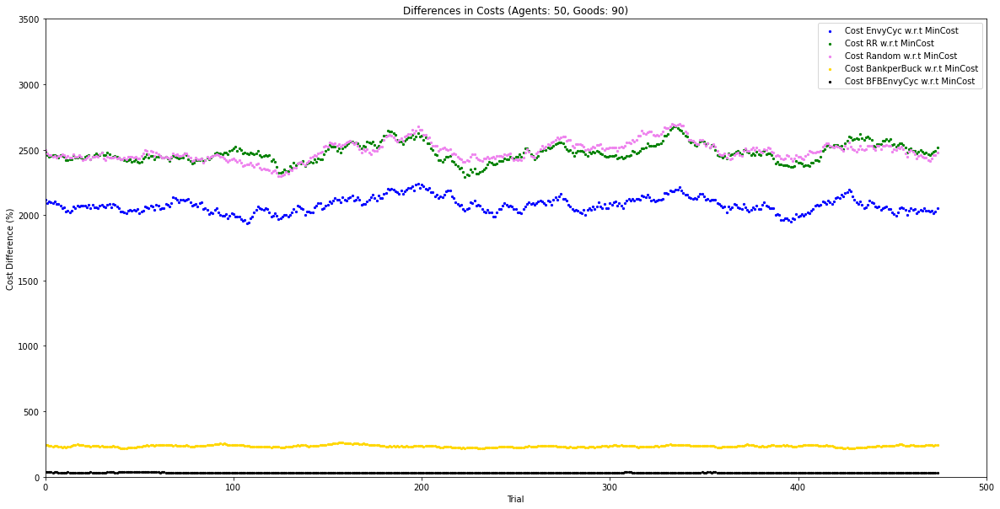

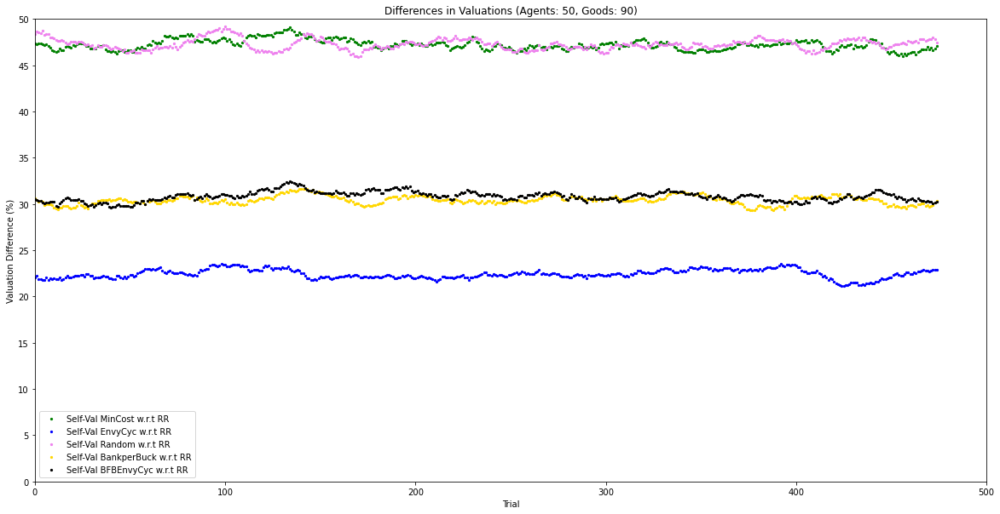

Agents :  50 	 Goods : 100
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2304.69  %
Cost difference of Round Robin w.r.t Min cost : 
 2452.6  %
Cost difference of Random w.r.t Min cost : 
 2730.21  %
Cost difference of Bank per Buck w.r.t Min cost : 
 145.84  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 46.36  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 49.75  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 23.43  %
Self Valuation difference of Random w.r.t Round Robin : 
 41.04  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 33.0  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 32.64  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

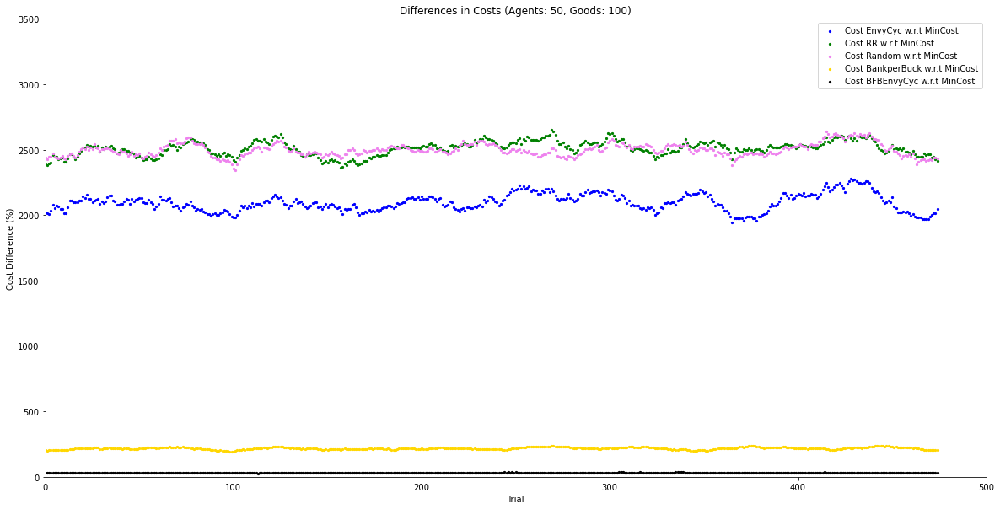

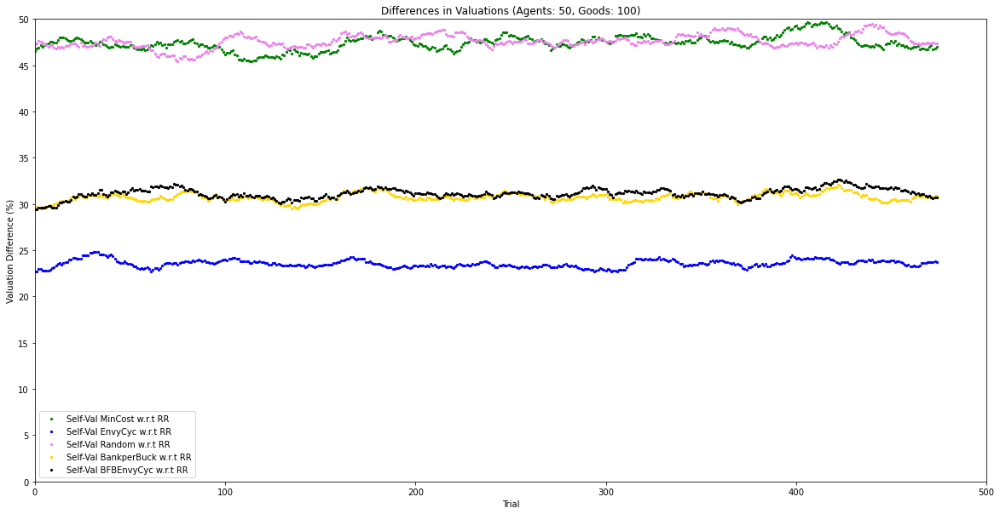

Agents :  50 	 Goods : 110
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2382.54  %
Cost difference of Round Robin w.r.t Min cost : 
 2758.2  %
Cost difference of Random w.r.t Min cost : 
 2795.77  %
Cost difference of Bank per Buck w.r.t Min cost : 
 271.97  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 22.76  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 48.05  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 27.06  %
Self Valuation difference of Random w.r.t Round Robin : 
 47.11  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 34.44  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 33.42  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

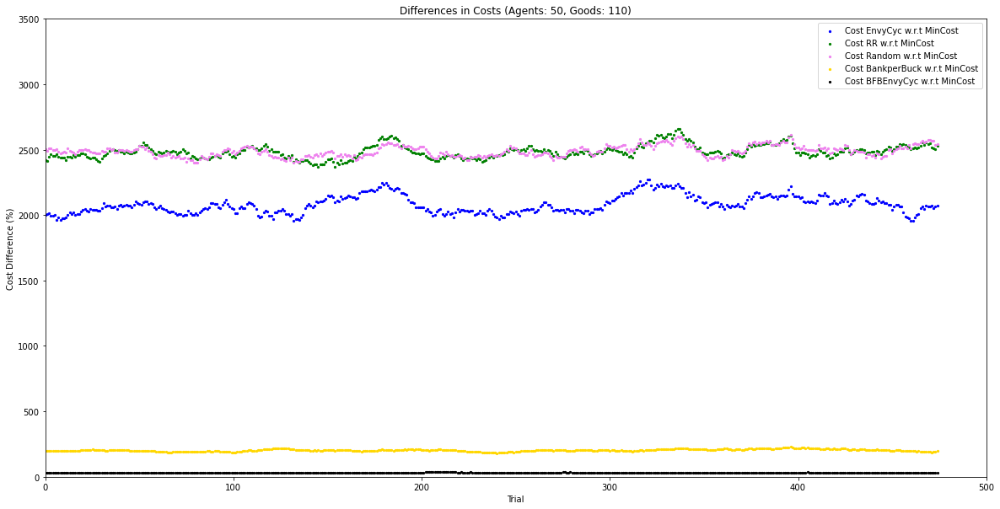

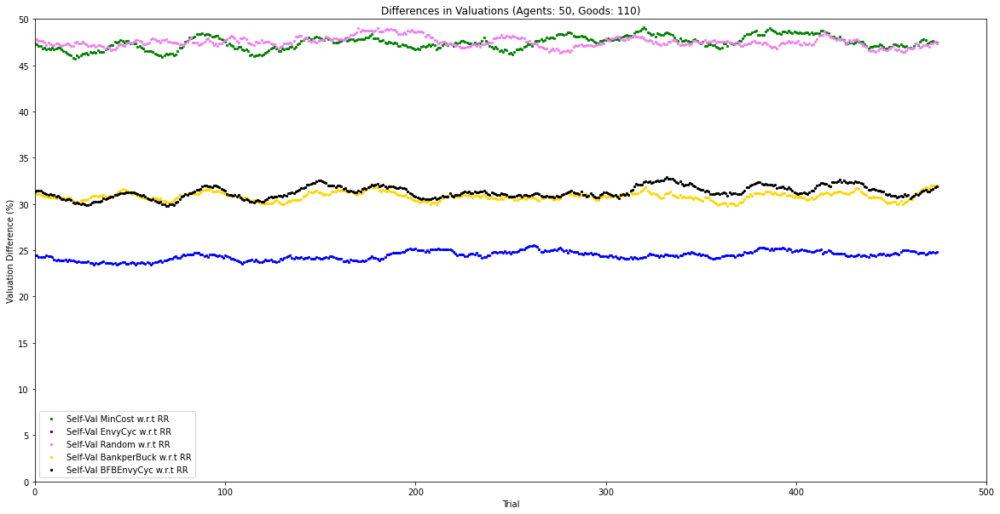

Agents :  50 	 Goods : 120
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2456.68  %
Cost difference of Round Robin w.r.t Min cost : 
 2612.44  %
Cost difference of Random w.r.t Min cost : 
 2865.9  %
Cost difference of Bank per Buck w.r.t Min cost : 
 195.86  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 46.56  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.73  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 26.51  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.01  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 34.61  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 32.09  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

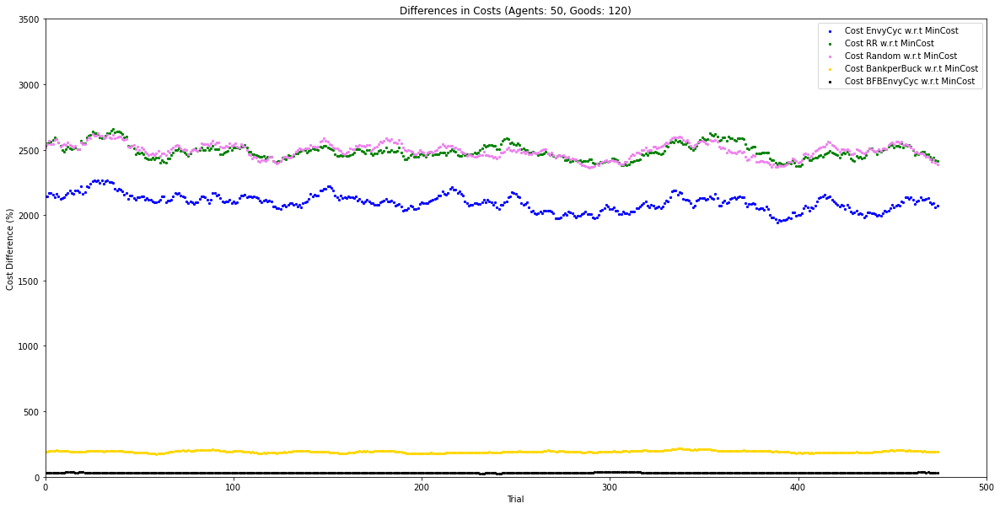

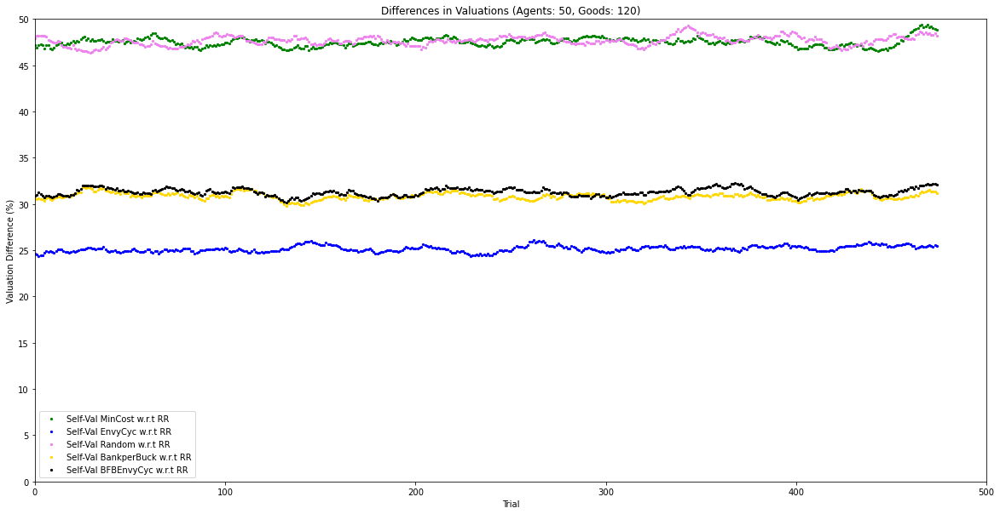

Agents :  50 	 Goods : 130
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2126.48  %
Cost difference of Round Robin w.r.t Min cost : 
 2463.64  %
Cost difference of Random w.r.t Min cost : 
 2359.68  %
Cost difference of Bank per Buck w.r.t Min cost : 
 204.75  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 35.58  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 48.67  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 27.84  %
Self Valuation difference of Random w.r.t Round Robin : 
 47.23  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 30.39  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 31.11  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------

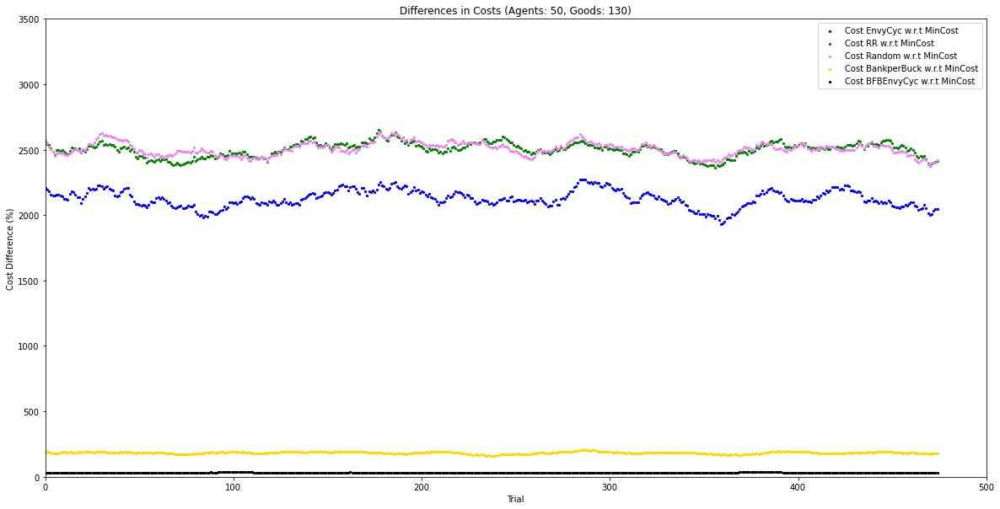

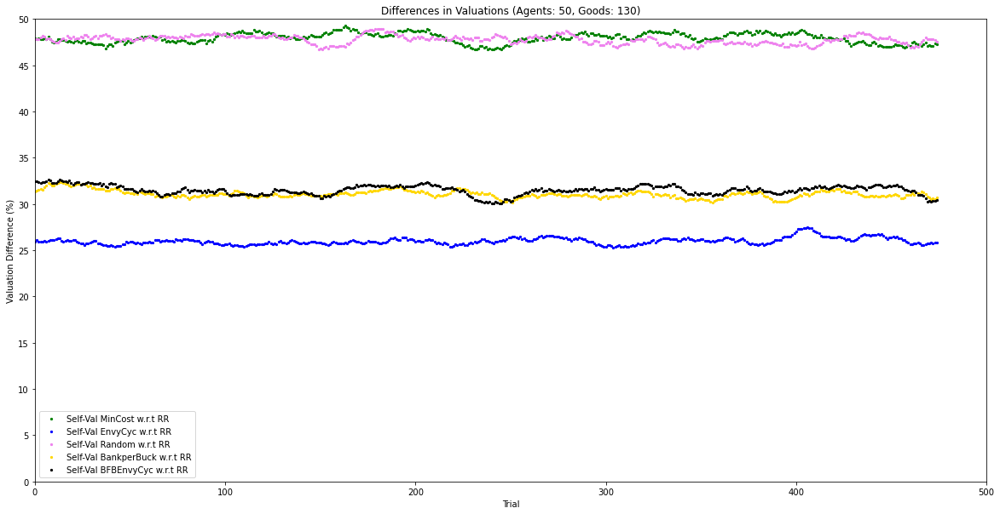

Agents :  50 	 Goods : 140
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1956.9  %
Cost difference of Round Robin w.r.t Min cost : 
 2265.32  %
Cost difference of Random w.r.t Min cost : 
 2402.02  %
Cost difference of Bank per Buck w.r.t Min cost : 
 192.26  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 34.35  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.46  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 25.18  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.87  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.08  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.94  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

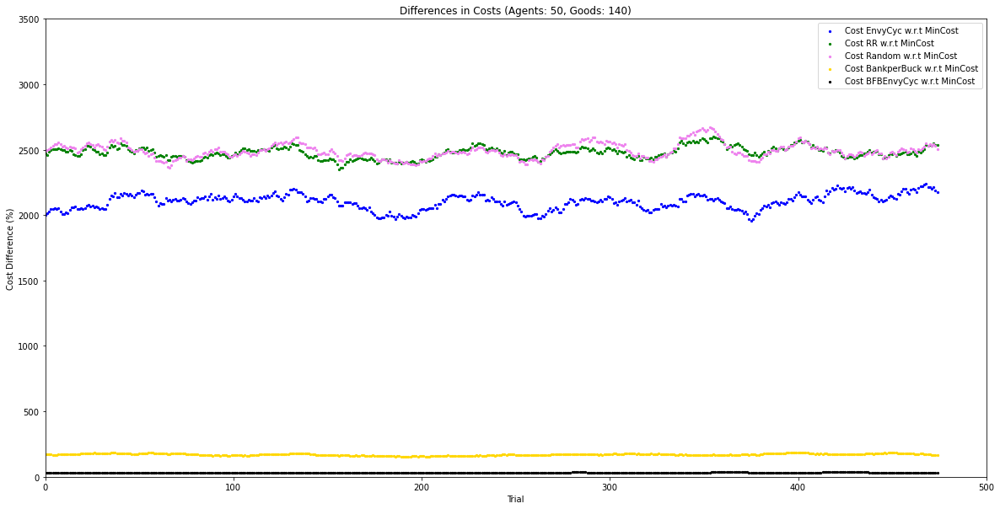

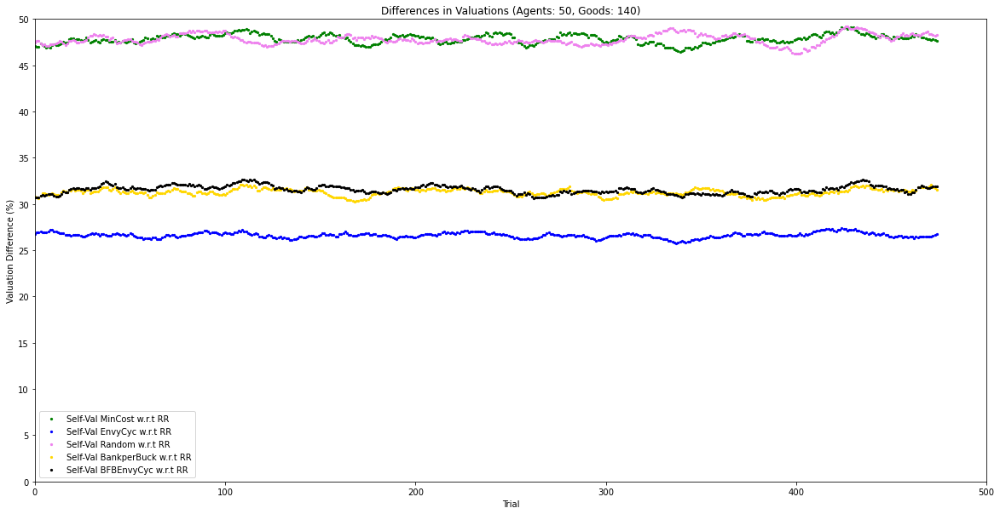

Agents :  55 	 Goods : 50
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2430.11  %
Cost difference of Round Robin w.r.t Min cost : 
 2911.83  %
Cost difference of Random w.r.t Min cost : 
 2774.19  %
Cost difference of Bank per Buck w.r.t Min cost : 
 379.57  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 33.34  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 50.26  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 19.93  %
Self Valuation difference of Random w.r.t Round Robin : 
 51.89  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 27.54  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 32.37  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

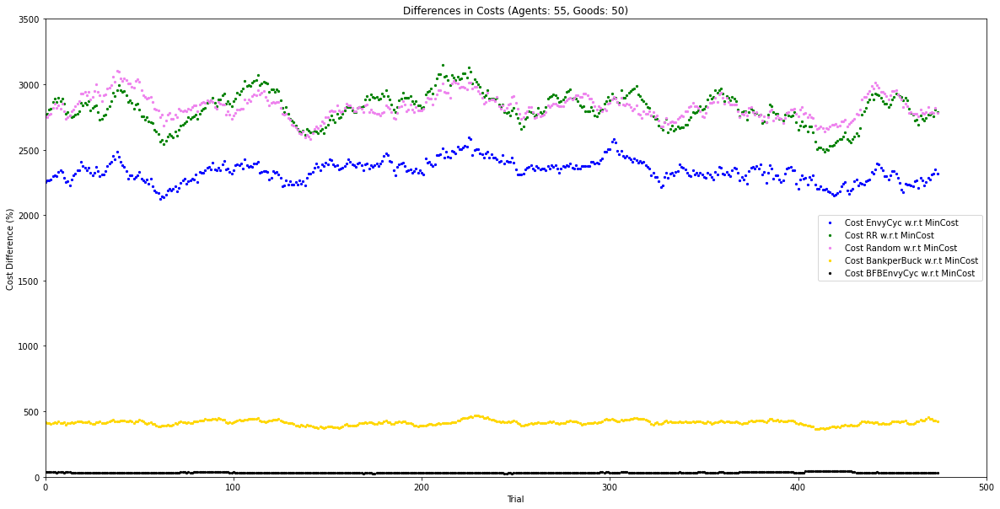

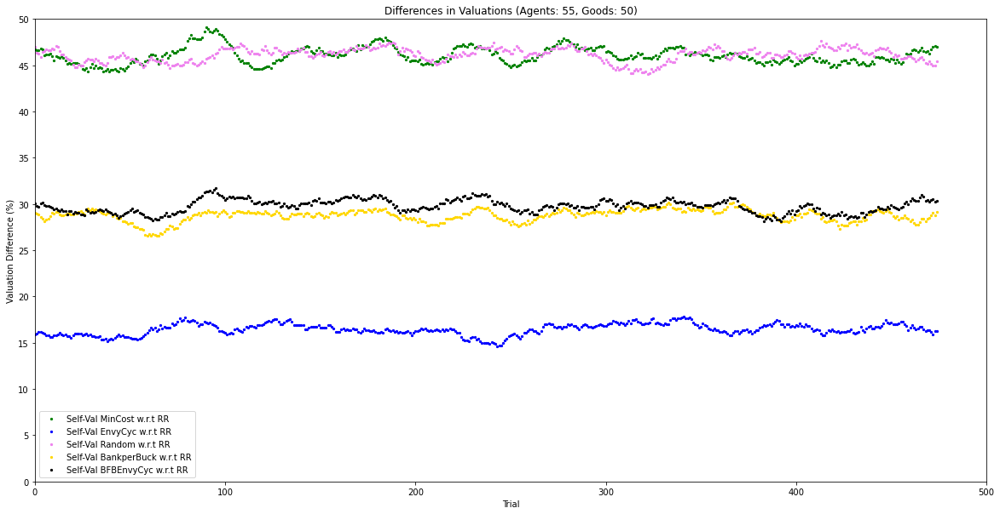

Agents :  55 	 Goods : 60
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2361.26  %
Cost difference of Round Robin w.r.t Min cost : 
 2528.83  %
Cost difference of Random w.r.t Min cost : 
 2632.43  %
Cost difference of Bank per Buck w.r.t Min cost : 
 345.05  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 36.94  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 54.17  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 16.39  %
Self Valuation difference of Random w.r.t Round Robin : 
 49.79  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.08  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.74  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

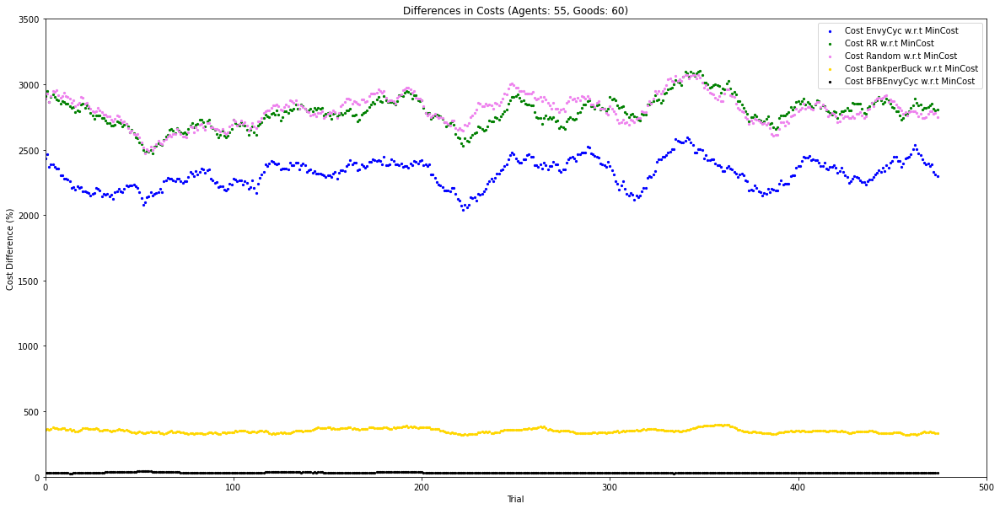

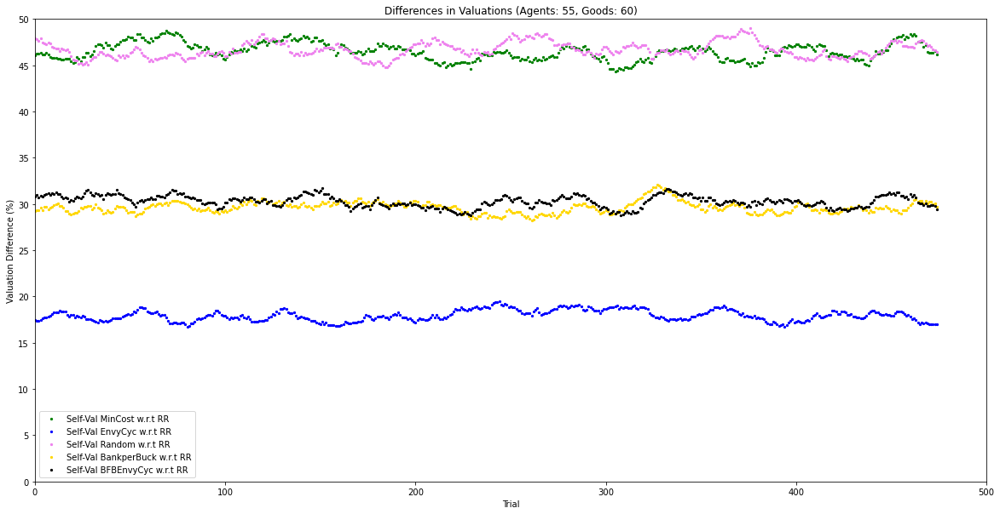

Agents :  55 	 Goods : 70
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 3517.31  %
Cost difference of Round Robin w.r.t Min cost : 
 3496.15  %
Cost difference of Random w.r.t Min cost : 
 3160.58  %
Cost difference of Bank per Buck w.r.t Min cost : 
 470.2  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 38.47  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 49.24  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 16.45  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.34  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.28  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 33.04  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

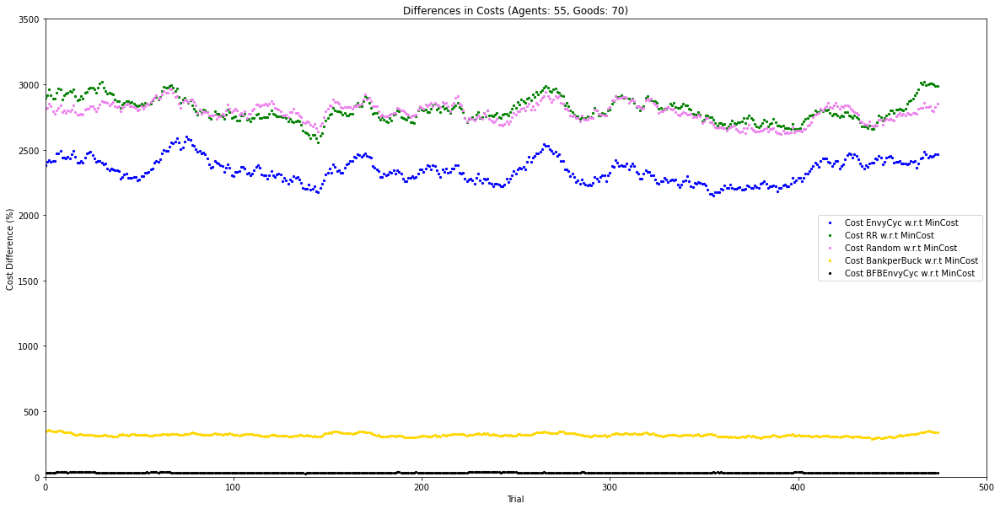

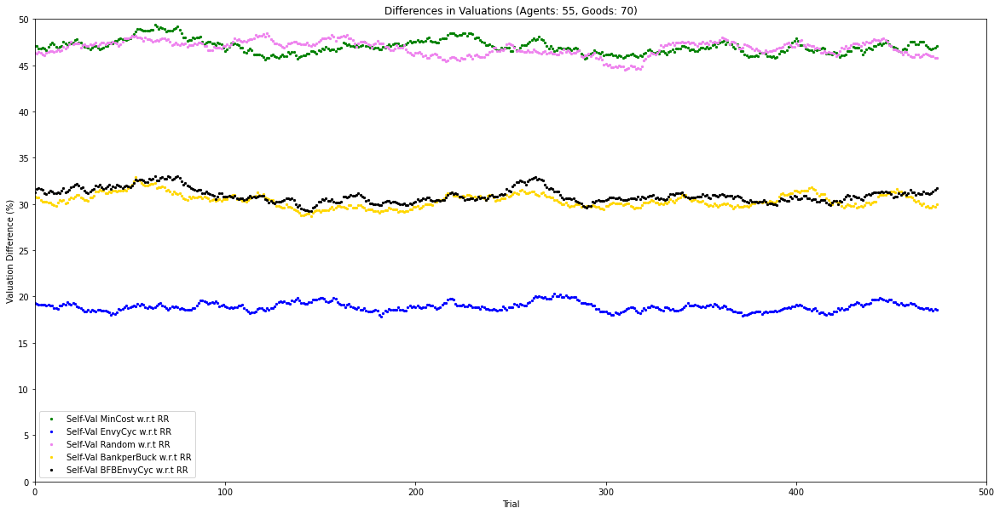

Agents :  55 	 Goods : 80
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1418.24  %
Cost difference of Round Robin w.r.t Min cost : 
 2600.0  %
Cost difference of Random w.r.t Min cost : 
 2336.49  %
Cost difference of Bank per Buck w.r.t Min cost : 
 281.76  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 17.57  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 40.67  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 18.11  %
Self Valuation difference of Random w.r.t Round Robin : 
 48.98  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 26.39  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.86  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

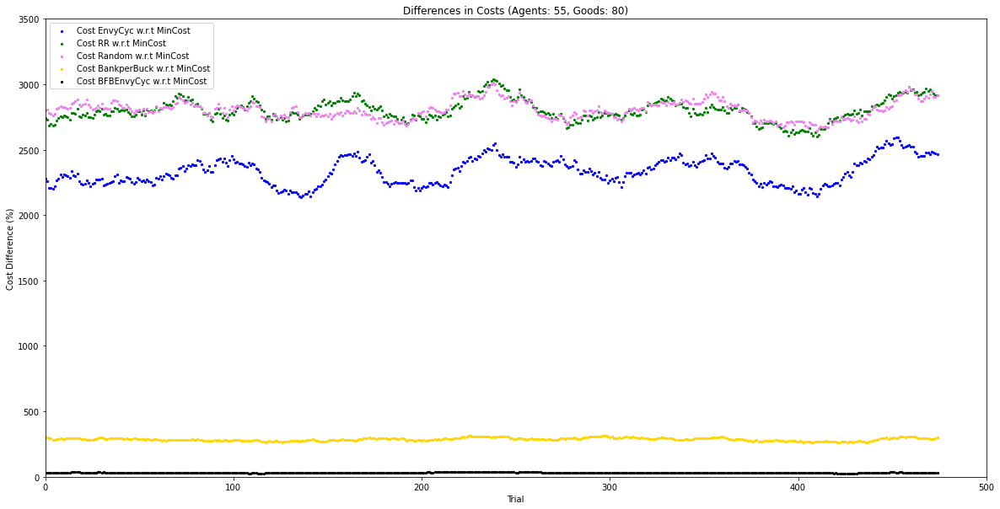

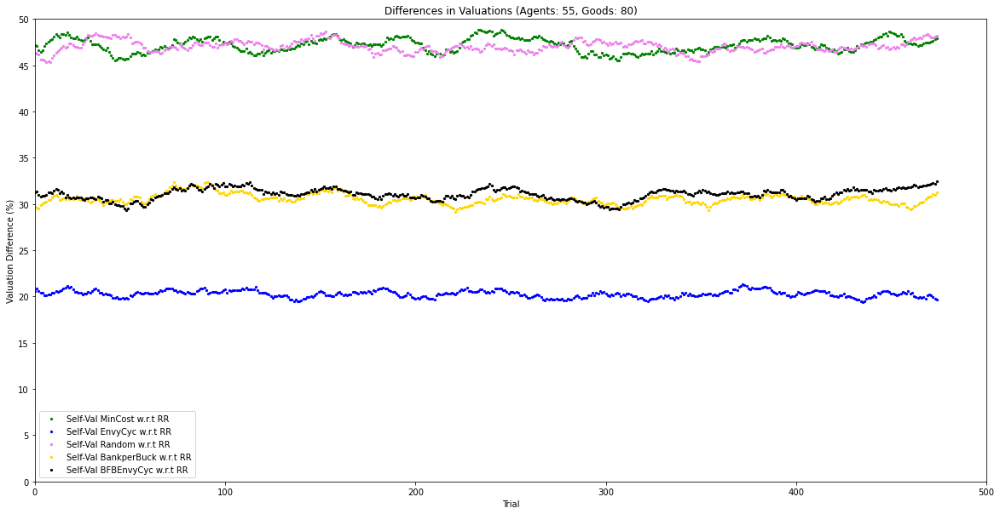

Agents :  55 	 Goods : 90
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2473.65  %
Cost difference of Round Robin w.r.t Min cost : 
 2550.9  %
Cost difference of Random w.r.t Min cost : 
 2859.88  %
Cost difference of Bank per Buck w.r.t Min cost : 
 244.32  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 26.95  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.16  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 20.23  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.33  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.37  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 26.87  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

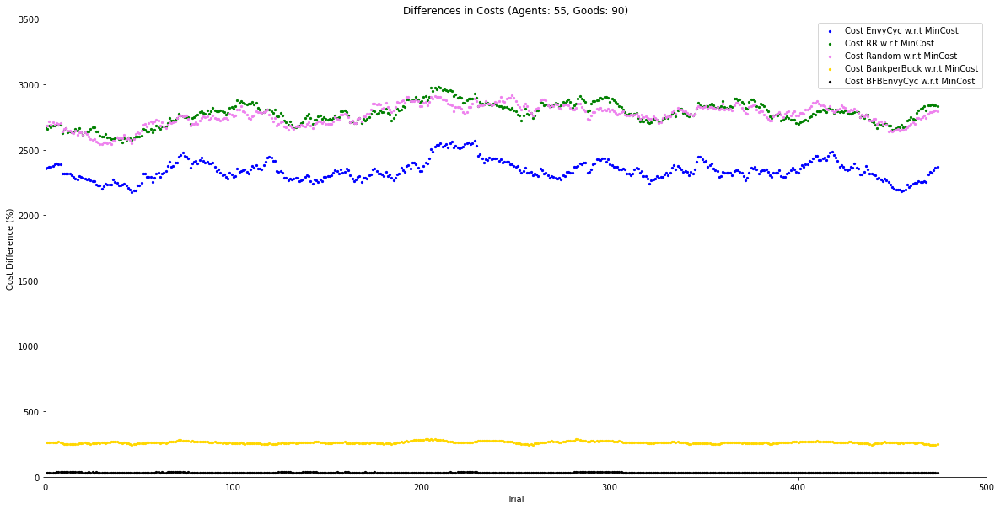

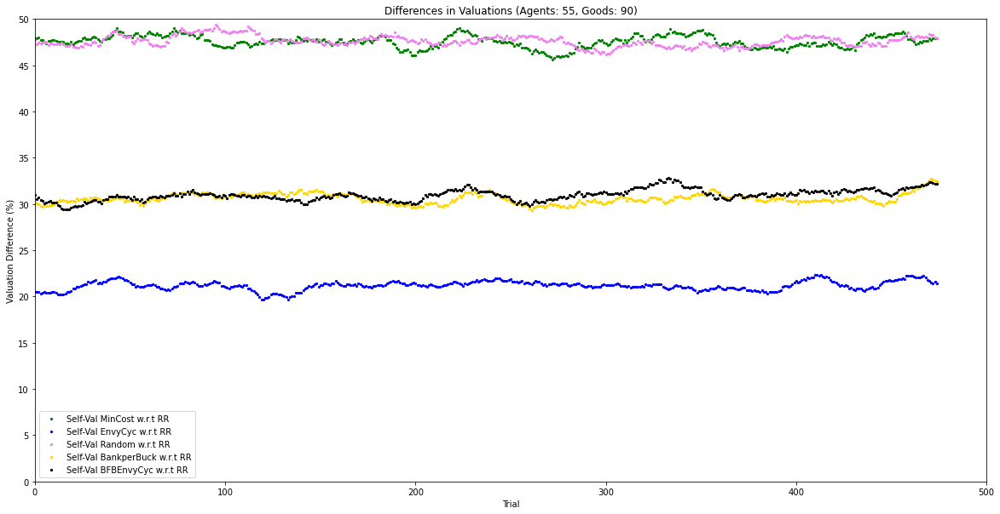

Agents :  55 	 Goods : 100
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1699.51  %
Cost difference of Round Robin w.r.t Min cost : 
 2185.71  %
Cost difference of Random w.r.t Min cost : 
 2220.69  %
Cost difference of Bank per Buck w.r.t Min cost : 
 211.34  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 39.91  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 51.14  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 22.56  %
Self Valuation difference of Random w.r.t Round Robin : 
 49.4  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 34.18  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 33.84  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

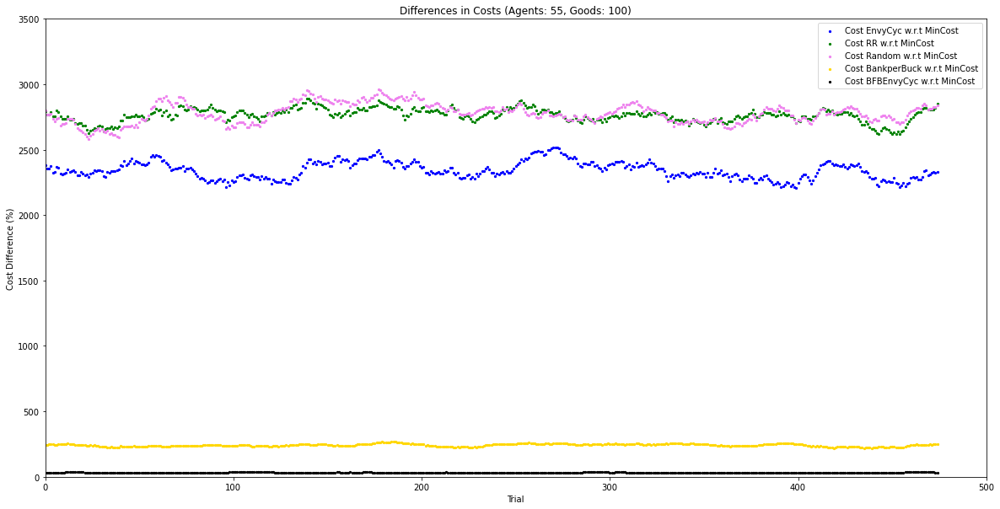

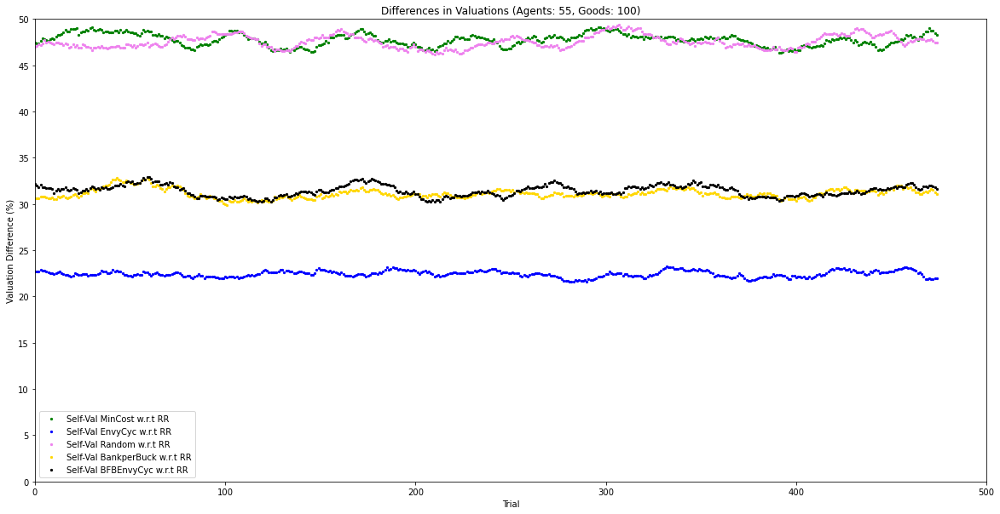

Agents :  55 	 Goods : 110
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1882.52  %
Cost difference of Round Robin w.r.t Min cost : 
 2661.65  %
Cost difference of Random w.r.t Min cost : 
 2584.47  %
Cost difference of Bank per Buck w.r.t Min cost : 
 209.23  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 39.33  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.06  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 24.19  %
Self Valuation difference of Random w.r.t Round Robin : 
 49.93  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 31.74  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.8  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

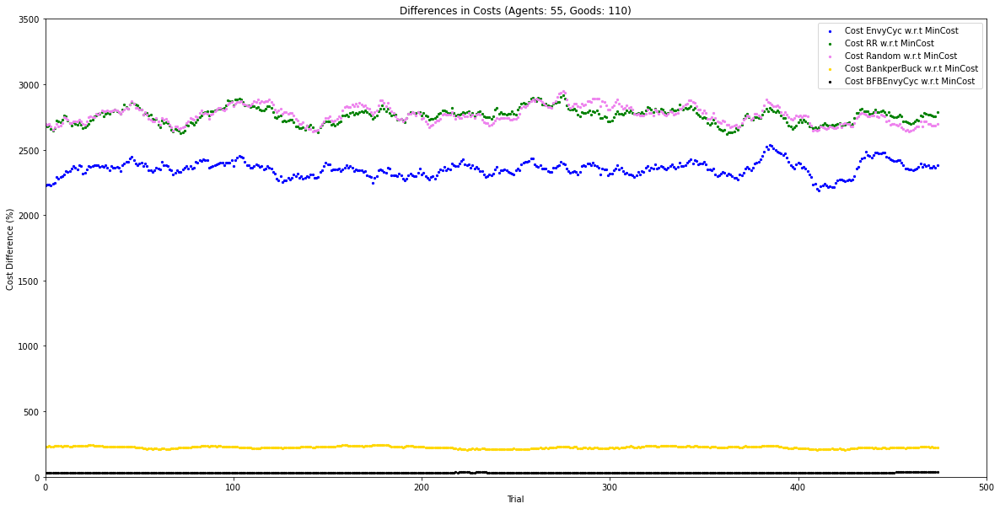

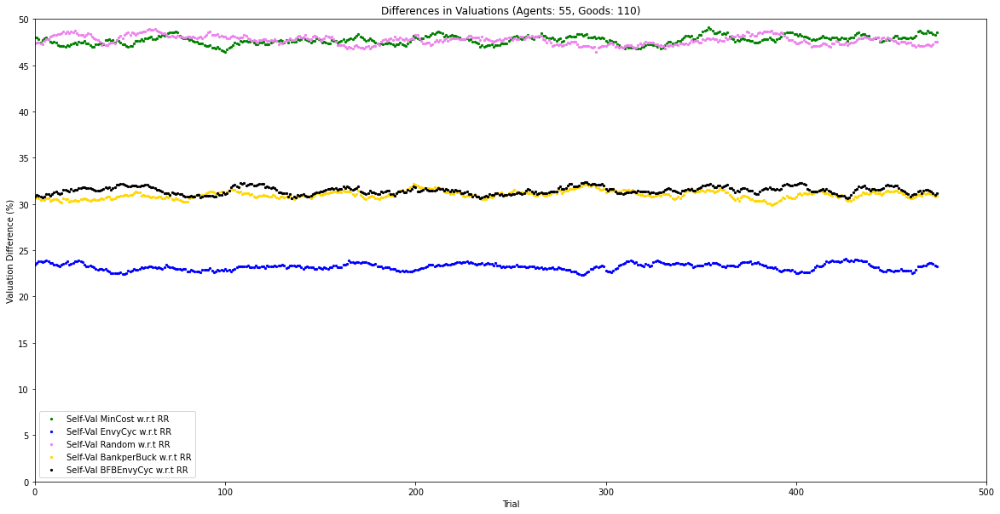

Agents :  55 	 Goods : 120
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2534.97  %
Cost difference of Round Robin w.r.t Min cost : 
 3151.91  %
Cost difference of Random w.r.t Min cost : 
 3195.63  %
Cost difference of Bank per Buck w.r.t Min cost : 
 152.47  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 42.64  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.87  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 24.53  %
Self Valuation difference of Random w.r.t Round Robin : 
 51.38  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 31.66  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 31.67  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------

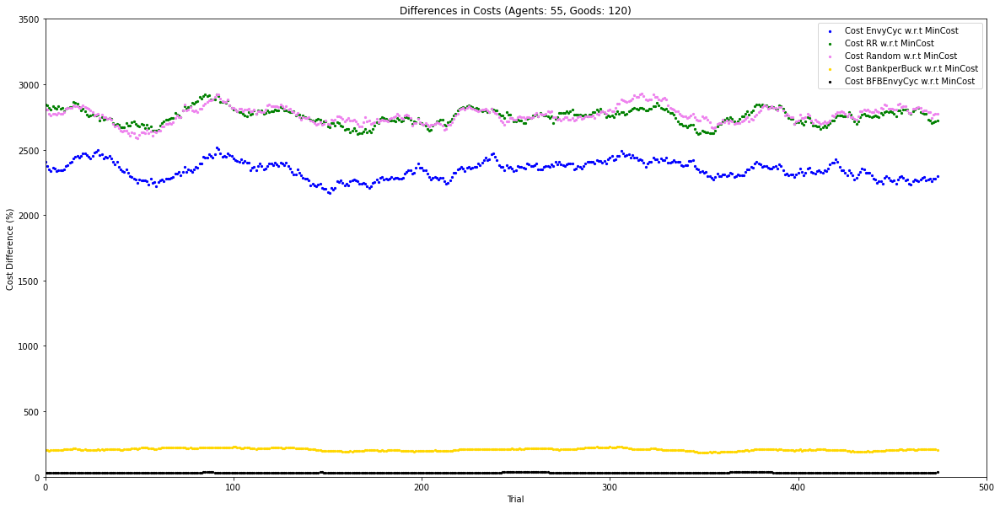

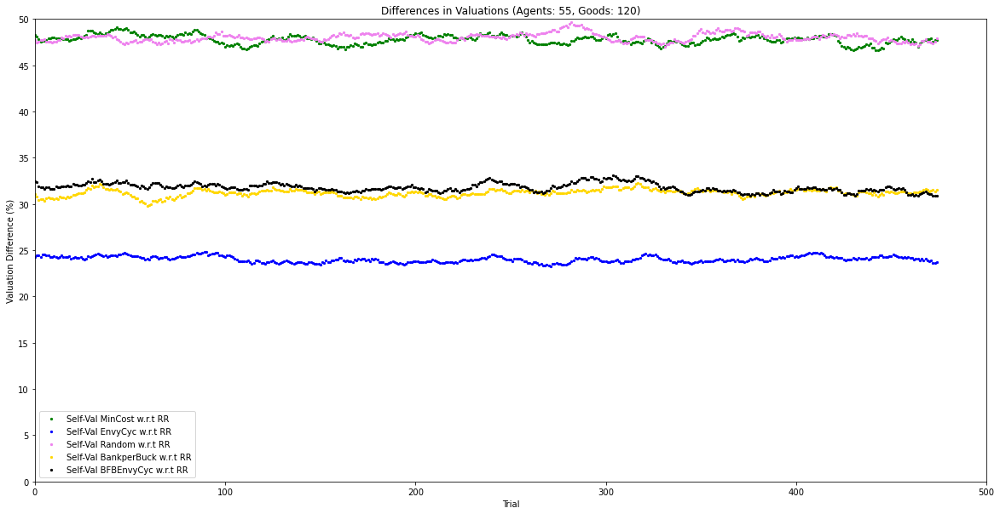

Agents :  55 	 Goods : 130
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2800.0  %
Cost difference of Round Robin w.r.t Min cost : 
 3084.47  %
Cost difference of Random w.r.t Min cost : 
 3243.69  %
Cost difference of Bank per Buck w.r.t Min cost : 
 272.34  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 41.27  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.16  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 26.39  %
Self Valuation difference of Random w.r.t Round Robin : 
 49.22  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.29  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.25  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

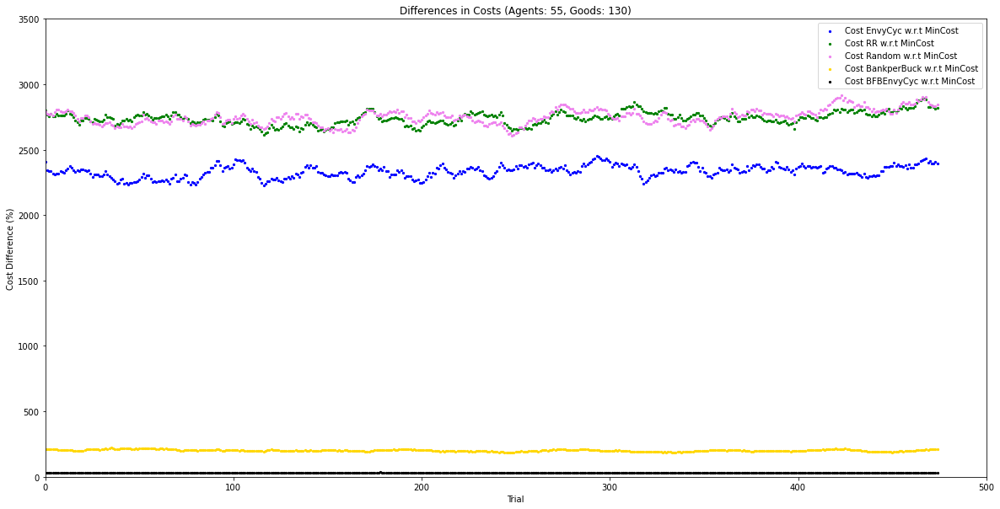

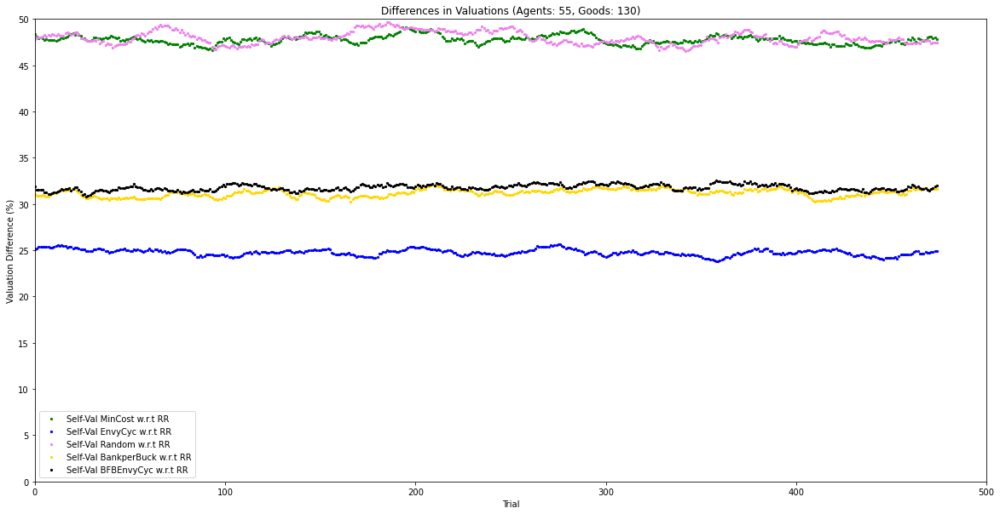

Agents :  55 	 Goods : 140
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2775.92  %
Cost difference of Round Robin w.r.t Min cost : 
 3565.45  %
Cost difference of Random w.r.t Min cost : 
 3495.29  %
Cost difference of Bank per Buck w.r.t Min cost : 
 217.3  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 36.67  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 45.4  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 29.4  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.34  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 30.46  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 30.88  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

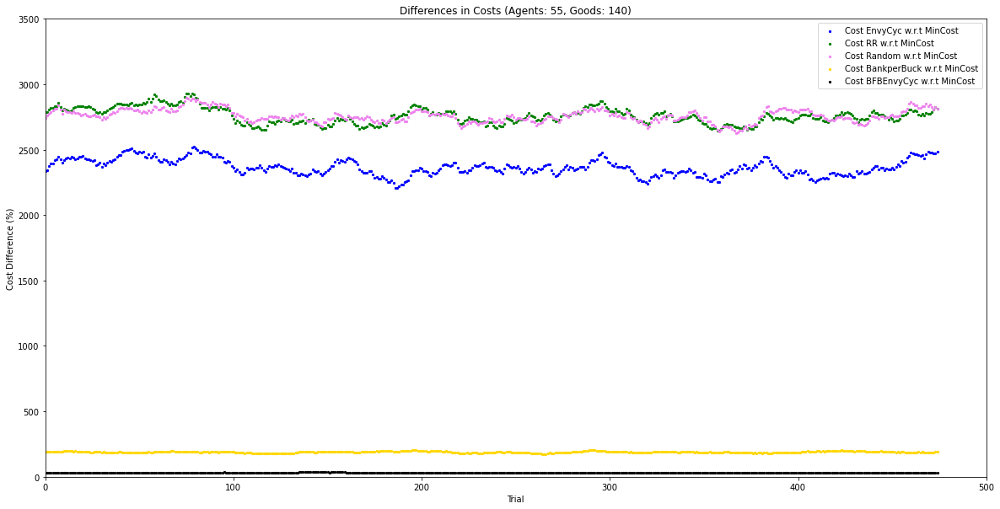

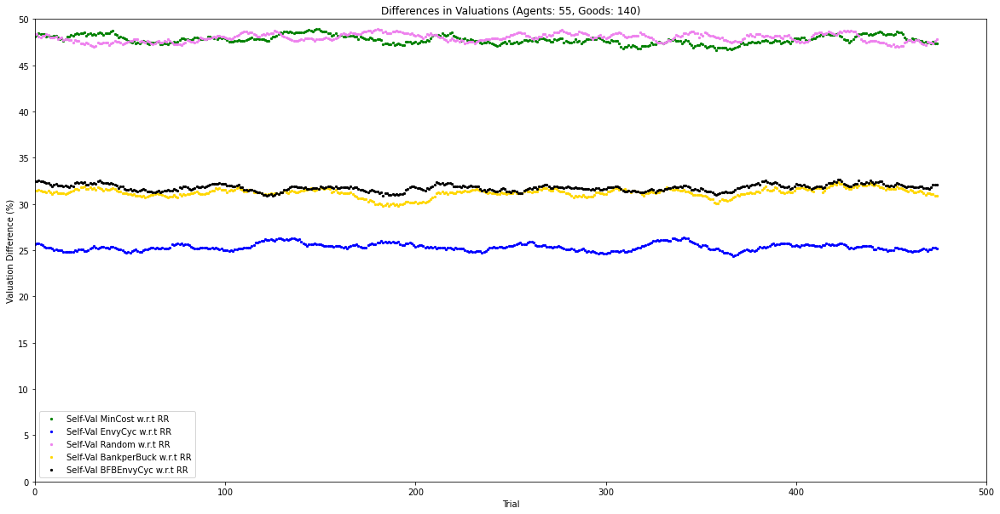

Agents :  60 	 Goods : 50
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1718.56  %
Cost difference of Round Robin w.r.t Min cost : 
 2270.1  %
Cost difference of Random w.r.t Min cost : 
 2328.87  %
Cost difference of Bank per Buck w.r.t Min cost : 
 269.08  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 13.41  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.29  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 19.65  %
Self Valuation difference of Random w.r.t Round Robin : 
 56.59  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 32.6  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.39  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

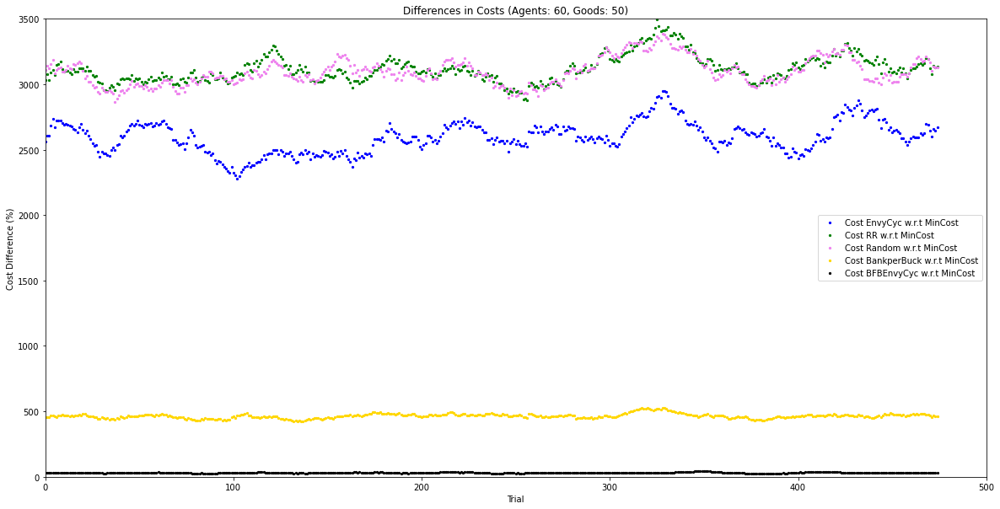

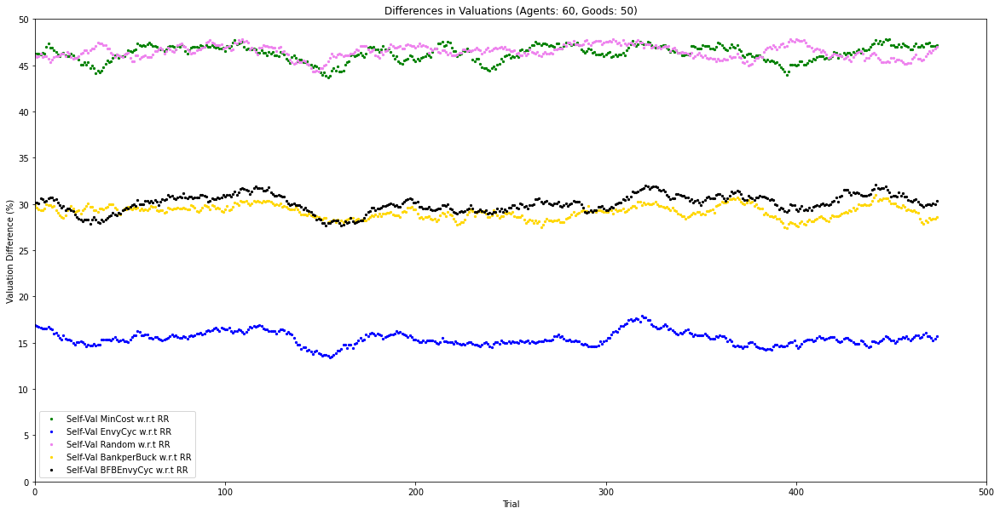

Agents :  60 	 Goods : 60
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2435.0  %
Cost difference of Round Robin w.r.t Min cost : 
 2375.83  %
Cost difference of Random w.r.t Min cost : 
 2340.0  %
Cost difference of Bank per Buck w.r.t Min cost : 
 325.84  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 37.5  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 43.69  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 16.6  %
Self Valuation difference of Random w.r.t Round Robin : 
 46.11  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.06  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 25.39  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-------------------------------------------------

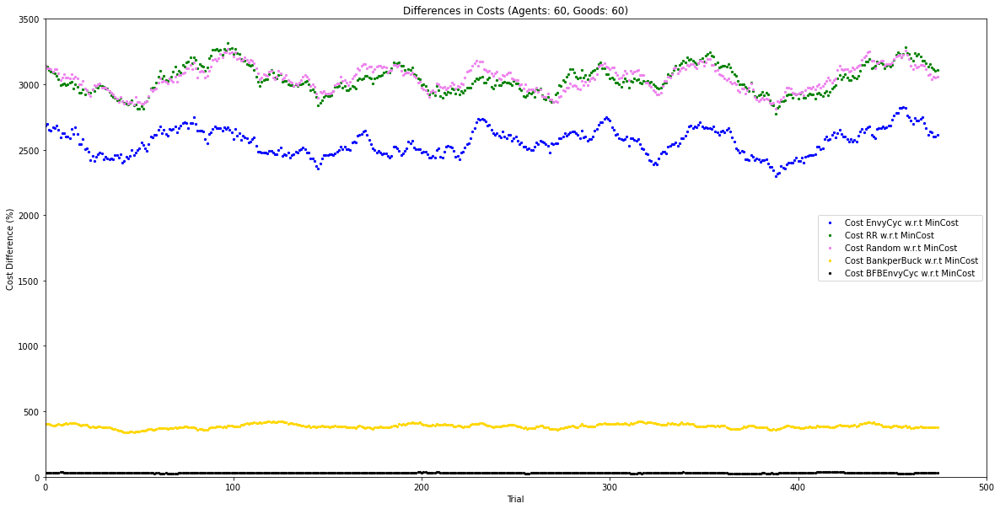

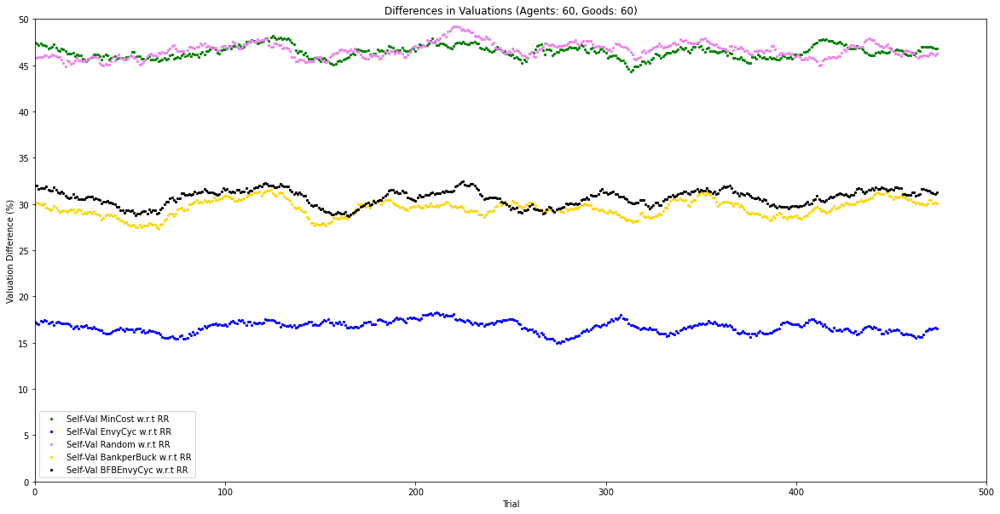

Agents :  60 	 Goods : 70
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 3119.57  %
Cost difference of Round Robin w.r.t Min cost : 
 3802.17  %
Cost difference of Random w.r.t Min cost : 
 3796.74  %
Cost difference of Bank per Buck w.r.t Min cost : 
 493.49  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 21.75  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 48.48  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 18.08  %
Self Valuation difference of Random w.r.t Round Robin : 
 44.44  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 26.75  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 30.21  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

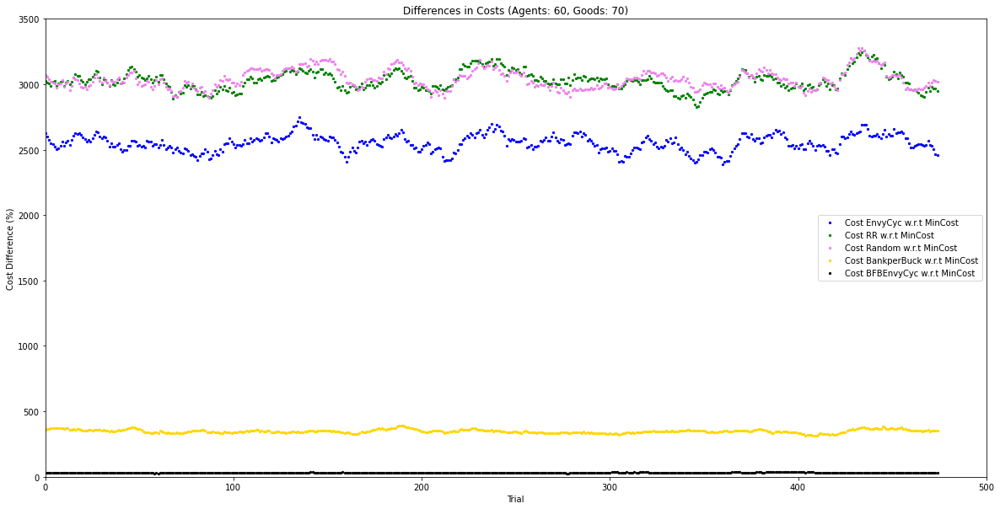

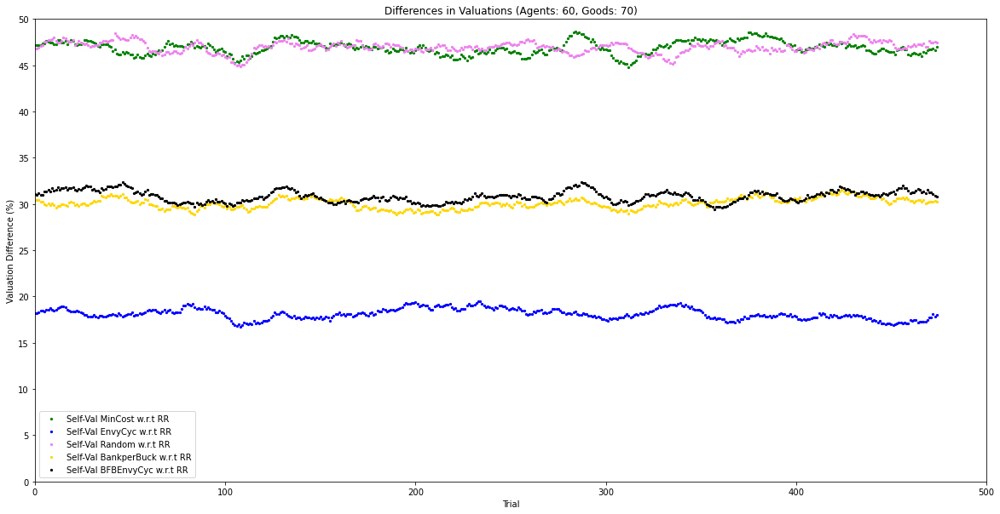

Agents :  60 	 Goods : 80
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2991.13  %
Cost difference of Round Robin w.r.t Min cost : 
 3729.84  %
Cost difference of Random w.r.t Min cost : 
 3005.65  %
Cost difference of Bank per Buck w.r.t Min cost : 
 287.11  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 44.37  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 52.82  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 26.55  %
Self Valuation difference of Random w.r.t Round Robin : 
 42.33  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.75  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 33.45  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

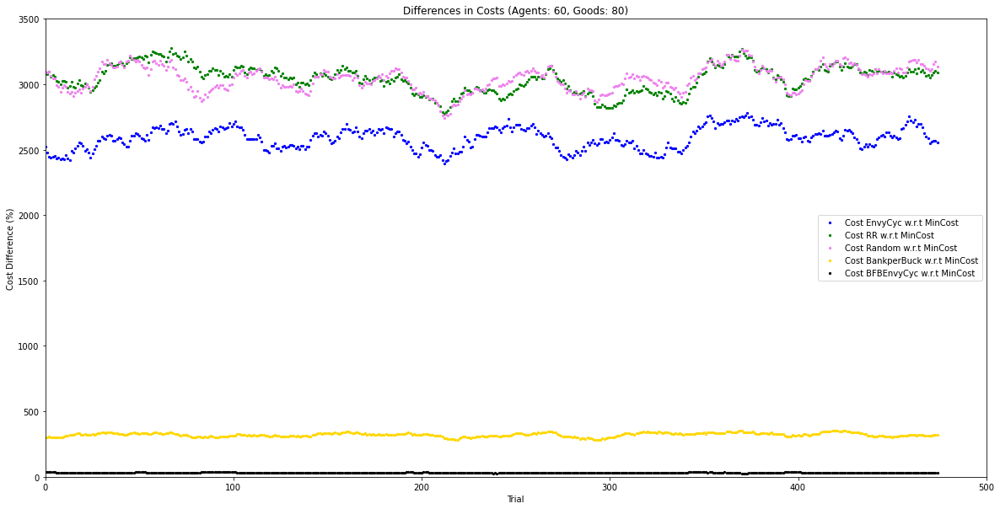

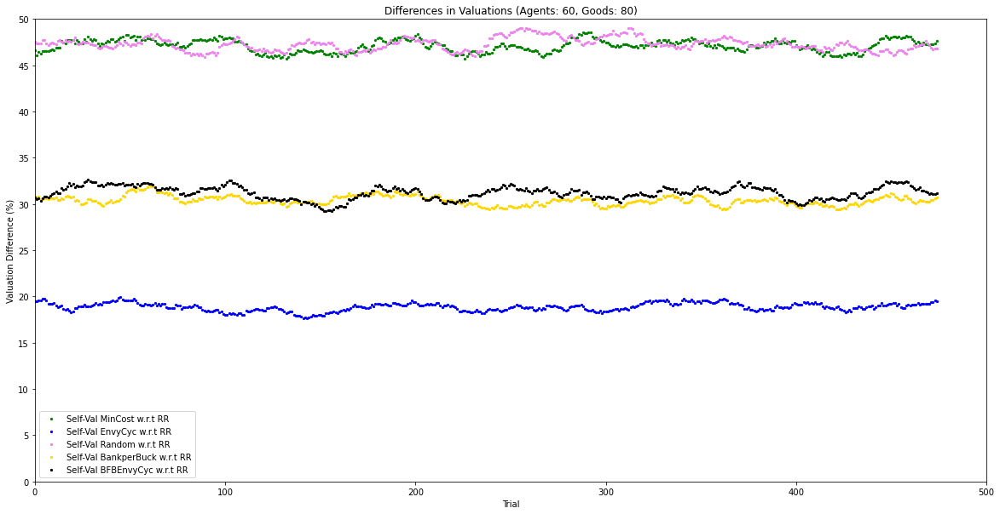

Agents :  60 	 Goods : 90
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1917.61  %
Cost difference of Round Robin w.r.t Min cost : 
 2518.87  %
Cost difference of Random w.r.t Min cost : 
 3013.21  %
Cost difference of Bank per Buck w.r.t Min cost : 
 254.73  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 32.08  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 47.13  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 15.94  %
Self Valuation difference of Random w.r.t Round Robin : 
 53.65  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 26.2  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 29.13  %
-------------------------------------------------------
********************  TRIAL  200   ********************
----------------------------------------------

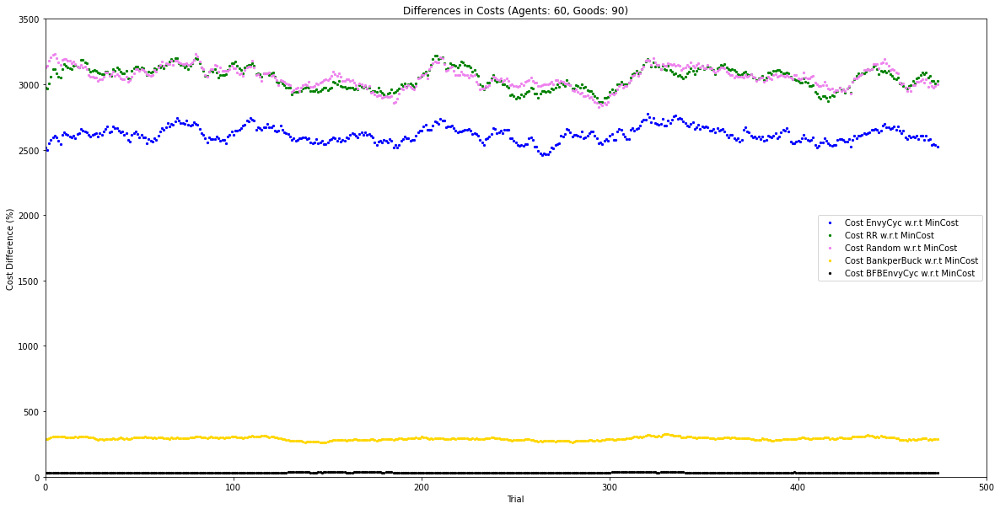

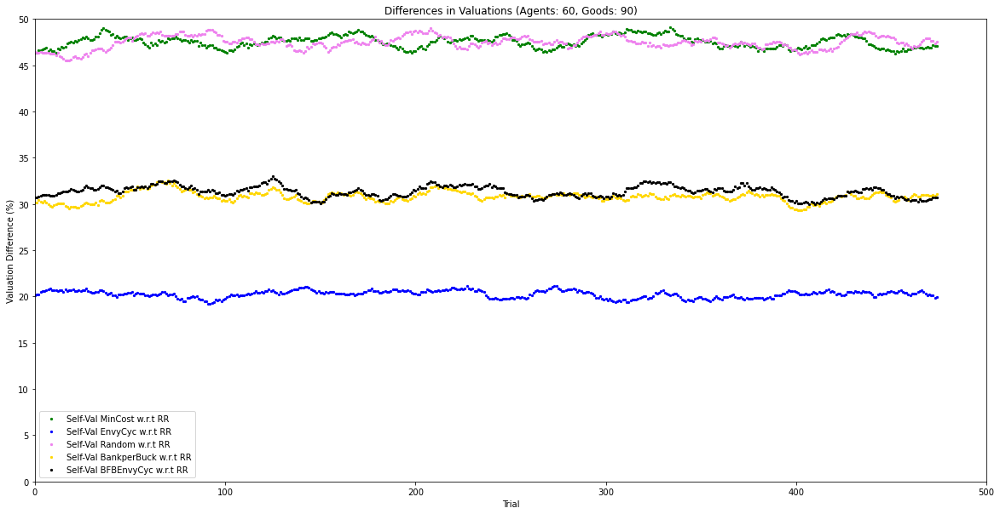

Agents :  60 	 Goods : 100
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2103.8  %
Cost difference of Round Robin w.r.t Min cost : 
 2823.37  %
Cost difference of Random w.r.t Min cost : 
 2712.5  %
Cost difference of Bank per Buck w.r.t Min cost : 
 225.01  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 31.53  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 45.24  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 21.4  %
Self Valuation difference of Random w.r.t Round Robin : 
 53.46  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 28.04  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 26.34  %
-------------------------------------------------------
********************  TRIAL  200   ********************
-----------------------------------------------

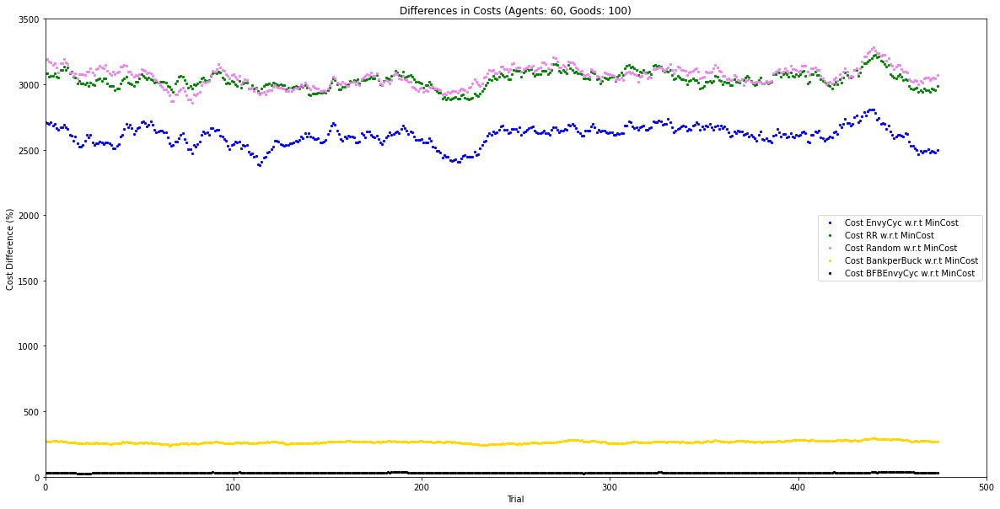

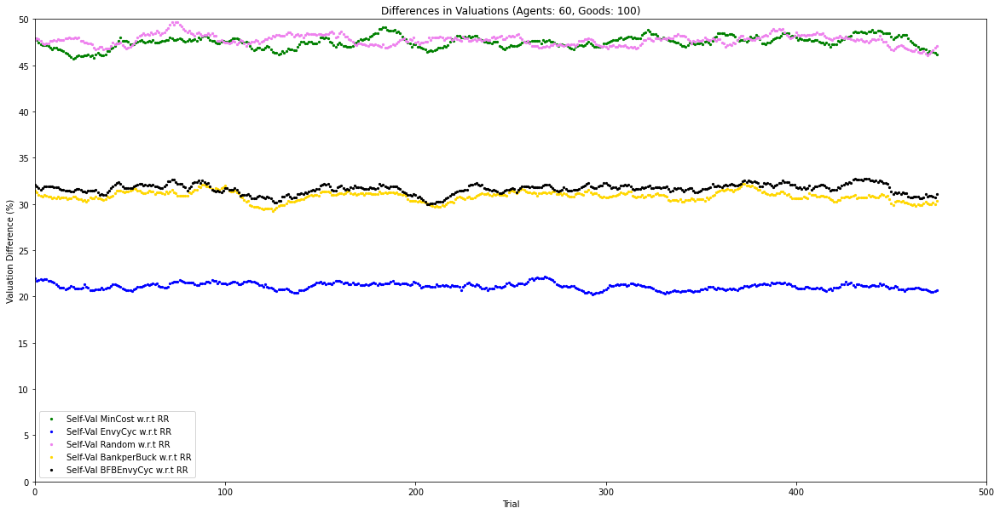

Agents :  60 	 Goods : 110
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2219.19  %
Cost difference of Round Robin w.r.t Min cost : 
 2569.19  %
Cost difference of Random w.r.t Min cost : 
 2836.87  %
Cost difference of Bank per Buck w.r.t Min cost : 
 196.98  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 31.83  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 48.06  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 18.52  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.34  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 34.93  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 33.27  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------

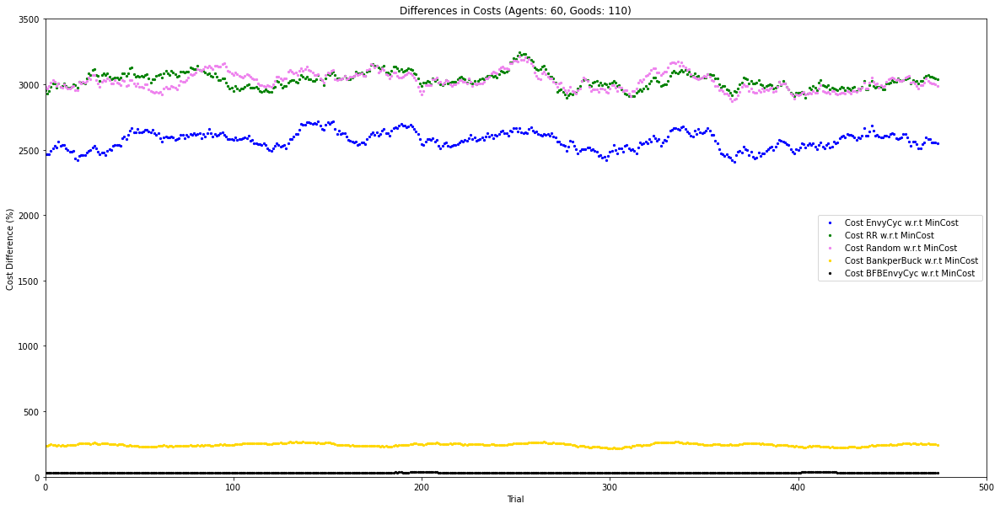

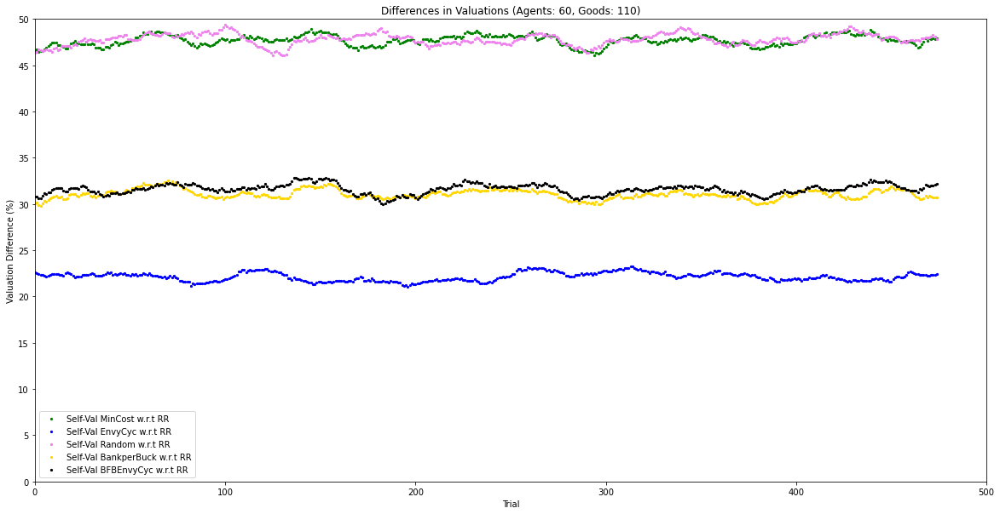

Agents :  60 	 Goods : 120
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2731.46  %
Cost difference of Round Robin w.r.t Min cost : 
 3523.6  %
Cost difference of Random w.r.t Min cost : 
 3397.75  %
Cost difference of Bank per Buck w.r.t Min cost : 
 273.05  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 34.84  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 48.17  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 25.62  %
Self Valuation difference of Random w.r.t Round Robin : 
 52.26  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 30.51  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 34.34  %
-------------------------------------------------------
********************  TRIAL  200   ********************
---------------------------------------------

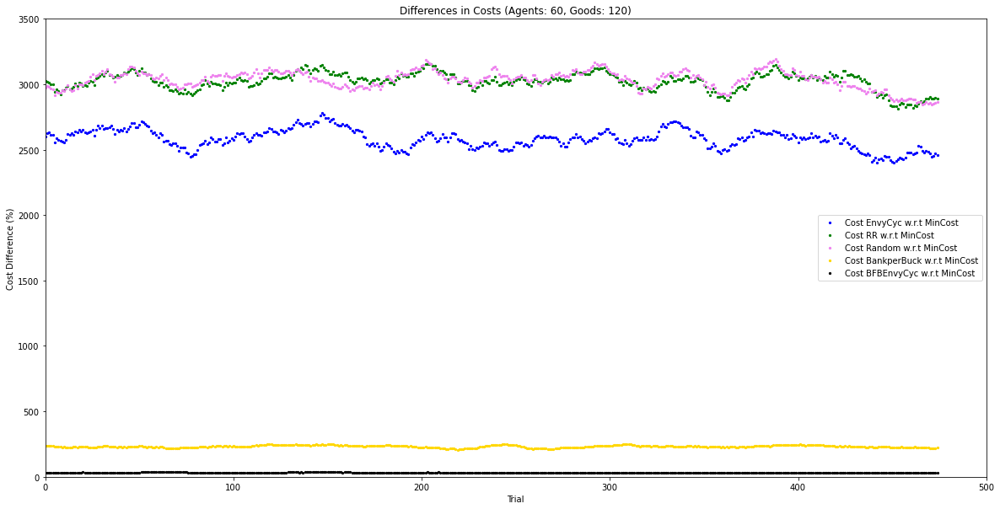

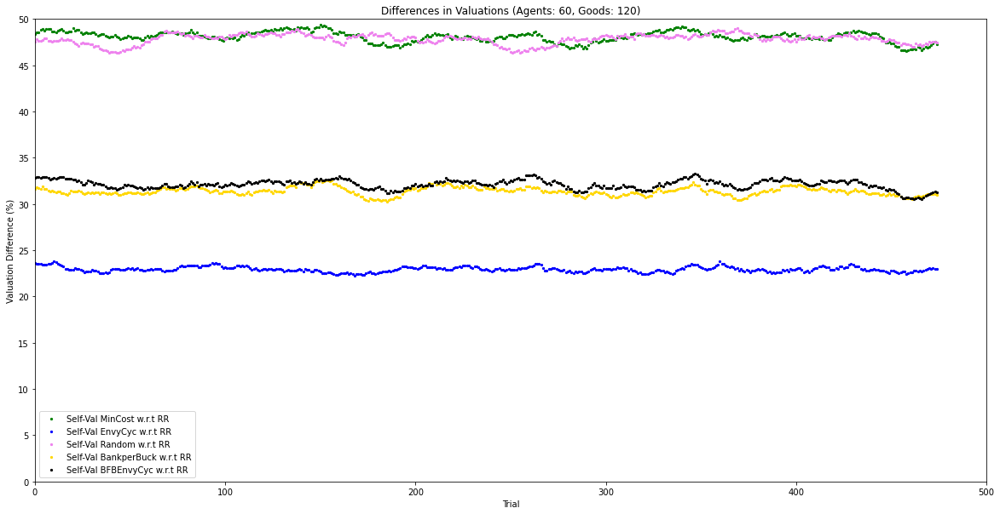

Agents :  60 	 Goods : 130
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 1897.84  %
Cost difference of Round Robin w.r.t Min cost : 
 2747.19  %
Cost difference of Random w.r.t Min cost : 
 2672.29  %
Cost difference of Bank per Buck w.r.t Min cost : 
 167.11  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 24.68  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 44.51  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 19.82  %
Self Valuation difference of Random w.r.t Round Robin : 
 45.12  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 29.03  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.65  %
-------------------------------------------------------
********************  TRIAL  200   ********************
--------------------------------------------

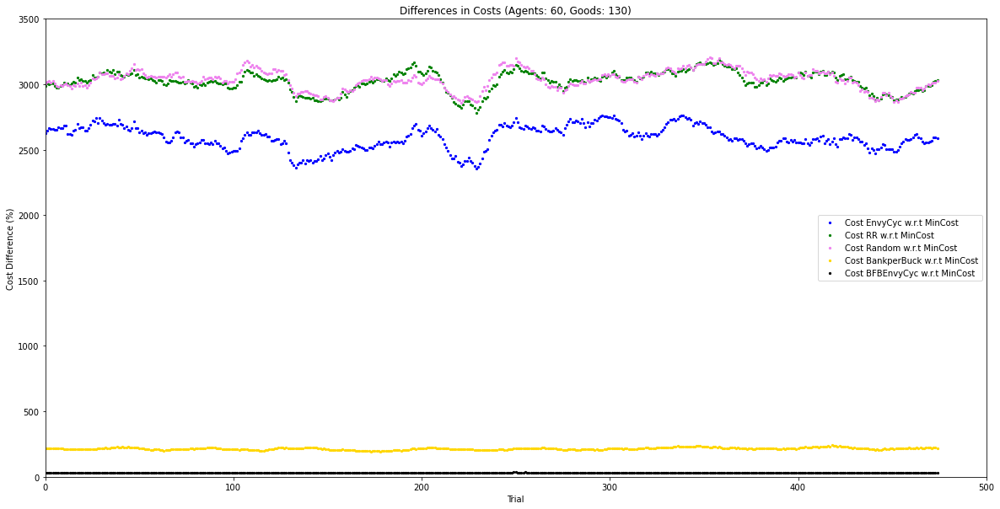

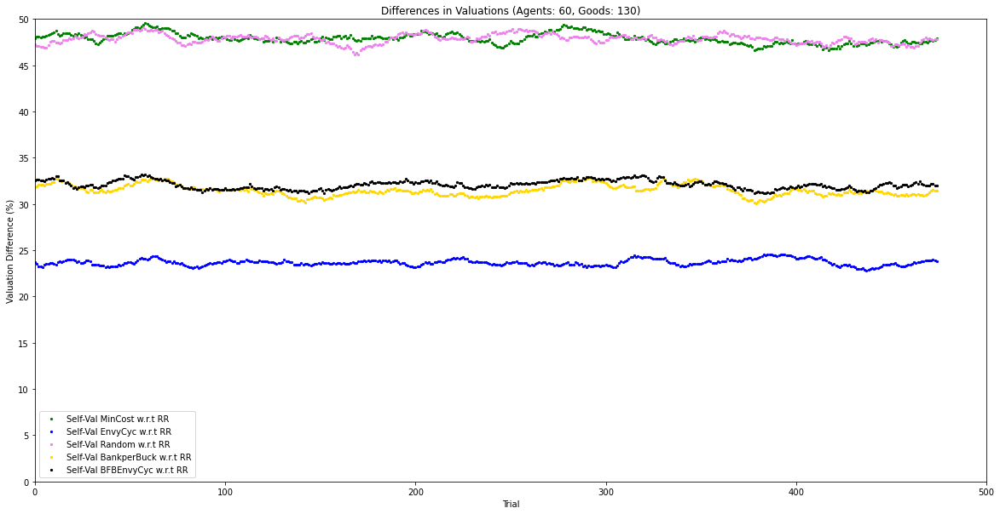

Agents :  60 	 Goods : 140
********************  TRIAL  100   ********************
-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2188.0  %
Cost difference of Round Robin w.r.t Min cost : 
 2651.2  %
Cost difference of Random w.r.t Min cost : 
 2602.0  %
Cost difference of Bank per Buck w.r.t Min cost : 
 180.41  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 22.01  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 46.01  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 23.39  %
Self Valuation difference of Random w.r.t Round Robin : 
 52.78  %
Self Valuation difference of BanK per Buck w.r.t Round Robin : 
 31.94  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 28.4  %
-------------------------------------------------------
********************  TRIAL  200   ********************
------------------------------------------------

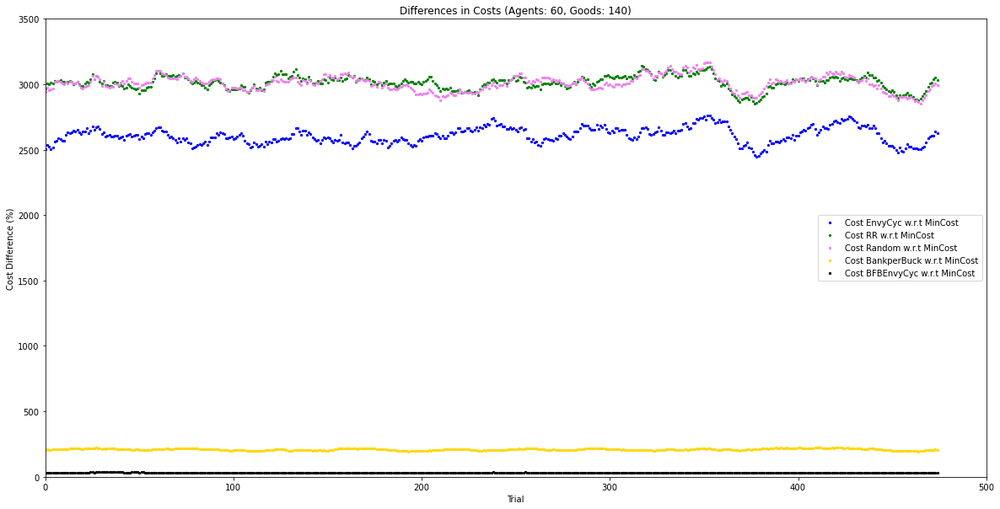

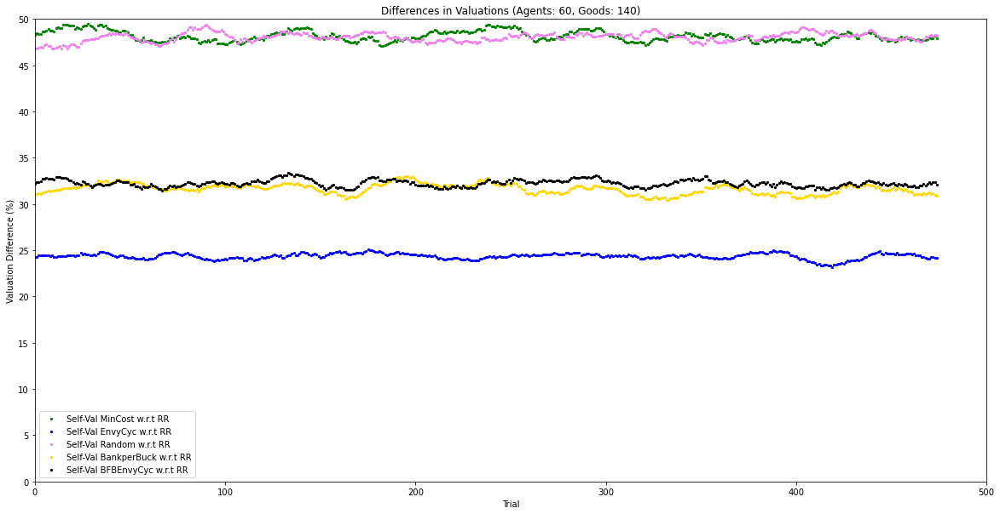

In [16]:
AgentCounter = 0
GoodsCounter = 0
for num_agents in AgentCount:
    GoodsCounter = 0
    for num_goods in GoodsCount:
        instance = 0
        env_cost_diff_list = []
        rrt_cost_diff_list = []
        rand_cost_diff_list = []
        bpb_cost_diff_list = []
        bfb_env_cost_diff_list = []
        mincost_val_diff_list = []
        env_val_diff_list = []
        rand_val_diff_list = []
        bpb_val_diff_list = []
        bfb_env_val_diff_list = []
        trial_numbers = list(range(1, trials + 1))
        print ("Agents : ", num_agents,"\t Goods :", num_goods)

        while instance<trials:
            instance +=1
            if instance%chunk == 0:
                print("*"*20, " TRIAL ",instance," ","*"*20)
            C = np.zeros((num_agents,num_goods))
            V = np.zeros((num_agents,num_goods))
            for i in range(num_agents):
                for j in range(num_goods):
                    C[i][j] = np.round(np.random.uniform(0,1),2)
                    V[i][j] = np.round(np.random.uniform(0,1),2)
                    
            min_X, env_X, min_cost, mincost_val, env_cost, env_val = min_cost_envy_cycle (C,V,num_agents, num_goods)
            rr_X, rrt_cost, rrt_val = round_robin (C,V,num_agents, num_goods)
            rand_X, rand_cost, rand_val = random_assign (C,V,num_agents, num_goods)
            bpb_X, bpb_cost, bpb_val = bank_per_buck (C,V,num_agents, num_goods)
            bfb_min_X, bfb_env_X, bfb_min_cost, bfb_mincost_val, bfb_env_cost, bfb_env_val = bfb_min_cost_envy_cycle (C,V,num_agents, num_goods)

            env_cost_diff = np.round((np.sum(env_cost)-np.sum(min_cost))/np.sum(min_cost) * 100,2)
            rrt_cost_diff = np.round((np.sum(rrt_cost)-np.sum(min_cost))/np.sum(min_cost) * 100,2)
            rand_cost_diff = np.round((np.sum(rand_cost)-np.sum(min_cost))/np.sum(min_cost) * 100,2)
            bpb_cost_diff = np.round((np.sum(bpb_cost)-np.sum(min_cost))/np.sum(min_cost) * 100,2)
            bfb_env_cost_diff = np.round((np.sum(bfb_env_cost)-np.sum(min_cost))/np.sum(min_cost) * 100,2)

            mincost_val_diff = np.round((np.trace(rrt_val) - np.trace(mincost_val))/np.trace(rrt_val)*100,2)
            env_val_diff = np.round((np.trace(rrt_val) - np.trace(env_val))/np.trace(rrt_val)*100,2)
            rand_val_diff = np.round((np.trace(rrt_val) - np.trace(rand_val))/np.trace(rrt_val)*100,2)
            bpb_val_diff = np.round((np.trace(rrt_val) - np.trace(bpb_val))/np.trace(rrt_val)*100,2)
            bfb_env_val_diff = np.round((np.trace(rrt_val) - np.trace(bfb_env_val))/np.trace(rrt_val)*100,2)

            env_cost_diff_list.append(env_cost_diff)
            rrt_cost_diff_list.append(rrt_cost_diff)
            rand_cost_diff_list.append(rand_cost_diff)
            bpb_cost_diff_list.append(bpb_cost_diff)
            bfb_env_cost_diff_list.append(bfb_env_cost_diff)
            mincost_val_diff_list.append(mincost_val_diff)
            env_val_diff_list.append(env_val_diff)
            rand_val_diff_list.append(rand_val_diff)
            bpb_val_diff_list.append(bpb_val_diff)
            bfb_env_val_diff_list.append(bfb_env_val_diff)
            
            if instance % chunk == 0:
                print("-"*55)

                print("Cost difference of Envy cycle elimination w.r.t Min cost : \n", env_cost_diff," %")
                print("Cost difference of Round Robin w.r.t Min cost : \n", rrt_cost_diff," %")
                print("Cost difference of Random w.r.t Min cost : \n", rand_cost_diff," %")
                print("Cost difference of Bank per Buck w.r.t Min cost : \n", bpb_cost_diff," %")
                print("Cost difference of BFB Envy cycle elimination w.r.t Min cost : \n", bfb_env_cost_diff," %")

                print("="*45)

                print("Self Valuation difference of Min cost w.r.t Round Robin : \n", mincost_val_diff," %")
                print("Self Valuation difference of Envy cycle elimination w.r.t Round Robin : \n", env_val_diff," %")
                print("Self Valuation difference of Random w.r.t Round Robin : \n", rand_val_diff," %")
                print("Self Valuation difference of BanK per Buck w.r.t Round Robin : \n", bpb_val_diff," %")
                print("Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : \n", bfb_env_val_diff," %")

                print("-"*55)
        
        env_cost_diff_Mean[AgentCounter][GoodsCounter] = np.round(np.mean(env_cost_diff_list),2)
        rrt_cost_diff_Mean[AgentCounter][GoodsCounter] = np.round(np.mean(rrt_cost_diff_list),2)
        rand_cost_diff_Mean[AgentCounter][GoodsCounter] = np.round(np.mean(rand_cost_diff_list),2)
        bpb_cost_diff_Mean[AgentCounter][GoodsCounter] = np.round(np.mean(bpb_cost_diff_list),2)
        bfb_env_cost_diff_Mean[AgentCounter][GoodsCounter] = np.round(np.mean(bfb_env_cost_diff_list),2)

        mincost_val_diff_Mean[AgentCounter][GoodsCounter] = np.round(np.mean(mincost_val_diff_list),2)
        env_val_diff_Mean[AgentCounter][GoodsCounter] = np.round(np.mean(env_val_diff_list),2)
        rand_val_diff_Mean[AgentCounter][GoodsCounter] = np.round(np.mean(rand_val_diff_list),2)
        bpb_val_diff_Mean[AgentCounter][GoodsCounter] = np.round(np.mean(bpb_val_diff_list),2)
        bfb_env_val_diff_Mean[AgentCounter][GoodsCounter] = np.round(np.mean(bfb_env_val_diff_list),2)
        
        env_cost_diff_Variance[AgentCounter][GoodsCounter] = np.round(np.var(env_cost_diff_list),2)
        rrt_cost_diff_Variance[AgentCounter][GoodsCounter] = np.round(np.var(rrt_cost_diff_list),2)
        rand_cost_diff_Variance[AgentCounter][GoodsCounter] = np.round(np.var(rand_cost_diff_list),2)
        bpb_cost_diff_Variance[AgentCounter][GoodsCounter] = np.round(np.var(bpb_cost_diff_list),2)
        bfb_env_cost_diff_Variance[AgentCounter][GoodsCounter] = np.round(np.var(bfb_env_cost_diff_list),2)

        mincost_val_diff_Variance[AgentCounter][GoodsCounter] = np.round(np.var(mincost_val_diff_list),2)
        env_val_diff_Variance[AgentCounter][GoodsCounter] = np.round(np.var(env_val_diff_list),2)
        rand_val_diff_Variance[AgentCounter][GoodsCounter] = np.round(np.var(rand_val_diff_list),2)
        bpb_val_diff_Variance[AgentCounter][GoodsCounter] = np.round(np.var(bpb_val_diff_list),2)
        bfb_env_val_diff_Variance[AgentCounter][GoodsCounter] = np.round(np.var(bfb_env_val_diff_list),2)
        
        if num_agents == 50:
            print("env_cost_diff_avg : ",env_cost_diff_Mean[AgentCounter][GoodsCounter]," %")
            print("rand_cost_diff_avg : ",rand_cost_diff_Mean[AgentCounter][GoodsCounter]," %")
            print("rrt_cost_diff_avg : ",rrt_cost_diff_Mean[AgentCounter][GoodsCounter]," %")
            print("bpb_cost_diff_avg : ",bpb_cost_diff_Mean[AgentCounter][GoodsCounter]," %")
            print("bfb_env_cost_diff_avg : ",bfb_env_cost_diff_Mean[AgentCounter][GoodsCounter]," %")

            print("\n")

            print("env_val_diff_avg : ",env_val_diff_Mean[AgentCounter][GoodsCounter]," %")
            print("rand_val_diff_avg : ",rand_val_diff_Mean[AgentCounter][GoodsCounter]," %")
            print("mincost_val_diff_avg : ",mincost_val_diff_Mean[AgentCounter][GoodsCounter]," %")
            print("bpb_val_diff_avg : ",bpb_val_diff_Mean[AgentCounter][GoodsCounter]," %")
            print("bfb_env_val_diff_avg : ",bfb_env_val_diff_Mean[AgentCounter][GoodsCounter]," %")
        
        # Plotting costs
        plt.figure(figsize=(l, b))

        # Plot env_cost_diff
        plt.scatter(range(len(moving_average(env_cost_diff_list, div))), moving_average(env_cost_diff_list, div), label='Cost EnvyCyc w.r.t MinCost', color='blue', s=5)

        # Plot rrt_cost_diff
        plt.scatter(range(len(moving_average(rrt_cost_diff_list, div))), moving_average(rrt_cost_diff_list, div), label='Cost RR w.r.t MinCost', color='green', s=5)

        # Plot rand_cost_diff
        plt.scatter(range(len(moving_average(rand_cost_diff_list, div))), moving_average(rand_cost_diff_list, div), label='Cost Random w.r.t MinCost', color='violet', s=5)

        # Plot bpb_cost_diff
        plt.scatter(range(len(moving_average(bpb_cost_diff_list, div))), moving_average(bpb_cost_diff_list, div), label='Cost BankperBuck w.r.t MinCost', color='gold', s=5)
        
        # Plot bfb_env_cost_diff
        plt.scatter(range(len(moving_average(bfb_env_cost_diff_list, div))), moving_average(bfb_env_cost_diff_list, div), label='Cost BFBEnvyCyc w.r.t MinCost', color='black', s=5)

        
        # Set axes limits and ticks
        plt.xlim(0, trials)
        plt.ylim(0, 3500)
        plt.xticks(np.arange(0, trials+1, chunk))
        plt.yticks(np.arange(0, 3501, 500))

        # Add labels and legend
        plt.xlabel('Trial')
        plt.ylabel('Cost Difference (%)')
        plt.title('Differences in Costs (Agents: {}, Goods: {})'.format(num_agents, num_goods))
        plt.legend()

        # Save the plot
        plt.savefig(os.path.join(plot_dir, 'Cost_{}_{}.png'.format(num_agents, num_goods)))

        # Show the plot
        plt.show()

        # Plotting valuations
        plt.figure(figsize=(l, b))

        # Plot mincost_val_diff
        plt.scatter(range(len(moving_average(mincost_val_diff_list, div))), moving_average(mincost_val_diff_list, div), label='Self-Val MinCost w.r.t RR', color='green', s=5)

        # Plot env_val_diff
        plt.scatter(range(len(moving_average(env_val_diff_list, div))), moving_average(env_val_diff_list, div), label='Self-Val EnvyCyc w.r.t RR', color='blue', s=5)

        # Plot rand_val_diff
        plt.scatter(range(len(moving_average(rand_val_diff_list, div))), moving_average(rand_val_diff_list, div), label='Self-Val Random w.r.t RR', color='violet', s=5)

        # Plot bpb_val_diff
        plt.scatter(range(len(moving_average(bpb_val_diff_list, div))), moving_average(bpb_val_diff_list, div), label='Self-Val BankperBuck w.r.t RR', color='gold', s=5)

        # Plot env_val_diff
        plt.scatter(range(len(moving_average(bfb_env_val_diff_list, div))), moving_average(bfb_env_val_diff_list, div), label='Self-Val BFBEnvyCyc w.r.t RR', color='black', s=5)
        
        # Set axes limits and ticks
        plt.xlim(0, trials)
        plt.ylim(0, 50)
        plt.xticks(np.arange(0, trials+1, chunk))
        plt.yticks(np.arange(0, 51, 5))

        # Add labels and legend
        plt.xlabel('Trial')
        plt.ylabel('Valuation Difference (%)')
        plt.title('Differences in Valuations (Agents: {}, Goods: {})'.format(num_agents, num_goods))
        plt.legend()

        # Save the plot
        plt.savefig(os.path.join(plot_dir, 'Value_{}_{}.png'.format(num_agents, num_goods)))

        # Show the plot
        plt.show()

        GoodsCounter += 1
    AgentCounter += 1

In [17]:
print("env_cost_diff_Mean : \n",env_cost_diff_Mean,"\n")
print("rand_cost_diff_Mean : \n",rand_cost_diff_Mean,"\n")
print("rrt_cost_diff_Mean : \n",rrt_cost_diff_Mean,"\n")
print("bpb_cost_diff_Mean : \n",bpb_cost_diff_Mean,"\n")
print("bfb_env_cost_diff_Mean : \n",bfb_env_cost_diff_Mean,"\n")

print("*"*50)

print("env_val_diff_Mean : \n",env_val_diff_Mean,"\n")
print("rand_val_diff_Mean : \n",rand_val_diff_Mean,"\n")
print("mincost_val_diff_Mean : \n",mincost_val_diff_Mean,"\n")
print("bpb_val_diff_Mean : \n",bpb_val_diff_Mean,"\n")
print("bfb_env_val_diff_Mean : \n",bfb_env_val_diff_Mean,"\n")



env_cost_diff_Mean : 
 [[  87.54   87.7    85.95   84.9    81.75   86.66   88.17   82.55   81.1
    84.92]
 [ 255.62  260.64  271.39  270.19  267.84  261.83  258.48  258.26  269.01
   263.89]
 [ 471.62  469.67  465.91  471.62  472.47  473.57  483.17  470.49  481.07
   477.34]
 [ 688.84  697.18  698.43  707.7   681.12  698.74  695.49  685.8   691.14
   686.28]
 [ 909.77  914.3   920.26  929.92  917.77  923.25  929.87  916.36  907.11
   918.27]
 [1125.69 1129.08 1147.83 1137.24 1147.61 1122.94 1144.95 1147.85 1145.65
  1161.35]
 [1337.24 1383.28 1355.38 1374.03 1376.49 1385.14 1382.17 1357.   1378.89
  1403.98]
 [1607.43 1611.94 1599.49 1607.87 1619.95 1622.24 1631.02 1610.83 1619.13
  1619.26]
 [1832.86 1824.67 1850.68 1851.47 1825.12 1857.18 1884.6  1865.33 1850.46
  1875.54]
 [2078.58 2061.06 2087.41 2070.74 2080.1  2096.04 2081.99 2096.71 2126.97
  2101.22]
 [2336.13 2324.49 2348.46 2335.01 2342.55 2344.14 2352.31 2346.37 2337.93
  2364.68]
 [2595.81 2558.13 2553.57 2585.97 2610.59 2

In [18]:
env_cost_diff_avg = np.round(np.mean(env_cost_diff_list),2)
rrt_cost_diff_avg = np.round(np.mean(rrt_cost_diff_list),2)
rand_cost_diff_avg = np.round(np.mean(rand_cost_diff_list),2)
bpb_cost_diff_avg = np.round(np.mean(bpb_cost_diff_list),2)
bfb_env_cost_diff_avg = np.round(np.mean(bfb_env_cost_diff_list),2)

mincost_val_diff_avg = np.round(np.mean(mincost_val_diff_list),2)
env_val_diff_avg = np.round(np.mean(env_val_diff_list),2)
rand_val_diff_avg = np.round(np.mean(rand_val_diff_list),2)
bpb_val_diff_avg = np.round(np.mean(bpb_val_diff_list),2)
bfb_env_val_diff_avg = np.round(np.mean(bfb_env_val_diff_list),2)

print("env_cost_diff_avg : ",env_cost_diff_avg," %")
print("rand_cost_diff_avg : ",rand_cost_diff_avg," %")
print("rrt_cost_diff_avg : ",rrt_cost_diff_avg," %")
print("bpb_cost_diff_avg : ",bpb_cost_diff_avg," %")
print("bfb_env_cost_diff_avg : ",bfb_env_cost_diff_avg," %")

print("\n")

print("env_val_diff_avg : ",env_val_diff_avg," %")
print("rand_val_diff_avg : ",rand_val_diff_avg," %")
print("mincost_val_diff_avg : ",mincost_val_diff_avg," %")
print("mincost_val_diff_avg : ",bpb_val_diff_avg," %")
print("bfb_env_val_diff_avg : ",bfb_env_val_diff_avg," %")

env_cost_diff_avg :  2608.11  %
rand_cost_diff_avg :  3007.74  %
rrt_cost_diff_avg :  3012.92  %
bpb_cost_diff_avg :  209.47  %
bfb_env_cost_diff_avg :  31.58  %


env_val_diff_avg :  24.36  %
rand_val_diff_avg :  48.02  %
mincost_val_diff_avg :  48.15  %
mincost_val_diff_avg :  31.61  %
bfb_env_val_diff_avg :  32.24  %


In [19]:
print("-"*55)

print("Cost difference of Envy cycle elimination w.r.t Min cost : \n", env_cost_diff," %")
print("Cost difference of Round Robin w.r.t Min cost : \n", rrt_cost_diff," %")
print("Cost difference of Random w.r.t Min cost : \n", rand_cost_diff," %")
print("Cost difference of Bank per Buck w.r.t Min cost : \n", bpb_cost_diff," %")
print("Cost difference of BFB Envy cycle elimination w.r.t Min cost : \n", bfb_env_cost_diff," %")

print("="*45)

print("Self Valuation difference of Min cost w.r.t Round Robin : \n", mincost_val_diff," %")
print("Self Valuation difference of Envy cycle elimination w.r.t Round Robin : \n", env_val_diff," %")
print("Self Valuation difference of Random w.r.t Round Robin : \n", rand_val_diff," %")
print("Self Valuation difference of Bank per Buck w.r.t Round Robin : \n", bpb_val_diff," %")
print("Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : \n", bfb_env_val_diff," %")

print("-"*55)




print("C : \n", C,"\n")
print("V : \n", V,"\n")
print("Min cost assignment : \n", min_X,"\n")
print("Post Envy Cycle elimination assignment :\n",env_X,"\n")
print("Random assignment :\n",rand_X,"\n")
print("Round robin assignment :\n",rr_X,"\n")
print("Bank per Buck assignment :\n",bpb_X,"\n")
print("BFB Post Envy Cycle elimination assignment :\n",bfb_env_X,"\n")

print("-"*55)
print("Most optimal min cost :\n",min_cost,"\n")
print("Post Envy Cycle elimination cost :\n",env_cost,"\n")
print("Round Robin cost :\n",rrt_cost,"\n")
print("Random assignment cost :\n",rand_cost,"\n")
print("Bank per Buck cost :\n",bpb_cost,"\n")
print("BFB Post Envy Cycle elimination cost :\n",bfb_env_cost,"\n")
print("-"*55)

print("Sum of Most optimal min cost :\n",np.round(np.sum(min_cost),2),"\n")
print("Sum of Post Envy Cycle elimination cost :\n",np.round(np.sum(env_cost),2),"\n")
print("Sum of Round Robin cost :\n",np.round(np.sum(rrt_cost),2),"\n")
print("Sum of Random assignment cost :\n",np.round(np.sum(rand_cost),2),"\n")
print("Sum of Bank per Buck cost :\n",np.round(np.sum(bpb_cost),2),"\n")
print("Sum of Post BFB Envy Cycle elimination cost :\n",np.round(np.sum(bfb_env_cost),2),"\n")
print("-"*55)

print("Total self valuation corresponding most optimal min cost :\n",np.round(np.trace(mincost_val),2),"\n")
print("Total self valuation Post Envy Cycle elimination :\n",np.round(np.trace(env_val),2),"\n")
print("Total self valuation after Round Robin :\n",np.round(np.trace(rrt_val),2),"\n")
print("Total self valuation after Random assignment :\n",np.round(np.trace(rand_val),2),"\n")
print("Total self valuation after Bank per buck :\n",np.round(np.trace(bpb_val),2),"\n")
print("Total self valuation BFB Post Envy Cycle elimination :\n",np.round(np.trace(bfb_env_val),2),"\n")

-------------------------------------------------------
Cost difference of Envy cycle elimination w.r.t Min cost : 
 2177.08  %
Cost difference of Round Robin w.r.t Min cost : 
 2626.09  %
Cost difference of Random w.r.t Min cost : 
 2798.81  %
Cost difference of Bank per Buck w.r.t Min cost : 
 165.62  %
Cost difference of BFB Envy cycle elimination w.r.t Min cost : 
 16.61  %
Self Valuation difference of Min cost w.r.t Round Robin : 
 42.88  %
Self Valuation difference of Envy cycle elimination w.r.t Round Robin : 
 22.2  %
Self Valuation difference of Random w.r.t Round Robin : 
 48.6  %
Self Valuation difference of Bank per Buck w.r.t Round Robin : 
 31.44  %
Self Valuation difference of BFB Envy cycle elimination w.r.t Round Robin : 
 27.99  %
-------------------------------------------------------
C : 
 [[0.96 0.01 0.86 ... 0.78 0.9  0.33]
 [0.28 0.09 0.4  ... 0.97 0.64 0.81]
 [0.1  0.5  0.72 ... 0.41 0.51 0.07]
 ...
 [0.77 0.92 0.35 ... 0.53 0.77 0.27]
 [0.99 0.47 0.02 ... 0.32 

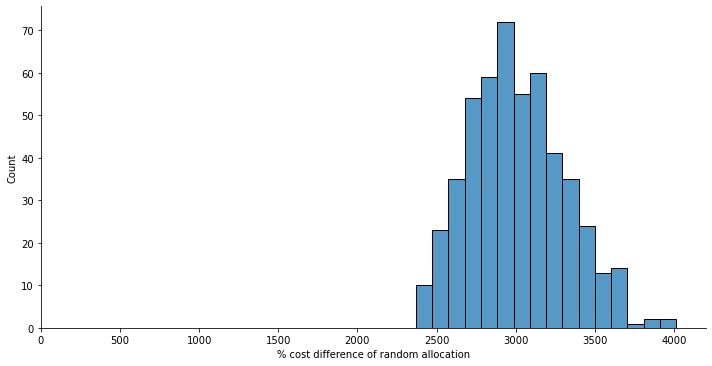

In [42]:
ax=sns.displot(rand_cost_diff_list, height=5, aspect=2)
ax.set(xlabel="% cost difference of random allocation")
plt.xlim(0, 4200)
plt.show()

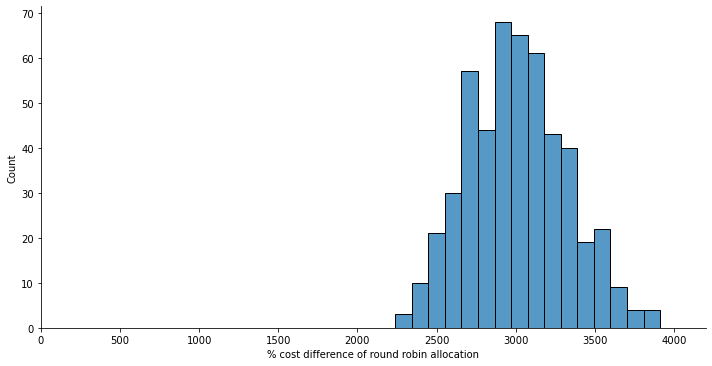

In [43]:
ax = sns.displot(rrt_cost_diff_list, height=5, aspect=2)
ax.set(xlabel="% cost difference of round robin allocation")
plt.xlim(0, 4200)
plt.show()

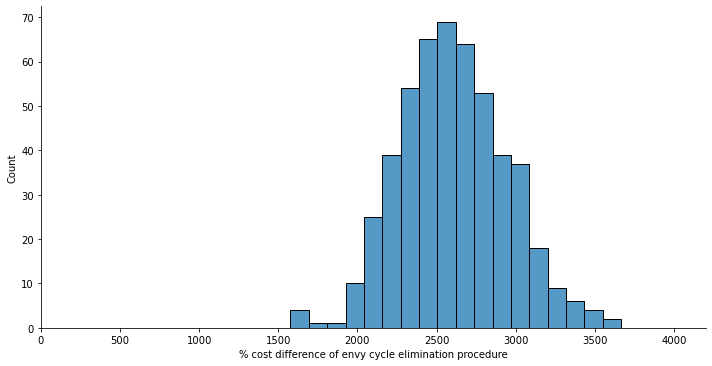

In [44]:
ax = sns.displot(env_cost_diff_list, height=5, aspect=2)
ax.set(xlabel="% cost difference of envy cycle elimination procedure")
plt.xlim(0, 4200)
plt.show()

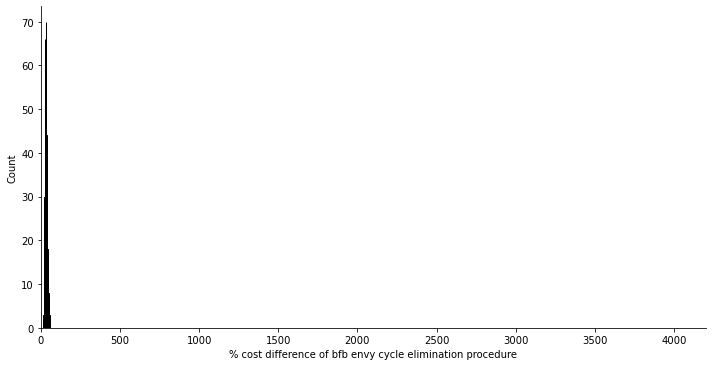

In [45]:
ax = sns.displot(bfb_env_cost_diff_list, height=5, aspect=2)
ax.set(xlabel="% cost difference of bfb envy cycle elimination procedure")
plt.xlim(0, 4200)
plt.show()

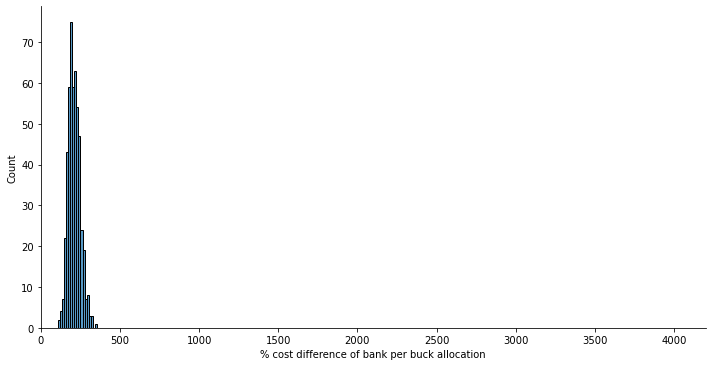

In [46]:
ax=sns.displot(bpb_cost_diff_list, height=5, aspect=2)
ax.set(xlabel="% cost difference of bank per buck allocation")
plt.xlim(0, 4200)
plt.show()

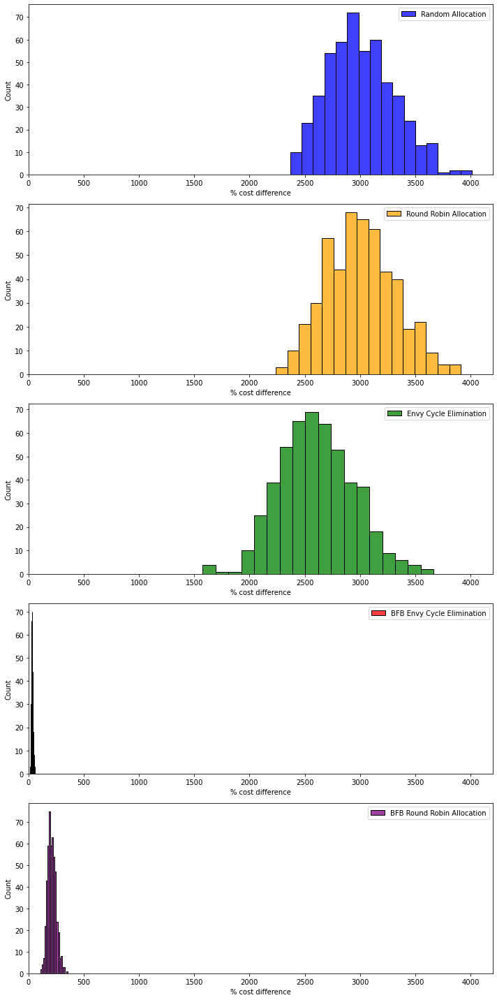

In [61]:
fig, axs = plt.subplots(5, 1, figsize=(10, 20))  # 5 rows for 5 plots

# Plotting each distribution with different colors and legends
sns.histplot(rand_cost_diff_list, ax=axs[0], color='blue', label='Random Allocation')
sns.histplot(rrt_cost_diff_list, ax=axs[1], color='orange', label='Round Robin Allocation')
sns.histplot(env_cost_diff_list, ax=axs[2], color='green', label='Envy Cycle Elimination')
sns.histplot(bfb_env_cost_diff_list, ax=axs[3], color='red', label='BFB Envy Cycle Elimination')
sns.histplot(bpb_cost_diff_list, ax=axs[4], color='purple', label='BFB Round Robin Allocation')

# Setting x-axis label and limit for each subplot
for ax in axs:
    ax.set_xlabel("% cost difference")
    ax.set_xlim(0, 4200)

# Adding legends
for ax in axs:
    ax.legend()

plt.tight_layout()  # Adjust subplot parameters to give specified padding
plt.show()

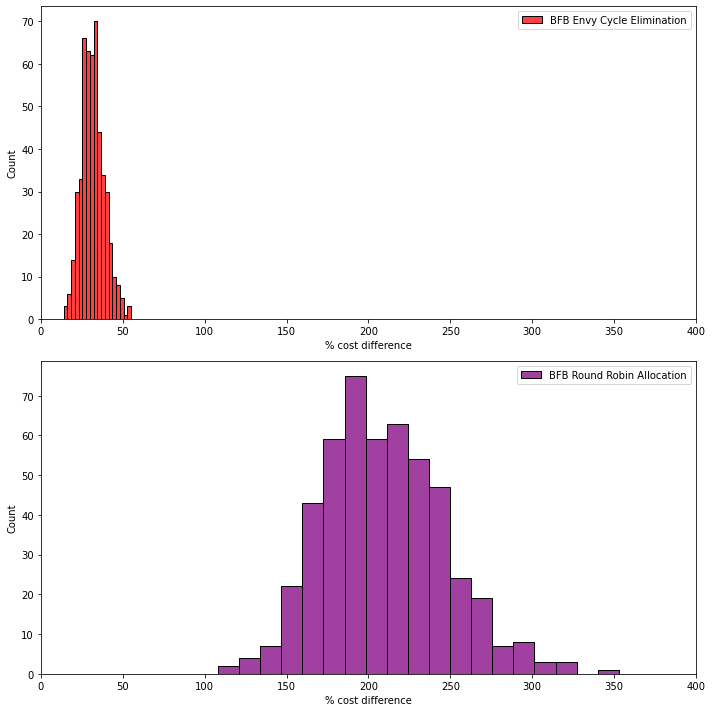

In [63]:
fig, axs = plt.subplots(2, 1, figsize=(10, 10))  # 5 rows for 5 plots

# Plotting each distribution with different colors and legends
sns.histplot(bfb_env_cost_diff_list, ax=axs[0], color='red', label='BFB Envy Cycle Elimination')
sns.histplot(bpb_cost_diff_list, ax=axs[1], color='purple', label='BFB Round Robin Allocation')

# Setting x-axis label and limit for each subplot
for ax in axs:
    ax.set_xlabel("% cost difference")
    ax.set_xlim(0, 400)

# Adding legends
for ax in axs:
    ax.legend()

plt.tight_layout()  # Adjust subplot parameters to give specified padding
plt.show()

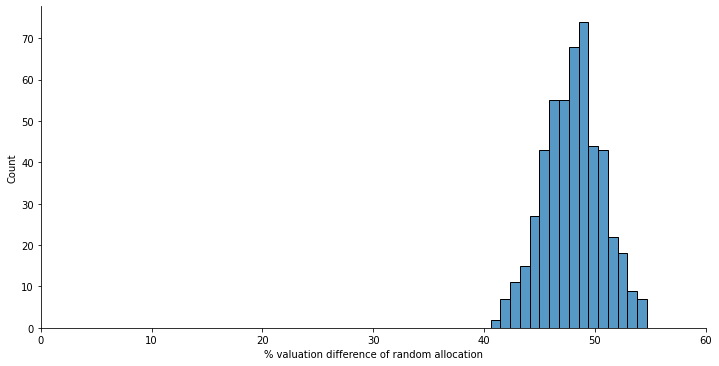

In [47]:
ax=sns.displot(rand_val_diff_list, height=5, aspect=2)
ax.set(xlabel="% valuation difference of random allocation")
plt.xlim(0, 60)
plt.show()

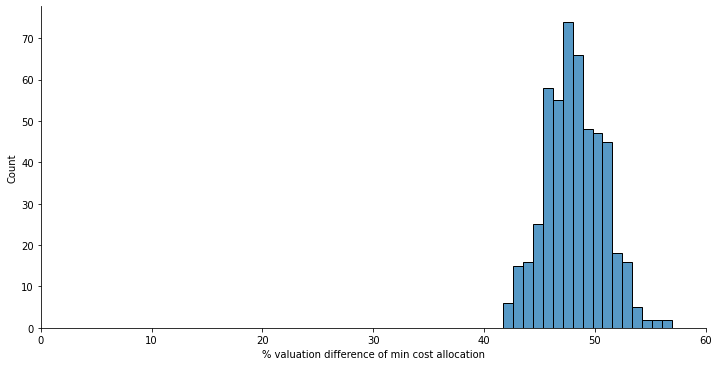

In [48]:
ax=sns.displot(mincost_val_diff_list, height=5, aspect=2)
ax.set(xlabel="% valuation difference of min cost allocation")
plt.xlim(0, 60)
plt.show()

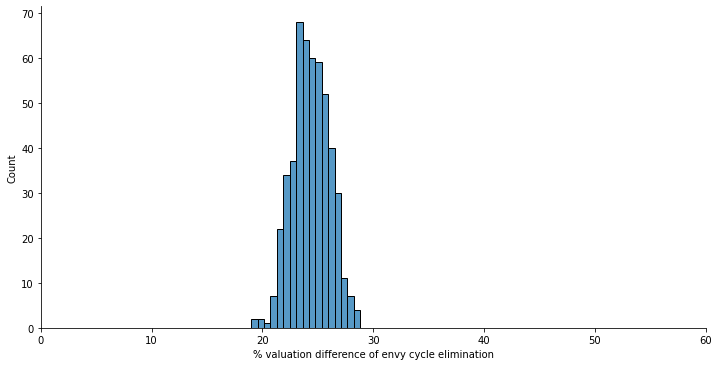

In [49]:
ax = sns.displot(env_val_diff_list, height=5, aspect=2)
ax.set(xlabel="% valuation difference of envy cycle elimination")
plt.xlim(0, 60)
plt.show()

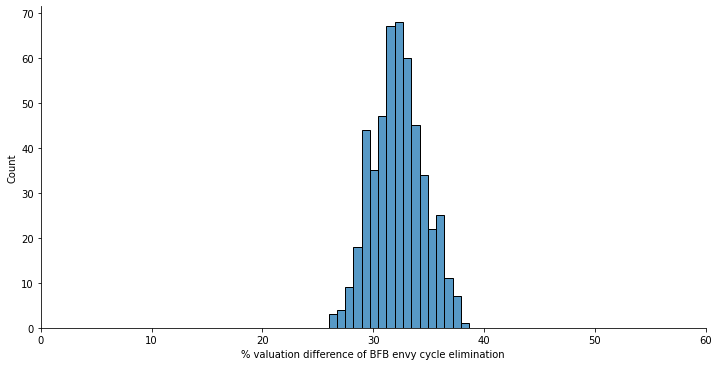

In [50]:
ax = sns.displot(bfb_env_val_diff_list, height=5, aspect=2)
ax.set(xlabel="% valuation difference of BFB envy cycle elimination")
plt.xlim(0, 60)
plt.show()

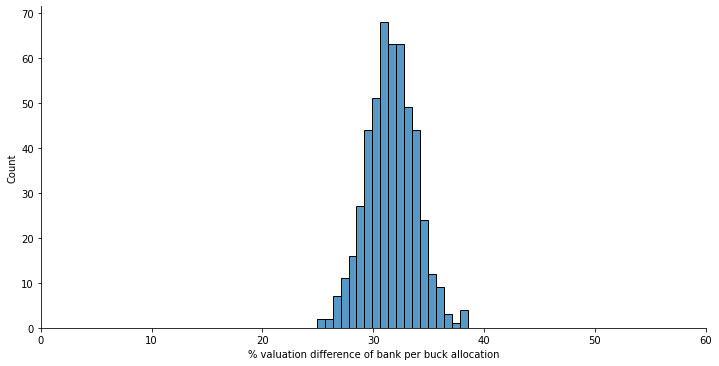

In [51]:
ax=sns.displot(bpb_val_diff_list, height=5, aspect=2)
ax.set(xlabel="% valuation difference of bank per buck allocation")
plt.xlim(0, 60)
plt.show()

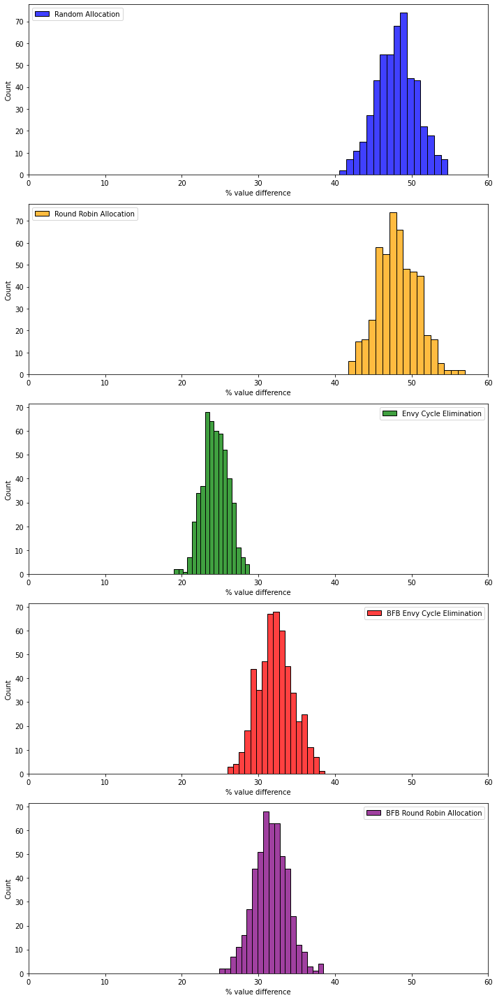

In [64]:
fig, axs = plt.subplots(5, 1, figsize=(10, 20))  # 5 rows for 5 plots

# Plotting each distribution with different colors and legends
sns.histplot(rand_val_diff_list, ax=axs[0], color='blue', label='Random Allocation')
sns.histplot(mincost_val_diff_list, ax=axs[1], color='orange', label='Round Robin Allocation')
sns.histplot(env_val_diff_list, ax=axs[2], color='green', label='Envy Cycle Elimination')
sns.histplot(bfb_env_val_diff_list, ax=axs[3], color='red', label='BFB Envy Cycle Elimination')
sns.histplot(bpb_val_diff_list, ax=axs[4], color='purple', label='BFB Round Robin Allocation')

# Setting x-axis label and limit for each subplot
for ax in axs:
    ax.set_xlabel("% value difference")
    ax.set_xlim(0, 60)

# Adding legends
for ax in axs:
    ax.legend()

plt.tight_layout()  # Adjust subplot parameters to give specified padding
plt.show()

In [30]:
import plotly.graph_objects as go
import plotly.offline
from plotly.subplots import make_subplots

In [31]:
# Create traces for each approach
traces = []

approaches = ['env', 'rand', 'rrt', 'bpb', 'bfb_env']
colors = ['blue', 'violet', 'green', 'gold', 'black']
cost_matrices = [env_cost_diff_Mean, rand_cost_diff_Mean, rrt_cost_diff_Mean, bpb_cost_diff_Mean, bfb_env_cost_diff_Mean]

for i, approach in enumerate(approaches):
    for j in range(len(AgentCount)):
        trace = go.Scatter3d(
            x=[AgentCount[j]] * len(GoodsCount),
            y=GoodsCount,
            z=cost_matrices[i][j],
            mode='lines',
            name=approach,
            line=dict(color=colors[i], width=4),
            showlegend=True if j == 0 else False
        )
        traces.append(trace)

# Create the layout
layout = go.Layout(
    title='Cost Matrix Visualization',
    scene=dict(
        xaxis=dict(title='Agents'),
        yaxis=dict(title='Goods'),
        zaxis=dict(title='Cost Diff wrt Min Cost')
    )
)

# Plot the figure
fig = go.Figure(data=traces, layout=layout)

# Save the HTML file
plotly.offline.plot(fig, filename='D:/UIUC/Courses/Spring 2024/IE598 Game Theory/Project/plots/viz/costviz.html', auto_open=False)

'D:/UIUC/Courses/Spring 2024/IE598 Game Theory/Project/plots/viz/costviz.html'

In [32]:
# Create traces for each approach
traces = []

approaches = ['env', 'rand', 'rrt', 'bpb', 'bfb_env']
colors = ['blue', 'violet', 'green', 'gold', 'black']
value_matrices = [env_val_diff_Mean, rand_val_diff_Mean, mincost_val_diff_Mean, bpb_val_diff_Mean, bfb_env_val_diff_Mean]

for i, approach in enumerate(approaches):
    for j in range(len(AgentCount)):
        trace = go.Scatter3d(
            x=[AgentCount[j]] * len(GoodsCount),
            y=GoodsCount,
            z=value_matrices[i][j],
            mode='lines',
            name=approach,
            line=dict(color=colors[i], width=4),
            showlegend=True if j == 0 else False
        )
        traces.append(trace)

# Create the layout
layout = go.Layout(
    title='Value Matrix Visualization',
    scene=dict(
        xaxis=dict(title='Agents'),
        yaxis=dict(title='Goods'),
        zaxis=dict(title='Value Diff w.r.t RR')
    )
)

# Plot the figure
fig = go.Figure(data=traces, layout=layout)

# Save the HTML file
plotly.offline.plot(fig, filename='D:/UIUC/Courses/Spring 2024/IE598 Game Theory/Project/plots/viz/valueviz.html', auto_open=False)

'D:/UIUC/Courses/Spring 2024/IE598 Game Theory/Project/plots/viz/valueviz.html'

In [33]:

# Create traces for each approach for cost matrix
cost_traces = []
approaches = ['env', 'rand', 'rrt', 'bpb', 'bfb_env']
colors = ['blue', 'violet', 'green', 'gold', 'black']
cost_matrices = [env_cost_diff_Mean, rand_cost_diff_Mean, rrt_cost_diff_Mean, bpb_cost_diff_Mean, bfb_env_cost_diff_Mean]

for i, approach in enumerate(approaches):
    for j in range(len(AgentCount)):
        trace = go.Scatter3d(
            x=[AgentCount[j]] * len(GoodsCount),
            y=GoodsCount,
            z=cost_matrices[i][j],
            mode='lines',
            name=approach,
            line=dict(color=colors[i], width=4),
            showlegend=True if j == 0 else False
        )
        cost_traces.append(trace)

# Create traces for each approach for value matrix
value_traces = []
value_matrices = [env_val_diff_Mean, rand_val_diff_Mean, mincost_val_diff_Mean, bpb_val_diff_Mean, bfb_env_val_diff_Mean]

for i, approach in enumerate(approaches):
    for j in range(len(AgentCount)):
        trace = go.Scatter3d(
            x=[AgentCount[j]] * len(GoodsCount),
            y=GoodsCount,
            z=value_matrices[i][j],
            mode='lines',
            name=approach,
            line=dict(color=colors[i], width=4),
            showlegend=True if j == 0 else False
        )
        value_traces.append(trace)

# Create the subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=("Cost Matrix Visualization", "Value Matrix Visualization"), specs=[[{'type': 'scene'}, {'type': 'scene'}]])

# Add cost traces to the first subplot
for trace in cost_traces:
    fig.add_trace(trace, row=1, col=1)

# Add value traces to the second subplot
for trace in value_traces:
    fig.add_trace(trace, row=1, col=2)

# Update the layout for both subplots
fig.update_layout(scene=dict(xaxis=dict(title='Agents'), yaxis=dict(title='Goods'), zaxis=dict(title='Cost Diff wrt Min Cost')),
                  scene2=dict(xaxis=dict(title='Agents'), yaxis=dict(title='Goods'), zaxis=dict(title='Value Diff w.r.t RR')),
                  title_text="Cost and Value Matrix Visualization")

# Save the HTML file
plotly.offline.plot(fig, filename='D:/UIUC/Courses/Spring 2024/IE598 Game Theory/Project/plots/viz/costvalviz.html', auto_open=False)


'D:/UIUC/Courses/Spring 2024/IE598 Game Theory/Project/plots/viz/costvalviz.html'